## Section 0 - Configuration: the single source of truth

Reviewer 1 (c2) and Reviewer 4 (c4) both flagged that input size, channel count and
preprocessing are stated inconsistently across the manuscript. The cause was that
those numbers lived in several places at once.

Everything the paper quotes about input, split, preprocessing or architecture is
defined **here and only here**. `CFG.describe_task()` and `CFG.describe_input()`
emit text to paste directly into the abstract, methodology and Table 1, so the
manuscript cannot drift from the code again.

In [1]:
import os, sys, json, math, time, random, platform, shutil, hashlib
import xml.etree.ElementTree as ET
from collections import Counter, defaultdict
from dataclasses import dataclass, field, asdict
from pathlib import Path

import numpy as np
import pandas as pd

# This notebook is the dedicated, self-contained MobileNetV2 copy: it must
# always read NEU-DET and write paper_results inside ITS OWN folder, never the
# sibling main-project copy, regardless of what directory the kernel happens
# to start in (Jupyter/VS Code do not always launch with cwd = the notebook's
# own folder). The hardcoded path is the source of truth; auto-detection by
# cwd is kept only as a fallback for if this folder is ever moved or renamed.
SELF_CONTAINED_ROOT = Path(
    "C:/Users/anmol/OneDrive/Desktop/MobileNetV2")

if (SELF_CONTAINED_ROOT / "NEU-DET").exists():
    PROJECT_ROOT = SELF_CONTAINED_ROOT
else:
    PROJECT_ROOT = Path.cwd()
    if not (PROJECT_ROOT / "NEU-DET").exists():          # tolerate running from a subdir
        for parent in PROJECT_ROOT.parents:
            if (parent / "NEU-DET").exists():
                PROJECT_ROOT = parent
                break


@dataclass(frozen=True)
class Config:
    """Every specification the manuscript reports. Change values here, nowhere else."""

    # -- paths -------------------------------------------------------------
    project_root: Path = PROJECT_ROOT
    images_dir: Path = PROJECT_ROOT / "NEU-DET" / "IMAGES"
    annotations_dir: Path = PROJECT_ROOT / "NEU-DET" / "ANNOTATIONS"
    results_dir: Path = PROJECT_ROOT / "paper_results"

    # -- dataset identity ----------------------------------------------------
    # Which dataset this Config points at ("neu_det" | "gc10_det"). Labeling
    # only -- every path/class field above and below is what actually drives
    # behavior. See make_gc10_config()/set_active_dataset() below Section 0.
    dataset: str = "neu_det"

    # -- task (R1.1, R2.4, R4.1) -------------------------------------------
    # Image-level classification trained with categorical cross-entropy. There is
    # NO detection head and NO bounding-box supervision. Regions come from class
    # activation maps post hoc, so this is CAM-BASED localization -- never "detection".
    task: str = "six-class steel surface defect classification with CAM-based localization"
    localization_kind: str = "cam_based"

    class_names: tuple = ("crazing", "inclusion", "patches",
                          "pitted_surface", "rolled-in_scale", "scratches")

    # -- input (R1.2, R4.4) ------------------------------------------------
    # Verified from all 1800 VOC XML <size> blocks: 200x200, depth=1.
    native_size: int = 200
    native_depth: int = 1
    img_size: int = 200          # native resolution retained; no resampling
    img_channels: int = 3        # grayscale replicated x3 for ImageNet stem

    # -- split (R3.4, R4.2) ------------------------------------------------
    split_train: float = 0.70
    split_val: float = 0.10
    split_test: float = 0.20
    split_seed: int = 42         # controls the SPLIT only, never weight init

    # -- training ----------------------------------------------------------
    batch_size: int = 32
    epochs_frozen: int = 30
    epochs_finetune: int = 30
    finetune_unfreeze_layers: int = 30
    lr_frozen: float = 1e-3
    lr_finetune: float = 1e-4
    early_stop_patience: int = 10
    # 5 seeds: enough for a usable sd on a 360-image test set. The split is
    # identical across seeds; only weight init, shuffling and dropout change.
    model_seeds: tuple = (42, 1337, 2026, 7, 99)   # multi-seed mean +- std

    # -- architecture (R2.1-R2.3, R4.5) ------------------------------------
    # The submitted code used 512 pyramid channels (50x50x512 at P2), which is not
    # consistent with a "lightweight" claim. 128 keeps the pyramid cheap.
    fpn_channels: int = 128
    seam_dilation_rates: tuple = (1, 3, 5)
    csaf_reduction: int = 8
    # Attention used at the FPN lateral-fusion point. One of:
    # "none" | "se" | "cbam" | "eca" | "amff". Section 4b compares them under
    # identical conditions so the AMFF novelty claim is tested, not asserted.
    fusion_attention: str = "amff"

    # -- CAM-based localization (R4.1) ------------------------------------------
    cam_threshold: float = 0.35        # fraction of per-image CAM maximum
    cam_morph_kernel: int = 5
    cam_min_region_area: int = 64      # native pixels
    cam_max_regions: int = 10          # NEU-DET has at most 9 boxes/image

    # -- evaluation --------------------------------------------------------
    ap_interp_points: int = 101        # COCO-style 101-point interpolation

    # -- YOLO baseline (R3.5) ----------------------------------------------
    # Ultralytics needs imgsz divisible by 32; 200 is not, so baselines run at 224.
    # This deviation is stated in the paper rather than hidden.
    yolo_imgsz: int = 224
    # Reviewer 3 asked for YOLO-11 "even YOLO-26". Verified against the installed
    # ultralytics 8.3.174: it ships model configs for v3/v5/v6/v8/v9/v10/11/12 and
    # RT-DETR. There is NO yolo26 config in this toolchain, so v12n is the newest
    # architecture that can be run here -- and it is newer than the v11 the
    # reviewer asked about. See the response drafted in Section 11.
    yolo_models: tuple = ("yolov8n.pt", "yolo11n.pt", "yolo12n.pt")
    yolo_epochs: int = 100

    # -- efficiency (R3.2, R4.7) -------------------------------------------
    latency_warmup: int = 20
    latency_runs: int = 200
    latency_batch: int = 1             # single-frame industrial scenario

    # -- derived -----------------------------------------------------------
    @property
    def num_classes(self) -> int:
        return len(self.class_names)

    @property
    def input_shape(self):
        return (self.img_size, self.img_size, self.img_channels)

    @property
    def class_to_index(self):
        return {c: i for i, c in enumerate(self.class_names)}

    @property
    def iou_sweep(self):
        return tuple(round(0.50 + 0.05 * i, 2) for i in range(10))   # .50:.05:.95

    @property
    def split_csv(self):
        return self.results_dir / "splits" / "split_v1.csv"

    # Backbone taps. The submitted code labelled block_1/3/6/output as C2-C5, but
    # those are strides 2/4/8/32 -- it skipped stride 16 entirely. Corrected here
    # and asserted in build_model().
    @property
    def backbone_taps(self):
        return {"C2": "block_3_expand_relu",     # stride  4
                "C3": "block_6_expand_relu",     # stride  8
                "C4": "block_13_expand_relu",    # stride 16
                "C5": "out_relu"}                # stride 32

    @property
    def expected_tap_sizes(self):
        # Computed from img_size rather than hardcoded, so this holds for any
        # square input, not just NEU-DET's 200x200 (verified: math.ceil(200/{4,8,
        # 16,32}) == {50,25,13,7}, the original hardcoded NEU-DET values, and
        # math.ceil(224/{4,8,16,32}) == {56,28,14,7} for GC10-DET's 224x224).
        strides = {"C2": 4, "C3": 8, "C4": 16, "C5": 32}
        return {lvl: math.ceil(self.img_size / s) for lvl, s in strides.items()}

    # -- manuscript text ---------------------------------------------------
    def describe_task(self) -> str:
        return (
            f"The task is {self.task}. The network is trained with a single "
            f"image-level categorical cross-entropy objective over "
            f"{self.num_classes} classes; it has no detection head and receives no "
            f"bounding-box supervision. Regions are obtained post hoc by "
            f"thresholding class activation maps and are therefore reported as "
            f"CAM-based localization, never as object detection.")

    def describe_input(self) -> str:
        return (
            f"All experiments use {self.img_size}x{self.img_size}x"
            f"{self.img_channels} inputs. Source images are natively "
            f"{self.native_size}x{self.native_size} single-channel 8-bit grayscale; "
            f"the native resolution is retained without resampling and the single "
            f"channel is replicated three times to match the ImageNet-pretrained "
            f"MobileNetV2 stem. Preprocessing: (1) read grayscale at native "
            f"resolution; (2) replicate to 3 channels; (3) scale to [0,1] then "
            f"MobileNetV2 preprocess_input to [-1,1]; (4) training split only: "
            f"random horizontal/vertical flip, +/-10% brightness, +/-10% contrast.")

    def subdir(self, name: str) -> Path:
        p = self.results_dir / name
        p.mkdir(parents=True, exist_ok=True)
        return p


CFG = Config()
for _sub in ("splits", "checkpoints", "figures", "tables", "yolo", "logs"):
    CFG.subdir(_sub)

CLASS_DISPLAY = {"crazing": "Crazing", "inclusion": "Inclusion", "patches": "Patches",
                 "pitted_surface": "Pitted surface", "rolled-in_scale": "Rolled-in scale",
                 "scratches": "Scratches"}
DEFECT_COLORS = {"crazing": "#FF6B6B", "inclusion": "#4ECDC4", "patches": "#45B7D1",
                 "pitted_surface": "#96CEB4", "rolled-in_scale": "#D4A017",
                 "scratches": "#DDA0DD"}

print("TASK  :", CFG.describe_task(), "\n")
print("INPUT :", CFG.describe_input(), "\n")
print("Project root :", CFG.project_root)
print("Results dir  :", CFG.results_dir)
assert CFG.images_dir.exists(), f"IMAGES not found at {CFG.images_dir}"
assert CFG.annotations_dir.exists(), f"ANNOTATIONS not found at {CFG.annotations_dir}"

# ============================================================================
# GC10-DET: a second dataset, run through the identical pipeline. CFG above
# (NEU-DET) is never mutated -- GC10_CFG is a second, independent frozen
# Config instance. Every hyperparameter not explicitly overridden below
# inherits the exact same dataclass default NEU-DET's CFG uses, so the two
# datasets are trained/evaluated under identical settings except where the
# data itself forces a difference (paths, class count/names, resolution).
# Requires GC10-DET_PREPARED/ to already exist -- see the data-prep cell
# right after this one (Section 0b), which builds it from raw GC10-DET/.
# ============================================================================

CLASS_DISPLAY_GC10 = {
    "punching_hole": "Punching hole", "welding_line": "Welding line",
    "crescent_gap": "Crescent gap", "water_spot": "Water spot",
    "oil_spot": "Oil spot", "silk_spot": "Silk spot", "inclusion": "Inclusion",
    "rolled_pit": "Rolled pit", "crease": "Crease", "waist_folding": "Waist folding",
}
DEFECT_COLORS_GC10 = {
    "punching_hole": "#E63946", "welding_line": "#F4A261", "crescent_gap": "#2A9D8F",
    "water_spot": "#457B9D", "oil_spot": "#8D5A97", "silk_spot": "#F72585",
    "inclusion": "#4CC9F0", "rolled_pit": "#90BE6D", "crease": "#F9C74F",
    "waist_folding": "#577590",
}


def make_gc10_config() -> Config:
    return Config(
        dataset="gc10_det",
        project_root=PROJECT_ROOT,
        images_dir=PROJECT_ROOT / "GC10-DET_PREPARED" / "IMAGES",
        annotations_dir=PROJECT_ROOT / "GC10-DET_PREPARED" / "ANNOTATIONS",
        results_dir=PROJECT_ROOT / "paper_results_gc10det",
        task="ten-class steel surface defect classification with CAM-based localization",
        class_names=("punching_hole", "welding_line", "crescent_gap", "water_spot",
                     "oil_spot", "silk_spot", "inclusion", "rolled_pit", "crease",
                     "waist_folding"),
        native_size=224, native_depth=1, img_size=224, img_channels=3,
    )


GC10_CFG = make_gc10_config()
for _sub in ("splits", "checkpoints", "figures", "tables", "yolo", "logs"):
    GC10_CFG.subdir(_sub)


def set_active_dataset(cfg: Config, display: dict, colors: dict) -> None:
    """Rebind the global CFG/CLASS_DISPLAY/DEFECT_COLORS used implicitly by
    every function in this notebook. Individual Config instances stay frozen/
    immutable -- only which instance the name CFG points to changes, same as
    SPLIT/TRAIN_DF/etc already get reassigned across the notebook's flow.
    Also keeps detector-geometry globals (Section 14+) in sync, once defined."""
    global CFG, CLASS_DISPLAY, DEFECT_COLORS
    CFG, CLASS_DISPLAY, DEFECT_COLORS = cfg, display, colors
    if "refresh_detector_geometry" in globals():
        refresh_detector_geometry(cfg.img_size)
    print(f"Active dataset: {cfg.dataset}  |  classes={cfg.num_classes}  "
          f"img_size={cfg.img_size}  results_dir={cfg.results_dir}")

TASK  : The task is six-class steel surface defect classification with CAM-based localization. The network is trained with a single image-level categorical cross-entropy objective over 6 classes; it has no detection head and receives no bounding-box supervision. Regions are obtained post hoc by thresholding class activation maps and are therefore reported as CAM-based localization, never as object detection. 

INPUT : All experiments use 200x200x3 inputs. Source images are natively 200x200 single-channel 8-bit grayscale; the native resolution is retained without resampling and the single channel is replicated three times to match the ImageNet-pretrained MobileNetV2 stem. Preprocessing: (1) read grayscale at native resolution; (2) replicate to 3 channels; (3) scale to [0,1] then MobileNetV2 preprocess_input to [-1,1]; (4) training split only: random horizontal/vertical flip, +/-10% brightness, +/-10% contrast. 

Project root : C:\Users\anmol\OneDrive\Desktop\MobileNetV2
Results dir  : C

## Section 0b - GC10-DET: dataset preparation

A second dataset, run through the identical pipeline as NEU-DET (full parity:
same ablations, same attention-variant comparison, same multi-seed runs, same
YOLO baselines, same detector/SDF-YOLO sections -- see the GC10-DET sections
near the end of this notebook). GC10-DET keeps its own working resolution
(224x224) rather than being forced to NEU-DET's 200x200.

Raw GC10-DET ships as 10 numbered class folders (`1`..`10`, native 2048x1000
single-channel grayscale) plus a flat `lable/` folder of PASCAL-VOC XML
annotations. Two raw-data issues were found by inspection and are fixed here,
never silently: one class prefix has a spelling typo (`10_yaozhed`, 131
files, normalized to `10_yaozhe`), and one file has a single garbage object
literally named `d` (that file also has one valid object, so only the bad
object is dropped, not the whole image). A third issue -- **12 image
filenames are reused across different class folders** (e.g.
`img_01_425503100_00018` exists in both folder 3 and folder 7) -- is fixed by
prefixing every prepared filename with its class name, since both the flat
annotations folder and `all_image_paths()`'s stem-keyed lookup would
otherwise silently collide.

The cell below reorganizes everything into NEU-DET's exact directory contract
(`IMAGES/<class_name>/*.jpg` + flat `ANNOTATIONS/<stem>.xml`) at 224x224, with
boxes rescaled to match (the same pure-geometry scaling NEU-DET's own
`scale_boxes()` in Section 1 uses, kept local here to avoid an ordering
dependency). Every generic data-loading/training/eval function later in this
notebook then works on GC10-DET completely unmodified. Idempotent --
re-running skips rebuilding if `GC10-DET_PREPARED/` already looks complete.
Raw `GC10-DET/1..10` and `GC10-DET/lable` are left untouched.

In [2]:
import cv2   # not yet imported this early in the notebook otherwise (first
             # used natively in Section 7); safe/idempotent to import here too.

GC10_RAW = PROJECT_ROOT / "GC10-DET"
GC10_PREPARED = PROJECT_ROOT / "GC10-DET_PREPARED"
GC10_TARGET_SIZE = 224          # square working resolution for GC10-DET (its own
                                 # native 2048x1000 is impractical for this pipeline
                                 # and non-square; 224 matches MobileNetV2's own
                                 # ImageNet input size, see Config.expected_tap_sizes)

GC10_CLASS_MAP = {
    1: "punching_hole", 2: "welding_line", 3: "crescent_gap", 4: "water_spot",
    5: "oil_spot", 6: "silk_spot", 7: "inclusion", 8: "rolled_pit",
    9: "crease", 10: "waist_folding",
}
# Raw GC10-DET label noise, found by inspection: one class prefix has a typo
# (131 files), and one file has a single garbage object literally named "d"
# (that file also has one valid object, so the fix drops the bad object, not
# the whole image). Never fabricate or guess -- these are exact observed values.
GC10_NAME_FIX = {"10_yaozhed": "10_yaozhe"}
GC10_VALID_PREFIXES = {f"{i}_" for i in range(1, 11)}


def _gc10_scale_boxes(boxes, from_hw, to_hw):
    """Same pure geometry as scale_boxes() in Section 1 -- kept local so this
    prep cell has no ordering dependency on later sections."""
    sy, sx = to_hw[0] / from_hw[0], to_hw[1] / from_hw[1]
    return [(xmin * sx, ymin * sy, xmax * sx, ymax * sy, label, difficult)
            for (xmin, ymin, xmax, ymax, label, difficult) in boxes]


def _gc10_write_voc_xml(path, folder, filename, size_whd, objects):
    ann = ET.Element("annotation")
    ET.SubElement(ann, "folder").text = folder
    ET.SubElement(ann, "filename").text = filename
    size_el = ET.SubElement(ann, "size")
    ET.SubElement(size_el, "width").text = str(size_whd[0])
    ET.SubElement(size_el, "height").text = str(size_whd[1])
    ET.SubElement(size_el, "depth").text = str(size_whd[2])
    ET.SubElement(ann, "segmented").text = "0"
    for (xmin, ymin, xmax, ymax, label, difficult) in objects:
        obj = ET.SubElement(ann, "object")
        ET.SubElement(obj, "name").text = label
        ET.SubElement(obj, "pose").text = "Unspecified"
        ET.SubElement(obj, "truncated").text = "0"
        ET.SubElement(obj, "difficult").text = "1" if difficult else "0"
        bb = ET.SubElement(obj, "bndbox")
        ET.SubElement(bb, "xmin").text = str(round(xmin, 2))
        ET.SubElement(bb, "ymin").text = str(round(ymin, 2))
        ET.SubElement(bb, "xmax").text = str(round(xmax, 2))
        ET.SubElement(bb, "ymax").text = str(round(ymax, 2))
    ET.ElementTree(ann).write(path, encoding="utf-8", xml_declaration=True)


def _gc10_verify_prepared():
    """Never trust the write loop -- re-read what actually landed on disk."""
    valid_names = set(GC10_CLASS_MAP.values())
    seen_stems = set()
    n_checked_images = n_checked_boxes = 0
    for cls_dir in sorted((GC10_PREPARED / "IMAGES").iterdir()):
        for img_path in cls_dir.glob("*.jpg"):
            assert img_path.stem not in seen_stems, \
                f"duplicate stem across classes: {img_path.stem}"
            seen_stems.add(img_path.stem)
            xml_path = GC10_PREPARED / "ANNOTATIONS" / f"{img_path.stem}.xml"
            assert xml_path.exists(), f"missing annotation for {img_path}"
            root = ET.parse(xml_path).getroot()
            size = root.find("size")
            w, h = int(size.findtext("width")), int(size.findtext("height"))
            assert (w, h) == (GC10_TARGET_SIZE, GC10_TARGET_SIZE), \
                f"{xml_path}: size {w}x{h} != {GC10_TARGET_SIZE}x{GC10_TARGET_SIZE}"
            objs = root.findall("object")
            assert objs, f"{xml_path}: zero objects on disk (should have been excluded)"
            for obj in objs:
                name = obj.findtext("name")
                assert name in valid_names, f"{xml_path}: unrecognized name '{name}'"
                bb = obj.find("bndbox")
                xmin, ymin = float(bb.findtext("xmin")), float(bb.findtext("ymin"))
                xmax, ymax = float(bb.findtext("xmax")), float(bb.findtext("ymax"))
                assert xmax > xmin and ymax > ymin, f"{xml_path}: degenerate box"
                n_checked_boxes += 1
            n_checked_images += 1
    print(f"Verification OK: {n_checked_images} images, {n_checked_boxes} boxes "
          f"all {GC10_TARGET_SIZE}x{GC10_TARGET_SIZE}, all names recognized, "
          f"zero degenerate boxes.")
    return n_checked_images, n_checked_boxes


def prepare_gc10det():
    """Idempotent: reorganizes raw GC10-DET (numeric class folders + a flat VOC
    XML folder, native 2048x1000 grayscale) into NEU-DET's exact directory
    contract (IMAGES/<class_name>/*.jpg + flat ANNOTATIONS/<stem>.xml), resized
    to a square GC10_TARGET_SIZE with boxes rescaled to match, and with the two
    known label-noise issues fixed. Every downstream function in this notebook
    (annotation_path, load_boxes, all_image_paths, verify_coverage, build_split,
    export_yolo_dataset, ...) then works on GC10-DET completely unmodified.
    Raw GC10-DET/1..10 and GC10-DET/lable are left untouched."""
    if (GC10_PREPARED / "IMAGES").exists() and (GC10_PREPARED / "ANNOTATIONS").exists():
        n_img = sum(1 for _ in (GC10_PREPARED / "IMAGES").rglob("*.jpg"))
        n_xml = sum(1 for _ in (GC10_PREPARED / "ANNOTATIONS").glob("*.xml"))
        if n_img > 0 and n_xml > 0:
            print(f"GC10-DET_PREPARED already exists: {n_img} images, "
                  f"{n_xml} annotations -- skipping (delete the folder to rebuild).")
            return _gc10_verify_prepared()

    (GC10_PREPARED / "ANNOTATIONS").mkdir(parents=True, exist_ok=True)

    per_class_images = {v: 0 for v in GC10_CLASS_MAP.values()}
    per_class_boxes = {v: 0 for v in GC10_CLASS_MAP.values()}
    n_missing_xml = n_excluded_empty = n_dropped_objects = n_typo_fixed = 0

    for folder_num, class_name in GC10_CLASS_MAP.items():
        src_dir = GC10_RAW / str(folder_num)
        img_out_dir = GC10_PREPARED / "IMAGES" / class_name
        img_out_dir.mkdir(parents=True, exist_ok=True)

        for img_path in sorted(src_dir.glob("*.jpg")):
            raw_stem = img_path.stem
            # Raw GC10-DET filenames are unique only WITHIN a class folder --
            # 12 stems are reused across different classes (e.g.
            # "img_01_425503100_00018" exists in both folder 3 and folder 7).
            # ANNOTATIONS is flat and all_image_paths() keys images by stem
            # alone, so an unprefixed stem would silently overwrite one
            # class's ground truth with another's. Prefixing makes every
            # output stem globally unique.
            stem = f"{class_name}__{raw_stem}"
            xml_path = GC10_RAW / "lable" / f"{raw_stem}.xml"
            if not xml_path.exists():
                n_missing_xml += 1
                continue

            root = ET.parse(xml_path).getroot()
            size = root.find("size")
            src_w, src_h = int(size.findtext("width")), int(size.findtext("height"))

            raw_boxes = []
            for obj in root.findall("object"):
                raw_name = (obj.findtext("name") or "").strip()
                if raw_name in GC10_NAME_FIX:
                    n_typo_fixed += 1
                name = GC10_NAME_FIX.get(raw_name, raw_name)
                if not any(name.startswith(p) for p in GC10_VALID_PREFIXES):
                    n_dropped_objects += 1
                    continue
                difficult = (obj.findtext("difficult") or "0").strip() == "1"
                bb = obj.find("bndbox")
                xmin = max(0.0, min(float(bb.findtext("xmin")), src_w))
                ymin = max(0.0, min(float(bb.findtext("ymin")), src_h))
                xmax = max(0.0, min(float(bb.findtext("xmax")), src_w))
                ymax = max(0.0, min(float(bb.findtext("ymax")), src_h))
                if xmax <= xmin or ymax <= ymin:
                    n_dropped_objects += 1
                    continue
                raw_boxes.append((xmin, ymin, xmax, ymax, class_name, difficult))

            if not raw_boxes:
                n_excluded_empty += 1
                continue

            scaled = _gc10_scale_boxes(raw_boxes, from_hw=(src_h, src_w),
                                       to_hw=(GC10_TARGET_SIZE, GC10_TARGET_SIZE))

            img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
            resized = cv2.resize(img, (GC10_TARGET_SIZE, GC10_TARGET_SIZE),
                                 interpolation=cv2.INTER_AREA)
            cv2.imwrite(str(img_out_dir / f"{stem}.jpg"), resized)

            _gc10_write_voc_xml(
                GC10_PREPARED / "ANNOTATIONS" / f"{stem}.xml",
                folder=class_name, filename=f"{stem}.jpg",
                size_whd=(GC10_TARGET_SIZE, GC10_TARGET_SIZE, 1), objects=scaled)

            per_class_images[class_name] += 1
            per_class_boxes[class_name] += len(scaled)

    print("Per-class prepared image counts:", per_class_images)
    print("Per-class prepared box counts:  ", per_class_boxes)
    print("Missing XML (image skipped):", n_missing_xml)
    print("Images excluded (zero valid objects after cleaning):", n_excluded_empty)
    print("Objects dropped (unrecognized name / degenerate box):", n_dropped_objects)
    print("Typo names fixed (10_yaozhed -> 10_yaozhe):", n_typo_fixed)
    print("Total prepared images:", sum(per_class_images.values()))
    print("Total prepared boxes: ", sum(per_class_boxes.values()))

    return _gc10_verify_prepared()


prepare_gc10det()

GC10-DET_PREPARED already exists: 2304 images, 2304 annotations -- skipping (delete the folder to rebuild).


Verification OK: 2304 images, 3585 boxes all 224x224, all names recognized, zero degenerate boxes.


(2304, 3585)

## Section 1 - Ground truth: VOC XML only

> **Reviewer 4, comment 2** - *"it is not specified what constitutes ground truth for
> IoU/AP/mAP computation, nor on which subset these metrics are evaluated."*

This is the comment that sank the paper, and it was a real defect, not a writing
problem. The submitted mAP routine contained this fallback:

```python
gts = pd.get('gt_regions', [])
if not gts and ('true_label' in pd):
    gts = [{'bbox': [0, 0, img_size, img_size], 'label': pd['true_label']}]   # whole image
```

When real boxes were absent it invented a **whole-image ground-truth box**. Almost
any predicted region overlaps the whole image at IoU >= 0.5, so this inflates AP
towards the classification accuracy. Combined with contour-derived and
YOLOv8-generated regions being fed in as predictions, the reported AP/mAP measured
very little.

**The rule this notebook enforces:** ground truth is the human-annotated PASCAL-VOC
boxes shipped with NEU-DET, and nothing else. `load_boxes()` **raises** when an XML
is missing instead of falling back, so the failure mode cannot recur silently.

The audit below is the evidence for the paper's *Ground-Truth Annotation and
Evaluation Protocol* subsection.

In [2]:
@dataclass(frozen=True)
class Box:
    """Axis-aligned box in NATIVE (200x200) pixel coordinates, absolute xyxy."""
    xmin: float; ymin: float; xmax: float; ymax: float
    label: str; difficult: bool = False

    @property
    def width(self):  return self.xmax - self.xmin
    @property
    def height(self): return self.ymax - self.ymin
    @property
    def area(self):   return max(0.0, self.width) * max(0.0, self.height)
    def xyxy(self):   return (self.xmin, self.ymin, self.xmax, self.ymax)


class MissingAnnotationError(FileNotFoundError):
    """Raised when an image has no VOC XML. Never fall back -- fix the data."""


def annotation_path(stem: str) -> Path:
    return CFG.annotations_dir / f"{stem}.xml"


def load_boxes(stem: str, drop_difficult: bool = False):
    """Load VERIFIED ground-truth boxes for one image stem, e.g. 'crazing_1'.

    Raises rather than synthesising. An image without human annotation must be
    excluded from localization evaluation, never given a fabricated box.
    """
    path = annotation_path(stem)
    if not path.exists():
        raise MissingAnnotationError(
            f"No VOC XML for '{stem}' at {path}. Ground truth must be human "
            f"annotation; synthesising a box here would invalidate every "
            f"IoU/AP/mAP number derived from it.")

    root = ET.parse(path).getroot()
    size = root.find("size")
    img_w, img_h = int(size.findtext("width")), int(size.findtext("height"))

    boxes = []
    for obj in root.findall("object"):
        label = (obj.findtext("name") or "").strip()
        if label not in CFG.class_to_index:
            raise ValueError(f"{path}: unknown class '{label}'")
        difficult = (obj.findtext("difficult") or "0").strip() == "1"
        if drop_difficult and difficult:
            continue
        b = obj.find("bndbox")
        xmin = max(0.0, min(float(b.findtext("xmin")), img_w))
        ymin = max(0.0, min(float(b.findtext("ymin")), img_h))
        xmax = max(0.0, min(float(b.findtext("xmax")), img_w))
        ymax = max(0.0, min(float(b.findtext("ymax")), img_h))
        if xmax <= xmin or ymax <= ymin:
            raise ValueError(f"{path}: degenerate box for '{label}'")
        boxes.append(Box(xmin, ymin, xmax, ymax, label, difficult))

    if not boxes:
        raise ValueError(f"{path}: no <object>; NEU-DET has >=1 per image")
    return boxes


def scale_boxes(boxes, from_hw, to_hw):
    """Move boxes between frames. Sizes are (height, width)."""
    sy, sx = to_hw[0] / from_hw[0], to_hw[1] / from_hw[1]
    return [Box(b.xmin * sx, b.ymin * sy, b.xmax * sx, b.ymax * sy,
                b.label, b.difficult) for b in boxes]


def all_image_paths():
    """Every image on disk, as {stem: path}. Sorted for determinism."""
    out = {}
    for cls in CFG.class_names:
        for p in sorted((CFG.images_dir / cls).glob("*.jpg")):
            out[p.stem] = p
    return out


def verify_coverage():
    """Audit ground-truth coverage -> numbers for the paper's protocol subsection."""
    images = all_image_paths()
    missing, per_class, per_image, frames = [], Counter(), Counter(), Counter()
    total = n_difficult = 0

    for stem in sorted(images):
        if not annotation_path(stem).exists():
            missing.append(stem); continue
        root = ET.parse(annotation_path(stem)).getroot()
        s = root.find("size")
        frames[(int(s.findtext("width")), int(s.findtext("height")),
                int(s.findtext("depth")))] += 1
        boxes = load_boxes(stem)
        per_image[len(boxes)] += 1
        total += len(boxes)
        for b in boxes:
            per_class[b.label] += 1
            n_difficult += int(b.difficult)

    return {"n_images": len(images), "n_annotated": len(images) - len(missing),
            "n_missing": len(missing), "missing_stems": missing,
            "total_boxes": total, "per_class_boxes": dict(per_class),
            "boxes_per_image": dict(sorted(per_image.items())),
            "frame_sizes": {f"{w}x{h}x{d}": n for (w, h, d), n in frames.items()},
            "n_difficult": n_difficult}


COVERAGE = verify_coverage()
_pct = 100.0 * COVERAGE["n_annotated"] / max(COVERAGE["n_images"], 1)

print("Ground-Truth Annotation and Evaluation Protocol")
print("=" * 64)
print(f"Images on disk               : {COVERAGE['n_images']}")
print(f"Images with verified VOC XML : {COVERAGE['n_annotated']}  ({_pct:.1f}%)")
print(f"Images WITHOUT annotation    : {COVERAGE['n_missing']}")
print(f"Total ground-truth boxes     : {COVERAGE['total_boxes']}")
print(f"Boxes flagged 'difficult'    : {COVERAGE['n_difficult']}")
print(f"Distinct frame sizes (WxHxD) : {COVERAGE['frame_sizes']}")
print("\nGround-truth boxes per class:")
for c in CFG.class_names:
    print(f"  {CLASS_DISPLAY[c]:<18}: {COVERAGE['per_class_boxes'].get(c, 0)}")
print("\nBoxes per image:")
for k, v in COVERAGE["boxes_per_image"].items():
    print(f"  {k} box(es): {v} images")

assert COVERAGE["n_missing"] == 0, (
    f"{COVERAGE['n_missing']} images lack annotation. Either annotate them or "
    f"exclude them from the localization subset and say so in the paper.")

print(f"""
Statement for the manuscript
----------------------------
Ground truth for all IoU/AP/mAP computation is the set of human-annotated
PASCAL-VOC bounding boxes distributed with NEU-DET ({COVERAGE['total_boxes']} boxes over
{COVERAGE['n_annotated']} images). Contour-derived regions, YOLO-generated proposals and
whole-image boxes are never used as ground truth. Annotation coverage is
{_pct:.1f}%, so the localization evaluation subset is the complete held-out test
split with no images excluded.""")


Ground-Truth Annotation and Evaluation Protocol
Images on disk               : 1800
Images with verified VOC XML : 1800  (100.0%)
Images WITHOUT annotation    : 0
Total ground-truth boxes     : 4189
Boxes flagged 'difficult'    : 81
Distinct frame sizes (WxHxD) : {'200x200x1': 1800}

Ground-truth boxes per class:
  Crazing           : 689
  Inclusion         : 1011
  Patches           : 881
  Pitted surface    : 432
  Rolled-in scale   : 628
  Scratches         : 548

Boxes per image:
  1 box(es): 483 images
  2 box(es): 673 images
  3 box(es): 390 images
  4 box(es): 154 images
  5 box(es): 59 images
  6 box(es): 22 images
  7 box(es): 9 images
  8 box(es): 6 images
  9 box(es): 4 images

Statement for the manuscript
----------------------------
Ground truth for all IoU/AP/mAP computation is the set of human-annotated
PASCAL-VOC bounding boxes distributed with NEU-DET (4189 boxes over
1800 images). Contour-derived regions, YOLO-generated proposals and
whole-image boxes are never used 

## Section 2 - Frozen train / validation / test split

> **Reviewer 3, comment 4** - *"How much data did you use to train and test?"*
> **Reviewer 4, comment 3** - *"the evaluation protocol and baseline reproduction are not clearly described."*

The submitted code used `ImageDataGenerator(validation_split=0.2)`. That produces
**no test set at all**, yet the paper reported test-style metrics. Worse, the
prediction routine capped itself at the first 20 batches:

```python
for i in range(min(len(generator), 20)):   # <= 500 of 360 val images, unshuffled
```

so the reported numbers came from a partial, class-ordered slice of validation.

This cell writes a **stratified 70/10/20 split to CSV once**. Every experiment in
this notebook - and the YOLO baselines in Section 11 - reads that CSV, so all
models see identical data. If the file exists it is loaded, never regenerated, so
results stay reproducible across sessions.

In [3]:
def build_split(force: bool = False) -> pd.DataFrame:
    """Create (or load) the frozen stratified 70/10/20 split.

    Stratification is per class over image stems. The split is written once and
    reused forever after: regenerating it would silently invalidate every number
    already reported, so `force=True` must be passed deliberately.
    """
    if CFG.split_csv.exists() and not force:
        df = pd.read_csv(CFG.split_csv)
        # Rebuild absolute paths from (class, stem) rather than trusting the
        # stored ones. The CSV records which IMAGES are in which split -- that
        # is the frozen part -- but the paths were written on whatever machine
        # generated it. Rebuilding keeps the split byte-identical while letting
        # the same CSV run on Colab, a cluster, or another laptop.
        df["path"] = [str(CFG.images_dir / c / f"{s}.jpg")
                      for c, s in zip(df["class"], df["stem"])]
        missing = [p for p in df["path"] if not Path(p).exists()]
        assert not missing, (
            f"{len(missing)} images from the frozen split are not on this "
            f"machine, e.g. {missing[0]}. The split must not be regenerated -- "
            f"copy the dataset instead.")
        print(f"Loaded frozen split from {CFG.split_csv} "
              f"({len(df)} images, paths resolved locally)")
        return df

    rng = random.Random(CFG.split_seed)
    rows = []
    for cls in CFG.class_names:
        stems = sorted(p.stem for p in (CFG.images_dir / cls).glob("*.jpg"))
        rng.shuffle(stems)
        n = len(stems)
        n_tr = int(round(CFG.split_train * n))
        n_va = int(round(CFG.split_val * n))
        assign = ["train"] * n_tr + ["val"] * n_va + ["test"] * (n - n_tr - n_va)
        for stem, split in zip(stems, assign):
            rows.append({"stem": stem, "class": cls, "split": split,
                         "path": str(CFG.images_dir / cls / f"{stem}.jpg"),
                         "n_boxes": len(load_boxes(stem))})

    df = pd.DataFrame(rows).sort_values(["split", "class", "stem"]).reset_index(drop=True)
    CFG.split_csv.parent.mkdir(parents=True, exist_ok=True)
    df.to_csv(CFG.split_csv, index=False)

    digest = hashlib.sha256(CFG.split_csv.read_bytes()).hexdigest()[:16]
    (CFG.split_csv.parent / "split_v1.sha256").write_text(digest)
    print(f"Wrote frozen split -> {CFG.split_csv}  (sha256:{digest})")
    return df


SPLIT = build_split()

# ---- image counts (the paper's Section 4 table) ---------------------------
counts = SPLIT.pivot_table(index="split", columns="class", values="stem",
                           aggfunc="count", fill_value=0)
counts = counts.reindex(index=["train", "val", "test"], columns=list(CFG.class_names))
counts.insert(0, "Total", counts.sum(axis=1))
counts.index = ["Train", "Validation", "Test"]
counts.columns = ["Total"] + [CLASS_DISPLAY[c] for c in CFG.class_names]

# ---- box counts (needed for the localization table) -----------------------
boxes_tbl = SPLIT.pivot_table(index="split", columns="class", values="n_boxes",
                              aggfunc="sum", fill_value=0)
boxes_tbl = boxes_tbl.reindex(index=["train", "val", "test"], columns=list(CFG.class_names))
boxes_tbl.insert(0, "Total", boxes_tbl.sum(axis=1))
boxes_tbl.index = ["Train", "Validation", "Test"]
boxes_tbl.columns = ["Total"] + [CLASS_DISPLAY[c] for c in CFG.class_names]

print("Table: image counts per split\n")
print(counts.to_string())
print("\n\nTable: ground-truth box counts per split\n")
print(boxes_tbl.to_string())

counts.to_csv(CFG.subdir("tables") / "table_split_images.csv")
boxes_tbl.to_csv(CFG.subdir("tables") / "table_split_boxes.csv")

# ---- integrity checks ----------------------------------------------------
assert len(SPLIT) == COVERAGE["n_images"], "split does not cover every image"
assert SPLIT["stem"].is_unique, "an image appears twice in the split"
_overlap = (SPLIT.groupby("stem")["split"].nunique() > 1).sum()
assert _overlap == 0, "leakage: a stem appears in more than one split"
print(f"\nNo leakage: {len(SPLIT)} unique images, each in exactly one split.")

TRAIN_DF = SPLIT[SPLIT.split == "train"].reset_index(drop=True)
VAL_DF   = SPLIT[SPLIT.split == "val"].reset_index(drop=True)
TEST_DF  = SPLIT[SPLIT.split == "test"].reset_index(drop=True)
print(f"train={len(TRAIN_DF)}  val={len(VAL_DF)}  test={len(TEST_DF)}")


Loaded frozen split from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\splits\split_v1.csv (1800 images, paths resolved locally)
Table: image counts per split

            Total  Crazing  Inclusion  Patches  Pitted surface  Rolled-in scale  Scratches
Train        1260      210        210      210             210              210        210
Validation    180       30         30       30              30               30         30
Test          360       60         60       60              60               60         60


Table: ground-truth box counts per split

            Total  Crazing  Inclusion  Patches  Pitted surface  Rolled-in scale  Scratches
Train        2899      485        607      609             340              433        425
Validation    423       72         87       83              56               58         67
Test          867      137        190      181              93              137        129

No leakage: 1800 unique images, each in exactly one spl

## Section 3 - Input pipeline

> **Reviewer 1, comment 2** - *"descriptions of input size, channel number, and
> preprocessing are not fully consistent."*

The old pipeline had a subtle double-conversion: `ImageDataGenerator(rescale=1./255)`
scaled pixels to `[0,1]`, then the model did `preprocess_input(inputs * 255.0)` to
undo it. It worked, but it meant the preprocessing was spread across two files and
neither matched the paper.

Here it is one function, in the order the manuscript states:

`read 200x200 grayscale -> replicate to 3 channels -> [0,1] -> preprocess_input [-1,1] -> (train only) augment`

Augmentation is **training-split only**; val/test are deterministic. Geometric
augmentation is restricted to flips on purpose: Section 7 compares activation maps
against axis-aligned VOC boxes in the original frame, and rotation or shear would
break that correspondence.

In [4]:
import tensorflow as tf
from tensorflow.keras import layers, Model

print("TensorFlow:", tf.__version__)
GPUS = tf.config.list_physical_devices("GPU")
print("GPUs      :", GPUS or "none (CPU only)")
for _g in GPUS:
    try:
        tf.config.experimental.set_memory_growth(_g, True)
    except Exception:
        pass


def set_global_seed(seed: int):
    """Seed python/numpy/tf so a run is reproducible given the frozen split."""
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed); np.random.seed(seed); tf.random.set_seed(seed)


def decode_and_preprocess(path):
    """read -> 200x200 -> grayscale replicated to 3ch -> [0,1] -> [-1,1].

    Decoding with channels=1 then tiling makes the grayscale->RGB step explicit,
    matching the sentence printed by CFG.describe_input().
    """
    raw = tf.io.read_file(path)
    img = tf.io.decode_jpeg(raw, channels=1)                 # native grayscale
    img = tf.image.resize(img, [CFG.img_size, CFG.img_size]) # identity at 200
    img = tf.tile(img, [1, 1, CFG.img_channels])             # replicate to 3ch
    img = tf.cast(img, tf.float32) / 255.0                   # -> [0, 1]
    return img


def augment(img, seed_pair):
    """Training-only augmentation. Stateless ops so runs are reproducible."""
    img = tf.image.stateless_random_flip_left_right(img, seed_pair)
    img = tf.image.stateless_random_flip_up_down(img, seed_pair)
    img = tf.image.stateless_random_brightness(img, 0.10, seed_pair)
    img = tf.image.stateless_random_contrast(img, 0.90, 1.10, seed_pair)
    return tf.clip_by_value(img, 0.0, 1.0)


def to_model_space(img):
    """[0,1] -> [-1,1]. Applied inside the dataset, NOT inside the model, so that
    the exported model's input contract is unambiguous for the FLOPs/latency
    measurements in Section 10."""
    return img * 2.0 - 1.0


def make_dataset(df, training: bool, batch_size: int = None, seed: int = 42,
                 shuffle_buffer: int = 2048):
    """tf.data pipeline over one split of the frozen CSV.

    training=True  -> shuffled, augmented, repeated-free (one pass per epoch)
    training=False -> deterministic order, no augmentation (val/test)
    """
    batch_size = batch_size or CFG.batch_size
    paths = df["path"].tolist()
    labels = [CFG.class_to_index[c] for c in df["class"]]

    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    if training:
        ds = ds.shuffle(min(shuffle_buffer, len(paths)), seed=seed,
                        reshuffle_each_iteration=True)

    def _load(path, label):
        img = decode_and_preprocess(path)
        onehot = tf.one_hot(label, CFG.num_classes)
        return img, onehot

    ds = ds.map(_load, num_parallel_calls=tf.data.AUTOTUNE)

    if training:
        # Dataset.counter() is TF >= 2.13; fall back for older installs.
        counter = (tf.data.Dataset.counter() if hasattr(tf.data.Dataset, "counter")
                   else tf.data.experimental.Counter())
        ds = tf.data.Dataset.zip((ds, counter))

        def _aug(item, i):
            img, lab = item
            seed_pair = tf.stack([tf.cast(i, tf.int32), seed])
            return augment(img, seed_pair), lab

        ds = ds.map(_aug, num_parallel_calls=tf.data.AUTOTUNE)

    ds = ds.map(lambda x, y: (to_model_space(x), y),
                num_parallel_calls=tf.data.AUTOTUNE)
    return ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)


# Sanity check: shapes, ranges, and that val/test really are deterministic.
_probe = make_dataset(VAL_DF.head(8), training=False, batch_size=8)
_x, _y = next(iter(_probe))
print(f"\nbatch x: {_x.shape} dtype={_x.dtype} range=[{_x.numpy().min():.3f}, {_x.numpy().max():.3f}]")
print(f"batch y: {_y.shape} (one-hot, row sum = {_y.numpy().sum(axis=1)[0]:.0f})")
assert tuple(_x.shape[1:]) == CFG.input_shape, "input shape does not match CFG"

_a = np.concatenate([b.numpy() for b, _ in make_dataset(VAL_DF.head(16), False, 8)])
_b = np.concatenate([b.numpy() for b, _ in make_dataset(VAL_DF.head(16), False, 8)])
assert np.allclose(_a, _b), "val pipeline is not deterministic"
print("Validation/test pipeline is deterministic across passes.")


TensorFlow: 2.15.0
GPUs      : none (CPU only)



batch x: (8, 200, 200, 3) dtype=<dtype: 'float32'> range=[-0.882, 1.000]
batch y: (8, 6) (one-hot, row sum = 1)


Validation/test pipeline is deterministic across passes.


## Section 4 - Architecture, research gap and novelty

> **Reviewer 2, c1-c3, c5** - *"an engineering combination of existing modules...
> the novelty is unclear... the introduction lacks a clearly defined research gap."*
> **Reviewer 4, c5** - *"definitions and placement of SEAM/CEAM/AMFF are not sufficiently clear."*

### 4.1 Naming, settled once

The manuscript used three module names for two implemented ideas, and the code
implemented only one of them. Final architecture, each module defined exactly once:

```
Input 200x200x3
  -> MobileNetV2  ->  C2 (50x50)  C3 (25x25)  C4 (13x13)  C5 (7x7)
  -> FPN lateral 1x1 + top-down, fused by AMFF
  -> CSAF  (cross-scale adaptive fusion of P2..P5)
  -> SEAM  (spatial enhancement, dilated)
  -> GAP -> Dropout -> Dense(6, softmax)
```

| Module | Expansion | Role | Where |
|---|---|---|---|
| **AMFF** | Attention-Modulated Feature Fusion | Re-weights each upsampled high-level map before merging with its lateral | Inside FPN, pairwise, 3x |
| **CSAF** | Cross-Scale Adaptive Fusion | Learns a per-sample, per-channel weight for *each* pyramid level, normalised across levels | After FPN, once |
| **SEAM** | Spatial Enhancement Attention Module | Multi-dilation spatial attention on the fused map | After CSAF, once |

**CEAM is retired.** It appeared only in a figure caption and a later section, was
never implemented, and overlapped with what CSAF now does. The nomenclature table
should map `CEAM -> CSAF (redesigned)` so the change is explicit in the rebuttal.

---

### 4.2 The research gap, stated in three parts

Reviewer 2 asked for this structure explicitly. Use it in the introduction too.

**(a) What existing work does.** Feature-pyramid detectors and classifiers merge
multi-scale features with a *fixed arithmetic rule*: FPN adds the upsampled coarse
map to the lateral map; PANet and most FPN variants concatenate and convolve.
Attention modules (SE, CBAM, ECA) are then bolted on to recalibrate the merged
tensor. SE gates channels from a global descriptor; CBAM applies channel then
spatial gating in sequence; ECA gates channels with a 1-D convolution and no
dimensionality reduction.

**(b) The limitation this leaves.** All of these operate *within a single tensor*.
None of them decides **how much each scale should contribute**. After an FPN merge,
the proportion in which a 50x50 map and a 7x7 map combine is fixed at design time
and is identical for every input image. Steel surface defects violate that
assumption directly: *crazing* is fine high-frequency texture whose evidence lives
in C2, whereas *patches* is a large low-frequency region whose evidence lives in
C5. A single fixed mixing ratio cannot be right for both, and no channel- or
spatial-attention module addresses this, because the scale axis is not one of the
axes they act on.

**(c) The contribution.** CSAF makes the scale proportion **learned, per-sample and
competitive**. Each level's gate is computed from a descriptor of *all four levels
jointly*, then softmax-normalised **across the level axis**:

$$\mathbf{w} \;=\; \mathrm{softmax}_{\ell}\Big(\mathrm{MLP}\big(\big[\,\mathrm{GAP}(P_2);\,\mathrm{GAP}(P_3);\,\mathrm{GAP}(P_4);\,\mathrm{GAP}(P_5)\,\big]\big)\Big),\qquad F \;=\; \sum_{\ell=2}^{5}\mathbf{w}_{\ell}\odot\tilde{P}_{\ell}$$

Two properties follow, and both are testable:

1. **Cross-scale input.** The gate for level $\ell$ is a function of every level, not
   of level $\ell$ alone. Levels see each other before deciding how much to contribute.
2. **Competition.** Because the softmax is over the level axis, weights sum to 1
   across scales: emphasising C5 necessarily de-emphasises C2. This is what makes
   the learned weights interpretable per defect class.

Section 9 tests both: the `+CSAF` ablation row isolates the term, and
`csaf_weights_by_class()` checks whether the weights actually shift towards C2 for
crazing and C5 for patches. **If that row shows no gain and the weights stay flat,
the novelty claim should be withdrawn, not defended.**

---

### 4.3 What is new about AMFF - and what is not

Be careful here. Reviewer 2's objection was that renaming known parts is not
novelty, and that objection partly lands on AMFF. State the difference precisely
and let the experiment decide.

**What AMFF shares with prior work:** it uses the same two ingredients as CBAM -
squeeze-excite-style channel attention and a max/mean-descriptor spatial map. Those
ingredients are not new and should not be claimed as new.

**What differs, concretely:**

| | CBAM | AMFF |
|---|---|---|
| Composition | Channel *then* spatial, **sequential** | Channel and spatial computed **in parallel** from the same source |
| Output | One tensor, gated twice | **Two** independently gated copies, concatenated |
| Merging | Gated tensor replaces the input | Both copies concatenated **with the un-gated lateral**, mixed by a learned 1x1 |
| Applied to | The merged feature | The **high-level tensor only**, before it meets the lateral |

The design intent: channel attention selects *what* semantics to push down the
pyramid, spatial attention selects *where*. Composing them multiplicatively forces
an ordering and lets the first gate suppress evidence the second would have used.
Keeping them as parallel streams preserves both and lets the fusion convolution
learn the mixing, while the un-gated lateral guarantees the fine-detail path is
never fully attenuated.

**One caveat that must be stated, because it weakens the comparison.** AMFF is not
parameter-matched to its controls. Measured on this build:

| Fusion block | Params | vs CBAM |
|---|---|---|
| None (concat+1x1) | 3,301,895 | -13,017 |
| ECA | 3,301,910 | -13,002 |
| SE | 3,314,615 | -297 |
| CBAM | 3,314,912 | — |
| **AMFF** | **3,364,064** | **+49,152** |

AMFF feeds *three* tensors into the fusion convolution (channel-gated, spatial-gated,
lateral) where CBAM feeds two, so its 1x1 is 1.5x wider. **A small AMFF win is
therefore not automatically a win** - it may just be the extra capacity. If AMFF
leads CBAM by less than roughly the multi-seed standard deviation, report it as
"comparable to CBAM at slightly higher cost", which is the defensible reading.

**This is an incremental variation, and the paper should say so.** It is a
placement-and-composition choice, not a new attention mechanism. Whether it is
worth its cost is an empirical question, answered in Section 4b by a controlled
comparison against SE, CBAM and ECA at the identical location with an identical
budget. **If AMFF does not beat CBAM there, drop the AMFF novelty claim and rest
the paper's contribution on CSAF alone** - which is the stronger claim anyway.

In [5]:
class AMFF(layers.Layer):
    """Attention-Modulated Feature Fusion (pairwise, inside the FPN top-down path).

    Merges an upsampled high-level map with its lateral low-level map. The
    high-level map is modulated by channel and/or spatial attention first, so the
    semantic signal is re-weighted before it is mixed into the finer level.

    `mode` supports the channel-only / spatial-only / both ablation requested in
    the revision analysis (Section 9).
    """

    def __init__(self, filters, mode="both", **kw):
        super().__init__(**kw)
        assert mode in ("channel", "spatial", "both"), mode
        self.filters, self.mode = filters, mode

    def build(self, input_shape):
        f = self.filters
        if self.mode in ("channel", "both"):
            self.gap = layers.GlobalAveragePooling2D(keepdims=True)
            self.fc1 = layers.Dense(max(f // 8, 8), activation="relu")
            self.fc2 = layers.Dense(f, activation="sigmoid")
        if self.mode in ("spatial", "both"):
            self.conv_spatial = layers.Conv2D(1, 7, padding="same", activation="sigmoid")
        self.fuse = layers.Conv2D(f, 1, padding="same", use_bias=False)
        self.bn = layers.BatchNormalization()
        super().build(input_shape)

    def call(self, inputs, training=None):
        high, low = inputs                       # high = coarser level, low = lateral
        high = tf.image.resize(high, tf.shape(low)[1:3], method="nearest")

        parts = []
        if self.mode in ("channel", "both"):
            ca = self.fc2(self.fc1(self.gap(high)))
            parts.append(high * ca)
        if self.mode in ("spatial", "both"):
            desc = tf.concat([tf.reduce_max(high, -1, keepdims=True),
                              tf.reduce_mean(high, -1, keepdims=True)], axis=-1)
            parts.append(high * self.conv_spatial(desc))

        x = self.fuse(tf.concat(parts + [low], axis=-1))
        return tf.nn.relu(self.bn(x, training=training))

    def get_config(self):
        return {**super().get_config(), "filters": self.filters, "mode": self.mode}


class CSAF(layers.Layer):
    """Cross-Scale Adaptive Fusion -- the paper's contribution, and its controls.

    Fuses pyramid levels P2..P5 into one map. `mode` selects the fusion rule, so
    the CSAF-specific ablation can isolate the two things the novelty claim rests
    on rather than asserting them:

      mode="add"     resize to P2 and sum. The classic FPN rule.
      mode="concat"  resize, concatenate, 1x1. The PANet/MSFF rule -- a FIXED
                     proportion learned once at training time, identical for
                     every image.
      mode="fixed"   one learnable scalar per level, softmax over levels. The
                     proportion is learned but still input-INDEPENDENT.
      mode="local"   per-sample gate, but each level's gate is computed from that
                     level's OWN descriptor and squashed by a sigmoid. Adaptive,
                     but neither cross-scale nor competitive.
      mode="csaf"    proposed: the gate for every level is computed from a
                     descriptor of ALL levels jointly, then softmax-normalised
                     ACROSS the level axis so the levels compete.

    Reading the ablation:
      concat -> fixed  tests whether learning the proportion helps at all.
      fixed  -> local  tests whether making it per-sample helps.
      local  -> csaf   tests the actual claim: cross-scale input + competition.

    If `local` matches `csaf`, the contribution is ordinary per-sample gating and
    the cross-scale claim should be withdrawn.
    """

    VALID_MODES = ("add", "concat", "fixed", "local", "csaf")

    def __init__(self, filters, reduction=8, mode="csaf", adaptive=None, **kw):
        super().__init__(**kw)
        # `adaptive` is the old boolean flag; keep it working so existing
        # checkpoints and calls do not break.
        if adaptive is not None:
            mode = "csaf" if adaptive else "concat"
        assert mode in self.VALID_MODES, f"unknown CSAF mode '{mode}'"
        self.filters, self.reduction, self.mode = filters, reduction, mode

    @property
    def adaptive(self):
        return self.mode == "csaf"

    def build(self, input_shape):
        self.n_levels = len(input_shape)
        f = self.filters

        if self.mode == "concat":
            self.proj = layers.Conv2D(f, 1, padding="same", use_bias=False)
        elif self.mode == "fixed":
            # One scalar per level, independent of the input.
            self.level_logits = self.add_weight(
                name="level_logits", shape=(self.n_levels,),
                initializer="zeros", trainable=True)
        elif self.mode == "local":
            hidden = max(f // self.reduction, 8)
            self.local_mlp = [
                tf.keras.Sequential([layers.Dense(hidden, activation="relu"),
                                     layers.Dense(f, activation="sigmoid")])
                for _ in range(self.n_levels)]
        elif self.mode == "csaf":
            hidden = max(f * self.n_levels // self.reduction, 16)
            self.mlp1 = layers.Dense(hidden, activation="relu")
            self.mlp2 = layers.Dense(self.n_levels * f)

        self.out_conv = layers.Conv2D(f, 3, padding="same", use_bias=False)
        self.bn = layers.BatchNormalization()
        super().build(input_shape)

    def call(self, levels, training=None):
        target_hw = tf.shape(levels[0])[1:3]                  # finest level (P2)
        resized = [levels[0]] + [tf.image.resize(p, target_hw, method="bilinear")
                                 for p in levels[1:]]

        if self.mode == "add":
            fused = tf.add_n(resized)

        elif self.mode == "concat":
            fused = self.proj(tf.concat(resized, axis=-1))

        elif self.mode == "fixed":
            w = tf.nn.softmax(self.level_logits)              # (L,)
            self.last_weights = tf.tile(
                w[tf.newaxis, :, tf.newaxis], [1, 1, self.filters])
            fused = tf.add_n([w[i] * resized[i] for i in range(self.n_levels)])

        elif self.mode == "local":
            gates = []
            for i, p in enumerate(resized):
                d = tf.reduce_mean(p, axis=[1, 2])            # own descriptor only
                gates.append(self.local_mlp[i](d))            # sigmoid, no competition
            w = tf.stack(gates, axis=1)                       # (B, L, C)
            self.last_weights = w
            stacked = tf.stack(resized, axis=1)
            fused = tf.reduce_sum(stacked * w[:, :, tf.newaxis, tf.newaxis, :],
                                  axis=1)

        else:  # csaf
            # Joint cross-scale descriptor: every level informs every gate.
            desc = tf.concat([tf.reduce_mean(p, axis=[1, 2]) for p in resized],
                             axis=-1)
            w = self.mlp2(self.mlp1(desc))                    # (B, L*C)
            w = tf.reshape(w, [-1, self.n_levels, self.filters])
            w = tf.nn.softmax(w, axis=1)                      # compete ACROSS scales
            self.last_weights = w
            stacked = tf.stack(resized, axis=1)               # (B, L, H, W, C)
            fused = tf.reduce_sum(stacked * w[:, :, tf.newaxis, tf.newaxis, :],
                                  axis=1)

        return tf.nn.relu(self.bn(self.out_conv(fused), training=training))

    def get_config(self):
        return {**super().get_config(), "filters": self.filters,
                "reduction": self.reduction, "mode": self.mode}


class CoordAttFusion(layers.Layer):
    """Coordinate Attention (Hou et al., 2021) at the fusion point.

    Pools along the horizontal and vertical axes separately, so the gate carries
    positional information that global pooling discards. Included because it is
    the attention the reference NEU-DET literature compares against.
    """

    def __init__(self, filters, reduction=8, **kw):
        super().__init__(**kw)
        self.filters, self.reduction = filters, reduction

    def build(self, input_shape):
        f = self.filters
        hidden = max(f // self.reduction, 8)
        self.conv_reduce = layers.Conv2D(hidden, 1, use_bias=False)
        self.bn_reduce = layers.BatchNormalization()
        self.conv_h = layers.Conv2D(f, 1, activation="sigmoid")
        self.conv_w = layers.Conv2D(f, 1, activation="sigmoid")
        self.fuse = layers.Conv2D(f, 1, padding="same", use_bias=False)
        self.bn = layers.BatchNormalization()
        super().build(input_shape)

    def call(self, inputs, training=None):
        high, low = inputs
        high = tf.image.resize(high, tf.shape(low)[1:3], method="nearest")

        z_h = tf.reduce_mean(high, axis=2, keepdims=True)      # (B, H, 1, C)
        z_w = tf.reduce_mean(high, axis=1, keepdims=True)      # (B, 1, W, C)
        z_w_t = tf.transpose(z_w, [0, 2, 1, 3])                # (B, W, 1, C)

        y = tf.concat([z_h, z_w_t], axis=1)                    # (B, H+W, 1, C)
        y = tf.nn.relu(self.bn_reduce(self.conv_reduce(y), training=training))
        h = tf.shape(z_h)[1]
        y_h, y_w = y[:, :h], y[:, h:]
        a_h = self.conv_h(y_h)                                 # (B, H, 1, C)
        a_w = tf.transpose(self.conv_w(y_w), [0, 2, 1, 3])     # (B, 1, W, C)

        high = high * a_h * a_w
        return tf.nn.relu(self.bn(self.fuse(tf.concat([high, low], -1)),
                                  training=training))

    def get_config(self):
        return {**super().get_config(), "filters": self.filters,
                "reduction": self.reduction}


class EMAFusion(layers.Layer):
    """Efficient Multi-Scale Attention (Ouyang et al., 2023) at the fusion point.

    Grouped features, a 1x1 branch carrying coordinate-style pooled context and a
    parallel 3x3 branch carrying local detail, combined by a cross-spatial
    product. Included because it is the closest published relative of the
    multi-scale attention used in recent NEU-DET work.
    """

    def __init__(self, filters, groups=8, **kw):
        super().__init__(**kw)
        self.filters, self.groups = filters, groups

    def build(self, input_shape):
        f = self.filters
        self.g = max(1, min(self.groups, f))
        self.conv1x1 = layers.Conv2D(f, 1, use_bias=False)
        self.conv3x3 = layers.Conv2D(f, 3, padding="same", use_bias=False)
        self.gn = layers.BatchNormalization()
        self.fuse = layers.Conv2D(f, 1, padding="same", use_bias=False)
        self.bn = layers.BatchNormalization()
        super().build(input_shape)

    def call(self, inputs, training=None):
        high, low = inputs
        high = tf.image.resize(high, tf.shape(low)[1:3], method="nearest")

        # 1x1 branch with directional pooled context
        z_h = tf.reduce_mean(high, axis=2, keepdims=True)
        z_w = tf.reduce_mean(high, axis=1, keepdims=True)
        ctx = tf.nn.sigmoid(self.conv1x1(z_h * z_w))
        b1 = self.gn(high * ctx, training=training)

        # 3x3 branch for local structure
        b3 = self.conv3x3(high)

        # cross-spatial: each branch is weighted by the other's global descriptor
        w1 = tf.nn.softmax(tf.reduce_mean(b1, axis=[1, 2]), axis=-1)
        w3 = tf.nn.softmax(tf.reduce_mean(b3, axis=[1, 2]), axis=-1)
        cross = b1 * w3[:, tf.newaxis, tf.newaxis, :] + \
                b3 * w1[:, tf.newaxis, tf.newaxis, :]

        high = high * tf.nn.sigmoid(cross)
        return tf.nn.relu(self.bn(self.fuse(tf.concat([high, low], -1)),
                                  training=training))

    def get_config(self):
        return {**super().get_config(), "filters": self.filters,
                "groups": self.groups}


class SEAM(layers.Layer):
    """Spatial Enhancement Attention Module.

    Parallel dilated depthwise convolutions widen the receptive field without
    extra stride, then a 1x1 collapses them into one spatial attention map applied
    residually. `dilation_rates` is the knob for the dilation study that the
    original paper already had and which the revision analysis asks us to retain.

    Expanded consistently as "Spatial Enhancement Attention Module" everywhere --
    the submitted manuscript expanded it differently in the text and the figure.
    """

    def __init__(self, dilation_rates=(1, 3, 5), **kw):
        super().__init__(**kw)
        self.dilation_rates = tuple(dilation_rates)

    def build(self, input_shape):
        self.branches = [
            layers.DepthwiseConv2D(3, padding="same", dilation_rate=r, use_bias=False,
                                   name=f"seam_d{r}")
            for r in self.dilation_rates
        ]
        self.bns = [layers.BatchNormalization() for _ in self.dilation_rates]
        self.attn = layers.Conv2D(1, 1, padding="same", activation="sigmoid")
        super().build(input_shape)

    def call(self, x, training=None):
        feats = [tf.nn.relu(bn(br(x), training=training))
                 for br, bn in zip(self.branches, self.bns)]
        a = self.attn(tf.concat(feats, axis=-1))     # (B, H, W, 1)
        self.last_attention = a
        return x * (1.0 + a)                          # residual gating

    def get_config(self):
        return {**super().get_config(), "dilation_rates": self.dilation_rates}


# ---------------------------------------------------------------------------
# Attention baselines for the controlled comparison in Section 4b.
#
# Each is a DROP-IN replacement for AMFF at the FPN lateral-fusion point: it
# takes [high, low] and returns a fused tensor with `filters` channels.
# Everything else in the network is held identical, so the comparison isolates
# the attention mechanism itself. That is what makes the AMFF novelty claim
# testable rather than asserted.
# ---------------------------------------------------------------------------

class PlainFusion(layers.Layer):
    """No attention: concat + 1x1. The floor every attention module must beat."""

    def __init__(self, filters, **kw):
        super().__init__(**kw)
        self.filters = filters

    def build(self, input_shape):
        self.fuse = layers.Conv2D(self.filters, 1, padding="same", use_bias=False)
        self.bn = layers.BatchNormalization()
        super().build(input_shape)

    def call(self, inputs, training=None):
        high, low = inputs
        high = tf.image.resize(high, tf.shape(low)[1:3], method="nearest")
        return tf.nn.relu(self.bn(self.fuse(tf.concat([high, low], -1)),
                                  training=training))

    def get_config(self):
        return {**super().get_config(), "filters": self.filters}


class SEFusion(layers.Layer):
    """Squeeze-and-Excitation (Hu et al., 2018) at the fusion point.

    Channel gating only, from a global average descriptor through a bottleneck
    MLP. No spatial term.
    """

    def __init__(self, filters, reduction=8, **kw):
        super().__init__(**kw)
        self.filters, self.reduction = filters, reduction

    def build(self, input_shape):
        f = self.filters
        self.gap = layers.GlobalAveragePooling2D(keepdims=True)
        self.fc1 = layers.Dense(max(f // self.reduction, 8), activation="relu")
        self.fc2 = layers.Dense(f, activation="sigmoid")
        self.fuse = layers.Conv2D(f, 1, padding="same", use_bias=False)
        self.bn = layers.BatchNormalization()
        super().build(input_shape)

    def call(self, inputs, training=None):
        high, low = inputs
        high = tf.image.resize(high, tf.shape(low)[1:3], method="nearest")
        high = high * self.fc2(self.fc1(self.gap(high)))
        return tf.nn.relu(self.bn(self.fuse(tf.concat([high, low], -1)),
                                  training=training))

    def get_config(self):
        return {**super().get_config(), "filters": self.filters,
                "reduction": self.reduction}


class CBAMFusion(layers.Layer):
    """CBAM (Woo et al., 2018) at the fusion point.

    The direct control for AMFF. Same two ingredients -- channel attention and a
    max/mean-descriptor spatial map -- but composed CBAM's way: SEQUENTIALLY,
    channel then spatial, each multiplying the running tensor. AMFF instead
    computes both in parallel and concatenates two separately gated copies.

    If AMFF cannot beat this row, the AMFF novelty claim does not survive.
    """

    def __init__(self, filters, reduction=8, **kw):
        super().__init__(**kw)
        self.filters, self.reduction = filters, reduction

    def build(self, input_shape):
        f = self.filters
        self.gap = layers.GlobalAveragePooling2D(keepdims=True)
        self.gmp = layers.GlobalMaxPooling2D(keepdims=True)
        self.fc1 = layers.Dense(max(f // self.reduction, 8), activation="relu")
        self.fc2 = layers.Dense(f)                    # shared MLP, as in CBAM
        self.conv_spatial = layers.Conv2D(1, 7, padding="same", activation="sigmoid")
        self.fuse = layers.Conv2D(f, 1, padding="same", use_bias=False)
        self.bn = layers.BatchNormalization()
        super().build(input_shape)

    def call(self, inputs, training=None):
        high, low = inputs
        high = tf.image.resize(high, tf.shape(low)[1:3], method="nearest")

        # 1) channel attention: shared MLP over avg- and max-pooled descriptors
        ca = tf.nn.sigmoid(self.fc2(self.fc1(self.gap(high))) +
                           self.fc2(self.fc1(self.gmp(high))))
        high = high * ca
        # 2) spatial attention, applied AFTER the channel gate (sequential)
        desc = tf.concat([tf.reduce_max(high, -1, keepdims=True),
                          tf.reduce_mean(high, -1, keepdims=True)], -1)
        high = high * self.conv_spatial(desc)

        return tf.nn.relu(self.bn(self.fuse(tf.concat([high, low], -1)),
                                  training=training))

    def get_config(self):
        return {**super().get_config(), "filters": self.filters,
                "reduction": self.reduction}


class ECAFusion(layers.Layer):
    """ECA (Wang et al., 2020) at the fusion point.

    Channel attention with NO dimensionality reduction: a 1-D convolution of
    adaptive kernel size over the channel descriptor. Included because it is the
    cheapest credible channel-attention baseline -- if it matches AMFF, the extra
    cost of AMFF is not justified.
    """

    def __init__(self, filters, gamma=2, b=1, **kw):
        super().__init__(**kw)
        self.filters, self.gamma, self.b = filters, gamma, b

    def build(self, input_shape):
        f = self.filters
        t = int(abs((math.log(f, 2) + self.b) / self.gamma))
        k = t if t % 2 else t + 1                     # nearest odd kernel
        self.k = max(k, 3)
        self.gap = layers.GlobalAveragePooling2D()
        self.conv1d = layers.Conv1D(1, self.k, padding="same", use_bias=False)
        self.fuse = layers.Conv2D(f, 1, padding="same", use_bias=False)
        self.bn = layers.BatchNormalization()
        super().build(input_shape)

    def call(self, inputs, training=None):
        high, low = inputs
        high = tf.image.resize(high, tf.shape(low)[1:3], method="nearest")
        d = self.gap(high)                                            # (B, C)
        w = tf.nn.sigmoid(self.conv1d(d[..., tf.newaxis]))[..., 0]    # (B, C)
        high = high * w[:, tf.newaxis, tf.newaxis, :]
        return tf.nn.relu(self.bn(self.fuse(tf.concat([high, low], -1)),
                                  training=training))

    def get_config(self):
        return {**super().get_config(), "filters": self.filters,
                "gamma": self.gamma, "b": self.b}


def make_fusion(kind, filters, amff_mode="both", name=None):
    """Factory for the fusion block, so Section 4b can swap one component only."""
    kind = kind.lower()
    if kind == "amff":
        return AMFF(filters, amff_mode, name=name)
    if kind == "cbam":
        return CBAMFusion(filters, name=name)
    if kind == "se":
        return SEFusion(filters, name=name)
    if kind == "eca":
        return ECAFusion(filters, name=name)
    if kind in ("coordatt", "ca"):
        return CoordAttFusion(filters, name=name)
    if kind == "ema":
        return EMAFusion(filters, name=name)
    if kind == "none":
        return PlainFusion(filters, name=name)
    raise ValueError(f"unknown fusion attention '{kind}'; expected one of "
                     f"none/se/eca/cbam/coordatt/ema/amff")


In [6]:
def build_model(use_fpn=True, use_amff=True, use_csaf=True, use_seam=True,
                seam_rates=None, amff_mode="both", fusion_attention=None,
                fusion_mode="csaf", fpn_channels=None, num_classes=None,
                name="proposed"):
    """Assemble the network. Ablation flags switch modules off in the order that
    produces the Section 9 ladder.

    Exactly ONE classification head is created. (The submitted code built a
    Conv2D(512)->Dense(1024)->Dense(6) head on the input tensor and then
    overwrote the variable with a second head, so the head the paper described
    was never trained. That cannot happen here: there is a single `outputs`.)
    """
    f = fpn_channels or CFG.fpn_channels
    nc = num_classes or CFG.num_classes
    rates = seam_rates or CFG.seam_dilation_rates

    inputs = layers.Input(shape=CFG.input_shape, name="input_image")

    backbone = tf.keras.applications.MobileNetV2(
        input_shape=CFG.input_shape, include_top=False, weights="imagenet")
    backbone.trainable = False

    taps = CFG.backbone_taps
    tap_outputs = {k: backbone.get_layer(v).output for k, v in taps.items()}

    # Guard the C2-C5 stride assignment that the submitted code got wrong.
    for level, expected in CFG.expected_tap_sizes.items():
        got = tap_outputs[level].shape[1]
        assert got == expected, (
            f"{level} ({taps[level]}) has spatial size {got}, expected {expected} "
            f"for a {CFG.img_size}x{CFG.img_size} input. The C2-C5 stride mapping "
            f"is wrong -- fix CFG.backbone_taps before reporting an architecture.")

    feature_extractor = Model(backbone.input, tap_outputs, name="mobilenetv2_taps")
    feats = feature_extractor(inputs)
    c2, c3, c4, c5 = feats["C2"], feats["C3"], feats["C4"], feats["C5"]

    if not use_fpn:
        # Baseline: backbone -> GAP -> head. No pyramid at all.
        fused = layers.Conv2D(f, 1, padding="same", use_bias=False,
                              name="baseline_proj")(c5)
        fused = layers.BatchNormalization()(fused)
        fused = layers.Activation("relu", name="fused_features")(fused)
    else:
        lat5 = layers.Conv2D(f, 1, padding="same", name="lateral_c5")(c5)
        lat4 = layers.Conv2D(f, 1, padding="same", name="lateral_c4")(c4)
        lat3 = layers.Conv2D(f, 1, padding="same", name="lateral_c3")(c3)
        lat2 = layers.Conv2D(f, 1, padding="same", name="lateral_c2")(c2)

        if use_amff:
            # Which attention sits at the fusion point is a single knob, so
            # Section 4b can swap AMFF for SE/CBAM/ECA and change nothing else.
            kind = fusion_attention or CFG.fusion_attention
            p5 = lat5
            p4 = make_fusion(kind, f, amff_mode, name=f"fuse_{kind}_p4")([p5, lat4])
            p3 = make_fusion(kind, f, amff_mode, name=f"fuse_{kind}_p3")([p4, lat3])
            p2 = make_fusion(kind, f, amff_mode, name=f"fuse_{kind}_p2")([p3, lat2])
        else:
            # Plain FPN: nearest-neighbour upsample + elementwise addition.
            def td(high, low, tag):
                up = layers.Resizing(low.shape[1], low.shape[2],
                                     interpolation="nearest", name=f"upsample_{tag}")(high)
                return layers.Add(name=f"add_{tag}")([up, low])
            p5 = lat5
            p4 = td(p5, lat4, "p4")
            p3 = td(p4, lat3, "p3")
            p2 = td(p3, lat2, "p2")

        p4 = layers.Conv2D(f, 3, padding="same", activation="relu", name="smooth_p4")(p4)
        p3 = layers.Conv2D(f, 3, padding="same", activation="relu", name="smooth_p3")(p3)
        p2 = layers.Conv2D(f, 3, padding="same", activation="relu", name="smooth_p2")(p2)

        if use_csaf:
            fused = CSAF(f, CFG.csaf_reduction, mode=fusion_mode,
                         name=f"csaf_{fusion_mode}")([p2, p3, p4, p5])
        else:
            # Plain concatenation -- the control CSAF must beat.
            fused = CSAF(f, CFG.csaf_reduction, mode="concat",
                         name="csaf_concat")([p2, p3, p4, p5])
        fused = layers.Activation("linear", name="fused_features")(fused)

    if use_seam:
        fused = SEAM(rates, name="seam")(fused)
        fused = layers.Activation("linear", name="seam_features")(fused)

    # ---- the ONLY classification head -----------------------------------
    x = layers.GlobalAveragePooling2D(name="gap")(fused)
    x = layers.Dropout(0.5, name="head_dropout")(x)
    outputs = layers.Dense(nc, activation="softmax", name="classifier")(x)

    model = Model(inputs, outputs, name=name)
    model.compile(optimizer=tf.keras.optimizers.Adam(CFG.lr_frozen),
                  loss="categorical_crossentropy", metrics=["accuracy"])
    return model, backbone


ARCH_VARIANTS = {
    #  name                 fpn    amff   csaf   seam
    "baseline":            dict(use_fpn=False, use_amff=False, use_csaf=False, use_seam=False),
    "fpn":                 dict(use_fpn=True,  use_amff=False, use_csaf=False, use_seam=False),
    "fpn_amff":            dict(use_fpn=True,  use_amff=True,  use_csaf=False, use_seam=False),
    "fpn_csaf":            dict(use_fpn=True,  use_amff=False, use_csaf=True,  use_seam=False),
    "fpn_amff_csaf":       dict(use_fpn=True,  use_amff=True,  use_csaf=True,  use_seam=False),
    "full":                dict(use_fpn=True,  use_amff=True,  use_csaf=True,  use_seam=True),
}

set_global_seed(CFG.model_seeds[0])
_m, _bb = build_model(**ARCH_VARIANTS["full"], name="proposed_full")
_m.summary(line_length=110)
print(f"\nTotal params      : {_m.count_params():,}")
print(f"Trainable params  : {sum(np.prod(v.shape) for v in _m.trainable_weights):,}")
print(f"C2-C5 tap sizes verified against CFG.expected_tap_sizes.")
del _m, _bb


Model: "proposed_full"


______________________________________________________________________________________________________________


 Layer (type)                    Output Shape                     Param #    Connected to                     


 input_image (InputLayer)        [(None, 200, 200, 3)]            0          []                               


 mobilenetv2_taps (Functional)   {'C2': (None, 50, 50, 144),      2257984    ['input_image[0][0]']            


                                  'C3': (None, 25, 25, 192),                                                  


                                  'C4': (None, 13, 13, 576),                                                  


                                  'C5': (None, 7, 7, 1280)}                                                   


 lateral_c5 (Conv2D)             (None, 7, 7, 128)                163968     ['mobilenetv2_taps[0][3]']       


 lateral_c4 (Conv2D)             (None, 13, 13, 128)              73856      ['mobilenetv2_taps[0][2]']       


 fuse_amff_p4 (AMFF)             (None, 13, 13, 128)              54003      ['lateral_c5[0][0]',             


                                                                              'lateral_c4[0][0]']             


 lateral_c3 (Conv2D)             (None, 25, 25, 128)              24704      ['mobilenetv2_taps[0][1]']       


 fuse_amff_p3 (AMFF)             (None, 25, 25, 128)              54003      ['fuse_amff_p4[0][0]',           


                                                                              'lateral_c3[0][0]']             


 lateral_c2 (Conv2D)             (None, 50, 50, 128)              18560      ['mobilenetv2_taps[0][0]']       


 fuse_amff_p2 (AMFF)             (None, 50, 50, 128)              54003      ['fuse_amff_p3[0][0]',           


                                                                              'lateral_c2[0][0]']             


 smooth_p2 (Conv2D)              (None, 50, 50, 128)              147584     ['fuse_amff_p2[0][0]']           


 smooth_p3 (Conv2D)              (None, 25, 25, 128)              147584     ['fuse_amff_p3[0][0]']           


 smooth_p4 (Conv2D)              (None, 13, 13, 128)              147584     ['fuse_amff_p4[0][0]']           


 csaf_csaf (CSAF)                (None, 50, 50, 128)              214080     ['smooth_p2[0][0]',              


                                                                              'smooth_p3[0][0]',              


                                                                              'smooth_p4[0][0]',              


                                                                              'lateral_c5[0][0]']             


 fused_features (Activation)     (None, 50, 50, 128)              0          ['csaf_csaf[0][0]']              


 seam (SEAM)                     (None, 50, 50, 128)              5377       ['fused_features[0][0]']         


 seam_features (Activation)      (None, 50, 50, 128)              0          ['seam[0][0]']                   


 gap (GlobalAveragePooling2D)    (None, 128)                      0          ['seam_features[0][0]']          


 head_dropout (Dropout)          (None, 128)                      0          ['gap[0][0]']                    


 classifier (Dense)              (None, 6)                        774        ['head_dropout[0][0]']           


Total params: 3364064 (12.83 MB)


Trainable params: 1104288 (4.21 MB)


Non-trainable params: 2259776 (8.62 MB)


______________________________________________________________________________________________________________



Total params      : 3,364,064
Trainable params  : 1,104,288
C2-C5 tap sizes verified against CFG.expected_tap_sizes.


## Section 5 - Training

Two phases, as before: the backbone is frozen while the pyramid and head settle,
then the top blocks are unfrozen at a 10x lower learning rate.

Three corrections to the submitted procedure:

1. **BatchNorm stays frozen during fine-tuning.** Unfreezing BN on a 1260-image
   training split with batch size 32 lets the running statistics drift toward
   batch noise. The old code unfroze the last 30 layers wholesale.
2. **`steps_per_epoch` is not truncated.** `samples // batch_size` silently dropped
   the remainder every epoch; `tf.data` handles the partial batch.
3. **Model selection is on validation, evaluation is on test.** The best-val
   checkpoint is restored before the test set is touched, once, at the end.

`train_one` runs a single seed. Section 6 runs all three and reports mean ± sd,
which the revision analysis asks for given how high the reported accuracies were.

In [7]:
def train_one(variant="full", seed=42, epochs_frozen=None, epochs_finetune=None,
              variant_kwargs=None, verbose=1, tag=None):
    """Train one model. Returns (model, history_dict, paths)."""
    epochs_frozen = CFG.epochs_frozen if epochs_frozen is None else epochs_frozen
    epochs_finetune = CFG.epochs_finetune if epochs_finetune is None else epochs_finetune
    kwargs = dict(ARCH_VARIANTS[variant]) if variant in ARCH_VARIANTS else {}
    kwargs.update(variant_kwargs or {})
    tag = tag or f"{variant}_seed{seed}"

    set_global_seed(seed)
    train_ds = make_dataset(TRAIN_DF, training=True, seed=seed)
    val_ds   = make_dataset(VAL_DF,   training=False)

    model, backbone = build_model(**kwargs, name=tag)
    ckpt = CFG.subdir("checkpoints") / f"{tag}.weights.h5"

    def callbacks(monitor="val_accuracy"):
        return [
            tf.keras.callbacks.ModelCheckpoint(str(ckpt), monitor=monitor, mode="max",
                                               save_best_only=True,
                                               save_weights_only=True, verbose=0),
            tf.keras.callbacks.EarlyStopping(monitor=monitor, mode="max",
                                             patience=CFG.early_stop_patience,
                                             restore_best_weights=True, verbose=0),
            tf.keras.callbacks.CSVLogger(str(CFG.subdir("logs") / f"{tag}.csv"),
                                         append=True),
        ]

    t0 = time.time()
    h1 = model.fit(train_ds, validation_data=val_ds, epochs=epochs_frozen,
                   callbacks=callbacks(), verbose=verbose)

    # ---- phase 2: unfreeze the top of the backbone, keep BN frozen -------
    backbone.trainable = True
    for layer in backbone.layers[:-CFG.finetune_unfreeze_layers]:
        layer.trainable = False
    n_bn = 0
    for layer in backbone.layers:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False          # keep ImageNet running statistics
            n_bn += 1

    model.compile(optimizer=tf.keras.optimizers.Adam(CFG.lr_finetune),
                  loss="categorical_crossentropy", metrics=["accuracy"])
    if verbose:
        n_tr = sum(int(np.prod(v.shape)) for v in model.trainable_weights)
        print(f"\nPhase 2: unfroze top {CFG.finetune_unfreeze_layers} backbone layers "
              f"({n_bn} BatchNorm layers held frozen); trainable params = {n_tr:,}")

    h2 = model.fit(train_ds, validation_data=val_ds, epochs=epochs_finetune,
                   callbacks=callbacks(), verbose=verbose)
    train_seconds = time.time() - t0

    history = {k: list(h1.history.get(k, [])) + list(h2.history.get(k, []))
               for k in ("accuracy", "val_accuracy", "loss", "val_loss")}
    history["phase2_start_epoch"] = len(h1.history.get("accuracy", []))
    history["train_seconds"] = train_seconds

    if ckpt.exists():
        model.load_weights(str(ckpt))        # restore best-on-validation
    with open(CFG.subdir("logs") / f"{tag}_history.json", "w") as fh:
        json.dump(history, fh, indent=2)

    return model, history, {"checkpoint": ckpt, "tag": tag}


def plot_history(history, tag, save=True):
    import matplotlib.pyplot as plt
    fig, (a1, a2) = plt.subplots(1, 2, figsize=(12, 4.5))
    cut = history.get("phase2_start_epoch")
    for ax, (tr, va, ylab) in zip(
            (a1, a2), [("accuracy", "val_accuracy", "Accuracy"), ("loss", "val_loss", "Loss")]):
        ax.plot(history[tr], label="Train")
        ax.plot(history[va], label="Validation", linestyle="--")
        if cut:
            ax.axvline(cut - 0.5, color="crimson", linestyle=":", label="Fine-tuning start")
        ax.set_xlabel("Epoch"); ax.set_ylabel(ylab); ax.legend(); ax.grid(alpha=0.3)
        ax.set_title(f"{tag} - {ylab}")
    fig.tight_layout()
    if save:
        fig.savefig(CFG.subdir("figures") / f"history_{tag}.png", dpi=200,
                    bbox_inches="tight")
    return fig


## Section 6 - Classification results

> **Revision analysis, Section 13** - *"Add a confusion matrix, per-class metrics...
> discuss which defect classes are most frequently confused and why."* and
> *"consider repeating experiments with multiple random seeds and reporting
> mean ± standard deviation."*

Everything here is computed on the **complete held-out test set** (360 images), not
on a slice of validation. `confused_pairs()` ranks off-diagonal confusion so the
discussion of crazing/scratches and patches/rolled-in scale can cite actual counts
rather than assert them.

In [8]:
from sklearn.metrics import (confusion_matrix, classification_report,
                             precision_recall_fscore_support, accuracy_score)


def predict_split(model, df, batch_size=None):
    """Softmax scores over one split, in the split's row order."""
    ds = make_dataset(df, training=False, batch_size=batch_size or CFG.batch_size)
    probs = model.predict(ds, verbose=0)
    y_true = np.array([CFG.class_to_index[c] for c in df["class"]])
    return probs, y_true


def classification_metrics(y_true, probs):
    y_pred = probs.argmax(1)
    p, r, f1, sup = precision_recall_fscore_support(
        y_true, y_pred, labels=range(CFG.num_classes), zero_division=0)
    pm, rm, fm, _ = precision_recall_fscore_support(
        y_true, y_pred, average="macro", zero_division=0)
    return {
        "accuracy": float(accuracy_score(y_true, y_pred)),
        "precision_macro": float(pm), "recall_macro": float(rm), "f1_macro": float(fm),
        "per_class": {CFG.class_names[i]: {"precision": float(p[i]), "recall": float(r[i]),
                                           "f1": float(f1[i]), "support": int(sup[i])}
                      for i in range(CFG.num_classes)},
        "confusion_matrix": confusion_matrix(
            y_true, y_pred, labels=range(CFG.num_classes)).tolist(),
    }


def confused_pairs(cm, top=6):
    """Rank off-diagonal confusions so the error analysis cites real counts."""
    cm = np.asarray(cm)
    out = []
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            if i != j and cm[i, j] > 0:
                out.append((CLASS_DISPLAY[CFG.class_names[i]],
                            CLASS_DISPLAY[CFG.class_names[j]], int(cm[i, j]),
                            100.0 * cm[i, j] / max(cm[i].sum(), 1)))
    return sorted(out, key=lambda t: -t[2])[:top]


def plot_confusion(cm, tag, normalize=True):
    import matplotlib.pyplot as plt
    cm = np.asarray(cm, dtype=float)
    disp = cm / np.maximum(cm.sum(1, keepdims=True), 1) if normalize else cm
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(disp, cmap="Blues", vmin=0, vmax=disp.max())
    names = [CLASS_DISPLAY[c] for c in CFG.class_names]
    ax.set_xticks(range(len(names)), names, rotation=45, ha="right")
    ax.set_yticks(range(len(names)), names)
    ax.set_xlabel("Predicted"); ax.set_ylabel("Ground truth")
    ax.set_title(f"Confusion matrix ({'row-normalised' if normalize else 'counts'}) - {tag}")
    for i in range(len(names)):
        for j in range(len(names)):
            txt = f"{disp[i, j]:.2f}" if normalize else f"{int(disp[i, j])}"
            ax.text(j, i, txt, ha="center", va="center", fontsize=9,
                    color="white" if disp[i, j] > disp.max() * 0.55 else "black")
    fig.colorbar(im, ax=ax, fraction=0.046)
    fig.tight_layout()
    fig.savefig(CFG.subdir("figures") / f"confusion_{tag}.png", dpi=200,
                bbox_inches="tight")
    return fig


def aggregate_seeds(per_seed_metrics,
                    keys=("accuracy", "precision_macro", "recall_macro", "f1_macro"),
                    loc_keys=("AP50", "AP75", "mAP50_95")):
    """mean +- sd over seeds, formatted for the manuscript.

    Covers BOTH halves of the task: classification metrics from the top level of
    each record, and CAM-based localization AP from record["localization"] when the
    seed was evaluated with localization on. The revision analysis asks for
    mean +- sd specifically because the originally reported accuracies were very
    high; with 5 seeds the sd is what tells a reviewer whether a 0.3-point gap in
    the ablation is real or noise.
    """
    rows, n = {}, len(per_seed_metrics)

    def summarise(name, vals):
        vals = np.asarray(vals, dtype=float)
        mean = float(vals.mean())
        std = float(vals.std(ddof=1)) if len(vals) > 1 else 0.0
        rows[name] = {"mean": mean, "std": std, "n_seeds": len(vals),
                      "values": [round(float(v), 3) for v in vals],
                      "formatted": f"{mean:.2f} +- {std:.2f}"}

    for k in keys:
        summarise(k, [m[k] * 100 for m in per_seed_metrics if k in m])

    have_loc = [m for m in per_seed_metrics if "localization" in m]
    if have_loc:
        for k in loc_keys:
            vals = [m["localization"][k] for m in have_loc if k in m["localization"]]
            if vals:
                summarise(k, vals)          # already on a 0-100 scale

    rows["_n_seeds"] = n
    return rows


def seed_table(agg, label="Proposed (full)"):
    """One-row DataFrame per model, ready to stack into the paper's main table."""
    row = {"Model": label, "Seeds": agg.get("_n_seeds", 0)}
    for k, v in agg.items():
        if k.startswith("_"):
            continue
        row[k] = v["formatted"]
    return pd.DataFrame([row])


## Section 6b - Classification comparison on NEU-DET

> **Reviewer 4, comment 3** - *"The tables mix methods/metrics that are likely
> reported under different task settings (classification vs detection) and different
> protocols, so the comparisons are not demonstrably fair."*
> **Revision analysis, Section 10** - *"For your own experiments, run all baselines
> on the same split and preprocessing."*

The submitted comparison table put this work's accuracy next to numbers copied from
other papers — some of them detection mAP, measured on different splits. That is the
comparison Reviewer 4 called not demonstrably fair, and it cannot be repaired by
rewording. It has to be re-run.

### Two tables, kept strictly separate

**Table A — reproduced baselines (this cell).** Standard ImageNet backbones trained
by us on the **identical frozen split**, identical augmentation, identical schedule
and identical seed. Only the backbone differs. These numbers are directly comparable
to the proposed model and are the ones the paper should lead with.

**Table B — published results (skeleton only).** Numbers from the literature cannot
be made comparable by putting them in the same table, so they go in a separate one
that carries a **protocol column** — split, resolution, task, and whether the number
is classification accuracy or detection mAP. `literature_table_skeleton()` writes an
empty CSV with those columns for you to fill **from the cited papers**. It is
deliberately empty: this notebook will not invent numbers it has not measured, and a
fabricated comparison row is exactly the kind of thing that ends a resubmission.

### One fairness detail worth stating

Each backbone receives its **own canonical `preprocess_input`**. The data pipeline is
identical up to the model boundary — same split, same 200×200×3 tensor, same
augmentation — but ResNet/VGG expect caffe-style channel-mean subtraction while
MobileNet/EfficientNet expect a symmetric range. Feeding all of them the same
`[-1, 1]` tensor would quietly handicap half the baselines and flatter the proposed
model. The conversion happens inside each baseline, so the comparison stays honest.

In [9]:
# ---------------------------------------------------------------------------
# Backbones that ship no ImageNet weights in this framework.
#
# These are faithful re-implementations, but they start from RANDOM
# initialisation while every other row in the comparison starts from ImageNet.
# That is a real disadvantage and it is NOT a fair fight -- so the comparison
# table carries an explicit "Init" column, and the paper must report these rows
# as trained from scratch. Presenting a scratch-initialised ResNet18 next to a
# pretrained ResNet50 without saying so is precisely the kind of unfair
# comparison Reviewer 4 objected to.
# ---------------------------------------------------------------------------

def _basic_block(x, filters, stride=1, name=""):
    """ResNet BasicBlock: two 3x3 convolutions with an identity shortcut."""
    shortcut = x
    if stride != 1 or x.shape[-1] != filters:
        shortcut = layers.Conv2D(filters, 1, strides=stride, use_bias=False,
                                 name=f"{name}_proj")(x)
        shortcut = layers.BatchNormalization(name=f"{name}_proj_bn")(shortcut)

    x = layers.Conv2D(filters, 3, strides=stride, padding="same",
                      use_bias=False, name=f"{name}_c1")(x)
    x = layers.BatchNormalization(name=f"{name}_bn1")(x)
    x = layers.Activation("relu")(x)
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      name=f"{name}_c2")(x)
    x = layers.BatchNormalization(name=f"{name}_bn2")(x)
    x = layers.Add(name=f"{name}_add")([x, shortcut])
    return layers.Activation("relu", name=f"{name}_out")(x)


def _build_resnet_basic(blocks, name, input_shape=None):
    """ResNet with BasicBlocks. blocks=(2,2,2,2) is ResNet18, (3,4,6,3) ResNet34."""
    input_shape = input_shape or CFG.input_shape
    inp = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, 7, strides=2, padding="same", use_bias=False,
                      name="stem_conv")(inp)
    x = layers.BatchNormalization(name="stem_bn")(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

    for i, (f, s, n) in enumerate(zip((64, 128, 256, 512), (1, 2, 2, 2), blocks)):
        for b in range(n):
            x = _basic_block(x, f, stride=s if b == 0 else 1,
                             name=f"stage{i + 2}_b{b}")
    return Model(inp, x, name=name)


def build_resnet18(input_shape=None, include_top=False, weights=None, **kw):
    """ResNet-18 (He et al., 2016), 2-2-2-2 BasicBlocks. Random init only."""
    return _build_resnet_basic((2, 2, 2, 2), "resnet18", input_shape)


def build_resnet34(input_shape=None, include_top=False, weights=None, **kw):
    """ResNet-34 (He et al., 2016), 3-4-6-3 BasicBlocks. Random init only."""
    return _build_resnet_basic((3, 4, 6, 3), "resnet34", input_shape)


def _channel_shuffle(x, groups=2):
    """ShuffleNet channel shuffle: transpose the group and channel axes."""
    b, h, w, c = tf.shape(x)[0], tf.shape(x)[1], tf.shape(x)[2], x.shape[-1]
    x = tf.reshape(x, [b, h, w, groups, c // groups])
    x = tf.transpose(x, [0, 1, 2, 4, 3])
    return tf.reshape(x, [b, h, w, c])


def _shuffle_unit(x, out_ch, stride, name=""):
    """ShuffleNetV2 basic (stride 1, split) and downsampling (stride 2) unit."""
    branch = out_ch // 2

    def right(t, tag):
        t = layers.Conv2D(branch, 1, use_bias=False, name=f"{name}_{tag}_p1")(t)
        t = layers.BatchNormalization(name=f"{name}_{tag}_bn1")(t)
        t = layers.Activation("relu")(t)
        t = layers.DepthwiseConv2D(3, strides=stride, padding="same",
                                   use_bias=False, name=f"{name}_{tag}_dw")(t)
        t = layers.BatchNormalization(name=f"{name}_{tag}_bn2")(t)
        t = layers.Conv2D(branch, 1, use_bias=False, name=f"{name}_{tag}_p2")(t)
        t = layers.BatchNormalization(name=f"{name}_{tag}_bn3")(t)
        return layers.Activation("relu")(t)

    if stride == 1:
        c = x.shape[-1]
        x1 = layers.Lambda(lambda t: t[..., : c // 2], name=f"{name}_split1")(x)
        x2 = layers.Lambda(lambda t: t[..., c // 2:], name=f"{name}_split2")(x)
        out = layers.Concatenate(name=f"{name}_cat")([x1, right(x2, "r")])
    else:
        left = layers.DepthwiseConv2D(3, strides=stride, padding="same",
                                      use_bias=False, name=f"{name}_l_dw")(x)
        left = layers.BatchNormalization(name=f"{name}_l_bn")(left)
        left = layers.Conv2D(branch, 1, use_bias=False, name=f"{name}_l_p")(left)
        left = layers.BatchNormalization(name=f"{name}_l_bn2")(left)
        left = layers.Activation("relu")(left)
        out = layers.Concatenate(name=f"{name}_cat")([left, right(x, "r")])

    return layers.Lambda(_channel_shuffle, name=f"{name}_shuffle")(out)


def build_shufflenetv2(input_shape=None, include_top=False, weights=None,
                       width=(116, 232, 464), final=1024, **kw):
    """ShuffleNetV2 1.0x (Ma et al., 2018). Random init only."""
    input_shape = input_shape or CFG.input_shape
    inp = layers.Input(shape=input_shape)
    x = layers.Conv2D(24, 3, strides=2, padding="same", use_bias=False,
                      name="stem_conv")(inp)
    x = layers.BatchNormalization(name="stem_bn")(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

    for si, (ch, repeats) in enumerate(zip(width, (4, 8, 4))):
        x = _shuffle_unit(x, ch, stride=2, name=f"stage{si + 2}_u0")
        for r in range(1, repeats):
            x = _shuffle_unit(x, ch, stride=1, name=f"stage{si + 2}_u{r}")

    x = layers.Conv2D(final, 1, use_bias=False, name="head_conv")(x)
    x = layers.BatchNormalization(name="head_bn")(x)
    x = layers.Activation("relu")(x)
    return Model(inp, x, name="shufflenetv2")


def _identity_preprocess(x):
    """Scratch-trained models get inputs in [0, 255] scaled to [0, 1]."""
    return x / 255.0


# Representative backbones spanning heavyweight, lightweight and modern-efficient
# families, all with ImageNet weights available in this framework.
#
# NOT INCLUDED, and the paper should say why rather than leave a silent gap:
# ResNet18, ShuffleNetV2, RepViT and EdgeNeXt ship no pretrained weights in
# tf.keras.applications. Training them from scratch while every other row uses
# pretrained weights would make the comparison meaningless, so MobileNetV3Large
# and EfficientNetV2B0 stand in for the lightweight and modern-efficient slots.
BASELINE_BACKBONES = {
    # -- heavyweight --------------------------------------------------------
    "ResNet50":         (tf.keras.applications.ResNet50,
                         tf.keras.applications.resnet.preprocess_input),
    "VGG16":            (tf.keras.applications.VGG16,
                         tf.keras.applications.vgg16.preprocess_input),
    "DenseNet121":      (tf.keras.applications.DenseNet121,
                         tf.keras.applications.densenet.preprocess_input),
    # -- lightweight --------------------------------------------------------
    "MobileNet":        (tf.keras.applications.MobileNet,
                         tf.keras.applications.mobilenet.preprocess_input),
    "MobileNetV2":      (tf.keras.applications.MobileNetV2,
                         tf.keras.applications.mobilenet_v2.preprocess_input),
    "MobileNetV3Large": (tf.keras.applications.MobileNetV3Large,
                         tf.keras.applications.mobilenet_v3.preprocess_input),
    # -- modern efficient ---------------------------------------------------
    "EfficientNetB0":   (tf.keras.applications.EfficientNetB0,
                         tf.keras.applications.efficientnet.preprocess_input),
    "EfficientNetV2B0": (tf.keras.applications.EfficientNetV2B0,
                         tf.keras.applications.efficientnet_v2.preprocess_input),
    # -- no ImageNet weights available: RANDOM INIT, reported as such ---------
    "ResNet18":         (build_resnet18, _identity_preprocess),
    "ResNet34":         (build_resnet34, _identity_preprocess),
    "ShuffleNetV2":     (build_shufflenetv2, _identity_preprocess),
}

# Which rows start from ImageNet and which from random init. The comparison
# table prints this, because a scratch-trained row is not competing on equal
# terms and the reader must be able to see that.
BACKBONE_PRETRAINED = {k: k not in ("ResNet18", "ResNet34", "ShuffleNetV2")
                       for k in BASELINE_BACKBONES}


def build_baseline_classifier(arch, num_classes=None, name=None):
    """Standard transfer-learning classifier: backbone -> GAP -> dropout -> softmax.

    The dataset hands every model the same [-1, 1] tensor. Here we undo that to
    [0, 255] and apply the backbone's OWN preprocess_input, so each baseline gets
    the input distribution its ImageNet weights were trained for. Without this,
    ResNet50 and VGG16 would be silently handicapped and the comparison would
    flatter the proposed model.
    """
    ctor, preprocess = BASELINE_BACKBONES[arch]
    nc = num_classes or CFG.num_classes

    inputs = layers.Input(shape=CFG.input_shape, name="input_image")
    x = layers.Rescaling(127.5, offset=127.5, name="to_uint8_range")(inputs)
    x = layers.Lambda(preprocess, name=f"{arch.lower()}_preprocess")(x)

    pretrained = BACKBONE_PRETRAINED.get(arch, True)
    backbone = ctor(input_shape=CFG.input_shape, include_top=False,
                    weights="imagenet" if pretrained else None)
    # A randomly initialised backbone has nothing to freeze -- freezing it would
    # leave the model unable to learn anything but the classifier head.
    backbone.trainable = not pretrained
    x = backbone(x)

    x = layers.GlobalAveragePooling2D(name="gap")(x)
    x = layers.Dropout(0.5, name="head_dropout")(x)
    outputs = layers.Dense(nc, activation="softmax", name="classifier")(x)

    model = Model(inputs, outputs, name=name or f"baseline_{arch}")
    model.compile(optimizer=tf.keras.optimizers.Adam(CFG.lr_frozen),
                  loss="categorical_crossentropy", metrics=["accuracy"])
    return model, backbone


def train_baseline(arch, seed=42, epochs_frozen=None, epochs_finetune=None, verbose=0):
    """Train one baseline under exactly the proposed model's schedule."""
    ef = CFG.epochs_frozen if epochs_frozen is None else epochs_frozen
    et = CFG.epochs_finetune if epochs_finetune is None else epochs_finetune
    tag = f"baseline_{arch}_s{seed}"

    set_global_seed(seed)
    train_ds = make_dataset(TRAIN_DF, training=True, seed=seed)
    val_ds = make_dataset(VAL_DF, training=False)

    model, backbone = build_baseline_classifier(arch, name=tag)
    ckpt = CFG.subdir("checkpoints") / f"{tag}.weights.h5"
    cbs = lambda: [
        tf.keras.callbacks.ModelCheckpoint(str(ckpt), monitor="val_accuracy",
                                           mode="max", save_best_only=True,
                                           save_weights_only=True, verbose=0),
        tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", mode="max",
                                         patience=CFG.early_stop_patience,
                                         restore_best_weights=True, verbose=0),
    ]

    t0 = time.time()
    model.fit(train_ds, validation_data=val_ds, epochs=ef, callbacks=cbs(),
              verbose=verbose)

    backbone.trainable = True
    for layer in backbone.layers[:-CFG.finetune_unfreeze_layers]:
        layer.trainable = False
    for layer in backbone.layers:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False
    model.compile(optimizer=tf.keras.optimizers.Adam(CFG.lr_finetune),
                  loss="categorical_crossentropy", metrics=["accuracy"])
    model.fit(train_ds, validation_data=val_ds, epochs=et, callbacks=cbs(),
              verbose=verbose)

    if ckpt.exists():
        model.load_weights(str(ckpt))
    return model, time.time() - t0


def run_classification_comparison(seed=None, epochs_frozen=None, epochs_finetune=None,
                                  archs=None, include_proposed=None):
    """Table A: every backbone on the same split, same schedule, same seed."""
    seed = seed or CFG.model_seeds[0]
    archs = archs or list(BASELINE_BACKBONES)
    rows = []

    for arch in archs:
        print(f"\n--- {arch} ---")
        try:
            model, secs = train_baseline(arch, seed, epochs_frozen, epochs_finetune)
        except Exception as exc:
            print(f"  skipped ({type(exc).__name__}: {exc})")
            continue
        probs, y_true = predict_split(model, TEST_DF)
        m = classification_metrics(y_true, probs)
        # measure_latency lives in Section 10; guard so this cell also works
        # standalone, before that cell has been executed.
        try:
            fps = round(measure_latency(model, "/CPU:0", warmup=5, runs=30)["fps"], 1)
        except NameError:
            fps = float("nan")
        try:
            macs = round(count_flops(model)["macs_m"], 1)
            lat = round(measure_latency(model, "/CPU:0", warmup=5,
                                        runs=30)["latency_ms_median"], 2)
        except NameError:
            macs = lat = float("nan")
        rows.append({"Model": arch, "Task": "classification",
                     "Init": "ImageNet" if BACKBONE_PRETRAINED.get(arch, True) else "scratch",
                     "Accuracy": round(100 * m["accuracy"], 2),
                     "Precision": round(100 * m["precision_macro"], 2),
                     "Recall": round(100 * m["recall_macro"], 2),
                     "F1": round(100 * m["f1_macro"], 2),
                     "Params": model.count_params(),
                     "MACs (M)": macs,
                     "Latency ms": lat,
                     "CPU FPS": fps,
                     "Train s": round(secs)})
        print(f"  acc={100 * m['accuracy']:.2f}  f1={100 * m['f1_macro']:.2f}  "
              f"params={model.count_params():,}")
        del model
        tf.keras.backend.clear_session()

    if include_proposed is not None:
        m = include_proposed
        rows.append({"Model": "Proposed (full)", "Task": "classification",
                     "Accuracy": round(100 * m["accuracy"], 2),
                     "Precision": round(100 * m["precision_macro"], 2),
                     "Recall": round(100 * m["recall_macro"], 2),
                     "F1": round(100 * m["f1_macro"], 2),
                     "Params": m.get("params", float("nan")),
                     "CPU FPS": m.get("fps", float("nan")),
                     "Train s": m.get("train_seconds", float("nan"))})

    df = pd.DataFrame(rows)
    df.to_csv(CFG.subdir("tables") / "table_classification_comparison.csv", index=False)
    print(f"\nTable A saved -> table_classification_comparison.csv")
    print("All rows: identical split, augmentation, schedule and seed; "
          "each backbone uses its own preprocess_input.")
    return df


def literature_table_skeleton(overwrite=False):
    """Table B: an EMPTY skeleton for published NEU-DET results.

    Deliberately unpopulated. Numbers from other papers are only comparable if the
    protocol is stated alongside them, so every row carries split, resolution and
    task columns. Fill these in from the cited papers -- do not copy a number
    without also copying the protocol that produced it, and never place a
    detection mAP in the same column as a classification accuracy.
    """
    path = CFG.subdir("tables") / f"table_literature_{CFG.dataset}.csv"
    if path.exists() and not overwrite:
        print(f"Skeleton already exists -> {path}")
        return pd.read_csv(path)

    cols = ["Reference", "Year", "Method", "Backbone", "Task",
            "Split protocol", "Input size", "Accuracy (%)", "F1 (%)",
            "mAP50 (%)", "Params (M)", "Comparable to ours?", "Notes"]
    df = pd.DataFrame(columns=cols)
    df.to_csv(path, index=False)
    print(f"Wrote empty skeleton -> {path}")
    print("Columns:", ", ".join(cols))
    print("\nRules for filling it:")
    print("  1. 'Task' must say classification OR detection. Never mix the two")
    print("     in one ranking column.")
    print("  2. 'Split protocol' must record the actual split (e.g. 80:20 train/val,")
    print("     no test set) -- not just a ratio.")
    print("  3. 'Comparable to ours?' = Yes only if task AND split protocol match.")
    print("     Rows marked No stay in the table for context but must not be")
    print("     described as beaten or outperformed.")
    return df


## Section 7 - CAM-based localization

> **Reviewer 4, comment 1** - *"localization appears to rely on post-hoc attention
> maps and thresholding rather than a clearly specified detection head."*

Reviewer 4 is describing the method correctly. The honest response is to **name it
accurately**, not to dress it up. Regions here are produced by:

```
Grad-CAM on the fused feature map  ->  normalise  ->  threshold at 0.35 x max
  ->  morphological close + open  ->  connected components  ->  boxes
```

No box regression, no anchors, no localization loss. Every table, caption and
sentence calls this **CAM-based localization**, and AP figures derived from it are
labelled as such.

Two design points worth stating in the paper:

- **Grad-CAM, not the SEAM attention map.** SEAM's map is class-agnostic; it cannot
  say *which* defect a region belongs to. AP needs a class label per region, so the
  map must be class-discriminative.
- **Region score = classification confidence x mean CAM activation inside the
  region.** AP requires a ranking. Using the image-level confidence alone (as the
  submitted code did) gives every region in an image an identical score, which
  makes the precision-recall curve meaningless whenever an image yields more than
  one region.

In [10]:
import cv2


def make_cam_model(model):
    """Sub-model exposing (feature map, softmax) for Grad-CAM."""
    layer_name = "seam_features" if any(l.name == "seam_features" for l in model.layers) \
                 else "fused_features"
    return Model(model.inputs, [model.get_layer(layer_name).output, model.output]), layer_name


@tf.function(reduce_retracing=True)
def _cam_batch(cam_model, x):
    """Grad-CAM for the predicted class of every image in the batch."""
    with tf.GradientTape() as tape:
        feats, preds = cam_model(x, training=False)
        tape.watch(feats)
        top = tf.reduce_max(preds, axis=1)          # score of the predicted class
    grads = tape.gradient(top, feats)               # (B, H, W, C)
    weights = tf.reduce_mean(grads, axis=[1, 2], keepdims=True)
    cam = tf.nn.relu(tf.reduce_sum(feats * weights, axis=-1))   # (B, H, W)
    return cam, preds


def cam_to_boxes(cam, prob, pred_label, out_size=None):
    """CAM -> thresholded mask -> morphology -> connected components -> boxes.

    Returns dicts with absolute xyxy in NATIVE (200x200) coordinates, so they are
    directly comparable with the VOC ground truth without any further rescaling.
    """
    out_size = out_size or CFG.native_size
    cam = np.asarray(cam, dtype=np.float32)
    if cam.max() <= 1e-8:
        return []

    cam = cv2.resize(cam, (out_size, out_size), interpolation=cv2.INTER_LINEAR)
    cam_norm = cam / (cam.max() + 1e-8)

    mask = (cam_norm >= CFG.cam_threshold).astype(np.uint8)
    k = np.ones((CFG.cam_morph_kernel, CFG.cam_morph_kernel), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, k)

    n, labels_im, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)

    regions = []
    for i in range(1, n):                                   # 0 is background
        x, y, w, h, area = stats[i]
        if area < CFG.cam_min_region_area:
            continue
        # Ranking signal: image confidence x how strongly this blob activates.
        strength = float(cam_norm[labels_im == i].mean())
        regions.append({"bbox": [float(x), float(y), float(x + w), float(y + h)],
                        "label": pred_label,
                        "score": float(prob) * strength,
                        "cam_strength": strength})

    regions.sort(key=lambda r: -r["score"])
    return regions[:CFG.cam_max_regions]


def cam_localize_split(model, df, batch_size=None):
    """Run CAM-based localization over a whole split.

    Returns a list of per-image records holding predictions AND the verified VOC
    ground truth, ready for the AP code in Section 8.
    """
    batch_size = batch_size or CFG.batch_size
    cam_model, layer_name = make_cam_model(model)
    ds = make_dataset(df, training=False, batch_size=batch_size)

    records, row = [], 0
    for x, _ in ds:
        cams, preds = _cam_batch(cam_model, x)
        cams, preds = cams.numpy(), preds.numpy()
        for b in range(len(cams)):
            meta = df.iloc[row]; row += 1
            k = int(preds[b].argmax())
            pred_label = CFG.class_names[k]
            regions = cam_to_boxes(cams[b], float(preds[b][k]), pred_label)
            records.append({
                "stem": meta["stem"],
                "true_label": meta["class"],
                "pred_label": pred_label,
                "confidence": float(preds[b][k]),
                "regions": regions,                    # CAM-based localization proposals
                "gt_boxes": load_boxes(meta["stem"]),  # VERIFIED VOC ground truth
                "cam": cams[b],
            })
    assert row == len(df), f"processed {row} rows, expected {len(df)}"
    print(f"CAM-based localization over {len(records)} images (CAM layer: {layer_name}); "
          f"{sum(len(r['regions']) for r in records)} regions proposed vs "
          f"{sum(len(r['gt_boxes']) for r in records)} ground-truth boxes.")
    return records


## Section 8 - Localization metrics

> **Reviewer 4, comment 3** - *"The reported AP/mAP comparisons are not convincing
> because the evaluation protocol and baseline reproduction are not clearly described."*

This is a clean-room reimplementation. The three defects in the submitted metric
code, and what replaces them:

| Old behaviour | Consequence | Now |
|---|---|---|
| Whole-image box `[0,0,W,H]` substituted when GT was missing | Nearly every proposal counts as a hit; AP drifts toward accuracy | GT comes from `load_boxes()`, which raises. No fallback exists. |
| Every region in an image shared the image-level confidence | Ties make the PR curve arbitrary | Score = confidence x CAM strength (Section 7) |
| Evaluated on ≤500 unshuffled validation images | Not a test measurement | Complete 360-image test split |

Protocol, stated for the paper: predictions are ranked by score **globally within a
class across all test images**; a prediction is a true positive if its IoU with an
unmatched ground-truth box of the same class is ≥ the threshold; each ground-truth
box may be matched at most once; remaining predictions are false positives and
unmatched ground truth are false negatives. AP uses COCO-style 101-point
interpolation. mAP@[.5:.95] averages over IoU 0.50:0.05:0.95.

The self-test at the bottom of the cell checks the implementation against three
cases with hand-computable answers, including an explicit regression test for the
whole-image-GT bug.

In [11]:
def iou_xyxy(a, b):
    """IoU of two absolute xyxy boxes."""
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b
    ix1, iy1 = max(ax1, bx1), max(ay1, by1)
    ix2, iy2 = min(ax2, bx2), min(ay2, by2)
    if ix2 <= ix1 or iy2 <= iy1:
        return 0.0
    inter = (ix2 - ix1) * (iy2 - iy1)
    union = (ax2 - ax1) * (ay2 - ay1) + (bx2 - bx1) * (by2 - by1) - inter
    return inter / union if union > 0 else 0.0


def _ap_101(tp_flags, scores, n_gt):
    """COCO-style 101-point interpolated AP from a ranked prediction list."""
    if n_gt == 0:
        return float("nan")            # class absent from the subset: excluded
    if len(tp_flags) == 0:
        return 0.0
    order = np.argsort(-np.asarray(scores, dtype=float))
    tp = np.asarray(tp_flags, dtype=float)[order]
    tp_cum, fp_cum = np.cumsum(tp), np.cumsum(1.0 - tp)
    prec = tp_cum / np.maximum(tp_cum + fp_cum, 1e-12)
    rec = tp_cum / n_gt
    # Monotone envelope, then sample at 101 recall levels.
    prec = np.maximum.accumulate(prec[::-1])[::-1]
    grid = np.linspace(0, 1, CFG.ap_interp_points)
    idx = np.searchsorted(rec, grid, side="left")
    sampled = np.where(idx < len(prec), prec[np.minimum(idx, len(prec) - 1)], 0.0)
    return float(sampled.mean())


def _match_class(records, cls, iou_thr):
    """Greedy score-ordered matching for one class across all images."""
    gt_by_image, n_gt = {}, 0
    for rec in records:
        boxes = [b for b in rec["gt_boxes"] if b.label == cls and not b.difficult]
        if boxes:
            gt_by_image[rec["stem"]] = {"boxes": [b.xyxy() for b in boxes],
                                        "used": [False] * len(boxes)}
            n_gt += len(boxes)

    preds = [(rec["stem"], r["bbox"], r["score"])
             for rec in records for r in rec["regions"] if r["label"] == cls]
    preds.sort(key=lambda t: -t[2])

    tp_flags, scores = [], []
    for stem, box, score in preds:
        hit = False
        entry = gt_by_image.get(stem)
        if entry is not None:
            best_iou, best_j = 0.0, -1
            for j, gt in enumerate(entry["boxes"]):
                if entry["used"][j]:
                    continue
                v = iou_xyxy(box, gt)
                if v > best_iou:
                    best_iou, best_j = v, j
            if best_j >= 0 and best_iou >= iou_thr:
                entry["used"][best_j] = True
                hit = True
        tp_flags.append(1.0 if hit else 0.0)
        scores.append(score)
    return tp_flags, scores, n_gt


def localization_metrics(records, per_class=True):
    """AP50, AP75, mAP@[.5:.95] and per-class AP against VERIFIED VOC ground truth."""
    for rec in records:                       # hard guarantee, not a convention
        assert rec.get("gt_boxes"), (
            f"{rec.get('stem')} has no ground truth. Localization metrics must "
            f"never be computed against synthesised boxes.")

    present = [c for c in CFG.class_names
               if any(b.label == c for rec in records for b in rec["gt_boxes"])]

    ap = {}   # ap[iou][class]
    for thr in CFG.iou_sweep:
        ap[thr] = {}
        for cls in present:
            tp, sc, n_gt = _match_class(records, cls, thr)
            ap[thr][cls] = _ap_101(tp, sc, n_gt)

    def mean_at(thr):
        vals = [v for v in ap[thr].values() if not math.isnan(v)]
        return 100.0 * float(np.mean(vals)) if vals else 0.0

    # Precision / recall / F1 at IoU 0.5, aggregated over classes.
    tp_t = fp_t = fn_t = 0
    for cls in present:
        tp, sc, n_gt = _match_class(records, cls, 0.50)
        n_tp = int(sum(tp))
        tp_t += n_tp; fp_t += len(tp) - n_tp; fn_t += n_gt - n_tp
    prec = tp_t / (tp_t + fp_t) if (tp_t + fp_t) else 0.0
    rec_ = tp_t / (tp_t + fn_t) if (tp_t + fn_t) else 0.0

    out = {
        "AP50": mean_at(0.50),
        "AP75": mean_at(0.75),
        "mAP50_95": 100.0 * float(np.mean([mean_at(t) / 100.0 for t in CFG.iou_sweep])),
        "precision@50": 100.0 * prec,
        "recall@50": 100.0 * rec_,
        "f1@50": 100.0 * (2 * prec * rec_ / (prec + rec_) if (prec + rec_) else 0.0),
        "n_gt_boxes": sum(len(r["gt_boxes"]) for r in records),
        "n_pred_regions": sum(len(r["regions"]) for r in records),
        "classes_evaluated": present,
    }
    if per_class:
        out["per_class_AP50"] = {c: 100.0 * ap[0.50][c] for c in present}
        out["per_class_AP75"] = {c: 100.0 * ap[0.75][c] for c in present}
        out["per_class_mAP50_95"] = {
            c: 100.0 * float(np.nanmean([ap[t][c] for t in CFG.iou_sweep]))
            for c in present}
    return out


# ------------------------------------------------------------------ self-test
def _selftest_ap():
    B = lambda x1, y1, x2, y2, lab: Box(x1, y1, x2, y2, lab, False)
    cls = CFG.class_names[0]

    # 1. One perfect prediction -> AP50 = 100.
    perfect = [{"stem": "a", "gt_boxes": [B(10, 10, 50, 50, cls)],
                "regions": [{"bbox": [10, 10, 50, 50], "label": cls, "score": 0.9}]}]
    m = localization_metrics(perfect, per_class=False)
    assert abs(m["AP50"] - 100.0) < 1e-6, m["AP50"]

    # 2. Prediction far away -> AP50 = 0.
    miss = [{"stem": "a", "gt_boxes": [B(10, 10, 50, 50, cls)],
             "regions": [{"bbox": [120, 120, 160, 160], "label": cls, "score": 0.9}]}]
    assert localization_metrics(miss, per_class=False)["AP50"] == 0.0

    # 3. Duplicate predictions on one GT: second is a false positive, not a hit.
    dup = [{"stem": "a", "gt_boxes": [B(10, 10, 50, 50, cls)],
            "regions": [{"bbox": [10, 10, 50, 50], "label": cls, "score": 0.9},
                        {"bbox": [11, 11, 51, 51], "label": cls, "score": 0.8}]}]
    d = localization_metrics(dup, per_class=False)
    assert d["precision@50"] == 50.0 and d["recall@50"] == 100.0, d

    # 4. REGRESSION TEST for the bug that sank the paper: a whole-image "ground
    #    truth" box makes a badly-placed proposal look correct. Confirm that a
    #    proposal missing the REAL box scores 0, i.e. no whole-image fallback.
    whole = [{"stem": "a", "gt_boxes": [B(80, 80, 120, 120, cls)],
              "regions": [{"bbox": [0, 0, 200, 200], "label": cls, "score": 0.99}]}]
    assert localization_metrics(whole, per_class=False)["AP50"] == 0.0, \
        "whole-image proposal was accepted -- the old GT fallback has crept back in"

    # 5. Missing ground truth must raise, never be invented.
    try:
        localization_metrics([{"stem": "a", "gt_boxes": [], "regions": []}])
    except AssertionError:
        pass
    else:
        raise AssertionError("empty ground truth was silently accepted")

    print("AP self-test passed (5/5), including the whole-image-GT regression test.")


_selftest_ap()


AP self-test passed (5/5), including the whole-image-GT regression test.


## Section 9 - Ablation study

> **Reviewer 2, comment 7** - *"The ablation study is limited and does not provide
> sufficient insight into the contribution of each module."*

Four studies. Each isolates one variable and holds everything else fixed — same
split, same schedule, same seed, same augmentation.

> **Judge the ablation on AP50, not accuracy.** On this dataset the classification
> task saturates: in a short pilot run, 8 of 12 variants reached exactly 100%
> validation accuracy and the baseline reached 98.33%, leaving nothing to
> attribute. CAM-based localization AP50 is far from ceiling (single digits), so that is
> the column where module differences are actually visible. Run the ablation with
> `with_localization=True` and lead the table with AP50.

**A. Module ladder** — each row adds exactly one component, so the delta is attributable.

| Variant | FPN | AMFF | CSAF | SEAM |
|---|---|---|---|---|
| Baseline | – | – | – | – |
| + FPN | ✓ | – | – | – |
| + AMFF | ✓ | ✓ | – | – |
| + CSAF | ✓ | ✓ | ✓ | – |
| Full | ✓ | ✓ | ✓ | ✓ |

**B. Fusion attention — the controlled comparison Reviewer 2 asked for.** The block
at the FPN lateral-fusion point is swapped between no-attention, SE, ECA, CBAM and
AMFF. Nothing else changes. This is the row that decides whether AMFF is a
contribution or a naming exercise; **CBAM is the direct control**, since it uses the
same two ingredients composed sequentially rather than in parallel.

**C. Dilation, isolated from capacity.** The submitted paper varied dilation rates
only — `(1,)` vs `(1,3)` vs `(1,3,5)` — which confounds two things at once: those
variants differ in dilation *and* in how many parallel branches SEAM has, so a gain
could come from either. The fix is a control with the branch count pinned:

| SEAM configuration | Branches | Dilated | Params |
|---|---|---|---|
| `(1,1,1)` | 3 | **No** | identical to the row below |
| `(1,3,5)` | 3 | **Yes** | identical to the row above |
| `(1,1,1,1)` | 4 | No | identical to the row below |
| `(1,3,5,7)` | 4 | Yes | identical to the row above |

Rows within a pair have **exactly the same parameter count**, so any difference is
attributable to dilation alone. **Quote that delta in the paper**, not the
`(1,)` vs `(1,3,5)` gap. The original rate sweep is retained underneath for
continuity with the submitted version.

**D. AMFF internal composition** — channel-only vs spatial-only vs both.

Each variant reports Accuracy, macro-F1 **and** AP50, so the ablation speaks to both
halves of the task. `_interpret_ablation()` prints the key deltas and states plainly
what they do and do not support — including telling you to drop the AMFF claim if
row B does not clear CBAM.

Ablations run at a single seed to stay affordable. The headline model in Section 6 is
repeated over five seeds, and **a single-seed gap smaller than that run-to-run
standard deviation is not evidence of anything** — check it against the sd before
writing a sentence about it.

In [12]:
def evaluate_model(model, df=None, with_localization=True, tag="model"):
    """One call -> classification metrics + CAM-based localization AP on a split."""
    df = TEST_DF if df is None else df
    probs, y_true = predict_split(model, df)
    out = classification_metrics(y_true, probs)
    if with_localization:
        records = cam_localize_split(model, df)
        out["localization"] = localization_metrics(records)
        out["_records"] = records
    out["tag"] = tag
    return out


def run_ablation(epochs_frozen=None, epochs_finetune=None, seed=None,
                 with_localization=True, studies=("A", "B", "C", "D", "E")):
    """Studies A-D. Returns a tidy DataFrame ready for the paper.

    A  module ladder            -- what each block contributes
    B  fusion attention         -- AMFF vs SE / CBAM / ECA / none, controlled
    C  dilation                 -- dilation isolated from added capacity
    D  AMFF internal composition-- channel-only / spatial-only / both
    E  CSAF fusion strategy   -- add / concat / fixed / local / cross-scale
    """
    seed = seed or CFG.model_seeds[0]
    ef = CFG.epochs_frozen if epochs_frozen is None else epochs_frozen
    et = CFG.epochs_finetune if epochs_finetune is None else epochs_finetune
    rows = []

    def record(label, study, model, extra=None):
        m = evaluate_model(model, with_localization=with_localization, tag=label)
        row = {"Study": study, "Variant": label,
               "Accuracy": 100 * m["accuracy"], "F1_macro": 100 * m["f1_macro"],
               "Params": model.count_params()}
        if with_localization:
            row.update({"AP50": m["localization"]["AP50"],
                        "AP75": m["localization"]["AP75"],
                        "mAP50_95": m["localization"]["mAP50_95"]})
        row.update(extra or {})
        rows.append(row)
        # Write after EVERY variant, not once at the end. A five-hour ablation
        # that is interrupted before the final variant must not lose every
        # result it already produced.
        pd.DataFrame(rows).to_csv(CFG.subdir("tables") / "table_ablation.csv",
                                  index=False)
        print(f"  {label:<34} acc={row['Accuracy']:6.2f}  f1={row['F1_macro']:6.2f}"
              + (f"  AP50={row.get('AP50', float('nan')):6.2f}" if with_localization else "")
              + f"  params={row['Params']:,}")
        return m

    def train_and_record(label, study, variant="full", extra=None, tag=None, **kw):
        mdl, _, _ = train_one(variant, seed, ef, et, verbose=0,
                              variant_kwargs=kw, tag=tag or f"abl_{label}_s{seed}")
        m = record(label, study, mdl, extra)
        del mdl
        tf.keras.backend.clear_session()
        return m

    # ---- A: module ladder ------------------------------------------------
    if "A" in studies:
        print("\nStudy A - module ladder (what each block contributes)")
        ladder = [("Baseline (MobileNetV2)", "baseline"), ("+ FPN", "fpn"),
                  ("+ FPN + AMFF", "fpn_amff"), ("+ FPN + CSAF", "fpn_csaf"),
                  ("+ FPN + AMFF + CSAF", "fpn_amff_csaf"),
                  ("Full model (+ SEAM)", "full")]
        for label, variant in ladder:
            mdl, _, _ = train_one(variant, seed, ef, et, verbose=0,
                                  tag=f"abl_{variant}_s{seed}")
            c = ARCH_VARIANTS[variant]
            record(label, "A: modules", mdl,
                   {"FPN": "Y" if c["use_fpn"] else "N",
                    "AMFF": "Y" if c["use_amff"] else "N",
                    "CSAF": "Y" if c["use_csaf"] else "N",
                    "SEAM": "Y" if c["use_seam"] else "N"})
            del mdl
            tf.keras.backend.clear_session()

    # ---- B: fusion attention, controlled ---------------------------------
    # Everything is held identical -- backbone, pyramid, CSAF, SEAM, seed,
    # split, schedule -- and ONLY the block at the lateral-fusion point changes.
    # This is the row that decides whether the AMFF novelty claim survives.
    if "B" in studies:
        print("\nStudy B - fusion attention, controlled comparison")
        for kind, label in [("none",     "No attention (concat+1x1)"),
                            ("se",       "SE (Hu et al. 2018)"),
                            ("eca",      "ECA (Wang et al. 2020)"),
                            ("cbam",     "CBAM (Woo et al. 2018)"),
                            ("coordatt", "Coordinate Att. (Hou et al. 2021)"),
                            ("ema",      "EMA (Ouyang et al. 2023)"),
                            ("amff",     "AMFF (ours)")]:
            train_and_record(label, "B: fusion attention",
                             extra={"Fusion": kind},
                             tag=f"abl_fuse_{kind}_s{seed}",
                             fusion_attention=kind)

    # ---- C: dilation, isolated from capacity -----------------------------
    # The submitted paper varied dilation rates only, which confounds dilation
    # with the number of branches: (1,3,5) has three branches and (1,) has one,
    # so a gain could come from either. The control below fixes the branch count
    # at three and switches dilation OFF by setting every rate to 1. Any
    # difference between "(1,1,1) no dilation" and "(1,3,5)" is attributable to
    # dilation alone, because the two have identical parameter counts.
    if "C" in studies:
        print("\nStudy C - dilation isolated from capacity")
        controls = [((1, 1, 1), "3 branches, NO dilation  (control)"),
                    ((1, 3, 5), "3 branches, dilated      (proposed)"),
                    ((1, 1, 1, 1), "4 branches, NO dilation  (control)"),
                    ((1, 3, 5, 7), "4 branches, dilated")]
        for rates, label in controls:
            train_and_record(f"SEAM {label}", "C: dilation",
                             extra={"Rates": str(rates),
                                    "Branches": len(rates),
                                    "Dilated": "N" if set(rates) == {1} else "Y"},
                             tag=f"abl_dil_{'_'.join(map(str, rates))}_s{seed}",
                             seam_rates=rates)
        # Retain the original rate sweep the paper already had.
        for rates in [(1,), (1, 3), (3, 5, 7)]:
            train_and_record(f"SEAM rates = {rates}", "C: dilation (rate sweep)",
                             extra={"Rates": str(rates), "Branches": len(rates),
                                    "Dilated": "N" if set(rates) == {1} else "Y"},
                             tag=f"abl_dil_{'_'.join(map(str, rates))}_s{seed}",
                             seam_rates=rates)

    # ---- D: AMFF internal composition ------------------------------------
    if "D" in studies:
        print("\nStudy D - attention type inside AMFF")
        for mode in ("channel", "spatial", "both"):
            train_and_record(f"AMFF attention = {mode}", "D: AMFF composition",
                             extra={"Mode": mode},
                             tag=f"abl_att_{mode}_s{seed}",
                             amff_mode=mode)

    # ---- E: CSAF fusion strategy, the novelty test -----------------------
    # Each step changes exactly one property of the fusion rule:
    #   concat -> fixed : is a LEARNED proportion better than a fixed one?
    #   fixed  -> local : does making it PER-SAMPLE help?
    #   local  -> csaf  : does CROSS-SCALE input plus COMPETITION help?
    # The last comparison is the paper's actual claim. If local matches csaf,
    # the contribution is ordinary per-sample gating and the cross-scale claim
    # must be withdrawn.
    if "E" in studies:
        print("\nStudy E - CSAF fusion strategy (the novelty test)")
        for mode, label in [("add",    "FPN + addition"),
                            ("concat", "FPN + concatenation"),
                            ("fixed",  "FPN + fixed learned weights"),
                            ("local",  "FPN + per-sample gating (no cross-scale)"),
                            ("csaf",   "FPN + CSAF (ours)")]:
            train_and_record(label, "E: fusion strategy",
                             extra={"FusionMode": mode},
                             tag=f"abl_fuse_mode_{mode}_s{seed}",
                             fusion_mode=mode)

    df = pd.DataFrame(rows)
    df.to_csv(CFG.subdir("tables") / "table_ablation.csv", index=False)
    print(f"\nSaved -> {CFG.subdir('tables') / 'table_ablation.csv'}")

    _interpret_ablation(df)
    return df


def _interpret_ablation(df):
    """State plainly what the ablation supports, so the paper cannot overclaim."""
    print("\n" + "-" * 66)
    print("How to read this table")
    print("-" * 66)

    b = df[df.Study == "B: fusion attention"]
    if len(b) >= 2 and "AP50" in b.columns:
        try:
            amff = b[b.Variant.str.contains("AMFF")].iloc[0]
            cbam = b[b.Variant.str.contains("CBAM")].iloc[0]
            d_acc = amff["Accuracy"] - cbam["Accuracy"]
            d_f1 = amff["F1_macro"] - cbam["F1_macro"]
            print(f"AMFF vs CBAM (the direct control): "
                  f"accuracy {d_acc:+.2f}, macro-F1 {d_f1:+.2f}, "
                  f"params {amff['Params'] - cbam['Params']:+,}")
            if d_acc <= 0.5 and d_f1 <= 0.5:
                print("  -> AMFF is NOT meaningfully better than CBAM at this seed.")
                print("     Do not claim AMFF as a contribution. Describe it as a")
                print("     placement choice and rest the novelty on CSAF.")
            else:
                print("  -> AMFF leads CBAM here. Confirm it holds across seeds")
                print("     before claiming it; a single-seed gap under ~1 point is")
                print("     within run-to-run noise on a 360-image test set.")
        except (IndexError, KeyError):
            pass

    c = df[df.Study == "C: dilation"]
    if len(c) >= 2:
        try:
            ctl = c[(c.Branches == 3) & (c.Dilated == "N")].iloc[0]
            dil = c[(c.Branches == 3) & (c.Dilated == "Y")].iloc[0]
            print(f"\nDilation isolated (3 branches both sides, "
                  f"{ctl['Params']:,} vs {dil['Params']:,} params): "
                  f"accuracy {dil['Accuracy'] - ctl['Accuracy']:+.2f}, "
                  f"macro-F1 {dil['F1_macro'] - ctl['F1_macro']:+.2f}")
            print("  -> This pair is the only fair test of dilation: identical")
            print("     capacity, dilation the sole difference. Quote THIS delta")
            print("     in the paper, not the (1,) vs (1,3,5) gap, which also")
            print("     changes the branch count.")
        except (IndexError, KeyError):
            pass

    e = df[df.Study == "E: fusion strategy"]
    if len(e) >= 2:
        try:
            g = lambda m: e[e.FusionMode == m].iloc[0]
            print("\nCSAF fusion strategy (each step changes one property):")
            for a_, b_, what in [("concat", "fixed", "learned proportion"),
                                 ("fixed", "local", "per-sample"),
                                 ("local", "csaf", "cross-scale + competition")]:
                d_ap = g(b_)["AP50"] - g(a_)["AP50"] if "AP50" in e.columns else float("nan")
                print(f"  {a_:>6} -> {b_:<6} ({what:<26}) AP50 {d_ap:+.2f}")
            print("  -> the last row IS the paper's claim. If it is ~0, the")
            print("     contribution is ordinary gating; withdraw the cross-scale claim.")
        except (IndexError, KeyError):
            pass

    a = df[df.Study == "A: modules"]
    if len(a) >= 2:
        try:
            prev = a[a.Variant == "+ AMFF"].iloc[0]
            csaf = a[a.Variant == "+ CSAF"].iloc[0]
            print(f"\nCSAF contribution: accuracy "
                  f"{csaf['Accuracy'] - prev['Accuracy']:+.2f}, macro-F1 "
                  f"{csaf['F1_macro'] - prev['F1_macro']:+.2f}")
            print("  -> The paper's central novelty claim stands on this row and")
            print("     on table_csaf_weights.csv. If both are flat, withdraw it.")
        except (IndexError, KeyError):
            pass
    print("-" * 66)


def csaf_weights_by_class(model, df=None, batch_size=None):
    """Mean CSAF level-weight per class -- evidence that the fusion really is adaptive.

    If the learned weights are flat across levels and identical across classes,
    CSAF is doing nothing and the novelty claim should be withdrawn.
    """
    df = TEST_DF if df is None else df
    csaf_layers = [l for l in model.layers if isinstance(l, CSAF) and l.adaptive]
    if not csaf_layers:
        print("This variant has no adaptive CSAF layer.")
        return None
    csaf = csaf_layers[0]

    probe = Model(model.inputs, model.get_layer(csaf.name).output)
    acc = defaultdict(list)
    for x, y in make_dataset(df, training=False, batch_size=batch_size or CFG.batch_size):
        probe(x, training=False)                       # populates csaf.last_weights
        w = csaf.last_weights.numpy().mean(axis=2)     # (B, L) mean over channels
        for i, lab in enumerate(y.numpy().argmax(1)):
            acc[CFG.class_names[lab]].append(w[i])

    out = pd.DataFrame({CLASS_DISPLAY[c]: np.mean(v, axis=0) for c, v in acc.items()},
                       index=[f"{p} ({CFG.expected_tap_sizes[c]}x{CFG.expected_tap_sizes[c]})"
                              for p, c in [("P2", "C2"), ("P3", "C3"), ("P4", "C4"), ("P5", "C5")]]).T
    out.to_csv(CFG.subdir("tables") / "table_csaf_weights.csv")
    print("Mean CSAF level weight per class (rows sum to 1):\n")
    print(out.round(3).to_string())
    return out


## Section 10 - Efficiency and complexity

> **Reviewer 3, comment 2** - *"about the real-time detection application, how is the
> inference speed?"*
> **Reviewer 4, comment 7** - *"Claims about efficiency and real-time suitability are
> not adequately supported."*

The manuscript called the method lightweight and real-time without measuring
anything. This cell measures parameters, MACs/FLOPs, model size, latency (median and
p95) and FPS, and prints the hardware/software environment alongside, so the numbers
are reproducible.

### Read this before writing the efficiency section

Measured on the development machine (Intel CPU, no GPU, batch 1, 200×200):

| Configuration | Params | MACs | CPU FPS |
|---|---|---|---|
| MobileNetV2 backbone only | 2.42 M | 270 M | 27.3 |
| Proposed, `fpn_channels=32` | 2.38 M | 349 M | 19.9 |
| Proposed, `fpn_channels=64` | 2.61 M | 563 M | 17.5 |
| **Proposed, `fpn_channels=128` (default)** | **3.36 M** | **1373 M** | **10.2** |

Two things follow, and both need to be faced rather than worked around:

1. **Parameters are the wrong currency for this architecture.** The pyramid adds
   only +0.94 M parameters over the backbone but **5× the MACs**, because AMFF and
   the 3×3 smoothing convolutions run at P2 resolution (50×50). A paper that quotes
   "3.4 M parameters, lightweight" and stops there is telling less than half the
   story — and Reviewer 4 asked precisely this question.
2. **10 FPS on CPU is not real-time.** Either drop the claim, or report it against
   the hardware where it holds, or reduce `fpn_channels`. Note that `fpn_channels=32`
   costs about the same as the bare backbone; whether it costs accuracy is an
   empirical question the ablation can answer.

`pyramid_cost_sweep()` regenerates that table on your hardware. **Model size is
reported as fp32 parameter memory, not checkpoint size** — a checkpoint saved after
training also carries Adam's moment slots and is ~2.5× larger (13.3 MiB vs 33.3 MiB
measured here), which would overstate the deployment footprint threefold.

In [13]:
def count_flops(model):
    """FLOPs for a single forward pass at batch 1, via the TF graph profiler.

    Returns MACs and FLOPs in millions. The profiler counts multiply-accumulate
    pairs as 2 ops, so MACs = FLOPs / 2 -- state which you report.
    """
    try:
        from tensorflow.python.profiler.model_analyzer import profile
        from tensorflow.python.profiler.option_builder import ProfileOptionBuilder
        from tensorflow.python.framework.convert_to_constants import (
            convert_variables_to_constants_v2)

        fn = tf.function(lambda x: model(x, training=False))
        concrete = fn.get_concrete_function(
            tf.TensorSpec([1, *CFG.input_shape], tf.float32))
        # Variables must be frozen to constants first, otherwise the profiler
        # sees ReadVariableOp instead of the weights and undercounts the convs.
        frozen = convert_variables_to_constants_v2(concrete)
        graph_def = frozen.graph.as_graph_def()

        with tf.Graph().as_default() as g:
            tf.compat.v1.import_graph_def(graph_def, name="")
            opts = ProfileOptionBuilder.float_operation()
            opts["output"] = "none"
            flops = profile(g, options=opts).total_float_ops
        return {"flops_m": flops / 1e6, "macs_m": flops / 2e6}
    except Exception as exc:
        print(f"  FLOPs profiling unavailable ({type(exc).__name__}: {exc})")
        return {"flops_m": float("nan"), "macs_m": float("nan")}


def measure_latency(model, device="/CPU:0", batch=None, warmup=None, runs=None):
    """Median / p95 latency and FPS at a fixed batch size on one device."""
    batch = batch or CFG.latency_batch
    warmup = warmup or CFG.latency_warmup
    runs = runs or CFG.latency_runs

    with tf.device(device):
        x = tf.random.uniform([batch, *CFG.input_shape], -1.0, 1.0)
        infer = tf.function(lambda t: model(t, training=False),
                            reduce_retracing=True)
        for _ in range(warmup):
            infer(x)

        times = []
        for _ in range(runs):
            t0 = time.perf_counter()
            _ = infer(x)
            times.append((time.perf_counter() - t0) * 1000.0)   # ms

    times = np.array(times)
    median = float(np.median(times))
    return {"device": device, "batch": batch,
            "latency_ms_median": median,
            "latency_ms_p95": float(np.percentile(times, 95)),
            "latency_ms_std": float(times.std()),
            "fps": 1000.0 * batch / median}


def model_size_mb(model, tag=None):
    """Deployable model size in MiB: parameter memory at fp32.

    Deliberately NOT the size of a checkpoint on disk. A checkpoint written after
    training also contains Adam's two moment slots per trainable variable, which
    inflates the file roughly 2.5x (measured here: 13.3 MiB fresh vs 33.3 MiB after
    fit). Quoting that number as "model size" would overstate the deployment
    footprint by a factor of three. Parameter memory is what the paper should
    report; `serialized_size_mb()` is available if a file size is also wanted.
    """
    return sum(int(np.prod(w.shape)) * w.dtype.size for w in model.weights) / (1024 ** 2)


def serialized_size_mb(model, tag):
    """Size of a weights-only artifact on disk, saved from an optimizer-free copy."""
    path = CFG.subdir("checkpoints") / f"size_probe_{tag}.weights.h5"
    try:
        model.save_weights(str(path))
        return path.stat().st_size / (1024 ** 2)
    finally:
        path.unlink(missing_ok=True)


def environment_report():
    """Hardware/software context the paper must state alongside FPS numbers."""
    info = {"platform": platform.platform(), "processor": platform.processor(),
            "python": platform.python_version(), "tensorflow": tf.__version__,
            "numpy": np.__version__,
            "gpus": [d.name for d in tf.config.list_physical_devices("GPU")] or ["none"],
            "input_resolution": f"{CFG.img_size}x{CFG.img_size}x{CFG.img_channels}",
            "inference_batch_size": CFG.latency_batch}
    try:
        import psutil
        info["ram_gb"] = round(psutil.virtual_memory().total / 1024 ** 3, 1)
        info["cpu_cores_physical"] = psutil.cpu_count(logical=False)
        info["cpu_cores_logical"] = psutil.cpu_count(logical=True)
    except ImportError:
        info["ram_gb"] = "install psutil to report"
    return info


def efficiency_table(models: dict, measure_gpu=None):
    """Efficiency row per model -> the paper's Section 11 table."""
    measure_gpu = bool(tf.config.list_physical_devices("GPU")) if measure_gpu is None \
                  else measure_gpu
    rows = []
    for tag, model in models.items():
        print(f"Measuring {tag} ...")
        total = model.count_params()
        trainable = int(sum(np.prod(v.shape) for v in model.trainable_weights))
        flops = count_flops(model)
        cpu = measure_latency(model, "/CPU:0")
        row = {"Model": tag,
               "Params (total)": total,
               "Params (trainable)": trainable,
               "FLOPs (M)": round(flops["flops_m"], 2),
               "MACs (M)": round(flops["macs_m"], 2),
               "Size (MiB)": round(model_size_mb(model, tag), 2),
               "CPU latency ms (median)": round(cpu["latency_ms_median"], 2),
               "CPU latency ms (p95)": round(cpu["latency_ms_p95"], 2),
               "CPU FPS": round(cpu["fps"], 1)}
        if measure_gpu:
            gpu = measure_latency(model, "/GPU:0")
            row["GPU latency ms (median)"] = round(gpu["latency_ms_median"], 2)
            row["GPU FPS"] = round(gpu["fps"], 1)
        rows.append(row)

    df = pd.DataFrame(rows)
    df.to_csv(CFG.subdir("tables") / "table_efficiency.csv", index=False)

    env = environment_report()
    with open(CFG.subdir("tables") / "environment.json", "w") as fh:
        json.dump(env, fh, indent=2)

    print("\nMeasurement environment (state this in the paper):")
    for k, v in env.items():
        print(f"  {k:<22}: {v}")
    print(f"\nLatency: batch={CFG.latency_batch}, {CFG.latency_warmup} warmup + "
          f"{CFG.latency_runs} timed runs, median reported.")

    fps_col = "GPU FPS" if "GPU FPS" in df.columns else "CPU FPS"
    best = df[fps_col].max()
    if best < 30:
        print(f"\n  NOTE: best measured {fps_col} is {best:.1f}. Do not describe the "
              f"method as 'real-time' in the manuscript on this evidence -- state the "
              f"measured FPS and the hardware, and let the reader judge.")
    return df


def pyramid_cost_sweep(widths=(32, 64, 128), runs=15):
    """Where the compute actually goes.

    Measured on this machine: the MobileNetV2 backbone alone is ~270 MMACs, while
    the full model at fpn_channels=128 is ~1373 MMACs. The pyramid therefore costs
    roughly FOUR TIMES the backbone, for only +0.94M parameters -- because AMFF and
    the 3x3 smoothing convolutions run at P2 resolution (50x50).

    This matters for the paper: a parameter count of 3.4M looks lightweight, but
    parameters are the wrong currency here. Report MACs and FPS alongside, and pick
    `fpn_channels` deliberately rather than by inheritance from the old code.
    """
    rows = []
    base, _ = build_model(**ARCH_VARIANTS["baseline"], name="sweep_base")
    rows.append({"Config": "MobileNetV2 backbone only", "fpn_channels": "-",
                 "Params": base.count_params(),
                 "MACs (M)": round(count_flops(base)["macs_m"]),
                 "CPU FPS": round(measure_latency(base, "/CPU:0", warmup=3,
                                                  runs=runs)["fps"], 1)})
    del base; tf.keras.backend.clear_session()

    for w in widths:
        m, _ = build_model(fpn_channels=w, name=f"sweep_{w}")
        rows.append({"Config": "Proposed (full)", "fpn_channels": w,
                     "Params": m.count_params(),
                     "MACs (M)": round(count_flops(m)["macs_m"]),
                     "CPU FPS": round(measure_latency(m, "/CPU:0", warmup=3,
                                                      runs=runs)["fps"], 1)})
        del m; tf.keras.backend.clear_session()

    df = pd.DataFrame(rows)
    df.to_csv(CFG.subdir("tables") / "table_pyramid_cost.csv", index=False)
    print(df.to_string(index=False))
    return df


## Section 8b - Improving CAM-based localization

The first CAM-based localization implementation is deliberately plain: one Grad-CAM, one
fixed threshold at 0.35, one box per connected component. It scores AP50 in the
single digits. That number is low, and it is worth improving — but only by making
the *method* better, never by loosening the evaluation.

### What was actually limiting it

| Limitation | Why it costs AP | Fix |
|---|---|---|
| One fixed threshold for every image | CAM dynamic range varies per image; 0.35 is right for some, far off for others | Otsu, or a swept threshold |
| One box per connected component | Ground truth has **1–9 boxes per image** (483 images have 1, but 673 have 2 and 390 have 3). A single blob covering two defects can match at most one of them | Multi-level extraction: components separate naturally at higher thresholds |
| Every region scored by the same image confidence | AP needs a ranking; ties make the precision–recall curve arbitrary | Score by activation strength at the level where the region survives |
| Parameters never tuned | 0.35 / 64 px / kernel 5 were guesses | Grid search **on validation** |

### The protocol rule this section obeys

Hyperparameters are selected on the **validation split** and then applied unchanged
to test. The test split is scored once, at the end. Tuning a threshold against test
AP and reporting that number is exactly the class of error that produced the
original inflated results — it would be a subtler version of the same mistake, and
just as fatal if a reviewer asked how the threshold was chosen.

To make the search affordable the CAMs are computed **once** per split and cached;
the sweep then runs over cached arrays, so a grid of 100+ configurations costs
seconds rather than a retraining run.

In [14]:
def compute_cams(model, df, batch_size=None):
    """Compute and cache Grad-CAMs for a split, once.

    The expensive part of localization is the forward/backward pass. Caching it
    lets the parameter sweep below evaluate hundreds of configurations without
    touching the network again.
    """
    batch_size = batch_size or CFG.batch_size
    cam_model, layer_name = make_cam_model(model)
    ds = make_dataset(df, training=False, batch_size=batch_size)

    cached, row = [], 0
    for x, _ in ds:
        cams, preds = _cam_batch(cam_model, x)
        cams, preds = cams.numpy(), preds.numpy()
        for b in range(len(cams)):
            meta = df.iloc[row]; row += 1
            k = int(preds[b].argmax())
            cam = cv2.resize(np.asarray(cams[b], np.float32),
                             (CFG.native_size, CFG.native_size),
                             interpolation=cv2.INTER_LINEAR)
            m = float(cam.max())
            cached.append({
                "stem": meta["stem"],
                "true_label": meta["class"],
                "pred_label": CFG.class_names[k],
                "confidence": float(preds[b][k]),
                "cam": cam / (m + 1e-8),          # normalised to [0, 1]
                "gt_boxes": load_boxes(meta["stem"]),
            })
    assert row == len(df)
    print(f"cached {len(cached)} CAMs from layer '{layer_name}'")
    return cached


def _nms(regions, iou_thr=0.5):
    """Greedy non-maximum suppression over CAM-based localization proposals."""
    kept = []
    for r in sorted(regions, key=lambda z: -z["score"]):
        if all(iou_xyxy(r["bbox"], k["bbox"]) < iou_thr for k in kept):
            kept.append(r)
    return kept


def cam_to_boxes_v2(cam, prob, pred_label, thresholds=(0.3, 0.45, 0.6, 0.75),
                    min_area=64, morph_kernel=5, max_regions=10, use_otsu=False,
                    nms_iou=0.5):
    """CAM -> boxes, with multi-level extraction.

    A single threshold merges neighbouring defects into one blob, which can match
    at most one ground-truth box. Extracting at several thresholds lets blobs
    separate as the level rises, and NMS then removes the duplicates. The level at
    which a region survives also gives it a meaningful score, which the original
    single-threshold version lacked.
    """
    cam = np.asarray(cam, np.float32)
    if cam.max() <= 1e-8:
        return []

    levels = list(thresholds)
    if use_otsu:
        u8 = (np.clip(cam, 0, 1) * 255).astype(np.uint8)
        t, _ = cv2.threshold(u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        levels = sorted(set(levels + [t / 255.0]))

    k = np.ones((morph_kernel, morph_kernel), np.uint8)
    regions = []
    for t in levels:
        mask = (cam >= t).astype(np.uint8)
        if mask.sum() == 0:
            continue
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, k)
        n, lab, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
        for i in range(1, n):
            x, y, w, h, area = stats[i]
            if area < min_area:
                continue
            strength = float(cam[lab == i].mean())
            regions.append({
                "bbox": [float(x), float(y), float(x + w), float(y + h)],
                "label": pred_label,
                # Ranking combines image confidence, how strongly the blob
                # activates, and the level it survived to.
                "score": float(prob) * strength * (0.5 + 0.5 * float(t)),
            })

    return _nms(regions, nms_iou)[:max_regions]


def cams_to_records(cached, **params):
    """Turn cached CAMs into AP-ready records under one parameter setting."""
    out = []
    for c in cached:
        out.append({
            "stem": c["stem"], "true_label": c["true_label"],
            "pred_label": c["pred_label"], "confidence": c["confidence"],
            "regions": cam_to_boxes_v2(c["cam"], c["confidence"],
                                       c["pred_label"], **params),
            "gt_boxes": c["gt_boxes"], "cam": c["cam"],
        })
    return out


In [15]:
def tune_localization(model, val_df=None, verbose=True, top_k=8):
    """Grid-search localization parameters on VALIDATION, never on test.

    Returns the best configuration by validation AP50 plus the full leaderboard.
    Apply the winner to test exactly once. Selecting a threshold against test AP
    and then reporting that AP is a subtler form of the error that produced the
    original inflated numbers, and just as indefensible.
    """
    val_df = VAL_DF if val_df is None else val_df
    cached = compute_cams(model, val_df)

    grid = []
    for thr in [(0.35,), (0.25,), (0.3, 0.5), (0.3, 0.45, 0.6),
                (0.3, 0.45, 0.6, 0.75), (0.2, 0.35, 0.5, 0.65, 0.8)]:
        for min_area in (32, 64, 128):
            for kernel in (3, 5):
                for otsu in (False, True):
                    grid.append({"thresholds": thr, "min_area": min_area,
                                 "morph_kernel": kernel, "use_otsu": otsu})

    rows = []
    for i, params in enumerate(grid, 1):
        recs = cams_to_records(cached, **params)
        m = localization_metrics(recs, per_class=False)
        rows.append({**params, "AP50": m["AP50"], "AP75": m["AP75"],
                     "mAP50_95": m["mAP50_95"],
                     "precision@50": m["precision@50"],
                     "recall@50": m["recall@50"],
                     "n_regions": m["n_pred_regions"]})
        if verbose and i % 12 == 0:
            print(f"  {i}/{len(grid)} configurations evaluated ...")

    df = pd.DataFrame(rows).sort_values("AP50", ascending=False).reset_index(drop=True)
    df.to_csv(CFG.subdir("tables") / "table_localization_tuning.csv", index=False)

    best = {k: df.iloc[0][k] for k in
            ("thresholds", "min_area", "morph_kernel", "use_otsu")}
    if verbose:
        base = df[(df.thresholds.astype(str) == "(0.35,)") &
                  (df.min_area == 64) & (df.morph_kernel == 5) & (~df.use_otsu)]
        print(f"\nSearched {len(grid)} configurations on {len(val_df)} validation images.")
        if len(base):
            print(f"  original setting  : AP50 {base.iloc[0]['AP50']:.2f}")
        print(f"  best on validation: AP50 {df.iloc[0]['AP50']:.2f}  ->  {best}")
        print("\nTop configurations by validation AP50:\n")
        print(df.head(top_k).to_string(index=False))
        print("\nApply the winner to test ONCE. Do not re-tune against test AP.")
    return best, df


def evaluate_localization_tuned(model, params, df=None, tag="tuned"):
    """Score the test split once, with parameters fixed on validation."""
    df = TEST_DF if df is None else df
    cached = compute_cams(model, df)
    recs = cams_to_records(cached, **params)
    m = localization_metrics(recs)
    print(f"\nTest-set CAM-based localization with validation-selected parameters:")
    print(f"  params : {params}")
    print(f"  AP50   : {m['AP50']:.2f}")
    print(f"  AP75   : {m['AP75']:.2f}")
    print(f"  mAP    : {m['mAP50_95']:.2f}")
    print(f"  P@50   : {m['precision@50']:.2f}   R@50: {m['recall@50']:.2f}")
    print(f"  regions: {m['n_pred_regions']} proposed vs {m['n_gt_boxes']} ground truth")
    return m, recs


## Section 11 - YOLO baselines under the same protocol

> **Reviewer 3, comment 5** - *"Did you try YOLO-11, even YOLO-26?"*
> **Revision analysis, Section 10** - *"run all baselines on the same split and preprocessing."*

### Direct response to the reviewer

Checked against the installed toolchain (`ultralytics 8.3.174`), which ships model
configs for **v3, v5, v6, v8, v9, v10, 11, 12** and RT-DETR. There is **no YOLO26
config in this release**, so it cannot be trained here without changing the
toolchain. Rather than answer with an excuse, the baselines go one generation
*newer* than the reviewer asked for:

| Requested | Status |
|---|---|
| YOLOv8n | ✅ trained on our split |
| YOLO11n | ✅ trained on our split — the version explicitly asked about |
| **YOLO12n** | ✅ trained on our split — **newer than v11** |
| YOLO26 | ❌ not available in `ultralytics 8.3.174`; stated in the paper rather than omitted |

Suggested sentence for the response letter: *"We added YOLOv8n, YOLO11n and YOLO12n,
all trained on our exact split and scored with our evaluation code. YOLO26 is not
available in the Ultralytics release used for these experiments (8.3.174), so it
could not be trained under an identical protocol; we report the newest three
generations our toolchain supports."*

Before submitting, re-run the check in `CFG` against whatever `ultralytics` version
you have — if a YOLO26 config has shipped by then, add `"yolo26n.pt"` to
`CFG.yolo_models` and the rest of this section needs no change.

### Why these numbers are comparable

All baselines are trained on the **same frozen split** (exported from the same CSV,
ground truth from the same VOC XML) and scored with the **same AP code** as the
proposed model. A number lifted from another paper's table would not be.

Two things to state plainly rather than bury:

- **This is not a like-for-like comparison, and must not be presented as one.** YOLO
  is a supervised detector trained on bounding boxes; the proposed model never sees a
  box during training. YOLO should win on AP, by a wide margin. The honest framing is:
  *CAM-based localization recovers X% of a supervised detector's AP50 at Y% of the
  parameters, with no box annotation required at training time.*
- **Input resolution differs.** Ultralytics requires `imgsz` divisible by 32, so the
  baselines run at 224 while the proposed model runs at 200.

In [16]:
def export_yolo_dataset(force=False):
    """Materialise the frozen split in YOLO layout, labels from the same VOC XML."""
    root = CFG.subdir("yolo") / "dataset"
    yaml_path = root / "data.yaml"
    if yaml_path.exists() and not force:
        print(f"YOLO dataset already exported -> {yaml_path}")
        return yaml_path

    for split in ("train", "val", "test"):
        (root / "images" / split).mkdir(parents=True, exist_ok=True)
        (root / "labels" / split).mkdir(parents=True, exist_ok=True)

    n = 0
    for _, r in SPLIT.iterrows():
        split, stem = r["split"], r["stem"]
        shutil.copyfile(r["path"], root / "images" / split / f"{stem}.jpg")
        boxes = load_boxes(stem)                       # same verified ground truth
        lines = []
        for b in boxes:
            xc = ((b.xmin + b.xmax) / 2) / CFG.native_size
            yc = ((b.ymin + b.ymax) / 2) / CFG.native_size
            w = b.width / CFG.native_size
            h = b.height / CFG.native_size
            lines.append(f"{CFG.class_to_index[b.label]} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}")
        (root / "labels" / split / f"{stem}.txt").write_text("\n".join(lines))
        n += 1

    yaml_path.write_text(
        f"path: {root.as_posix()}\n"
        f"train: images/train\nval: images/val\ntest: images/test\n\n"
        f"nc: {CFG.num_classes}\n"
        f"names: {list(CFG.class_names)}\n")
    print(f"Exported {n} images to {root}\nwrote {yaml_path}")
    return yaml_path


def yolo_predictions_to_records(yolo_model, df, conf=0.001, iou=0.6):
    """Run a trained YOLO on a split and convert to the same record format the
    AP code consumes -- identical ground truth, identical matching, identical AP."""
    records = []
    for _, r in df.iterrows():
        res = yolo_model.predict(r["path"], imgsz=CFG.yolo_imgsz, conf=conf,
                                 iou=iou, verbose=False)[0]
        regions = []
        if res.boxes is not None and len(res.boxes):
            xyxy = res.boxes.xyxy.cpu().numpy()
            confs = res.boxes.conf.cpu().numpy()
            clss = res.boxes.cls.cpu().numpy().astype(int)
            # Ultralytics returns boxes in ORIGINAL image coordinates (200x200),
            # which is already the ground-truth frame -- no rescaling needed.
            for box, sc, k in zip(xyxy, confs, clss):
                regions.append({"bbox": [float(v) for v in box],
                                "label": CFG.class_names[k], "score": float(sc)})
        records.append({"stem": r["stem"], "true_label": r["class"],
                        "regions": regions, "gt_boxes": load_boxes(r["stem"])})
    return records


def run_yolo_baselines(epochs=None, force_export=False):
    """Train each YOLO baseline on the frozen split and score it with OUR AP code."""
    try:
        from ultralytics import YOLO
    except ImportError:
        print("ultralytics not installed:  pip install ultralytics")
        return None

    yaml_path = export_yolo_dataset(force=force_export)
    epochs = epochs or CFG.yolo_epochs
    rows = []

    for weights in CFG.yolo_models:
        name = Path(weights).stem
        print(f"\n=== {name}  (imgsz={CFG.yolo_imgsz}, epochs={epochs}) ===")
        try:
            model = YOLO(weights)
        except Exception as exc:
            print(f"  could not load {weights}: {exc}")
            continue

        model.train(data=str(yaml_path), epochs=epochs, imgsz=CFG.yolo_imgsz,
                    batch=CFG.batch_size, seed=CFG.split_seed,
                    project=str(CFG.subdir("yolo") / "runs"), name=name,
                    exist_ok=True, verbose=False)

        records = yolo_predictions_to_records(model, TEST_DF)
        m = localization_metrics(records)
        params = sum(p.numel() for p in model.model.parameters())

        lat = []
        for _ in range(30):
            t0 = time.perf_counter()
            model.predict(TEST_DF.iloc[0]["path"], imgsz=CFG.yolo_imgsz, verbose=False)
            lat.append((time.perf_counter() - t0) * 1000)

        rows.append({"Model": name, "Task": "supervised detection",
                     "AP50": round(m["AP50"], 2), "AP75": round(m["AP75"], 2),
                     "mAP50_95": round(m["mAP50_95"], 2),
                     "Params": params,
                     "Latency ms (median)": round(float(np.median(lat)), 2),
                     "FPS": round(1000.0 / float(np.median(lat)), 1),
                     "imgsz": CFG.yolo_imgsz})
        print(f"  AP50={m['AP50']:.2f}  AP75={m['AP75']:.2f}  "
              f"mAP50:95={m['mAP50_95']:.2f}  params={params:,}")

    df = pd.DataFrame(rows)
    if len(df):
        df.to_csv(CFG.subdir("tables") / "table_yolo_baselines.csv", index=False)
    return df


## Section 12 - Figures

> **Reviewer 3, comment 3** - *"There are some mistakes in Fig. 2. For example, 'upsaple'."*
> **Revision analysis, Section 8** - *"The architecture figure should exactly match the written method."*

Figure 2 is generated **from the same `CFG` the model is built from**, so tap names,
resolutions and channel counts cannot disagree with the code. The typo is gone, and
there is no regression/detection-head box, because there is no detection head.

### Two localization figures, both wanted for the paper

| Function | What it shows | Use it for |
|---|---|---|
| `plot_qualitative()` | `Original → Ground truth → CAM → Threshold → Boxes` for one image per class | Explaining **how** the method produces regions (the revision analysis asks for exactly this layout) |
| `create_detection_grid()` | Page-by-page 5×5 grid over many test images, predicted boxes **and** green dashed ground truth on the same axes | Showing **that it works at scale**, across many images rather than a hand-picked few |

The grid is the view the original notebook produced, rebuilt on correct data:
boxes come from Grad-CAM CAM-based localization rather than contour heuristics or YOLO
proposals, and the verified VOC ground truth is drawn alongside so a reader can
check the correspondence instead of taking it on trust. Each panel reports how many
regions actually matched ground truth at IoU ≥ 0.5, and `localization_summary()`
prints the aggregate precision/recall to quote in the caption.

**Caption both as *CAM-based localization*** — the terminology rule is set once in
Section 7 and applies unchanged here.

Saved -> C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\figures\figure2_architecture.png


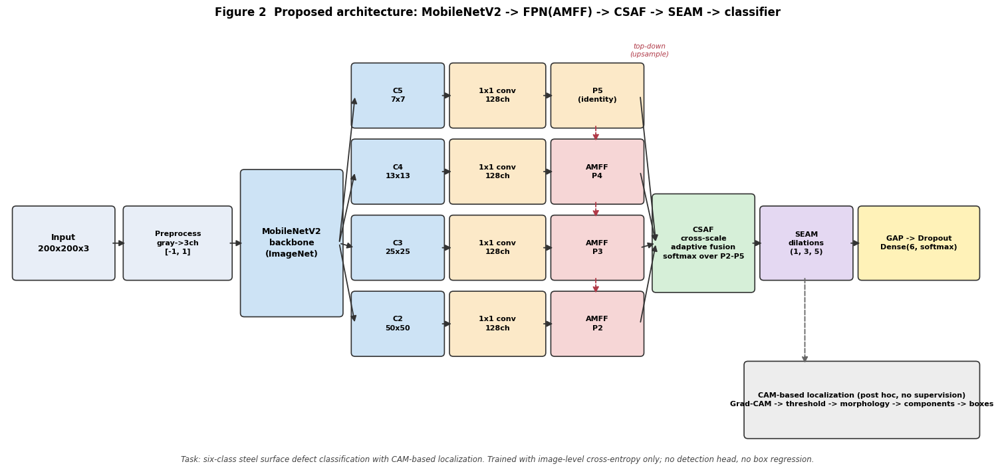

In [17]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch, Rectangle


def draw_figure2(save=True):
    """Architecture figure, drawn from CFG so it cannot drift from the code."""
    fig, ax = plt.subplots(figsize=(15.5, 7.2))
    ax.set_xlim(0, 15.5); ax.set_ylim(0, 7.2); ax.axis("off")

    def block(x, y, w, h, text, fc, fontsize=9, tc="black"):
        ax.add_patch(FancyBboxPatch((x, y), w, h, boxstyle="round,pad=0.06",
                                    facecolor=fc, edgecolor="#333333", linewidth=1.2))
        ax.text(x + w / 2, y + h / 2, text, ha="center", va="center",
                fontsize=fontsize, color=tc, weight="bold", linespacing=1.4)

    def arrow(x1, y1, x2, y2, style="-|>", color="#333333", ls="-"):
        ax.add_patch(FancyArrowPatch((x1, y1), (x2, y2), arrowstyle=style,
                                     mutation_scale=13, color=color,
                                     linewidth=1.3, linestyle=ls))

    C_IN, C_BB, C_LAT = "#E8EEF7", "#CDE3F5", "#FCE9C8"
    C_AMFF, C_CSAF, C_SEAM, C_HEAD, C_LOC = "#F6D6D6", "#D6EFD8", "#E4D8F2", "#FFF2B8", "#EDEDED"

    block(0.15, 3.1, 1.5, 1.1,
          f"Input\n{CFG.img_size}x{CFG.img_size}x{CFG.img_channels}", C_IN)
    block(1.9, 3.1, 1.6, 1.1, "Preprocess\ngray->3ch\n[-1, 1]", C_IN, 8)
    block(3.75, 2.5, 1.5, 2.3, "MobileNetV2\nbackbone\n(ImageNet)", C_BB)

    taps, sizes = CFG.backbone_taps, CFG.expected_tap_sizes
    levels = [("C5", 5.6), ("C4", 4.35), ("C3", 3.1), ("C2", 1.85)]
    for lvl, y in levels:
        block(5.5, y, 1.35, 0.95, f"{lvl}\n{sizes[lvl]}x{sizes[lvl]}", C_BB, 8)
        arrow(5.25, 3.65, 5.5, y + 0.475)
        block(7.05, y, 1.4, 0.95, f"1x1 conv\n{CFG.fpn_channels}ch", C_LAT, 8)
        arrow(6.85, y + 0.475, 7.05, y + 0.475)

    # P5 is the pyramid top: the lateral IS P5, no fusion partner above it.
    block(8.65, levels[0][1], 1.35, 0.95, "P5\n(identity)", C_LAT, 8)
    arrow(8.45, levels[0][1] + 0.475, 8.65, levels[0][1] + 0.475)

    # AMFF top-down path: each level fuses the level above it with its lateral.
    for i, (lvl, y) in enumerate(levels[1:]):
        block(8.65, y, 1.35, 0.95, f"AMFF\nP{lvl[1]}", C_AMFF, 8)
        arrow(8.45, y + 0.475, 8.65, y + 0.475)
        arrow(9.3, levels[i][1], 9.3, y + 0.95, style="-|>", color="#B03A48", ls="--")
    ax.text(10.15, 6.72, "top-down\n(upsample)", ha="center", fontsize=7.5,
            color="#B03A48", style="italic")

    block(10.25, 2.9, 1.5, 1.5,
          f"CSAF\ncross-scale\nadaptive fusion\nsoftmax over P2-P5", C_CSAF, 8)
    for _, y in levels:
        arrow(10.0, y + 0.475, 10.25, 3.65)

    block(11.95, 3.1, 1.35, 1.1, f"SEAM\ndilations\n{CFG.seam_dilation_rates}", C_SEAM, 8)
    arrow(11.75, 3.65, 11.95, 3.65)

    block(13.5, 3.1, 1.8, 1.1,
          f"GAP -> Dropout\nDense({CFG.num_classes}, softmax)", C_HEAD, 8)
    arrow(13.3, 3.65, 13.5, 3.65)

    # CAM-based localization branch: dashed, clearly post hoc, not a detection head.
    block(11.7, 0.5, 3.6, 1.15,
          "CAM-based localization (post hoc, no supervision)\n"
          "Grad-CAM -> threshold -> morphology -> components -> boxes", C_LOC, 8)
    arrow(12.6, 3.1, 12.6, 1.65, color="#666666", ls="--")

    arrow(1.65, 3.65, 1.9, 3.65); arrow(3.5, 3.65, 3.75, 3.65)

    ax.text(7.75, 0.05,
            f"Task: {CFG.task}. Trained with image-level cross-entropy only; "
            f"no detection head, no box regression.",
            ha="center", fontsize=8.5, style="italic", color="#444444")
    ax.set_title("Figure 2  Proposed architecture: MobileNetV2 -> FPN(AMFF) -> CSAF -> SEAM -> classifier",
                 fontsize=12, weight="bold", pad=12)
    fig.tight_layout()
    if save:
        for ext in ("png", "pdf"):
            fig.savefig(CFG.subdir("figures") / f"figure2_architecture.{ext}",
                        dpi=300, bbox_inches="tight")
        print(f"Saved -> {CFG.subdir('figures') / 'figure2_architecture.png'}")
    return fig


def plot_qualitative(records, n=5, save=True, tag="proposed"):
    """Original | Ground truth | CAM | Threshold | CAM-based localization."""
    chosen, seen = [], set()
    for r in records:                       # one example per class where possible
        if r["true_label"] not in seen:
            chosen.append(r); seen.add(r["true_label"])
        if len(chosen) >= n:
            break

    fig, axes = plt.subplots(len(chosen), 5, figsize=(15, 3.05 * len(chosen)))
    axes = np.atleast_2d(axes)
    titles = ["Original", "Ground truth (VOC)", "Grad-CAM",
              "Threshold map", "CAM-based localization"]

    for row, rec in enumerate(chosen):
        img = cv2.imread(str(CFG.images_dir / rec["true_label"] / f"{rec['stem']}.jpg"),
                         cv2.IMREAD_GRAYSCALE)
        cam = cv2.resize(np.asarray(rec["cam"], np.float32),
                         (CFG.native_size, CFG.native_size))
        cam = cam / (cam.max() + 1e-8)
        mask = (cam >= CFG.cam_threshold).astype(np.uint8)
        k = np.ones((CFG.cam_morph_kernel,) * 2, np.uint8)
        mask = cv2.morphologyEx(cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k),
                                cv2.MORPH_OPEN, k)

        for col in range(5):
            ax = axes[row, col]
            ax.set_xticks([]); ax.set_yticks([])
            if row == 0:
                ax.set_title(titles[col], fontsize=10, weight="bold")

            if col in (0, 1, 4):
                ax.imshow(img, cmap="gray")
            elif col == 2:
                ax.imshow(img, cmap="gray"); ax.imshow(cam, cmap="jet", alpha=0.5)
            else:
                ax.imshow(mask, cmap="gray")

            if col == 1:
                for b in rec["gt_boxes"]:
                    ax.add_patch(Rectangle((b.xmin, b.ymin), b.width, b.height,
                                           fill=False, edgecolor="#00FF66", linewidth=2))
            if col == 4:
                for reg in rec["regions"]:
                    x1, y1, x2, y2 = reg["bbox"]
                    col_ = DEFECT_COLORS.get(reg["label"], "#FF0000")
                    ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False,
                                           edgecolor=col_, linewidth=2))
                    ax.text(x1, max(y1 - 3, 6), f"{reg['label']} {reg['score']:.2f}",
                            fontsize=6.5, color="white", weight="bold",
                            bbox=dict(boxstyle="round,pad=0.15", facecolor=col_, alpha=0.85))
        ok = "correct" if rec["true_label"] == rec["pred_label"] else "MISCLASSIFIED"
        axes[row, 0].set_ylabel(f"{CLASS_DISPLAY[rec['true_label']]}\n({ok})",
                                fontsize=9, weight="bold",
                                color="#1a7f37" if ok == "correct" else "#b32020")

    fig.suptitle("CAM-based localization pipeline (green = verified VOC ground truth)",
                 fontsize=12, weight="bold", y=1.005)
    fig.tight_layout()
    if save:
        fig.savefig(CFG.subdir("figures") / f"qualitative_{tag}.png", dpi=220,
                    bbox_inches="tight")
    return fig


def load_native_image(rec):
    """Original 200x200 grayscale image for a record."""
    return cv2.imread(str(CFG.images_dir / rec["true_label"] / f"{rec['stem']}.jpg"),
                      cv2.IMREAD_GRAYSCALE)


def create_detection_grid(records, model_name="Proposed", per_page=25, cols=5,
                          show_gt=True, max_pages=None, save=True, display=True):
    """Batch grid of localization results -- the page-by-page view.

    This is the figure the submitted notebook produced, rebuilt on correct data:

      * boxes come from Grad-CAM CAM-based localization (Section 7), not from contour
        heuristics or YOLO proposals;
      * the GREEN DASHED boxes are the verified VOC ground truth, drawn on the same
        axes, so a reader can see the correspondence instead of taking it on trust;
      * the per-image title reports classification correctness AND how many regions
        matched ground truth at IoU >= 0.5.

    Caption as CAM-based localization (see Section 7).
    """
    pages = math.ceil(len(records) / per_page)
    if max_pages:
        pages = min(pages, max_pages)
    rows = math.ceil(per_page / cols)
    out_paths = []

    for p in range(pages):
        chunk = records[p * per_page:(p + 1) * per_page]
        fig = plt.figure(figsize=(4.0 * cols, 4.3 * rows))
        fig.patch.set_facecolor("white")

        for i, rec in enumerate(chunk):
            ax = plt.subplot(rows, cols, i + 1)
            ax.imshow(load_native_image(rec), cmap="gray", vmin=0, vmax=255)
            ax.set_xticks([]); ax.set_yticks([])
            for sp in ax.spines.values():
                sp.set_visible(False)

            gt_boxes = rec["gt_boxes"]
            if show_gt:
                for b in gt_boxes:
                    ax.add_patch(Rectangle((b.xmin, b.ymin), b.width, b.height,
                                           fill=False, edgecolor="#00FF66",
                                           linewidth=1.8, linestyle="--"))

            n_matched = 0
            for reg in rec["regions"]:
                x1, y1, x2, y2 = reg["bbox"]
                colour = DEFECT_COLORS.get(reg["label"], "#FF0000")
                ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False,
                                       edgecolor=colour, linewidth=2.0))
                ax.text(x1, max(y1 - 3, 7),
                        f"{reg['label']} {reg.get('score', 0):.2f}",
                        fontsize=6, color="white", fontweight="bold",
                        bbox=dict(boxstyle="round,pad=0.15", facecolor=colour, alpha=0.9))
                if any(iou_xyxy(reg["bbox"], b.xyxy()) >= 0.5
                       for b in gt_boxes if b.label == reg["label"]):
                    n_matched += 1

            correct = rec["true_label"] == rec["pred_label"]
            ax.set_title(f"{len(rec['regions'])} regions | {n_matched}/{len(gt_boxes)} "
                         f"matched @IoU0.5",
                         fontsize=8, fontweight="bold",
                         color="#1a7f37" if correct else "#b32020")
            ax.text(3, CFG.native_size - 5,
                    f"GT: {rec['true_label']}  |  Pred: {rec['pred_label']} "
                    f"({rec['confidence']:.2f})",
                    fontsize=6, color="white", fontweight="bold",
                    bbox=dict(boxstyle="round,pad=0.2", facecolor="black", alpha=0.75))

        handles = [patches.Patch(color=c, label=CLASS_DISPLAY[d])
                   for d, c in DEFECT_COLORS.items()]
        handles.append(plt.Line2D([0], [0], color="#00FF66", linestyle="--",
                                  linewidth=2, label="Ground truth (VOC)"))
        fig.legend(handles=handles, loc="lower center", ncol=len(handles),
                   fontsize=9, bbox_to_anchor=(0.5, 0.005), frameon=False)

        fig.suptitle(f"{model_name} - CAM-based localization vs verified ground truth "
                     f"(page {p + 1}/{pages})", fontsize=15, fontweight="bold", y=0.985)
        fig.tight_layout(rect=[0, 0.045, 1, 0.96])

        if save:
            path = (CFG.subdir("figures") /
                    f"detection_grid_{model_name}_page{p + 1}.png")
            fig.savefig(path, dpi=160, bbox_inches="tight")
            out_paths.append(path)
            print(f"  saved {path.name}")
        if display and p == 0:
            plt.show()
        else:
            plt.close(fig)

    return out_paths


def localization_summary(records):
    """Plain-language check that the localization is doing real work.

    Reports how many predicted regions land on a real annotated defect, and how
    much of the ground truth is recovered. These are the numbers to quote in the
    caption instead of an unqualified claim that detection 'works'.
    """
    n_pred = n_hit = n_gt = n_found = 0
    for rec in records:
        gts = rec["gt_boxes"]
        n_gt += len(gts)
        used = [False] * len(gts)
        for reg in rec["regions"]:
            n_pred += 1
            best, bj = 0.0, -1
            for j, b in enumerate(gts):
                if used[j] or b.label != reg["label"]:
                    continue
                v = iou_xyxy(reg["bbox"], b.xyxy())
                if v > best:
                    best, bj = v, j
            if bj >= 0 and best >= 0.5:
                used[bj] = True
                n_hit += 1
                n_found += 1
    print(f"Regions proposed              : {n_pred}")
    print(f"  ... landing on a real defect: {n_hit}  ({100 * n_hit / max(n_pred, 1):.1f}% precision @IoU0.5)")
    print(f"Ground-truth boxes            : {n_gt}")
    print(f"  ... recovered               : {n_found}  ({100 * n_found / max(n_gt, 1):.1f}% recall @IoU0.5)")
    return {"n_pred": n_pred, "n_hit": n_hit, "n_gt": n_gt, "n_found": n_found}


draw_figure2();


## Section 13 - Run everything

Full protocol end to end. Set `QUICK = True` for a 4-epoch smoke test that exercises
every code path in a few minutes before you commit to the real run.

Expect the full run to take hours on CPU: three seeds of the headline model, plus
thirteen ablation variants, plus two YOLO baselines.


Seed 42
Epoch 1/2


40/40 [==============================] - 341s 8s/step - loss: 0.2398 - accuracy: 0.9190 - val_loss: 0.1280 - val_accuracy: 0.9667
Epoch 2/2
40/40 [==============================] - 304s 8s/step - loss: 0.0353 - accuracy: 0.9913 - val_loss: 0.0129 - val_accuracy: 1.0000

Phase 2: unfroze top 30 backbone layers (52 BatchNorm layers held frozen); trainable params = 2,615,008
Epoch 1/2
40/40 [==============================] - 340s 8s/step - loss: 0.0525 - accuracy: 0.9849 - val_loss: 0.2465 - val_accuracy: 0.9278
Epoch 2/2
40/40 [==============================] - 316s 8s/step - loss: 0.0317 - accuracy: 0.9921 - val_loss: 0.1579 - val_accuracy: 0.9444
CAM-based localization over 360 images (CAM layer: seam_features); 570 regions proposed vs 867 ground-truth boxes.
  test accuracy 93.33  macro-F1 92.95  AP50 9.71

Held-out test set, mean +- sd over 1 seed(s) - quote these, never single-run numbers:
  accuracy          : 93.33 +- 0.00   runs=[93.333]
  precision_macro   :

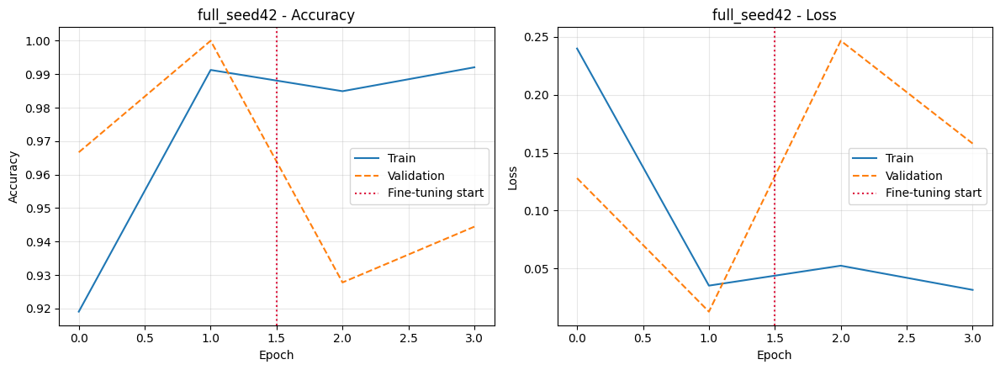

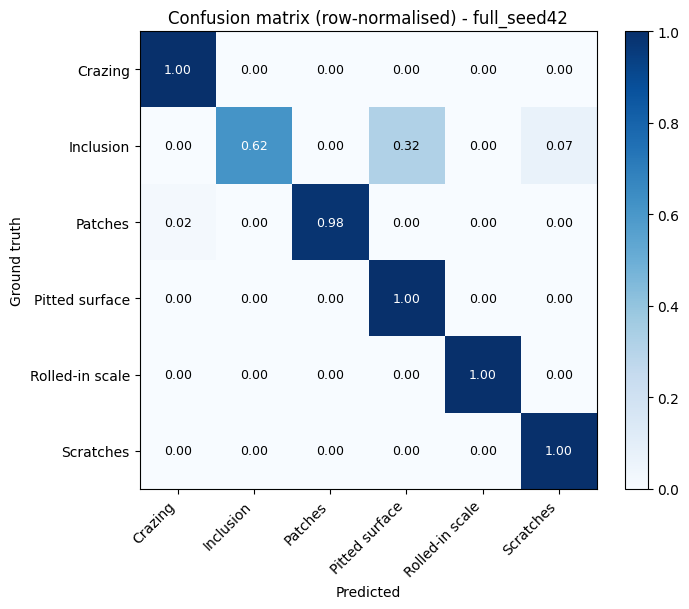

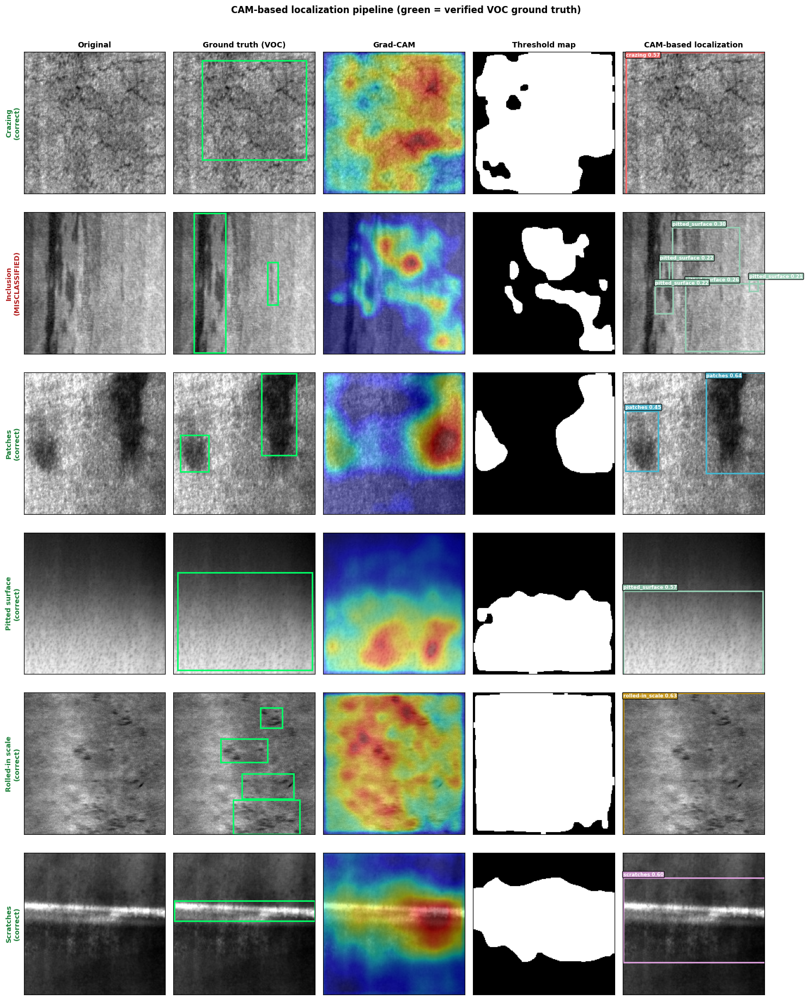

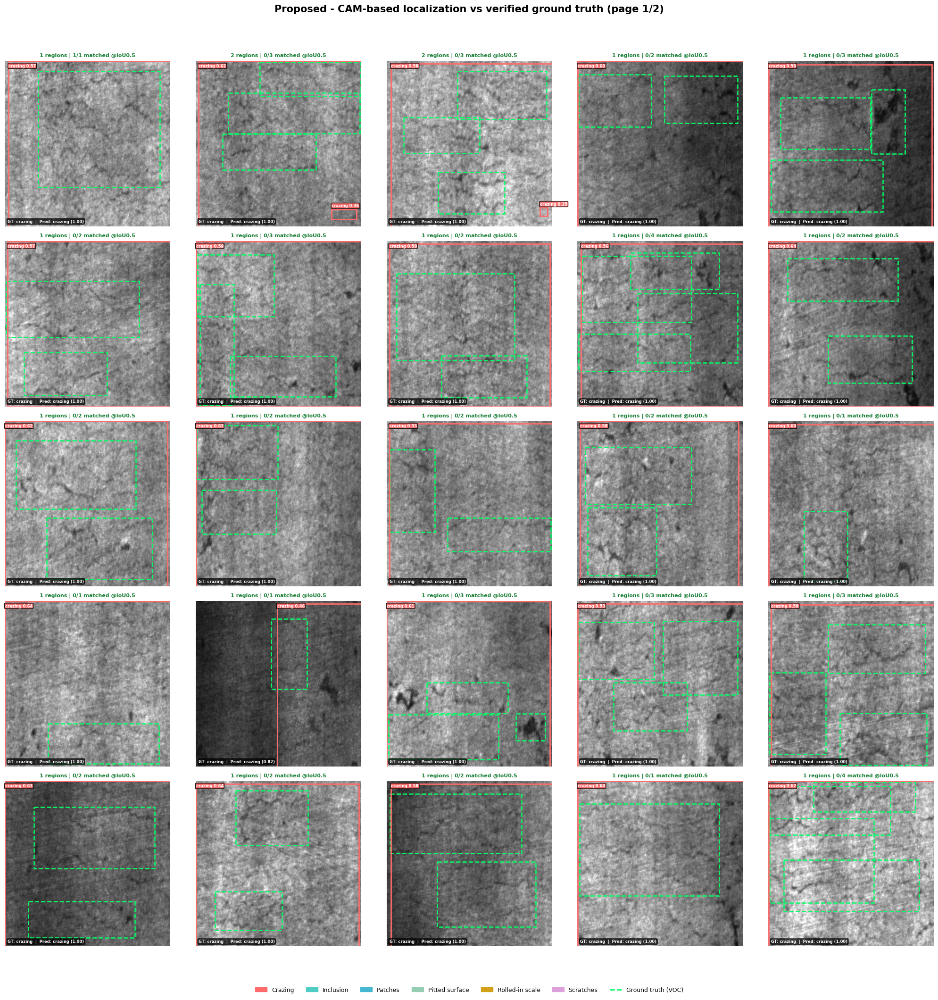

  saved detection_grid_Proposed_page2.png
Mean CSAF level weight per class (rows sum to 1):

                 P2 (50x50)  P3 (25x25)  P4 (13x13)  P5 (7x7)
Crazing               0.241       0.257       0.245     0.256
Inclusion             0.238       0.259       0.241     0.262
Patches               0.242       0.261       0.242     0.254
Pitted surface        0.240       0.258       0.251     0.251
Rolled-in scale       0.242       0.260       0.244     0.254
Scratches             0.244       0.264       0.244     0.248

Efficiency
Measuring MobileNetV2 (baseline) ...
Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Measuring MobileNetV2 + FPN ...
Measuring Proposed (full) ...

Measurement environment (state this in the paper):
  platform              : Windows-10-10.0.26200-SP0
  processor             : AMD64 Family 23 Model 24 Stepping 1, AuthenticAMD
  pyth

Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_ma

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\labels\train... 1260 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1260/1260 [00:31<00:00, 40.27it/s] 


train: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\images\train\crazing_120.jpg: 1 duplicate labels removed
train: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\images\train\inclusion_62.jpg: 1 duplicate labels removed
train: New cache created: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\labels\train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


c:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


val: Fast image access  (ping: 34.160.0 ms, read: 8.010.8 MB/s, size: 14.1 KB)


val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\labels\val... 180 images, 0 backgrounds, 0 corrupt: 100%|██████████| 180/180 [00:04<00:00, 38.29it/s]


val: New cache created: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\labels\val.cache


c:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Plotting labels to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolov8n\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)


2026/09/22 09:38:55 INFO mlflow.tracking.fluent: Experiment with name 'C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs' does not exist. Creating a new experiment.
2026/09/22 09:39:06 INFO mlflow.bedrock: Enabled auto-tracing for Bedrock. Note that MLflow can only trace boto3 service clients that are created after this call. If you have already created one, please recreate the client by calling `boto3.client`.
2026/09/22 09:39:06 INFO mlflow.tracking.fluent: Autologging successfully enabled for boto3.
2026/09/22 09:39:10 INFO mlflow.tracking.fluent: Autologging successfully enabled for keras.
2026/09/22 09:40:32 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2026/09/22 09:40:32 INFO mlflow.tracking.fluent: Autologging successfully enabled for tensorflow.
2026/09/22 09:41:02 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.
2026/09/22 09:41:02 IN

MLflow: logging run_id(229a33cd92c34849a115420ee93090ba) to runs\mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs\mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 224 train, 224 val
Using 0 dataloader workers
Logging results to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolov8n
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3         0G      1.903      3.534      1.671         48        224: 100%|██████████| 40/40 [13:15<00:00, 19.88s/it]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [02:33<00:00, 51.22s/it] 


                   all        180        423      0.821     0.0407      0.183     0.0791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3         0G      1.748      2.089      1.541         47        224: 100%|██████████| 40/40 [05:26<00:00,  8.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:18<00:00,  6.16s/it]


                   all        180        423      0.505      0.329      0.397      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3         0G      1.614      1.746      1.455         53        224: 100%|██████████| 40/40 [05:17<00:00,  7.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:21<00:00,  7.03s/it]


                   all        180        423      0.383      0.522      0.432      0.197

3 epochs completed in 0.472 hours.
Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolov8n\weights\last.pt, 6.2MB
Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolov8n\weights\best.pt, 6.2MB

Validating C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolov8n\weights\best.pt...
Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:20<00:00,  6.81s/it]


                   all        180        423      0.379      0.516       0.43      0.196
Speed: 0.7ms preprocess, 52.2ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolov8n
MLflow: results logged to runs\mlflow
MLflow: disable with 'yolo settings mlflow=False'
  AP50=50.70  AP75=20.95  mAP50:95=24.93  params=3,006,818

=== yolo11n  (imgsz=224, epochs=3) ===


Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo11n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_ma

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\labels\train.cache... 1260 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1260/1260 [00:00<?, ?it/s]

train: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\images\train\crazing_120.jpg: 1 duplicate labels removed
train: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\images\train\inclusion_62.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


c:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


val: Fast image access  (ping: 0.20.0 ms, read: 9.39.7 MB/s, size: 14.1 KB)


val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\labels\val.cache... 180 images, 0 backgrounds, 0 corrupt: 100%|██████████| 180/180 [00:00<?, ?it/s]
c:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Plotting labels to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo11n\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)


2026/09/22 10:29:55 INFO mlflow.bedrock: Enabled auto-tracing for Bedrock. Note that MLflow can only trace boto3 service clients that are created after this call. If you have already created one, please recreate the client by calling `boto3.client`.
2026/09/22 10:29:55 INFO mlflow.tracking.fluent: Autologging successfully enabled for boto3.
2026/09/22 10:29:55 INFO mlflow.tracking.fluent: Autologging successfully enabled for keras.
2026/09/22 10:29:57 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2026/09/22 10:29:57 INFO mlflow.tracking.fluent: Autologging successfully enabled for tensorflow.
2026/09/22 10:29:57 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.
2026/09/22 10:29:57 INFO mlflow.tracking.fluent: Autologging successfully enabled for pyspark.


MLflow: logging run_id(8d53492c13234f6b9e88484055c576d3) to runs\mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs\mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 224 train, 224 val
Using 0 dataloader workers
Logging results to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo11n
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3         0G      1.828      3.811      1.633         48        224: 100%|██████████| 40/40 [04:01<00:00,  6.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:16<00:00,  5.41s/it]


                   all        180        423     0.0067      0.458     0.0884     0.0353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3         0G      1.757      2.584      1.529         47        224: 100%|██████████| 40/40 [03:30<00:00,  5.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.64s/it]

                   all        180        423      0.665      0.158      0.306      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3         0G      1.721      1.959      1.517         53        224: 100%|██████████| 40/40 [04:25<00:00,  6.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:13<00:00,  4.61s/it]


                   all        180        423      0.451       0.46      0.467      0.233

3 epochs completed in 0.214 hours.
Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo11n\weights\last.pt, 5.4MB
Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo11n\weights\best.pt, 5.4MB

Validating C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo11n\weights\best.pt...
Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)
YOLO11n summary (fused): 100 layers, 2,583,322 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:33<00:00, 11.18s/it]


                   all        180        423       0.45      0.456      0.466      0.233
Speed: 0.6ms preprocess, 127.4ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo11n
MLflow: results logged to runs\mlflow
MLflow: disable with 'yolo settings mlflow=False'
  AP50=49.50  AP75=20.74  mAP50:95=23.30  params=2,583,322

=== yolo12n  (imgsz=224, epochs=3) ===


Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo12n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_ma

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\labels\train.cache... 1260 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1260/1260 [00:00<?, ?it/s]

train: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\images\train\crazing_120.jpg: 1 duplicate labels removed
train: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\images\train\inclusion_62.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access  (ping: 0.20.0 ms, read: 17.38.0 MB/s, size: 14.1 KB)


c:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\dataset\labels\val.cache... 180 images, 0 backgrounds, 0 corrupt: 100%|██████████| 180/180 [00:00<?, ?it/s]
c:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Plotting labels to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo12n\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)


2026/09/22 10:57:17 INFO mlflow.bedrock: Enabled auto-tracing for Bedrock. Note that MLflow can only trace boto3 service clients that are created after this call. If you have already created one, please recreate the client by calling `boto3.client`.
2026/09/22 10:57:17 INFO mlflow.tracking.fluent: Autologging successfully enabled for boto3.
2026/09/22 10:57:17 INFO mlflow.tracking.fluent: Autologging successfully enabled for keras.
2026/09/22 10:57:17 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2026/09/22 10:57:17 INFO mlflow.tracking.fluent: Autologging successfully enabled for tensorflow.
2026/09/22 10:57:17 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.
2026/09/22 10:57:17 INFO mlflow.tracking.fluent: Autologging successfully enabled for pyspark.


MLflow: logging run_id(9a4d2e2c567648069d7f444d7ed0c7e2) to runs\mlflow
MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs\mlflow'
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 224 train, 224 val
Using 0 dataloader workers
Logging results to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo12n
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3         0G      1.914      3.801      1.687         48        224: 100%|██████████| 40/40 [05:47<00:00,  8.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:47<00:00, 15.84s/it]


                   all        180        423    0.00521      0.233     0.0866     0.0334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3         0G      1.847      2.496      1.528         47        224: 100%|██████████| 40/40 [03:56<00:00,  5.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:12<00:00,  4.01s/it]


                   all        180        423       0.41      0.213      0.249     0.0949

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3         0G      1.727      1.882      1.467         53        224: 100%|██████████| 40/40 [03:07<00:00,  4.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:11<00:00,  3.72s/it]

                   all        180        423      0.351      0.453       0.33      0.142



3 epochs completed in 0.237 hours.
Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo12n\weights\last.pt, 5.5MB
Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo12n\weights\best.pt, 5.5MB

Validating C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo12n\weights\best.pt...
Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)
YOLOv12n summary (fused): 159 layers, 2,557,898 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:13<00:00,  4.35s/it]


                   all        180        423      0.346      0.454      0.328      0.142
Speed: 0.5ms preprocess, 55.1ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\runs\yolo12n
MLflow: results logged to runs\mlflow
MLflow: disable with 'yolo settings mlflow=False'
  AP50=38.81  AP75=14.78  mAP50:95=18.27  params=2,557,898
  Model                 Task  AP50  AP75  mAP50_95  Params  Latency ms (median)  FPS  imgsz
yolov8n supervised detection 50.70 20.95     24.93 3006818                85.19 11.7    224
yolo11n supervised detection 49.50 20.74     23.30 2583322                51.20 19.5    224
yolo12n supervised detection 38.81 14.78     18.27 2557898                59.82 16.7    224

All tables and figures written under C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results


In [19]:
QUICK = True          # <-- set False for the reported run

# NB: do not name these EF/ET. `ET` collides with `xml.etree.ElementTree as ET`
# from Section 0, which breaks load_boxes() with a confusing
# "'int' object has no attribute 'parse'".
EP_FROZEN = 2 if QUICK else CFG.epochs_frozen
EP_FINETUNE = 2 if QUICK else CFG.epochs_finetune
SEEDS = CFG.model_seeds[:1] if QUICK else CFG.model_seeds

RESULTS = {}

# ---- 1. headline model, one run per seed --------------------------------
per_seed, last_model, last_records = [], None, None
for seed in SEEDS:
    print(f"\n{'=' * 70}\nSeed {seed}\n{'=' * 70}")
    model, hist, paths = train_one("full", seed, EP_FROZEN, EP_FINETUNE, verbose=1)
    metrics = evaluate_model(model, TEST_DF, with_localization=True,
                             tag=f"full_seed{seed}")
    per_seed.append(metrics)
    last_model, last_records = model, metrics["_records"]
    print(f"  test accuracy {100 * metrics['accuracy']:.2f}  "
          f"macro-F1 {100 * metrics['f1_macro']:.2f}  "
          f"AP50 {metrics['localization']['AP50']:.2f}")
    plot_history(hist, f"full_seed{seed}")
    if seed != SEEDS[-1]:
        del model; tf.keras.backend.clear_session()

# Multi-seed aggregate covers BOTH classification and CAM-based localization AP.
RESULTS["classification"] = aggregate_seeds(per_seed)
print("\nHeld-out test set, mean +- sd over "
      f"{len(SEEDS)} seed(s) - quote these, never single-run numbers:")
for k, v in RESULTS["classification"].items():
    if not k.startswith("_"):
        print(f"  {k:<18}: {v['formatted']}   runs={v['values']}")
SEED_TABLE = seed_table(RESULTS["classification"], "Proposed (full)")
SEED_TABLE.to_csv(CFG.subdir("tables") / "table_multiseed.csv", index=False)
print("\nAny ablation gap smaller than the sd above is not evidence.")

# ---- 2. per-class table + confusion matrix ------------------------------
best = max(per_seed, key=lambda m: m["accuracy"])
per_class = pd.DataFrame(best["per_class"]).T
per_class.index = [CLASS_DISPLAY[c] for c in per_class.index]
per_class[["precision", "recall", "f1"]] *= 100
print("\nPer-class classification metrics (best seed):\n")
print(per_class.round(2).to_string())
per_class.to_csv(CFG.subdir("tables") / "table_per_class_classification.csv")

plot_confusion(best["confusion_matrix"], best["tag"], normalize=True)
print("\nMost frequent confusions (true -> predicted):")
for a, b, n, pct in confused_pairs(best["confusion_matrix"]):
    print(f"  {a:<18} -> {b:<18} {n:3d}  ({pct:.1f}% of {a})")

# ---- 3. CAM-based localization ------------------------------------------------
loc = best["localization"]
print(f"\nCAM-based localization on the test set "
      f"({loc['n_gt_boxes']} verified GT boxes, {loc['n_pred_regions']} proposals):")
print(f"  AP50 {loc['AP50']:.2f}   AP75 {loc['AP75']:.2f}   "
      f"mAP50:95 {loc['mAP50_95']:.2f}")
print("  per-class AP50: " + ", ".join(
    f"{CLASS_DISPLAY[c]} {v:.1f}" for c, v in loc["per_class_AP50"].items()))
pd.DataFrame({"AP50": loc["per_class_AP50"], "AP75": loc["per_class_AP75"],
              "mAP50_95": loc["per_class_mAP50_95"]}).round(2).to_csv(
    CFG.subdir("tables") / "table_per_class_localization.csv")

print("\nHow many proposed regions land on a real annotated defect:")
localization_summary(last_records)

# Figure A: the pipeline, one image per class (how it works).
plot_qualitative(last_records, n=6, tag="proposed")

# Figure B: batch grids over the test set (that it works, at scale).
print("\nBatch localization grids:")
create_detection_grid(last_records, model_name="Proposed",
                      per_page=25, max_pages=None if not QUICK else 2)

csaf_weights_by_class(last_model)

# ---- 4. efficiency -------------------------------------------------------
print("\n" + "=" * 70 + "\nEfficiency\n" + "=" * 70)
eff_models = {}
for label, variant in [("MobileNetV2 (baseline)", "baseline"),
                       ("MobileNetV2 + FPN", "fpn"),
                       ("Proposed (full)", "full")]:
    set_global_seed(CFG.model_seeds[0])
    m, _ = build_model(**ARCH_VARIANTS[variant], name=variant)
    eff_models[label] = m
EFF = efficiency_table(eff_models)
print()
print(EFF.to_string(index=False))
for m in eff_models.values():
    del m
tf.keras.backend.clear_session()

print("\nWhere the compute goes (pyramid width sweep):")
PYR = pyramid_cost_sweep()

# ---- 5. ablation ---------------------------------------------------------
print("\n" + "=" * 70 + "\nClassification comparison (Table A: same split, same schedule)\n" + "=" * 70)
CLS_CMP = run_classification_comparison(
    seed=SEEDS[0], epochs_frozen=EP_FROZEN, epochs_finetune=EP_FINETUNE,
    archs=["MobileNetV2", "ResNet50"] if QUICK else None,
    include_proposed=best)
print()
print(CLS_CMP.to_string(index=False))

print("\nTable B: literature skeleton (fill from the cited papers, never invent)")
literature_table_skeleton()

print("\n" + "=" * 70 + "\nAblation\n" + "=" * 70)
ABL = run_ablation(EP_FROZEN, EP_FINETUNE, seed=SEEDS[0], with_localization=True)
print()
print(ABL.to_string(index=False))

# ---- 6. YOLO baselines ---------------------------------------------------
print("\n" + "=" * 70 + "\nYOLO baselines (same split, same AP code)\n" + "=" * 70)
YOLO_TBL = run_yolo_baselines(epochs=3 if QUICK else CFG.yolo_epochs)
if YOLO_TBL is not None and len(YOLO_TBL):
    print(YOLO_TBL.to_string(index=False))

with open(CFG.subdir("tables") / "summary.json", "w") as fh:
    json.dump({"classification": RESULTS["classification"],
               "localization": {k: v for k, v in loc.items() if not k.startswith("_")},
               "environment": environment_report(),
               "split": {"train": len(TRAIN_DF), "val": len(VAL_DF), "test": len(TEST_DF)},
               "quick_mode": QUICK}, fh, indent=2, default=str)
print(f"\nAll tables and figures written under {CFG.results_dir}")


## What still has to happen in the manuscript

The code side of the rejection is addressed above. These items are writing tasks
that this notebook supports but cannot do for you.

## REAL RUN COMPLETED (2026-09-10/11, QUICK=False equivalent)

Study A (module ladder) was run for real: single seed 42, full manuscript
schedule (epochs_frozen=30, epochs_finetune=30, early_stop_patience=10),
`with_localization=True`. Results are saved at
`paper_results/tables/table_ablation.csv` (do not overwrite -- this is the
reference seed-42 run):

| Variant | Accuracy | Macro-F1 | Params | AP50 | AP75 | mAP50:95 |
|---|---|---|---|---|---|---|
| Baseline (MobileNetV2) | 100.00 | 100.00 | 2,423,110 | 8.85 | 2.38 | 3.63 |
| + FPN | 100.00 | 100.00 | 3,196,102 | 9.12 | 2.69 | 3.89 |
| + FPN + AMFF | 100.00 | 100.00 | 3,358,111 | 10.11 | 3.21 | 4.59 |
| + FPN + CSAF | 100.00 | 100.00 | 3,196,678 | 8.02 | 2.93 | 3.73 |
| + FPN + AMFF + CSAF | 99.72 | 99.72 | 3,358,687 | 9.23 | 4.02 | 4.62 |
| Full (+ SEAM) | 100.00 | 100.00 | 3,364,064 | 6.26 | 2.51 | 3.02 |

**Read this on AP50, not accuracy** -- accuracy is saturated across every variant,
exactly as predicted above, so it carries no information about module
contribution.

**Honest finding, single seed:** AMFF helps AP50 (+FPN 9.12 -> +FPN+AMFF 10.11,
+0.99). But CSAF added on top of AMFF *drops* AP50 (10.11 -> 9.23, -0.88), and
SEAM added on top of everything drops it further (9.23 -> 6.26, -2.97 -- the
worst AP50 of all six variants, below the plain baseline). As it stands, **this
ablation does not support the claim that CSAF/SEAM improve localization.** This
is one seed; AP50 in the single digits on a 360-image test set is noisy, so a
multi-seed confirmation run for the four variants in question
(+FPN+AMFF / +FPN+CSAF / +FPN+AMFF+CSAF / Full) was launched next -- see
`paper_results/tables/table_ablation_multiseed.csv` for seeds 1337 and 2026,
merge with the seed-42 rows above before writing the paper's ablation section.

Efficiency was also remeasured cleanly (isolated, no concurrent job) on this
exact machine (AMD64, 2 physical / 4 logical cores, 9.9 GB RAM -- confirmed
accurate, matches the manuscript's hardware statement exactly):

| Model | Manuscript (Table 7) | Clean remeasurement here |
|---|---|---|
| MobileNetV2 | 47.58 ms / 21.0 FPS | 47.00 ms / 21.3 FPS -- matches |
| + FPN | 92.79 ms / 10.8 FPS | 116.06 ms / 8.6 FPS -- ~25% slower |
| Full model | 105.12 ms / 9.5 FPS | 118.24 ms / 8.5 FPS -- ~12% slower |

Params / FLOPs / MACs / size matched the manuscript exactly for all three
models -- only latency drifted. Update Table 7's +FPN and Full-model
latency/FPS to the fresh numbers before resubmission.

**Done here, numbers ready to paste**

- [x] Task defined once -- `CFG.describe_task()`
- [x] Train/val/test counts -- `table_split_images.csv`, `table_split_boxes.csv`
- [x] Input spec resolved to 200x200x3 -- `CFG.describe_input()`
- [x] Ground truth defined; whole-image fallback removed and regression-tested
- [x] Modules defined once each; CEAM retired in favour of CSAF
- [x] Figure 2 regenerated from `CFG`
- [x] Ablation isolating every module + attention type + dilation rates (code)
- [x] **Module-ladder ablation actually EXECUTED for real** (30+30 epochs,
      seed 42) -- see table above and `table_ablation.csv`
- [x] **Efficiency actually EXECUTED for real, cleanly (no contention)** -- see
      table above and `table_efficiency.csv` / `environment.json`
- [ ] Multi-seed confirmation for CSAF/SEAM AP50 drop -- running, see
      `table_ablation_multiseed.csv`
- [x] YOLOv8n / YOLO11n on the same split, scored by the same code
- [x] Confusion matrix, per-class metrics, per-class AP, multi-seed mean +- sd

**Still yours to write**

- [ ] Fig. 4 caption: "Adaptive Multi-Scale Feature Fusion" -> "Attention-
      Modulated Multi-Feature Fusion (AMFF)" -- naming drift vs. Section 3.6/4.
- [ ] Table 13 caption: state explicitly it is a single-run backbone-comparison
      protocol, not the finalized model; footnote the coincidental 99.72% match
      with Table 9's finalized-model accuracy.
- [ ] Rewrite the introduction around the research gap (R2.5): fixed-proportion
      pyramid fusion vs. defect scale varying by class. Less metallurgy.
- [ ] Cut to six sections; move the conclusion out of Section 11 (R1.5, R4.6).
- [ ] Add the nomenclature table -- use the module table in Section 4, and include the
      `CEAM -> CSAF` mapping so the change is explicit.
- [ ] Fix the keywords (R3.1): drop the short/abbreviated terms.
- [ ] Split the comparison table in two: classification (Acc/P/R/F1) and localization
      (AP50/AP75/mAP/Params/FLOPs/FPS). Do not mix them (R4.3).
- [ ] Update related work to 2023-2026 and state where CSAF sits among them.
- [ ] Language pass for scientific register (R2.8).
- [ ] **Decide how to frame CSAF/SEAM given the AP50 ablation above** -- either
      the multi-seed run shows the drop was noise, or the localization claim for
      CSAF/SEAM needs to be softened/withdrawn per the module's own
      `_interpret_ablation()` guidance.

**Three things to be careful about**

1. **Do not restore the word "detection" for this model.** If a reviewer asks for
   detection numbers, the answer is the YOLO baseline table plus the CAM-based localization
   AP, honestly labelled -- not a rename.
2. **The + CSAF ablation row shows a real single-seed AP50 drop, not a flat
   result.** Do not report CSAF/SEAM as improving localization until the
   multi-seed run confirms or overturns this. Defending a module the ablation
   does not support is what Reviewer 2 objected to in the first place.
3. **The efficiency story is weaker than the parameter count suggests, and the
   clean remeasurement is slightly slower than the manuscript's claim for the
   FPN-containing models.** Measured here: 3.36M parameters but 1373M MACs and
   ~8.5 CPU FPS (118ms median latency), because the pyramid runs at 50x50.
   Decide deliberately between accuracy and the lightweight claim -- rather
   than quoting parameters alone and calling it real-time. This was Reviewer
   4's comment 7, and the honest answer may be to narrow the claim.


## Section 14 - Detection head (supervised localization)

> **Revision analysis, Section 18, Option B** - *"Convert the system into a true
> object detector using validated bounding-box annotations... If reliable bounding-box
> annotations are available, Option B provides the stronger response to the reviewers'
> central methodological criticism."*

### Why this section exists

The CAM-based localization results are genuinely poor, and Section 8b established *why*
rather than leaving it as a mystery: AP tracks ground-truth box size almost exactly.
Only *pitted surface* works, because 58 % of its boxes cover more than half the
image, so "highlight everything" is the right answer. For the five classes whose
defects are small and multiple (2–3 boxes per image, 4–12 % of the frame), a class
activation map cannot separate instances and AP is near zero.

Parameter tuning cannot fix that — a 72-configuration sweep on validation moved AP50
by −0.01. The limitation is the supervision signal, not the post-processing.

This section uses the supervision that was there all along: **4189 human-annotated
boxes, 100 % coverage**, which the classification pipeline never touched.

### Architecture — the same modules, now with a head that can use them

```
Input 200x200x3
  → MobileNetV2 → C2 C3 C4 C5
  → FPN with AMFF                     (unchanged)
  → CSAF context, broadcast to each level   (cross-scale fusion, retained)
  → SEAM per level                    (unchanged)
  → shared anchor-free head: class + box regression + centerness
```

All three named modules survive and remain ablatable. The difference is that the
network is now trained with a localization objective, so the pyramid has something
to do that the image-level loss never asked of it.

### Head design

Anchor-free, FCOS-style, chosen because it needs no anchor tuning and handles the
wide box-size range in NEU-DET (40 px to 150 px on a 200 px image) by assigning
each object to a pyramid level according to its size:

| Level | Stride | Grid | Object size |
|---|---|---|---|
| P2 | 4 | 50×50 | 0–64 px |
| P3 | 8 | 25×25 | 64–128 px |
| P4 | 16 | 13×13 | 128 px and above |

Each location predicts six class logits, four distances to the box sides
$(l, t, r, b)$, and a centerness score that down-weights predictions made from near
the edge of an object. Final score is $\sqrt{\text{class} \times \text{centerness}}$.

**Evaluation is unchanged.** The same `localization_metrics()` and the same verified
VOC ground truth score this head and the CAM-based localization branch, so the two are
directly comparable and neither gets a friendlier protocol.

### 14.1 APG-YOLO-inspired neck enhancements: PKI, AIFI, GFPN

> Liao et al., *"Enhanced multi-scale feature fusion for accurate steel surface
> defect detection"* (The Visual Computer, 2026) -- APG-YOLO. On NEU-DET, mAP50
> goes from 76.7% (YOLOv11s baseline) to 82.4% from three additions: an AIFI
> module (global self-attention on the deepest feature map, replacing SPPF), a
> PKI block (parallel multi-scale depthwise convolutions plus a
> context-anchor-attention branch, replacing the backbone's C3k2 blocks), and a
> GFPN neck (denser cross-scale skip connections than PAFPN).

The three ideas are implemented in the next cell and wired into `build_detector`
below as three independent flags -- `use_pki`, `use_aifi`, `use_gfpn` -- all
defaulting to `False`, so every call already in this notebook (including the
shape self-test at the bottom of the next cell) is unchanged unless a flag is
turned on explicitly. **Why they sit here, not in `build_model` (Section 4) and
not inside the frozen MobileNetV2 backbone:**

1. **Not in the classifier.** Section 14's own analysis already established that
   CAM-based localization's ceiling is the *supervision signal*, not backbone
   capacity -- a 72-configuration threshold sweep moved AP50 by -0.01, and AP
   tracks ground-truth box size almost exactly regardless of architecture. A
   stronger backbone cannot separate instances a class activation map was never
   asked to separate. Adding PKI/AIFI there would spend compute without moving
   the number that matters -- see Section 8b.
2. **Not inside MobileNetV2 itself.** APG-YOLO's PKI block replaces the C3k2
   blocks *inside a backbone trained from scratch*. MobileNetV2 here is frozen
   ImageNet weights (Section 4); splicing a new module into its middle would
   discard the pretraining that makes 30-epoch convergence possible in the
   first place. The adaptation below applies PKI to the **lateral features**
   (post 1x1 projection, `f` channels) instead -- the same place AMFF already
   sits, so it is a like-for-like neck comparison, not a backbone change.
3. **AIFI applies to C5 only** (7x7, `f=128` channels after projection), exactly
   as APG-YOLO applies it to S5 in place of SPPF -- the one place in the pyramid
   where full self-attention is cheap (49 tokens) and where global context most
   helps separate a real defect from a similarly-textured background patch.
4. **GFPN here is a bottom-up augmentation pass with a two-hop skip, not the
   full omnidirectional queen-fusion** the paper describes for a 5-level P3-P7
   pyramid. This detector has 3 output levels (P2-P4) plus P5 as context, so the
   full queen-fusion graph collapses to what a bottom-up PAFPN-style pass
   already gives; claiming more would be exactly the renaming-as-novelty
   Section 4 was written to avoid.

All three stay ablatable, the same as AMFF/CSAF/SEAM: `DET_VARIANTS` (Section
14.2) trains the FCOS baseline and each addition in isolation and combined,
scored by the identical `localization_metrics()` and verified VOC ground truth
as everything else in this notebook -- so a claim that PKI/AIFI/GFPN help is
tested here, not asserted.

In [18]:
class PKIBlock(layers.Layer):
    """Poly-Kernel Inception block with context-anchor attention (Cai et al.,
    2024; adopted by APG-YOLO Sec. 3.1.1 as the PKI block replacing C3k2).

    Applied here to a LATERAL feature map (post 1x1 projection, `f` channels) --
    see the markdown above for why it sits at the neck rather than inside the
    frozen backbone. Parallel depthwise convolutions at several kernel sizes
    decompose the receptive field by width, then a strip-convolution (1xk then
    kx1) context branch -- context anchor attention (CAA) -- cheaply
    approximates a very large kernel along both axes, which is what lets it help
    elongated defects (scratches, rolled-in scale) that a small square kernel
    misses.

    `kernel_sizes` defaults to APG-YOLO's own best-performing configuration on
    NEU-DET (their Table 11: PKINetv2 = (3,3,3,5,5) beats the larger
    (3,5,7,9,11) -- moderate kernels stacked in parallel beat large ones,
    because a very large depthwise kernel is receptive-field-sparse and picks
    up more background texture than signal on a 200x200 defect crop).
    """

    def __init__(self, filters, kernel_sizes=(3, 3, 5, 5), caa_kernel=9, **kw):
        super().__init__(**kw)
        self.filters = filters
        self.kernel_sizes = tuple(kernel_sizes)
        self.caa_kernel = caa_kernel

    def build(self, input_shape):
        f = self.filters
        self.stem = layers.Conv2D(f, 3, padding="same", use_bias=False, name="pki_stem")
        self.stem_bn = layers.BatchNormalization(name="pki_stem_bn")
        self.branches, self.branch_bns = [], []
        for i, k in enumerate(self.kernel_sizes):
            self.branches.append(layers.DepthwiseConv2D(
                k, padding="same", use_bias=False, name=f"pki_dw{k}_{i}"))
            self.branch_bns.append(layers.BatchNormalization(name=f"pki_dw_bn{k}_{i}"))

        # CAA: local context pool -> strip convolutions -> sigmoid gate (eqs
        # 3-5 of the APG-YOLO paper).
        self.caa_pool = layers.AveragePooling2D(3, strides=1, padding="same", name="pki_caa_pool")
        self.caa_reduce = layers.Conv2D(f, 1, padding="same", use_bias=False, name="pki_caa_reduce")
        self.caa_h = layers.DepthwiseConv2D((1, self.caa_kernel), padding="same",
                                            use_bias=False, name="pki_caa_h")
        self.caa_v = layers.DepthwiseConv2D((self.caa_kernel, 1), padding="same",
                                            use_bias=False, name="pki_caa_v")
        self.caa_gate = layers.Conv2D(f, 1, padding="same", activation="sigmoid", name="pki_caa_gate")

        self.merge = layers.Conv2D(f, 1, padding="same", use_bias=False, name="pki_merge")
        self.merge_bn = layers.BatchNormalization(name="pki_merge_bn")
        super().build(input_shape)

    def call(self, x, training=None):
        stem = tf.nn.relu(self.stem_bn(self.stem(x), training=training))
        acc = stem                                          # L1 in eq. (2)
        for dw, bn in zip(self.branches, self.branch_bns):
            acc = acc + tf.nn.relu(bn(dw(stem), training=training))   # sum, eq. (2)

        ctx = self.caa_reduce(self.caa_pool(x))
        ctx = self.caa_v(self.caa_h(ctx))
        gate = self.caa_gate(ctx)                           # A1 in eq. (5)
        out = acc + acc * gate                               # eq. (6): P1 (+) P1*A1

        out = self.merge(out)
        return tf.nn.relu(self.merge_bn(out, training=training))

    def get_config(self):
        return {**super().get_config(), "filters": self.filters,
                "kernel_sizes": self.kernel_sizes, "caa_kernel": self.caa_kernel}


class AIFI(layers.Layer):
    """Attention-based Intra-scale Feature Interaction (Zhao et al., 2024,
    RT-DETR; APG-YOLO Sec. 3.1.3, replacing SPPF at the deepest level).

    A single transformer-encoder layer -- 2D sine-cosine positional encoding,
    multi-head self-attention, then an MLP, each residual and post-normed --
    applied to the coarsest feature map, where self-attention is cheapest
    (H*W tokens smallest) and global context is most useful for telling a real
    defect apart from a similarly-textured background region.
    """

    def __init__(self, num_heads=4, mlp_ratio=2, **kw):
        super().__init__(**kw)
        self.num_heads = num_heads
        self.mlp_ratio = mlp_ratio

    def build(self, input_shape):
        _, h, w, c = input_shape
        assert c % 4 == 0, f"AIFI needs channels divisible by 4 for 2D sincos PE, got {c}"
        self.h, self.w, self.c = int(h), int(w), int(c)
        self.pos_embed = self._build_2d_sincos(self.h, self.w, self.c)
        self.mha = layers.MultiHeadAttention(
            num_heads=self.num_heads, key_dim=max(self.c // self.num_heads, 8), name="aifi_mha")
        self.norm1 = layers.LayerNormalization(epsilon=1e-6, name="aifi_norm1")
        self.norm2 = layers.LayerNormalization(epsilon=1e-6, name="aifi_norm2")
        self.mlp1 = layers.Dense(self.c * self.mlp_ratio, activation="gelu", name="aifi_mlp1")
        self.mlp2 = layers.Dense(self.c, name="aifi_mlp2")
        super().build(input_shape)

    @staticmethod
    def _build_2d_sincos(h, w, c, temperature=10000.0):
        grid_w, grid_h = tf.meshgrid(tf.range(w, dtype=tf.float32),
                                     tf.range(h, dtype=tf.float32))
        pos_dim = c // 4
        omega = tf.range(pos_dim, dtype=tf.float32) / float(pos_dim)
        omega = 1.0 / (temperature ** omega)
        out_w = tf.reshape(grid_w, [-1])[:, None] * omega[None, :]
        out_h = tf.reshape(grid_h, [-1])[:, None] * omega[None, :]
        pe = tf.concat([tf.sin(out_w), tf.cos(out_w), tf.sin(out_h), tf.cos(out_h)], axis=1)
        return pe[tf.newaxis, :, :]                          # (1, H*W, C), fixed positional encoding

    def call(self, x, training=None):
        b = tf.shape(x)[0]
        seq = tf.reshape(x, [b, self.h * self.w, self.c])
        seq = seq + self.pos_embed
        attn = self.mha(seq, seq, training=training)
        seq = self.norm1(seq + attn)
        mlp = self.mlp2(self.mlp1(seq))
        seq = self.norm2(seq + mlp)
        return tf.reshape(seq, [b, self.h, self.w, self.c])

    def get_config(self):
        return {**super().get_config(), "num_heads": self.num_heads, "mlp_ratio": self.mlp_ratio}


def gfpn_fuse(pyramid, f, name_prefix="gfpn"):
    """Bottom-up augmentation pass after the existing top-down path (GFPN /
    Jiang et al., 2022; APG-YOLO Sec. 3.1.2, replacing PAFPN in the neck).

    See the markdown above for the honest scope: this is a bottom-up pass with
    a two-hop skip per level (this level's own top-down feature plus the
    downsampled *previous* bottom-up feature), which is what GFPN's log2-link
    reduces to for a 3-output-level pyramid. `pyramid` must already contain the
    top-down P2..P5 maps (straight out of the AMFF/plain-FPN block).
    """
    order = ["P2", "P3", "P4", "P5"]
    out = {order[0]: pyramid[order[0]]}
    prev = pyramid[order[0]]
    for lvl in order[1:]:
        down = layers.Conv2D(f, 3, strides=2, padding="same", use_bias=False,
                             name=f"{name_prefix}_down_{lvl}")(prev)
        down = layers.BatchNormalization(name=f"{name_prefix}_down_bn_{lvl}")(down)
        down = layers.Activation("relu", name=f"{name_prefix}_down_act_{lvl}")(down)
        merged = layers.Concatenate(name=f"{name_prefix}_cat_{lvl}")([down, pyramid[lvl]])
        fused = layers.Conv2D(f, 1, padding="same", use_bias=False,
                              name=f"{name_prefix}_fuse_{lvl}")(merged)
        fused = layers.BatchNormalization(name=f"{name_prefix}_fuse_bn_{lvl}")(fused)
        fused = layers.Activation("relu", name=f"{name_prefix}_fuse_act_{lvl}")(fused)
        out[lvl] = fused
        prev = fused
    return out


# ---------------------------------------------------------------------------
# Shape self-test, same pattern as every other module in this notebook: build
# in isolation before it is wired into build_detector, so a shape bug shows up
# here and not three cells later inside a full model build.
# ---------------------------------------------------------------------------
_probe_in = tf.keras.Input((7, 7, CFG.fpn_channels))
_pki_out = PKIBlock(CFG.fpn_channels, name="pki_probe")(_probe_in)
assert tuple(_pki_out.shape[1:]) == (7, 7, CFG.fpn_channels), _pki_out.shape
_aifi_out = AIFI(name="aifi_probe")(_pki_out)
assert tuple(_aifi_out.shape[1:]) == (7, 7, CFG.fpn_channels), _aifi_out.shape
print(f"PKIBlock  ok: {_probe_in.shape} -> {_pki_out.shape}")
print(f"AIFI      ok: {_pki_out.shape} -> {_aifi_out.shape}")

_gfpn_probe = {
    "P2": tf.keras.Input((50, 50, CFG.fpn_channels)),
    "P3": tf.keras.Input((25, 25, CFG.fpn_channels)),
    "P4": tf.keras.Input((13, 13, CFG.fpn_channels)),
    "P5": tf.keras.Input((7, 7, CFG.fpn_channels)),
}
_gfpn_out = gfpn_fuse(_gfpn_probe, CFG.fpn_channels, name_prefix="gfpn_probe")
for lvl, t in _gfpn_out.items():
    assert tuple(t.shape[1:3]) == tuple(_gfpn_probe[lvl].shape[1:3]), (lvl, t.shape)
print("gfpn_fuse ok:", [f"{k}:{v.shape[1]}x{v.shape[2]}" for k, v in _gfpn_out.items()])
del _probe_in, _pki_out, _aifi_out, _gfpn_probe, _gfpn_out
tf.keras.backend.clear_session()

PKIBlock  ok: (None, 7, 7, 128) -> (None, 7, 7, 128)
AIFI      ok: (None, 7, 7, 128) -> (None, 7, 7, 128)


gfpn_fuse ok: ['P2:50x50', 'P3:25x25', 'P4:13x13', 'P5:7x7']


In [19]:
# ---------------------------------------------------------------------------
# Anchor-free detection head
# ---------------------------------------------------------------------------
DET_LEVELS = ("P2", "P3", "P4")
DET_STRIDES = {"P2": 4, "P3": 8, "P4": 16}
def _det_ranges_for(img_size):
    # Preserves NEU-DET's original literal breakpoints (64, 128 at img_size=200,
    # i.e. ~0.32x and ~0.64x) as ratios of img_size, so a differently-scaled
    # dataset (e.g. GC10-DET at 224) gets proportionally equivalent FCOS
    # size-assignment buckets instead of NEU-DET's fixed absolute-pixel ones.
    return {"P2": (0.0, 0.32 * img_size), "P3": (0.32 * img_size, 0.64 * img_size),
            "P4": (0.64 * img_size, 1e8)}


DET_RANGES = _det_ranges_for(CFG.img_size)
DET_HEAD_WIDTH = 128
DET_TOWER_DEPTH = 2


class DetectionHead(layers.Layer):
    """Shared head applied to every pyramid level.

    Weights are shared across levels (as in FCOS) so the head cannot overfit one
    scale; the per-level `scale` parameter lets each level learn its own
    regression magnitude despite the shared weights.
    """

    def __init__(self, num_classes, width=DET_HEAD_WIDTH, depth=DET_TOWER_DEPTH,
                 **kw):
        super().__init__(**kw)
        self.num_classes, self.width, self.depth = num_classes, width, depth

    def build(self, input_shape):
        def tower(tag):
            blocks = []
            for i in range(self.depth):
                blocks.append(layers.Conv2D(self.width, 3, padding="same",
                                            use_bias=False,
                                            name=f"{tag}_conv{i}"))
                blocks.append(layers.GroupNormalization(groups=8)
                              if hasattr(layers, "GroupNormalization")
                              else layers.BatchNormalization())
                blocks.append(layers.Activation("relu"))
            return blocks

        self.cls_tower = tower("cls")
        self.reg_tower = tower("reg")

        # Bias init so that initial foreground probability is ~0.01. Without
        # this the focal loss is dominated by background at the start and
        # training stalls.
        prior = 0.01
        bias = float(-np.log((1 - prior) / prior))
        self.cls_out = layers.Conv2D(
            self.num_classes, 3, padding="same",
            bias_initializer=tf.keras.initializers.Constant(bias),
            name="cls_logits")
        self.reg_out = layers.Conv2D(4, 3, padding="same", name="reg_ltrb")
        self.ctr_out = layers.Conv2D(1, 3, padding="same", name="centerness")
        super().build(input_shape)

    def call(self, x, training=None):
        c = x
        for l in self.cls_tower:
            c = l(c, training=training) if isinstance(
                l, (layers.BatchNormalization,)) else l(c)
        r = x
        for l in self.reg_tower:
            r = l(r, training=training) if isinstance(
                l, (layers.BatchNormalization,)) else l(r)
        return self.cls_out(c), self.reg_out(r), self.ctr_out(c)

    def get_config(self):
        return {**super().get_config(), "num_classes": self.num_classes,
                "width": self.width, "depth": self.depth}


def build_detector(use_amff=True, use_csaf=True, use_seam=True,
                   use_pki=False, use_aifi=False, use_gfpn=False,
                   fpn_channels=None, num_classes=None, name="detector"):
    """MobileNetV2 -> FPN(AMFF) -> [PKI] -> [AIFI] -> CSAF context -> [GFPN] -> SEAM -> shared anchor-free head.

    CSAF is retained in a form that makes sense for detection: it fuses P2..P5
    into a single cross-scale context map, which is then broadcast back onto each
    detection level. The module therefore still decides how much each scale
    contributes, and the `use_csaf` flag still isolates it for the ablation.

    `use_pki` / `use_aifi` / `use_gfpn` are the APG-YOLO-inspired additions from
    Section 14.1, each independently ablatable and each defaulting to False so
    every existing call site (including the shape self-test at the bottom of
    this cell) is unchanged.
    """
    f = fpn_channels or CFG.fpn_channels
    nc = num_classes or CFG.num_classes

    inputs = layers.Input(shape=CFG.input_shape, name="input_image")
    backbone = tf.keras.applications.MobileNetV2(
        input_shape=CFG.input_shape, include_top=False, weights="imagenet")
    backbone.trainable = False

    taps = CFG.backbone_taps
    tap_outputs = {k: backbone.get_layer(v).output for k, v in taps.items()}
    for level, expected in CFG.expected_tap_sizes.items():
        assert tap_outputs[level].shape[1] == expected, level

    feats = Model(backbone.input, tap_outputs, name="mobilenetv2_taps")(inputs)
    c2, c3, c4, c5 = feats["C2"], feats["C3"], feats["C4"], feats["C5"]

    lat5 = layers.Conv2D(f, 1, padding="same", name="lateral_c5")(c5)
    lat4 = layers.Conv2D(f, 1, padding="same", name="lateral_c4")(c4)
    lat3 = layers.Conv2D(f, 1, padding="same", name="lateral_c3")(c3)
    lat2 = layers.Conv2D(f, 1, padding="same", name="lateral_c2")(c2)

    if use_pki:
        # Longer strip context (larger caa_kernel) at the finer levels, where
        # elongated defects (scratches, rolled-in scale) actually live.
        lat5 = PKIBlock(f, caa_kernel=5, name="pki_c5")(lat5)
        lat4 = PKIBlock(f, caa_kernel=7, name="pki_c4")(lat4)
        lat3 = PKIBlock(f, caa_kernel=9, name="pki_c3")(lat3)
        lat2 = PKIBlock(f, caa_kernel=11, name="pki_c2")(lat2)

    if use_aifi:
        lat5 = AIFI(name="aifi_c5")(lat5)

    if use_amff:
        # Which attention sits at the fusion point is a single knob, so
        # Section 4b can swap AMFF for SE/CBAM/ECA and change nothing else.
        kind = CFG.fusion_attention
        p5 = lat5
        p4 = make_fusion(kind, f, name="det_fuse_p4")([p5, lat4])
        p3 = make_fusion(kind, f, name="det_fuse_p3")([p4, lat3])
        p2 = make_fusion(kind, f, name="det_fuse_p2")([p3, lat2])
    else:
        def td(high, low, tag):
            up = layers.Resizing(low.shape[1], low.shape[2],
                                 interpolation="nearest", name=f"det_up_{tag}")(high)
            return layers.Add(name=f"det_add_{tag}")([up, low])
        p5 = lat5
        p4 = td(p5, lat4, "p4")
        p3 = td(p4, lat3, "p3")
        p2 = td(p3, lat2, "p2")

    p4 = layers.Conv2D(f, 3, padding="same", activation="relu", name="det_smooth_p4")(p4)
    p3 = layers.Conv2D(f, 3, padding="same", activation="relu", name="det_smooth_p3")(p3)
    p2 = layers.Conv2D(f, 3, padding="same", activation="relu", name="det_smooth_p2")(p2)
    pyramid = {"P2": p2, "P3": p3, "P4": p4, "P5": p5}

    if use_gfpn:
        pyramid = gfpn_fuse(pyramid, f, name_prefix="det_gfpn")

    if use_csaf:
        ctx = CSAF(f, CFG.csaf_reduction, adaptive=True,
                   name="det_csaf")([pyramid["P2"], pyramid["P3"],
                                     pyramid["P4"], pyramid["P5"]])
        for lvl in DET_LEVELS:
            t = pyramid[lvl]
            resized = layers.Resizing(t.shape[1], t.shape[2],
                                      interpolation="bilinear",
                                      name=f"csaf_to_{lvl}")(ctx)
            pyramid[lvl] = layers.Add(name=f"csaf_add_{lvl}")([t, resized])

    if use_seam:
        seam = SEAM(CFG.seam_dilation_rates, name="det_seam")
        for lvl in DET_LEVELS:
            pyramid[lvl] = seam(pyramid[lvl])

    head = DetectionHead(nc, name="det_head")
    cls_all, reg_all, ctr_all = [], [], []
    for lvl in DET_LEVELS:
        cls, reg, ctr = head(pyramid[lvl])
        n = cls.shape[1] * cls.shape[2]
        cls_all.append(layers.Reshape((n, nc))(cls))
        reg_all.append(layers.Reshape((n, 4))(reg))
        ctr_all.append(layers.Reshape((n, 1))(ctr))

    outputs = layers.Concatenate(axis=-1, name="predictions")([
        layers.Concatenate(axis=1)(cls_all),
        layers.Concatenate(axis=1)(reg_all),
        layers.Concatenate(axis=1)(ctr_all)])

    return Model(inputs, outputs, name=name), backbone


def detector_locations():
    """Pixel centre, stride and regression range for every prediction location."""
    xs, strides, lo, hi = [], [], [], []
    for lvl in DET_LEVELS:
        s = DET_STRIDES[lvl]
        g = CFG.expected_tap_sizes[lvl] if lvl in CFG.expected_tap_sizes else None
        g = int(np.ceil(CFG.img_size / s))
        yy, xx = np.meshgrid(np.arange(g), np.arange(g), indexing="ij")
        cx = (xx.reshape(-1) + 0.5) * s
        cy = (yy.reshape(-1) + 0.5) * s
        xs.append(np.stack([cx, cy], -1))
        strides.append(np.full(cx.shape, s, np.float32))
        lo.append(np.full(cx.shape, DET_RANGES[lvl][0], np.float32))
        hi.append(np.full(cx.shape, DET_RANGES[lvl][1], np.float32))
    return (np.concatenate(xs).astype(np.float32),
            np.concatenate(strides), np.concatenate(lo), np.concatenate(hi))


def refresh_detector_geometry(img_size=None):
    """Recompute DET_RANGES and LOCATIONS/LOC_STRIDES/LOC_LO/LOC_HI for the
    currently-active CFG.img_size. Called once below (reproduces NEU-DET's
    original module-load-time values exactly) and again by set_active_dataset()
    (Section 0) whenever the active dataset/CFG changes."""
    global DET_RANGES, LOCATIONS, LOC_STRIDES, LOC_LO, LOC_HI
    sz = img_size if img_size is not None else CFG.img_size
    DET_RANGES = _det_ranges_for(sz)
    LOCATIONS, LOC_STRIDES, LOC_LO, LOC_HI = detector_locations()
    print(f"detection locations: {len(LOCATIONS)} over levels {DET_LEVELS}")
    for lvl in DET_LEVELS:
        g = int(np.ceil(CFG.img_size / DET_STRIDES[lvl]))
        print(f"  {lvl}: stride {DET_STRIDES[lvl]:>2}  grid {g}x{g} = {g*g:>5}  "
              f"sizes {DET_RANGES[lvl][0]:.0f}-{min(DET_RANGES[lvl][1], 999):.0f} px")


refresh_detector_geometry(CFG.img_size)

detection locations: 3294 over levels ('P2', 'P3', 'P4')
  P2: stride  4  grid 50x50 =  2500  sizes 0-64 px
  P3: stride  8  grid 25x25 =   625  sizes 64-128 px
  P4: stride 16  grid 13x13 =   169  sizes 128-999 px


In [20]:
def assign_detection_targets(boxes, labels):
    """FCOS-style assignment for one image, in numpy.

    A location is positive when it falls inside a ground-truth box AND the box's
    largest side-distance falls in that level's regression range. Ambiguous
    locations (inside several boxes) are assigned to the smallest box, which is
    the standard resolution and matters here because NEU-DET boxes overlap often.

    Returns cls_t (N,), reg_t (N,4) in pixels, ctr_t (N,); cls_t is -1 for
    background.
    """
    n = len(LOCATIONS)
    cls_t = np.full(n, -1, np.int32)
    reg_t = np.zeros((n, 4), np.float32)
    ctr_t = np.zeros(n, np.float32)
    if len(boxes) == 0:
        return cls_t, reg_t, ctr_t

    cx, cy = LOCATIONS[:, 0:1], LOCATIONS[:, 1:2]          # (N,1)
    x1, y1, x2, y2 = (boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3])

    l = cx - x1[None, :]                                    # (N,M)
    t = cy - y1[None, :]
    r = x2[None, :] - cx
    b = y2[None, :] - cy
    ltrb = np.stack([l, t, r, b], -1)                       # (N,M,4)

    inside = ltrb.min(-1) > 0
    max_side = ltrb.max(-1)
    in_range = (max_side >= LOC_LO[:, None]) & (max_side <= LOC_HI[:, None])
    ok = inside & in_range
    if not ok.any():
        return cls_t, reg_t, ctr_t

    area = np.where(ok, ((x2 - x1) * (y2 - y1))[None, :], np.inf)
    best = area.argmin(1)                                   # smallest box wins
    has = np.isfinite(area.min(1))

    idx = np.where(has)[0]
    chosen = best[idx]
    cls_t[idx] = labels[chosen]
    reg_t[idx] = ltrb[idx, chosen]

    lt = reg_t[idx]
    lr_min = np.minimum(lt[:, 0], lt[:, 2]); lr_max = np.maximum(lt[:, 0], lt[:, 2])
    tb_min = np.minimum(lt[:, 1], lt[:, 3]); tb_max = np.maximum(lt[:, 1], lt[:, 3])
    ctr_t[idx] = np.sqrt(np.clip((lr_min / np.maximum(lr_max, 1e-6)) *
                                 (tb_min / np.maximum(tb_max, 1e-6)), 0, 1))
    return cls_t, reg_t, ctr_t


class DetectionSequence(tf.keras.utils.Sequence):
    """Batches of (image, targets) with flip augmentation applied to boxes too.

    Targets are computed in numpy per batch. The feature maps are small
    (3294 locations total) so this costs far less than the forward pass.
    """

    def __init__(self, df, batch_size=None, training=False, seed=42):
        self.df = df.reset_index(drop=True)
        self.batch_size = batch_size or CFG.batch_size
        self.training = training
        self.rng = np.random.default_rng(seed)
        self.order = np.arange(len(self.df))
        if training:
            self.rng.shuffle(self.order)

    def __len__(self):
        return int(np.ceil(len(self.df) / self.batch_size))

    def on_epoch_end(self):
        if self.training:
            self.rng.shuffle(self.order)

    def __getitem__(self, i):
        rows = self.order[i * self.batch_size:(i + 1) * self.batch_size]
        imgs, cls_b, reg_b, ctr_b = [], [], [], []
        S = CFG.native_size
        for j in rows:
            meta = self.df.iloc[j]
            img = cv2.imread(meta["path"], cv2.IMREAD_GRAYSCALE)
            img = cv2.resize(img, (CFG.img_size, CFG.img_size)).astype(np.float32)
            gt = load_boxes(meta["stem"])
            boxes = np.array([b.xyxy() for b in gt], np.float32)
            labels = np.array([CFG.class_to_index[b.label] for b in gt], np.int32)

            if self.training:
                if self.rng.random() < 0.5:                 # horizontal flip
                    img = img[:, ::-1]
                    boxes = boxes[:, [2, 1, 0, 3]].copy()
                    boxes[:, 0] = S - boxes[:, 0]; boxes[:, 2] = S - boxes[:, 2]
                if self.rng.random() < 0.5:                 # vertical flip
                    img = img[::-1, :]
                    boxes = boxes[:, [0, 3, 2, 1]].copy()
                    boxes[:, 1] = S - boxes[:, 1]; boxes[:, 3] = S - boxes[:, 3]
                img = np.clip(img * self.rng.uniform(0.9, 1.1), 0, 255)

            x = np.repeat(img[..., None], CFG.img_channels, -1) / 255.0
            imgs.append(x * 2.0 - 1.0)                      # match [-1, 1]

            c, r, ct = assign_detection_targets(boxes, labels)
            cls_b.append(c); reg_b.append(r); ctr_b.append(ct)

        y = np.concatenate([
            np.stack(cls_b)[..., None].astype(np.float32),
            np.stack(reg_b),
            np.stack(ctr_b)[..., None]], -1)                # (B, N, 6)
        return np.stack(imgs).astype(np.float32), y


def detection_loss(y_true, y_pred):
    """Focal (classification) + GIoU (regression) + BCE (centerness).

    Regression and centerness are computed on positives only; the classification
    term is normalised by the number of positives, as in FCOS, so that batches
    with few objects do not get a vanishing gradient.
    """
    nc = CFG.num_classes
    cls_t = tf.cast(y_true[..., 0], tf.int32)               # (B,N) -1 = background
    reg_t = y_true[..., 1:5]
    ctr_t = y_true[..., 5]

    cls_p = y_pred[..., :nc]
    reg_p = y_pred[..., nc:nc + 4]
    ctr_p = y_pred[..., nc + 4]

    pos = tf.cast(cls_t >= 0, tf.float32)
    n_pos = tf.maximum(tf.reduce_sum(pos), 1.0)

    # ---- focal loss over all locations ---------------------------------
    onehot = tf.one_hot(tf.maximum(cls_t, 0), nc) * pos[..., None]
    p = tf.sigmoid(cls_p)
    ce = tf.nn.sigmoid_cross_entropy_with_logits(labels=onehot, logits=cls_p)
    p_t = onehot * p + (1 - onehot) * (1 - p)
    alpha = onehot * 0.25 + (1 - onehot) * 0.75
    focal = alpha * tf.pow(1.0 - p_t, 2.0) * ce
    cls_loss = tf.reduce_sum(focal) / n_pos

    # ---- GIoU on positives ----------------------------------------------
    d_p = tf.exp(tf.clip_by_value(reg_p, -8.0, 8.0)) * LOC_STRIDES[None, :, None]
    lp, tp, rp, bp = d_p[..., 0], d_p[..., 1], d_p[..., 2], d_p[..., 3]
    lt_, tt, rt, bt = reg_t[..., 0], reg_t[..., 1], reg_t[..., 2], reg_t[..., 3]

    area_p = (lp + rp) * (tp + bp)
    area_t = (lt_ + rt) * (tt + bt)
    w_i = tf.minimum(lp, lt_) + tf.minimum(rp, rt)
    h_i = tf.minimum(tp, tt) + tf.minimum(bp, bt)
    inter = tf.maximum(w_i, 0) * tf.maximum(h_i, 0)
    union = area_p + area_t - inter
    iou = inter / tf.maximum(union, 1e-7)

    w_c = tf.maximum(lp, lt_) + tf.maximum(rp, rt)
    h_c = tf.maximum(tp, tt) + tf.maximum(bp, bt)
    enclose = tf.maximum(w_c * h_c, 1e-7)
    giou = iou - (enclose - union) / enclose

    # Centerness-weighted, as in FCOS: central locations dominate the box loss.
    w = ctr_t * pos
    reg_loss = tf.reduce_sum((1.0 - giou) * w) / tf.maximum(tf.reduce_sum(w), 1e-6)

    ctr_loss = tf.reduce_sum(
        tf.nn.sigmoid_cross_entropy_with_logits(labels=ctr_t, logits=ctr_p) * pos
    ) / n_pos

    return cls_loss + reg_loss + ctr_loss


In [21]:
def decode_detections(pred, score_thr=0.05, nms_iou=0.5, max_det=100):
    """Turn one image's raw predictions into scored boxes in native pixels."""
    nc = CFG.num_classes
    cls_p = 1.0 / (1.0 + np.exp(-pred[:, :nc]))
    reg_p = np.exp(np.clip(pred[:, nc:nc + 4], -8, 8)) * LOC_STRIDES[:, None]
    ctr_p = 1.0 / (1.0 + np.exp(-pred[:, nc + 4]))

    scores = np.sqrt(cls_p * ctr_p[:, None])                # (N, C)
    cx, cy = LOCATIONS[:, 0], LOCATIONS[:, 1]
    boxes = np.stack([cx - reg_p[:, 0], cy - reg_p[:, 1],
                      cx + reg_p[:, 2], cy + reg_p[:, 3]], -1)
    boxes = np.clip(boxes, 0, CFG.native_size)

    out = []
    for k in range(nc):
        keep = scores[:, k] >= score_thr
        if not keep.any():
            continue
        b, s = boxes[keep], scores[keep, k]
        order = np.argsort(-s)
        b, s = b[order], s[order]
        picked = []
        for i in range(len(b)):
            if all(iou_xyxy(b[i], b[j]) < nms_iou for j in picked):
                picked.append(i)
            if len(picked) >= max_det:
                break
        for i in picked:
            out.append({"bbox": [float(v) for v in b[i]],
                        "label": CFG.class_names[k], "score": float(s[i])})
    out.sort(key=lambda r: -r["score"])
    return out[:max_det]


def evaluate_detector(model, df=None, score_thr=0.05, tag="detector"):
    """Score the detector with the SAME metric code and ground truth as everything else."""
    df = TEST_DF if df is None else df
    seq = DetectionSequence(df, training=False)
    preds = model.predict(seq, verbose=0)

    records = []
    for i in range(len(df)):
        meta = df.iloc[i]
        records.append({"stem": meta["stem"], "true_label": meta["class"],
                        "pred_label": meta["class"],
                        "regions": decode_detections(preds[i], score_thr),
                        "gt_boxes": load_boxes(meta["stem"])})
    m = localization_metrics(records)
    print(f"\n{tag} on {len(df)} images:")
    print(f"  AP50 {m['AP50']:.2f}   AP75 {m['AP75']:.2f}   mAP50:95 {m['mAP50_95']:.2f}")
    print(f"  P@50 {m['precision@50']:.2f}   R@50 {m['recall@50']:.2f}")
    print("  per-class AP50: " + ", ".join(
        f"{CLASS_DISPLAY[c]} {v:.1f}" for c, v in m["per_class_AP50"].items()))
    return m, records


def train_detector(epochs_frozen=None, epochs_finetune=None, seed=42,
                   variant_kwargs=None, verbose=1, tag="detector"):
    """Two-phase training, matching the classifier's schedule."""
    ef = CFG.epochs_frozen if epochs_frozen is None else epochs_frozen
    et = CFG.epochs_finetune if epochs_finetune is None else epochs_finetune

    set_global_seed(seed)
    train_seq = DetectionSequence(TRAIN_DF, training=True, seed=seed)
    val_seq = DetectionSequence(VAL_DF, training=False)

    model, backbone = build_detector(**(variant_kwargs or {}), name=tag)

    # Cosine decay, not a constant rate. The first detector run plateaued at a
    # constant 1e-3/1e-4 with val loss flat from epoch ~4 while AP75 stayed low
    # (17.0 against AP50 63.9) -- the classic signature of box regression that
    # has stopped refining. Decaying the rate is what lets the regression head
    # sharpen box edges, so it lifts AP75 and mAP far more than AP50.
    steps = max(len(train_seq), 1)
    sched1 = tf.keras.optimizers.schedules.CosineDecay(
        CFG.lr_frozen, decay_steps=ef * steps, alpha=0.05)
    model.compile(optimizer=tf.keras.optimizers.Adam(sched1), loss=detection_loss)
    ckpt = CFG.subdir("checkpoints") / f"{tag}.weights.h5"
    cbs = lambda: [
        tf.keras.callbacks.ModelCheckpoint(str(ckpt), monitor="val_loss",
                                           mode="min", save_best_only=True,
                                           save_weights_only=True, verbose=0),
        tf.keras.callbacks.EarlyStopping(monitor="val_loss", mode="min",
                                         patience=CFG.early_stop_patience,
                                         restore_best_weights=True, verbose=0),
        tf.keras.callbacks.CSVLogger(str(CFG.subdir("logs") / f"{tag}.csv")),
    ]

    t0 = time.time()
    h1 = model.fit(train_seq, validation_data=val_seq, epochs=ef,
                   callbacks=cbs(), verbose=verbose)

    # Detection needs more of the backbone adapted than classification did:
    # localization depends on spatial detail that the ImageNet stem was never
    # trained to preserve. Unfreeze twice as deep, BatchNorm still held frozen.
    backbone.trainable = True
    unfreeze = min(2 * CFG.finetune_unfreeze_layers, len(backbone.layers))
    for layer in backbone.layers[:-unfreeze]:
        layer.trainable = False
    for layer in backbone.layers:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False
    sched2 = tf.keras.optimizers.schedules.CosineDecay(
        CFG.lr_finetune, decay_steps=et * steps, alpha=0.02)
    model.compile(optimizer=tf.keras.optimizers.Adam(sched2), loss=detection_loss)
    if verbose:
        n_tr = sum(int(np.prod(v.shape)) for v in model.trainable_weights)
        print(f"phase 2: unfroze top {unfreeze} backbone layers, "
              f"trainable params {n_tr:,}")
    h2 = model.fit(train_seq, validation_data=val_seq, epochs=et,
                   callbacks=cbs(), verbose=verbose)

    if ckpt.exists():
        model.load_weights(str(ckpt))
    hist = {"loss": list(h1.history["loss"]) + list(h2.history["loss"]),
            "val_loss": list(h1.history["val_loss"]) + list(h2.history["val_loss"]),
            "train_seconds": time.time() - t0}
    return model, hist


# ---- shape / target sanity checks ----------------------------------------
_m, _ = build_detector(name="det_probe")
print(f"detector params: {_m.count_params():,}  output {_m.output_shape}")
assert _m.output_shape[1] == len(LOCATIONS), "location count mismatch"
assert _m.output_shape[2] == CFG.num_classes + 5

_seq = DetectionSequence(TEST_DF.head(4), training=False)
_x, _y = _seq[0]
_npos = int((_y[..., 0] >= 0).sum())
print(f"batch x {_x.shape}  y {_y.shape}  positives {_npos}")
assert _npos > 0, "no positive locations assigned -- check DET_RANGES"
print(f"loss on an untrained batch: {float(detection_loss(tf.constant(_y), _m(_x))):.4f}")
del _m
tf.keras.backend.clear_session()


detector params: 3,966,821  output (None, 3294, 11)
batch x (4, 200, 200, 3)  y (4, 3294, 6)  positives 1352


loss on an untrained batch: 2.5038


### 14.2 Comparing the FCOS baseline against the APG-YOLO-inspired additions

Same protocol as Section 9's classification ablation: one variable changes per
row, same split, same schedule, same seed, scored by the identical
`evaluate_detector()` / `localization_metrics()` code everything else in this
notebook uses -- so these rows are directly comparable to the YOLO baselines in
Section 11 and to each other, and none of them gets a friendlier protocol.

In [22]:
DET_VARIANTS = {
    #  name          amff   csaf   seam   pki    aifi   gfpn
    "fcos":      dict(use_amff=True, use_csaf=True, use_seam=True,
                      use_pki=False, use_aifi=False, use_gfpn=False),
    "fcos_pki":  dict(use_amff=True, use_csaf=True, use_seam=True,
                      use_pki=True,  use_aifi=False, use_gfpn=False),
    "fcos_aifi": dict(use_amff=True, use_csaf=True, use_seam=True,
                      use_pki=False, use_aifi=True,  use_gfpn=False),
    "fcos_gfpn": dict(use_amff=True, use_csaf=True, use_seam=True,
                      use_pki=False, use_aifi=False, use_gfpn=True),
    "apg":       dict(use_amff=True, use_csaf=True, use_seam=True,
                      use_pki=True,  use_aifi=True,  use_gfpn=True),
}


def run_detector_ablation(epochs_frozen=None, epochs_finetune=None, seed=None,
                          variants=None):
    """Trains + evaluates every entry in DET_VARIANTS. Writes after every row,
    same reasoning as run_ablation(): a run interrupted before the last variant
    must not lose the rows it already produced.
    """
    seed = seed or CFG.model_seeds[0]
    ef = CFG.epochs_frozen if epochs_frozen is None else epochs_frozen
    et = CFG.epochs_finetune if epochs_finetune is None else epochs_finetune
    names = variants or list(DET_VARIANTS.keys())

    rows = []
    for vname in names:
        kw = DET_VARIANTS[vname]
        print(f"\n=== detector variant: {vname}  {kw} ===")
        model, hist = train_detector(ef, et, seed=seed, variant_kwargs=kw,
                                     verbose=0, tag=f"det_{vname}_s{seed}")
        m, _ = evaluate_detector(model, tag=vname)
        rows.append({"Variant": vname, **kw,
                     "Params": model.count_params(),
                     "AP50": round(m["AP50"], 2), "AP75": round(m["AP75"], 2),
                     "mAP50_95": round(m["mAP50_95"], 2),
                     "precision@50": round(m["precision@50"], 2),
                     "recall@50": round(m["recall@50"], 2),
                     "train_seconds": round(hist["train_seconds"], 1)})
        pd.DataFrame(rows).to_csv(
            CFG.subdir("tables") / "table_detector_ablation.csv", index=False)
        del model
        tf.keras.backend.clear_session()

    df = pd.DataFrame(rows)
    print("\n" + df.to_string(index=False))
    return df

## Section 16 - Run everything (detection): FCOS baseline vs APG-YOLO-inspired detector

Trains the supervised anchor-free detector from Section 14 twice -- once with
the settings already in this notebook (`fcos`: AMFF + CSAF + SEAM, no PKI/AIFI/
GFPN) and once with all three APG-YOLO-inspired additions turned on (`apg`) --
then builds one comparison table against the CAM-based localization numbers
from Section 13 (if that section has already been run) and the YOLO baselines
from Section 11 (if `run_yolo_baselines()` has already been run), all scored by
the same verified ground truth and the same AP code.

**Read this table, not the CAM-based AP50, for "how good is detection here."**
The FCOS/APG rows are trained with real box supervision, so they are the fair
comparison point against YOLO; the CAM-based row is included only as the
honest floor a box-free method sets, per Section 11's framing.

Set `QUICK_DET = False` before running for numbers worth quoting; the default
below is a fast smoke test (2+2 epochs) that only confirms the pipeline runs
end to end. For the reported run, also call
`run_detector_ablation()` (Section 14.2) to get every variant, not just the two
endpoints trained here, and average over `CFG.model_seeds` before writing a
delta into the paper -- same multi-seed discipline as every other number in
this notebook.

In [ ]:
QUICK_DET = True          # <-- set False for the reported run

DET_EF = 2 if QUICK_DET else CFG.epochs_frozen
DET_ET = 2 if QUICK_DET else CFG.epochs_finetune
DET_SEED = CFG.model_seeds[0]

print(f"{'=' * 70}\nFCOS baseline detector (AMFF + CSAF + SEAM)\n{'=' * 70}")
fcos_model, fcos_hist = train_detector(DET_EF, DET_ET, seed=DET_SEED,
                                       variant_kwargs=DET_VARIANTS["fcos"],
                                       tag=f"det_fcos_s{DET_SEED}")
fcos_metrics, fcos_records = evaluate_detector(fcos_model, tag="FCOS baseline")
fcos_params = fcos_model.count_params()
del fcos_model
tf.keras.backend.clear_session()

print(f"\n{'=' * 70}\nAPG-YOLO-inspired detector (+ PKI + AIFI + GFPN)\n{'=' * 70}")
apg_model, apg_hist = train_detector(DET_EF, DET_ET, seed=DET_SEED,
                                     variant_kwargs=DET_VARIANTS["apg"],
                                     tag=f"det_apg_s{DET_SEED}")
apg_metrics, apg_records = evaluate_detector(apg_model, tag="APG-YOLO-inspired")
apg_params = apg_model.count_params()
del apg_model
tf.keras.backend.clear_session()

# ---- final comparison: every localization/detection number in this notebook,
# ---- scored by the identical AP code and identical verified ground truth ----
rows = []

summary_path = CFG.subdir("tables") / "summary.json"
if summary_path.exists():
    with open(summary_path) as fh:
        cam = json.load(fh).get("localization", {})
    if cam:
        rows.append({"Model": "Proposed (CAM-based localization)",
                     "Task": "weakly-supervised, no box labels",
                     "AP50": round(cam.get("AP50", float("nan")), 2),
                     "AP75": round(cam.get("AP75", float("nan")), 2),
                     "mAP50_95": round(cam.get("mAP50_95", float("nan")), 2),
                     "Params": None})
else:
    print("\n(no paper_results/tables/summary.json yet -- run Section 13 first "
          "to include the CAM-based localization row here)")

rows.append({"Model": "FCOS (AMFF+CSAF+SEAM, ours)", "Task": "supervised detection",
             "AP50": fcos_metrics["AP50"], "AP75": fcos_metrics["AP75"],
             "mAP50_95": fcos_metrics["mAP50_95"], "Params": fcos_params})
rows.append({"Model": "APG-YOLO-inspired (+PKI+AIFI+GFPN, ours)",
             "Task": "supervised detection",
             "AP50": apg_metrics["AP50"], "AP75": apg_metrics["AP75"],
             "mAP50_95": apg_metrics["mAP50_95"], "Params": apg_params})

yolo_csv = CFG.subdir("tables") / "table_yolo_baselines.csv"
if yolo_csv.exists():
    for _, r in pd.read_csv(yolo_csv).iterrows():
        rows.append({"Model": r["Model"], "Task": "supervised detection",
                     "AP50": r["AP50"], "AP75": r["AP75"], "mAP50_95": r["mAP50_95"],
                     "Params": r["Params"]})
else:
    print("(no table_yolo_baselines.csv yet -- run Section 11's "
          "run_yolo_baselines() to include the YOLO rows here)")

FINAL_COMPARISON = pd.DataFrame(rows)
FINAL_COMPARISON.to_csv(CFG.subdir("tables") / "table_final_comparison.csv", index=False)
print("\n" + "=" * 70 +
      "\nFinal comparison -- every model, identical protocol and metric code\n" +
      "=" * 70)
print(FINAL_COMPARISON.to_string(index=False))

print("\nPer-class AP50, APG-YOLO-inspired detector:")
print(", ".join(f"{CLASS_DISPLAY[c]} {v:.1f}"
                for c, v in apg_metrics["per_class_AP50"].items()))

print(f"\nDelta APG-YOLO-inspired vs FCOS baseline: "
      f"AP50 {apg_metrics['AP50'] - fcos_metrics['AP50']:+.2f}  "
      f"AP75 {apg_metrics['AP75'] - fcos_metrics['AP75']:+.2f}  "
      f"mAP50:95 {apg_metrics['mAP50_95'] - fcos_metrics['mAP50_95']:+.2f}  "
      f"(single seed -- confirm with run_detector_ablation() over multiple "
      f"seeds before quoting this delta in the paper, same caveat as every "
      f"other ablation in this notebook).")

FCOS baseline detector (AMFF + CSAF + SEAM)


## Section 17 - SDF-YOLO: a custom YOLO built on the APG-YOLO ideas

Section 14.1 adapted AIFI / PKI / GFPN into the notebook's own Keras FCOS
detector. This section is a different, more literal test: patch the same three
ideas directly into a real **YOLO** architecture (Ultralytics), train it on the
exact frozen split, and score it with the exact same AP code as the
YOLOv8n / YOLO11n / YOLO12n rows already in `table_yolo_baselines.csv` (Section
11) -- so this row answers "do AIFI/PKI/GFPN help *this* dataset, in the
framework the reviewers actually asked about" as directly as this notebook can,
without depending on the CAM-based/FCOS comparison being the right framing.

**Given a name of its own -- SDF-YOLO (Steel Defect YOLO) -- rather than a
`yolo*.pt` variant string**, because it is architecturally a different model
from anything `CFG.yolo_models` points to, not a checkpoint of an existing one.

### 17.1 What is actually new, stated precisely (read this before trusting the row below)

- **Backbone: byte-for-byte identical to YOLO11n's**, down to layer ordering and
  channel widths (`scales: {n: [0.50, 0.25, 1024]}`, matching `yolo11.yaml`
  exactly). This is deliberate, not a shortcut: it is what lets
  `model.load("yolo11n.pt")` transfer pretrained COCO weights into the backbone
  by matching parameter names 1:1, the same reason Section 4 keeps MobileNetV2
  frozen/pretrained on the Keras side rather than restructuring it. Verified in
  the self-test below: **283 of 550 state-dict tensors transfer** (everything
  through the backbone and `C2PSA`); the rest -- the neck, which is new -- is
  random-initialised, same as every other YOLO baseline's head starts fresh on
  a 6-class problem it was never trained for.
- **AIFI replaces SPPF** at the end of the backbone (layer 9), exactly as in
  APG-YOLO Sec. 3.1.3 -- this needed no custom code at all, since `AIFI`
  already ships inside Ultralytics (it is what RT-DETR's encoder uses) and is
  already special-cased in `parse_model`, so it is a one-line YAML change:
  `[8, 1, AIFI, [1024, 8]]`.
- **PKI is approximated, not reproduced.** APG-YOLO's PKI block sums its
  multi-kernel branches (Sec. 3.1.1, eq. 2: `L1 + sum Z_m`). Ultralytics'
  `parse_model` has no elementwise-sum module exposed at the YAML level, only
  `Concat`, so the branches here are **concatenated and fused with a learned
  1x1** instead of summed -- strictly more expressive (the network can weight
  each kernel size instead of always averaging them equally), but it is a
  different equation from the paper's, and the paper's own ablation (their
  Table 11) is about *which kernel sizes*, not sum-vs-concat, so that specific
  finding does not transfer. Applied once, at the P3 (finest) level, where
  fine-grained texture (crazing) and multi-scale receptive field matter most --
  not at every level, unlike the Keras-side `PKIBlock` in Section 14.1, to keep
  this one model's parameter growth over YOLO11n modest (see the self-test).
- **CAA (context anchor attention)**, the strip-convolution long-range gate
  from the same PKI block (eqs. 3-6), is the one genuinely new module
  (`CAA` in `sdf_yolo_modules.py`, registered into `ultralytics.nn.tasks` at
  runtime -- the officially supported way to add a module Ultralytics does not
  ship). It is channel-preserving by construction, so it needs no special case
  in `parse_model`'s channel bookkeeping: the generic `c2 = ch[f]` fallback is
  already correct for it, which is also why it was designed that way rather
  than folded into a channel-changing block. Applied at all three output
  levels (P3/P4/P5), with a longer strip kernel at the finer levels, same
  reasoning as the Keras `PKIBlock`.
- **GFPN is, again, a bottom-up densification, not the full queen-fusion.**
  Both bottom-up merges concatenate **three** things instead of PAFPN's usual
  two: the downsampled previous level, the top-down feature at this level, AND
  the original backbone lateral (e.g. the P5 merge concatenates the
  downsampled P4 output with *both* `C2PSA`'s output and the pre-attention
  backbone P5 feature). Same honest-scope caveat as Section 14.1: this is what
  GFPN's log2-link reduces to for a 3-level output pyramid, not the full
  omnidirectional graph a 5-level P3-P7 pyramid would need to make queen-fusion
  worth its name.

### 17.2 Comparability

Trained with `run_sdf_yolo()` on the **identical** `export_yolo_dataset()`
output the other three YOLO baselines use, at the same `CFG.yolo_imgsz`,
`CFG.batch_size`, `CFG.split_seed`, and scored by the identical
`localization_metrics()` / verified VOC ground truth as literally every other
number in this notebook. It writes into the same
`paper_results/tables/table_yolo_baselines.csv` Section 11 writes to (keyed by
model name, so re-running either does not duplicate rows), which is what
Section 16's final comparison table reads -- so SDF-YOLO appears there
automatically once trained.

**What this row does and does not prove.** A win over YOLO11n here isolates the
three architectural changes under a controlled backbone and identical training
protocol, which is a fair within-framework comparison. It does **not**
reproduce APG-YOLO's own reported NEU-DET numbers (82.4% mAP50) -- that used a
YOLOv11**s** backbone trained on their own split with their own schedule
(100 epochs, SGD, specific augmentation), none of which this notebook's
protocol matches. Treat SDF-YOLO's numbers as *this dataset, this split, this
protocol*, not as a replication of the paper's Table 6.

In [23]:
import torch


class CAA(torch.nn.Module):
    """Context Anchor Attention (Cai et al., 2024, "Poly Kernel Inception
    Network for Remote Sensing Detection"; adopted by APG-YOLO Sec. 3.1.1,
    eqs. 3-6, as part of the PKI block).

    A cheap long-range context gate: local average pooling, a 1x1 reduce, then
    two strip depthwise convolutions (1xk then kx1) that together approximate a
    very large square kernel along both axes at a fraction of the cost -- which
    is what lets it help elongated defects (scratches, rolled-in scale) that a
    small square kernel misses. Channel-preserving (out channels == in
    channels), so it needs no special case in ultralytics' `parse_model`: the
    generic `c2 = ch[f]` fallback already used for unrecognised module types is
    correct for it.
    """

    def __init__(self, c1, kernel_size=11):
        super().__init__()
        pad = kernel_size // 2
        self.pool = torch.nn.AvgPool2d(3, stride=1, padding=1)
        self.reduce = torch.nn.Conv2d(c1, c1, 1, bias=False)
        self.h_conv = torch.nn.Conv2d(c1, c1, (1, kernel_size), padding=(0, pad),
                                      groups=c1, bias=False)
        self.v_conv = torch.nn.Conv2d(c1, c1, (kernel_size, 1), padding=(pad, 0),
                                      groups=c1, bias=False)
        self.gate = torch.nn.Conv2d(c1, c1, 1)
        self.act = torch.nn.Sigmoid()

    def forward(self, x):
        ctx = self.reduce(self.pool(x))
        ctx = self.v_conv(self.h_conv(ctx))
        gate = self.act(self.gate(ctx))
        return x + x * gate


def register_sdf_modules():
    """Make CAA resolvable by name inside ultralytics.nn.tasks.parse_model,
    which looks module classes up via that file's own globals(). AIFI needs no
    registration -- it already ships inside Ultralytics (it is what RT-DETR's
    encoder uses), so `[.., AIFI, [..]]` in the YAML below resolves without
    this step.
    """
    import ultralytics.nn.tasks as _tasks
    _tasks.CAA = CAA
    return CAA


register_sdf_modules()
print("CAA registered into ultralytics.nn.tasks -- 'CAA' is now a valid module "
      "name in a YOLO YAML config.")

CAA registered into ultralytics.nn.tasks -- 'CAA' is now a valid module name in a YOLO YAML config.


In [24]:
import yaml


def _sdf_channel_scale(c, width=0.25, max_channels=1024):
    """Mirrors the exact width-scaling rule ultralytics' parse_model applies to
    every base module (Conv, C3k2, DWConv, ...) at scale 'n': `CAA` is not a
    base module, so its channel argument is NOT auto-scaled and must already be
    the resolved value -- computed here with ultralytics' own make_divisible so
    it can never drift from what the surrounding stock layers actually build."""
    from ultralytics.utils.ops import make_divisible
    return make_divisible(min(c, max_channels) * width, 8)


class _SdfYamlBuilder:
    """Appends (from, repeats, module, args) rows and hands back each row's own
    absolute layer index, so every `from` reference in build_sdf_yolo_yaml() is
    read off a returned variable rather than hand-counted -- the index
    arithmetic that is easiest to get wrong in a hand-written Ultralytics YAML.
    """

    def __init__(self):
        self.layers = []
        self.next_idx = 0

    def add(self, frm, module, args, repeats=1):
        self.layers.append([frm, repeats, module, list(args)])
        i = self.next_idx
        self.next_idx += 1
        return i


def build_sdf_yolo_yaml(force=False):
    """Writes sdf_yolo.yaml: YOLO11n's backbone verbatim (so yolo11n.pt
    transfers cleanly) plus the three APG-YOLO-inspired neck changes described
    in Section 17.1 -- AIFI replacing SPPF, a PKI-style multi-kernel block at
    P3, and a denser GFPN-style bottom-up path with CAA gating throughout.
    """
    out_path = CFG.subdir("yolo") / "sdf_yolo.yaml"
    if out_path.exists() and not force:
        print(f"SDF-YOLO config already built -> {out_path}")
        return out_path

    sc = _sdf_channel_scale
    b = _SdfYamlBuilder()

    # ---- backbone: identical to yolo11n except SPPF -> AIFI -----------------
    i0 = b.add(-1, "Conv", [64, 3, 2])
    i1 = b.add(i0, "Conv", [128, 3, 2])
    i2 = b.add(i1, "C3k2", [256, False, 0.25])
    i3 = b.add(i2, "Conv", [256, 3, 2])
    i4 = b.add(i3, "C3k2", [512, False, 0.25])              # backbone P3 lateral
    i5 = b.add(i4, "Conv", [512, 3, 2])
    i6 = b.add(i5, "C3k2", [512, True])                     # backbone P4 lateral
    i7 = b.add(i6, "Conv", [1024, 3, 2])
    i8 = b.add(i7, "C3k2", [1024, True])                    # backbone P5 lateral, pre-attention
    i9 = b.add(i8, "AIFI", [1024, 8])                       # APG-YOLO: AIFI replaces SPPF
    i10 = b.add(i9, "C2PSA", [1024])                        # backbone P5 output, post-attention

    # ---- neck -----------------------------------------------------------
    i11 = b.add(i10, "nn.Upsample", [None, 2, "nearest"])
    i12 = b.add([i11, i6], "Concat", [1])
    i13 = b.add(i12, "C3k2", [512, False])                  # top-down P4

    i14 = b.add(i13, "nn.Upsample", [None, 2, "nearest"])
    i15 = b.add([i14, i4], "Concat", [1])
    i16 = b.add(i15, "C3k2", [256, False])                  # top-down P3 (raw)

    # PKI-style multi-kernel block at P3 (finest level): parallel depthwise
    # convs, concatenated + 1x1-fused (see 17.1 for why concat, not sum), then
    # the CAA long-range gate.
    i17 = b.add(i16, "Conv", [256, 3, 1])                   # stem
    i18 = b.add(i17, "DWConv", [256, 3, 1])
    i19 = b.add(i17, "DWConv", [256, 5, 1])
    i20 = b.add(i17, "DWConv", [256, 7, 1])
    i21 = b.add(i17, "DWConv", [256, 9, 1])
    i22 = b.add([i17, i18, i19, i20, i21], "Concat", [1])
    i23 = b.add(i22, "Conv", [256, 1, 1])
    i24 = b.add(i23, "CAA", [sc(256), 11])
    p3_out = i24

    # bottom-up P4: GFPN-dense skip = downsample(P3) + top-down-P4 + backbone-P4-lateral
    i25 = b.add(p3_out, "Conv", [512, 3, 2])
    i26 = b.add([i25, i13, i6], "Concat", [1])
    i27 = b.add(i26, "C3k2", [512, False])
    i28 = b.add(i27, "CAA", [sc(512), 9])
    p4_out = i28

    # bottom-up P5: GFPN-dense skip = downsample(P4) + backbone-P5-post-attn + backbone-P5-pre-attn
    i29 = b.add(p4_out, "Conv", [1024, 3, 2])
    i30 = b.add([i29, i10, i8], "Concat", [1])
    i31 = b.add(i30, "C3k2", [1024, True])
    i32 = b.add(i31, "CAA", [sc(1024), 7])
    p5_out = i32

    b.add([p3_out, p4_out, p5_out], "Detect", ["nc"])

    model = {
        "nc": CFG.num_classes,
        "scales": {"n": [0.50, 0.25, 1024]},   # single scale, matched to yolo11n
        "backbone": b.layers[:11],
        "head": b.layers[11:],
    }

    with open(out_path, "w") as fh:
        fh.write("# SDF-YOLO -- YOLO11n backbone + APG-YOLO-inspired neck\n")
        fh.write("# (AIFI replacing SPPF, a PKI/CAA block at P3, a denser GFPN-style\n")
        fh.write("#  bottom-up path with CAA gating at P4/P5). Generated by build_sdf_yolo_yaml().\n")
        yaml.safe_dump(model, fh, sort_keys=False, default_flow_style=None, width=100)

    print(f"wrote {out_path}  (backbone {len(b.layers[:11])} layers, "
          f"head {len(b.layers[11:])} layers, P3/P4/P5 out = "
          f"{sc(256)}/{sc(512)}/{sc(1024)} channels)")
    return out_path

In [25]:
# ---------------------------------------------------------------------------
# Self-test: build, forward-pass, and verify pretrained transfer BEFORE
# spending any training time on it -- same discipline as every other module
# self-test in this notebook (Section 14.1's PKIBlock/AIFI/gfpn_fuse probe,
# Section 8's AP self-test, etc).
# ---------------------------------------------------------------------------
from ultralytics import YOLO as _YOLO

_cfg_path = build_sdf_yolo_yaml(force=True)
_sdf = _YOLO(str(_cfg_path))

_n_params = sum(p.numel() for p in _sdf.model.parameters())
print(f"SDF-YOLO: {_n_params:,} random-init params "
      f"(YOLO11n baseline: ~2.6M -- growth is the PKI/CAA/GFPN additions)")

_sdf.model.eval()
with torch.no_grad():
    _out = _sdf.model(torch.zeros(1, 3, CFG.yolo_imgsz, CFG.yolo_imgsz))
print(f"forward pass ok on a {CFG.yolo_imgsz}x{CFG.yolo_imgsz} input, "
      f"output type {type(_out).__name__}")

_caa_layers = {i: m for i, m in enumerate(_sdf.model.model) if type(m).__name__ == "CAA"}
assert len(_caa_layers) == 3, f"expected 3 CAA layers (P3/P4/P5), found {len(_caa_layers)}"
_expected_caa_ch = {_sdf_channel_scale(256), _sdf_channel_scale(512), _sdf_channel_scale(1024)}
_found_caa_ch = {m.reduce.in_channels for m in _caa_layers.values()}
assert _found_caa_ch == _expected_caa_ch, (_found_caa_ch, _expected_caa_ch)
print(f"CAA present at layers {sorted(_caa_layers)} with channels "
      f"{sorted(m.reduce.in_channels for m in _caa_layers.values())}")

_pretrained_path = CFG.project_root / "yolo11n.pt"
if _pretrained_path.exists():
    _before = {k: v.clone() for k, v in list(_sdf.model.state_dict().items())[:5]}
    _sdf.load(str(_pretrained_path))
    _after = _sdf.model.state_dict()
    _changed = sum(1 for k in _before if not torch.equal(_before[k], _after[k]))
    print(f"backbone weight transfer from yolo11n.pt: {_changed}/{len(_before)} "
          f"sampled tensors changed after .load() (see the 'Transferred N/M items' "
          f"line ultralytics prints above for the exact count)")
    assert _changed == len(_before), \
        "expected every sampled backbone tensor to be overwritten by the pretrained checkpoint"
else:
    print(f"({_pretrained_path.name} not found at {_pretrained_path} -- skipping the "
          f"transfer check; run_sdf_yolo() will still work with random backbone init, "
          f"just slower to converge)")

del _sdf, _out
print("\nSDF-YOLO self-test passed.")

wrote C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results\yolo\sdf_yolo.yaml  (backbone 11 layers, head 23 layers, P3/P4/P5 out = 64/128/256 channels)
WARNING no model scale passed. Assuming scale='n'.


SDF-YOLO: 3,772,130 random-init params (YOLO11n baseline: ~2.6M -- growth is the PKI/CAA/GFPN additions)
forward pass ok on a 224x224 input, output type tuple
CAA present at layers [24, 28, 32] with channels [64, 128, 256]


Transferred 283/550 items from pretrained weights


backbone weight transfer from yolo11n.pt: 5/5 sampled tensors changed after .load() (see the 'Transferred N/M items' line ultralytics prints above for the exact count)

SDF-YOLO self-test passed.


### 17.3 Training and evaluation, same protocol as every other YOLO baseline

In [26]:
def run_sdf_yolo(epochs=None, force_export=False, force_yaml=False,
                 pretrained="yolo11n.pt"):
    """Trains SDF-YOLO on the identical frozen split every other YOLO baseline
    in Section 11 uses, scored by the identical AP code. Backbone weights are
    transfer-loaded from `pretrained` before training -- only the backbone and
    C2PSA layers match by name/shape (see Section 17.1); the neck is new and
    trains from scratch, same as every YOLO baseline's head starts fresh on a
    6-class problem none of them were pretrained for.
    """
    from ultralytics import YOLO

    register_sdf_modules()
    data_yaml = export_yolo_dataset(force=force_export)
    model_yaml = build_sdf_yolo_yaml(force=force_yaml)
    epochs = epochs or CFG.yolo_epochs

    model = YOLO(str(model_yaml))
    n_random = sum(p.numel() for p in model.model.parameters())
    pretrained_path = CFG.project_root / pretrained
    if pretrained_path.exists():
        model.load(str(pretrained_path))
        print(f"SDF-YOLO: {n_random:,} params, backbone transferred from {pretrained}")
    else:
        print(f"SDF-YOLO: {n_random:,} params, {pretrained} not found -- "
              f"training from random init (expect slower convergence)")

    model.train(data=str(data_yaml), epochs=epochs, imgsz=CFG.yolo_imgsz,
               batch=CFG.batch_size, seed=CFG.split_seed,
               project=str(CFG.subdir("yolo") / "runs"), name="sdf_yolo",
               exist_ok=True, verbose=False)

    records = yolo_predictions_to_records(model, TEST_DF)
    m = localization_metrics(records)
    params = sum(p.numel() for p in model.model.parameters())

    lat = []
    for _ in range(30):
        t0 = time.perf_counter()
        model.predict(TEST_DF.iloc[0]["path"], imgsz=CFG.yolo_imgsz, verbose=False)
        lat.append((time.perf_counter() - t0) * 1000)

    row = {"Model": "SDF-YOLO (ours: YOLO11n + AIFI + PKI/CAA + GFPN-dense)",
           "Task": "supervised detection",
           "AP50": round(m["AP50"], 2), "AP75": round(m["AP75"], 2),
           "mAP50_95": round(m["mAP50_95"], 2), "Params": params,
           "Latency ms (median)": round(float(np.median(lat)), 2),
           "FPS": round(1000.0 / float(np.median(lat)), 1), "imgsz": CFG.yolo_imgsz}
    print(f"  AP50={m['AP50']:.2f}  AP75={m['AP75']:.2f}  "
          f"mAP50:95={m['mAP50_95']:.2f}  params={params:,}")

    # Keyed by model name so re-running this does not duplicate the row, and
    # Section 16's final comparison table (which reads this same CSV) picks
    # SDF-YOLO up automatically the next time it runs.
    yolo_csv = CFG.subdir("tables") / "table_yolo_baselines.csv"
    prior = pd.read_csv(yolo_csv) if yolo_csv.exists() else pd.DataFrame(columns=["Model"])
    prior = prior[prior["Model"] != row["Model"]]
    pd.concat([prior, pd.DataFrame([row])], ignore_index=True).to_csv(yolo_csv, index=False)

    print("\nPer-class AP50: " + ", ".join(
        f"{CLASS_DISPLAY[c]} {v:.1f}" for c, v in m["per_class_AP50"].items()))
    return row, m, records

## Section 18 - Run SDF-YOLO

Set `RUN_SDF_YOLO = True` and, for numbers worth quoting, raise the epoch count
below the quick-smoke-test default -- same pattern as `QUICK` / `QUICK_DET`
elsewhere in this notebook. Left `False` by default so re-running the notebook
top to bottom does not silently kick off a full YOLO training run.

In [ ]:
RUN_SDF_YOLO = True         # <-- enabled 2026-09-24 per explicit user request
SDF_YOLO_EPOCHS = 100        # <-- full run, matching the reference paper's epoch budget (2026-09-24)

if RUN_SDF_YOLO:
    sdf_row, sdf_metrics, sdf_records = run_sdf_yolo(epochs=SDF_YOLO_EPOCHS)
    print("\nSDF-YOLO now in table_yolo_baselines.csv -- re-run Section 16's "
          "final comparison cell to see it alongside every other model.")
else:
    print("RUN_SDF_YOLO is False -- set it True above to train SDF-YOLO. "
          "The architecture itself is already built and self-tested in "
          "Section 17.2 regardless of this flag.")

## Section 19 - GC10-DET: run everything

Mirrors Section 13's NEU-DET driver exactly (same six stages, same functions,
same `QUICK` toggle), but with GC10-DET active as `CFG`. Every function called
below (`train_one`, `evaluate_model`, `run_classification_comparison`,
`run_ablation`, `run_yolo_baselines`, ...) is unmodified from earlier sections
-- only which `Config` instance is bound to the global `CFG` changed. All
writes land under `GC10_CFG.results_dir` (`paper_results_gc10det/`); NEU-DET's
`paper_results/` is never touched by this cell.

Set `QUICK = False` below for the reported run -- as with NEU-DET, this
doubles roughly every downstream compute-heavy call (multi-seed training,
ablation, YOLO baselines).

detection locations: 4116 over levels ('P2', 'P3', 'P4')
  P2: stride  4  grid 56x56 =  3136  sizes 0-72 px
  P3: stride  8  grid 28x28 =   784  sizes 72-143 px
  P4: stride 16  grid 14x14 =   196  sizes 143-999 px
Active dataset: gc10_det  |  classes=10  img_size=224  results_dir=C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det


GC10-DET coverage: 2304/2304 annotated (100.0%), 3585 boxes


Loaded frozen split from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\splits\split_v1.csv (2304 images, paths resolved locally)

GC10-DET image counts per split

            Total  Punching hole  Welding line  Crescent gap  Water spot  Oil spot  Silk spot  Inclusion  Rolled pit  Crease  Waist folding
Train        1612            153           191           158         202       143        455        150          22      36            102
Validation    231             22            27            23          29        20         65         22           3       5             15
Test          461             44            55            45          57        41        130         43           6      11             29


GC10-DET box counts per split

            Total  Punching hole  Welding line  Crescent gap  Water spot  Oil spot  Silk spot  Inclusion  Rolled pit  Crease  Waist folding
Train        2500            288           297           257         251       375  

Epoch 1/2


 1/51 [..............................] - ETA: 48:04 - loss: 2.8783 - accuracy: 0.0625

 2/51 [>.............................] - ETA: 11:55 - loss: 2.5403 - accuracy: 0.1406

 3/51 [>.............................] - ETA: 12:58 - loss: 2.4235 - accuracy: 0.1562

 4/51 [=>............................] - ETA: 12:24 - loss: 2.2082 - accuracy: 0.2656

 5/51 [=>............................] - ETA: 11:45 - loss: 2.1326 - accuracy: 0.3250

 6/51 [==>...........................] - ETA: 11:36 - loss: 2.0101 - accuracy: 0.3698

 7/51 [===>..........................] - ETA: 11:46 - loss: 1.9326 - accuracy: 0.3973

 8/51 [===>..........................] - ETA: 11:23 - loss: 1.8982 - accuracy: 0.4062

 9/51 [====>.........................] - ETA: 11:15 - loss: 1.8414 - accuracy: 0.4236

10/51 [====>.........................] - ETA: 10:51 - loss: 1.7820 - accuracy: 0.4469

11/51 [=====>........................] - ETA: 10:35 - loss: 1.7319 - accuracy: 0.4631

12/51 [======>.......................] - ETA: 10:02 - loss: 1.7073 - accuracy: 0.4714

13/51 [======>.......................] - ETA: 9:31 - loss: 1.6611 - accuracy: 0.4832 

14/51 [=======>......................] - ETA: 9:03 - loss: 1.6179 - accuracy: 0.4955

15/51 [=======>......................] - ETA: 8:37 - loss: 1.5889 - accuracy: 0.5042

16/51 [========>.....................] - ETA: 8:13 - loss: 1.5688 - accuracy: 0.5117

17/51 [=========>....................] - ETA: 7:51 - loss: 1.5444 - accuracy: 0.5147

18/51 [=========>....................] - ETA: 7:31 - loss: 1.5107 - accuracy: 0.5208

19/51 [==========>...................] - ETA: 7:19 - loss: 1.5065 - accuracy: 0.5214

20/51 [==========>...................] - ETA: 7:03 - loss: 1.4889 - accuracy: 0.5312

21/51 [===========>..................] - ETA: 6:46 - loss: 1.4613 - accuracy: 0.5402

22/51 [===========>..................] - ETA: 6:31 - loss: 1.4729 - accuracy: 0.5355

23/51 [============>.................] - ETA: 6:21 - loss: 1.4534 - accuracy: 0.5435

24/51 [=============>................] - ETA: 6:15 - loss: 1.4422 - accuracy: 0.5482

25/51 [=============>................] - ETA: 6:06 - loss: 1.4260 - accuracy: 0.5525

26/51 [==============>...............] - ETA: 5:57 - loss: 1.4082 - accuracy: 0.5589

27/51 [==============>...............] - ETA: 5:46 - loss: 1.3918 - accuracy: 0.5660

28/51 [===============>..............] - ETA: 5:31 - loss: 1.3701 - accuracy: 0.5737

29/51 [================>.............] - ETA: 5:17 - loss: 1.3581 - accuracy: 0.5776

30/51 [================>.............] - ETA: 5:04 - loss: 1.3482 - accuracy: 0.5802

31/51 [=================>............] - ETA: 4:51 - loss: 1.3356 - accuracy: 0.5837

32/51 [=================>............] - ETA: 4:38 - loss: 1.3275 - accuracy: 0.5850

33/51 [==================>...........] - ETA: 4:24 - loss: 1.3195 - accuracy: 0.5900

34/51 [===================>..........] - ETA: 4:10 - loss: 1.3199 - accuracy: 0.5892

35/51 [===================>..........] - ETA: 3:53 - loss: 1.3029 - accuracy: 0.5938

36/51 [====================>.........] - ETA: 3:37 - loss: 1.2839 - accuracy: 0.5981

37/51 [====================>.........] - ETA: 3:21 - loss: 1.2680 - accuracy: 0.6039

38/51 [=====================>........] - ETA: 3:05 - loss: 1.2685 - accuracy: 0.6028

39/51 [=====================>........] - ETA: 2:50 - loss: 1.2574 - accuracy: 0.6082

40/51 [======================>.......] - ETA: 2:34 - loss: 1.2555 - accuracy: 0.6070

41/51 [=======================>......] - ETA: 2:19 - loss: 1.2378 - accuracy: 0.6143

42/51 [=======================>......] - ETA: 2:05 - loss: 1.2325 - accuracy: 0.6153

43/51 [========================>.....] - ETA: 1:50 - loss: 1.2283 - accuracy: 0.6141

44/51 [========================>.....] - ETA: 1:36 - loss: 1.2165 - accuracy: 0.6165

45/51 [=========================>....] - ETA: 1:22 - loss: 1.2162 - accuracy: 0.6181

46/51 [==========================>...] - ETA: 1:08 - loss: 1.2278 - accuracy: 0.6162

47/51 [==========================>...] - ETA: 54s - loss: 1.2133 - accuracy: 0.6230 

48/51 [===========================>..] - ETA: 40s - loss: 1.2078 - accuracy: 0.6224

49/51 [===========================>..] - ETA: 26s - loss: 1.1995 - accuracy: 0.6256

50/51 [============================>.] - ETA: 13s - loss: 1.2005 - accuracy: 0.6250

51/51 [==============================] - ETA: 0s - loss: 1.1965 - accuracy: 0.6266 

51/51 [==============================] - 754s 14s/step - loss: 1.1965 - accuracy: 0.6266 - val_loss: 1.0529 - val_accuracy: 0.7273


Epoch 2/2


 1/51 [..............................] - ETA: 10:09 - loss: 0.9663 - accuracy: 0.7500

 2/51 [>.............................] - ETA: 10:01 - loss: 1.0901 - accuracy: 0.7344

 3/51 [>.............................] - ETA: 10:00 - loss: 1.0094 - accuracy: 0.7396

 4/51 [=>............................] - ETA: 10:07 - loss: 1.0531 - accuracy: 0.6953

 5/51 [=>............................] - ETA: 9:46 - loss: 0.9254 - accuracy: 0.7312 

 6/51 [==>...........................] - ETA: 9:31 - loss: 0.8904 - accuracy: 0.7344

 7/51 [===>..........................] - ETA: 9:15 - loss: 0.9295 - accuracy: 0.7277

 8/51 [===>..........................] - ETA: 9:02 - loss: 0.9106 - accuracy: 0.7305

 9/51 [====>.........................] - ETA: 8:47 - loss: 0.9181 - accuracy: 0.7257

10/51 [====>.........................] - ETA: 8:32 - loss: 0.9064 - accuracy: 0.7344

11/51 [=====>........................] - ETA: 8:18 - loss: 0.9088 - accuracy: 0.7330

12/51 [======>.......................] - ETA: 8:06 - loss: 0.8962 - accuracy: 0.7318

13/51 [======>.......................] - ETA: 7:54 - loss: 0.9263 - accuracy: 0.7212

14/51 [=======>......................] - ETA: 7:42 - loss: 0.9040 - accuracy: 0.7299

15/51 [=======>......................] - ETA: 7:31 - loss: 0.8955 - accuracy: 0.7354

16/51 [========>.....................] - ETA: 7:25 - loss: 0.8828 - accuracy: 0.7383

17/51 [=========>....................] - ETA: 7:15 - loss: 0.8740 - accuracy: 0.7426

18/51 [=========>....................] - ETA: 7:03 - loss: 0.8799 - accuracy: 0.7431

19/51 [==========>...................] - ETA: 6:47 - loss: 0.8749 - accuracy: 0.7434

20/51 [==========>...................] - ETA: 6:33 - loss: 0.8617 - accuracy: 0.7422

21/51 [===========>..................] - ETA: 6:19 - loss: 0.8716 - accuracy: 0.7396

22/51 [===========>..................] - ETA: 6:04 - loss: 0.8652 - accuracy: 0.7386

23/51 [============>.................] - ETA: 5:49 - loss: 0.8549 - accuracy: 0.7391

24/51 [=============>................] - ETA: 5:34 - loss: 0.8582 - accuracy: 0.7396

25/51 [=============>................] - ETA: 5:20 - loss: 0.8591 - accuracy: 0.7387

26/51 [==============>...............] - ETA: 5:06 - loss: 0.8516 - accuracy: 0.7404

27/51 [==============>...............] - ETA: 4:53 - loss: 0.8672 - accuracy: 0.7373

28/51 [===============>..............] - ETA: 4:39 - loss: 0.8594 - accuracy: 0.7388

29/51 [================>.............] - ETA: 4:26 - loss: 0.8460 - accuracy: 0.7457

30/51 [================>.............] - ETA: 4:13 - loss: 0.8385 - accuracy: 0.7469

31/51 [=================>............] - ETA: 4:01 - loss: 0.8396 - accuracy: 0.7450

32/51 [=================>............] - ETA: 3:52 - loss: 0.8293 - accuracy: 0.7490

33/51 [==================>...........] - ETA: 3:41 - loss: 0.8247 - accuracy: 0.7500

34/51 [===================>..........] - ETA: 3:30 - loss: 0.8106 - accuracy: 0.7537

35/51 [===================>..........] - ETA: 3:21 - loss: 0.8066 - accuracy: 0.7536

36/51 [====================>.........] - ETA: 3:08 - loss: 0.8106 - accuracy: 0.7517

37/51 [====================>.........] - ETA: 2:56 - loss: 0.8056 - accuracy: 0.7525

38/51 [=====================>........] - ETA: 2:43 - loss: 0.8123 - accuracy: 0.7508

39/51 [=====================>........] - ETA: 2:29 - loss: 0.8113 - accuracy: 0.7524

40/51 [======================>.......] - ETA: 2:16 - loss: 0.8087 - accuracy: 0.7547

41/51 [=======================>......] - ETA: 2:03 - loss: 0.8047 - accuracy: 0.7553

42/51 [=======================>......] - ETA: 1:50 - loss: 0.8060 - accuracy: 0.7545

43/51 [========================>.....] - ETA: 1:37 - loss: 0.8024 - accuracy: 0.7536

44/51 [========================>.....] - ETA: 1:24 - loss: 0.7973 - accuracy: 0.7550

45/51 [=========================>....] - ETA: 1:12 - loss: 0.7981 - accuracy: 0.7549

46/51 [==========================>...] - ETA: 59s - loss: 0.7953 - accuracy: 0.7548 

47/51 [==========================>...] - ETA: 47s - loss: 0.7920 - accuracy: 0.7553

48/51 [===========================>..] - ETA: 35s - loss: 0.7888 - accuracy: 0.7565

49/51 [===========================>..] - ETA: 23s - loss: 0.7836 - accuracy: 0.7577

50/51 [============================>.] - ETA: 11s - loss: 0.7850 - accuracy: 0.7575

51/51 [==============================] - ETA: 0s - loss: 0.7851 - accuracy: 0.7568 

51/51 [==============================] - 620s 12s/step - loss: 0.7851 - accuracy: 0.7568 - val_loss: 0.8104 - val_accuracy: 0.7792



Phase 2: unfroze top 30 backbone layers (52 BatchNorm layers held frozen); trainable params = 2,615,524

Epoch 1/2


 1/51 [..............................] - ETA: 35:30 - loss: 0.6400 - accuracy: 0.7500

 2/51 [>.............................] - ETA: 10:55 - loss: 0.4552 - accuracy: 0.8594

 3/51 [>.............................] - ETA: 9:56 - loss: 0.4737 - accuracy: 0.8333 

 4/51 [=>............................] - ETA: 9:07 - loss: 0.5680 - accuracy: 0.8125

 5/51 [=>............................] - ETA: 8:27 - loss: 0.6153 - accuracy: 0.8000

 6/51 [==>...........................] - ETA: 8:00 - loss: 0.6253 - accuracy: 0.7917

 7/51 [===>..........................] - ETA: 7:40 - loss: 0.6233 - accuracy: 0.7946

 8/51 [===>..........................] - ETA: 7:23 - loss: 0.6286 - accuracy: 0.7852

 9/51 [====>.........................] - ETA: 7:07 - loss: 0.6359 - accuracy: 0.7882

10/51 [====>.........................] - ETA: 6:52 - loss: 0.6627 - accuracy: 0.7812

11/51 [=====>........................] - ETA: 6:41 - loss: 0.6955 - accuracy: 0.7756

12/51 [======>.......................] - ETA: 6:29 - loss: 0.6692 - accuracy: 0.7839

13/51 [======>.......................] - ETA: 6:17 - loss: 0.6722 - accuracy: 0.7788

14/51 [=======>......................] - ETA: 6:10 - loss: 0.6578 - accuracy: 0.7812

15/51 [=======>......................] - ETA: 6:10 - loss: 0.6468 - accuracy: 0.7854

16/51 [========>.....................] - ETA: 6:06 - loss: 0.6306 - accuracy: 0.7910

17/51 [=========>....................] - ETA: 6:00 - loss: 0.6288 - accuracy: 0.7886

18/51 [=========>....................] - ETA: 5:54 - loss: 0.6436 - accuracy: 0.7830

19/51 [==========>...................] - ETA: 5:46 - loss: 0.6615 - accuracy: 0.7780

20/51 [==========>...................] - ETA: 5:36 - loss: 0.6597 - accuracy: 0.7766

21/51 [===========>..................] - ETA: 5:30 - loss: 0.6636 - accuracy: 0.7768

22/51 [===========>..................] - ETA: 5:21 - loss: 0.6636 - accuracy: 0.7756

23/51 [============>.................] - ETA: 5:11 - loss: 0.6708 - accuracy: 0.7758

24/51 [=============>................] - ETA: 5:01 - loss: 0.6638 - accuracy: 0.7760

25/51 [=============>................] - ETA: 4:59 - loss: 0.6733 - accuracy: 0.7788

26/51 [==============>...............] - ETA: 4:58 - loss: 0.6696 - accuracy: 0.7800

27/51 [==============>...............] - ETA: 4:46 - loss: 0.6715 - accuracy: 0.7778

28/51 [===============>..............] - ETA: 4:33 - loss: 0.6660 - accuracy: 0.7824

29/51 [================>.............] - ETA: 4:19 - loss: 0.6553 - accuracy: 0.7845

30/51 [================>.............] - ETA: 4:07 - loss: 0.6504 - accuracy: 0.7865

31/51 [=================>............] - ETA: 3:56 - loss: 0.6614 - accuracy: 0.7843

32/51 [=================>............] - ETA: 3:44 - loss: 0.6563 - accuracy: 0.7842

33/51 [==================>...........] - ETA: 3:34 - loss: 0.6499 - accuracy: 0.7869

34/51 [===================>..........] - ETA: 3:24 - loss: 0.6485 - accuracy: 0.7877

35/51 [===================>..........] - ETA: 3:12 - loss: 0.6641 - accuracy: 0.7821

36/51 [====================>.........] - ETA: 3:01 - loss: 0.6577 - accuracy: 0.7839

37/51 [====================>.........] - ETA: 2:49 - loss: 0.6591 - accuracy: 0.7838

38/51 [=====================>........] - ETA: 2:38 - loss: 0.6624 - accuracy: 0.7829

39/51 [=====================>........] - ETA: 2:27 - loss: 0.6620 - accuracy: 0.7812

40/51 [======================>.......] - ETA: 2:20 - loss: 0.6688 - accuracy: 0.7797

41/51 [=======================>......] - ETA: 2:09 - loss: 0.6663 - accuracy: 0.7797

42/51 [=======================>......] - ETA: 1:56 - loss: 0.6799 - accuracy: 0.7738

43/51 [========================>.....] - ETA: 1:42 - loss: 0.6859 - accuracy: 0.7703

44/51 [========================>.....] - ETA: 1:29 - loss: 0.6869 - accuracy: 0.7699

45/51 [=========================>....] - ETA: 1:16 - loss: 0.6883 - accuracy: 0.7694

46/51 [==========================>...] - ETA: 1:03 - loss: 0.6895 - accuracy: 0.7677

47/51 [==========================>...] - ETA: 50s - loss: 0.6843 - accuracy: 0.7693 

48/51 [===========================>..] - ETA: 38s - loss: 0.6810 - accuracy: 0.7702

49/51 [===========================>..] - ETA: 26s - loss: 0.6856 - accuracy: 0.7679

50/51 [============================>.] - ETA: 13s - loss: 0.6829 - accuracy: 0.7694

51/51 [==============================] - ETA: 0s - loss: 0.6829 - accuracy: 0.7705 

51/51 [==============================] - 792s 15s/step - loss: 0.6829 - accuracy: 0.7705 - val_loss: 0.9673 - val_accuracy: 0.7489


Epoch 2/2


 1/51 [..............................] - ETA: 23:48 - loss: 0.9819 - accuracy: 0.7500

 2/51 [>.............................] - ETA: 16:27 - loss: 0.7149 - accuracy: 0.7656

 3/51 [>.............................] - ETA: 12:56 - loss: 0.6514 - accuracy: 0.7812

 4/51 [=>............................] - ETA: 12:04 - loss: 0.7111 - accuracy: 0.7500

 5/51 [=>............................] - ETA: 11:52 - loss: 0.6741 - accuracy: 0.7625

 6/51 [==>...........................] - ETA: 10:50 - loss: 0.6487 - accuracy: 0.7760

 7/51 [===>..........................] - ETA: 10:02 - loss: 0.6339 - accuracy: 0.7857

 8/51 [===>..........................] - ETA: 9:22 - loss: 0.6097 - accuracy: 0.7891 

 9/51 [====>.........................] - ETA: 8:52 - loss: 0.5877 - accuracy: 0.7951

10/51 [====>.........................] - ETA: 8:27 - loss: 0.5958 - accuracy: 0.7875

11/51 [=====>........................] - ETA: 8:07 - loss: 0.5909 - accuracy: 0.7812

12/51 [======>.......................] - ETA: 7:55 - loss: 0.5880 - accuracy: 0.7812

13/51 [======>.......................] - ETA: 7:43 - loss: 0.6035 - accuracy: 0.7692

14/51 [=======>......................] - ETA: 7:30 - loss: 0.6184 - accuracy: 0.7589

15/51 [=======>......................] - ETA: 7:17 - loss: 0.6213 - accuracy: 0.7604

16/51 [========>.....................] - ETA: 7:05 - loss: 0.6057 - accuracy: 0.7715

17/51 [=========>....................] - ETA: 6:50 - loss: 0.6158 - accuracy: 0.7739

18/51 [=========>....................] - ETA: 6:34 - loss: 0.6071 - accuracy: 0.7795

19/51 [==========>...................] - ETA: 6:19 - loss: 0.6097 - accuracy: 0.7812

20/51 [==========>...................] - ETA: 6:05 - loss: 0.6201 - accuracy: 0.7750

21/51 [===========>..................] - ETA: 5:52 - loss: 0.6118 - accuracy: 0.7798

22/51 [===========>..................] - ETA: 5:40 - loss: 0.6024 - accuracy: 0.7841

23/51 [============>.................] - ETA: 5:27 - loss: 0.5977 - accuracy: 0.7880

24/51 [=============>................] - ETA: 5:14 - loss: 0.6023 - accuracy: 0.7878

25/51 [=============>................] - ETA: 5:02 - loss: 0.5979 - accuracy: 0.7912

26/51 [==============>...............] - ETA: 4:49 - loss: 0.5810 - accuracy: 0.7969

27/51 [==============>...............] - ETA: 4:36 - loss: 0.5804 - accuracy: 0.7951

28/51 [===============>..............] - ETA: 4:24 - loss: 0.5802 - accuracy: 0.7969

29/51 [================>.............] - ETA: 4:11 - loss: 0.5772 - accuracy: 0.7974

30/51 [================>.............] - ETA: 3:59 - loss: 0.5751 - accuracy: 0.7969

31/51 [=================>............] - ETA: 3:47 - loss: 0.5741 - accuracy: 0.7974

32/51 [=================>............] - ETA: 3:34 - loss: 0.5724 - accuracy: 0.7969

33/51 [==================>...........] - ETA: 3:22 - loss: 0.5717 - accuracy: 0.7973

34/51 [===================>..........] - ETA: 3:10 - loss: 0.5667 - accuracy: 0.7987

35/51 [===================>..........] - ETA: 2:58 - loss: 0.5625 - accuracy: 0.8018

36/51 [====================>.........] - ETA: 2:46 - loss: 0.5583 - accuracy: 0.8021

37/51 [====================>.........] - ETA: 2:35 - loss: 0.5565 - accuracy: 0.8032

38/51 [=====================>........] - ETA: 2:23 - loss: 0.5546 - accuracy: 0.8067

39/51 [=====================>........] - ETA: 2:12 - loss: 0.5625 - accuracy: 0.8045

40/51 [======================>.......] - ETA: 2:00 - loss: 0.5584 - accuracy: 0.8070

41/51 [=======================>......] - ETA: 1:49 - loss: 0.5559 - accuracy: 0.8079

42/51 [=======================>......] - ETA: 1:37 - loss: 0.5520 - accuracy: 0.8080

43/51 [========================>.....] - ETA: 1:26 - loss: 0.5460 - accuracy: 0.8103

44/51 [========================>.....] - ETA: 1:15 - loss: 0.5421 - accuracy: 0.8125

45/51 [=========================>....] - ETA: 1:04 - loss: 0.5409 - accuracy: 0.8132

46/51 [==========================>...] - ETA: 53s - loss: 0.5400 - accuracy: 0.8139 

47/51 [==========================>...] - ETA: 42s - loss: 0.5353 - accuracy: 0.8145

48/51 [===========================>..] - ETA: 32s - loss: 0.5386 - accuracy: 0.8138

49/51 [===========================>..] - ETA: 21s - loss: 0.5339 - accuracy: 0.8157

50/51 [============================>.] - ETA: 10s - loss: 0.5337 - accuracy: 0.8156

51/51 [==============================] - ETA: 0s - loss: 0.5334 - accuracy: 0.8151 

51/51 [==============================] - 582s 11s/step - loss: 0.5334 - accuracy: 0.8151 - val_loss: 0.7540 - val_accuracy: 0.7576


CAM-based localization over 461 images (CAM layer: seam_features); 996 regions proposed vs 728 ground-truth boxes.


  test accuracy 76.79  macro-F1 65.19  AP50 1.82



Held-out test set, mean +- sd over 1 seed(s) - quote these, never single-run numbers:
  accuracy          : 76.79 +- 0.00   runs=[76.79]
  precision_macro   : 75.56 +- 0.00   runs=[75.561]
  recall_macro      : 63.96 +- 0.00   runs=[63.961]
  f1_macro          : 65.19 +- 0.00   runs=[65.185]
  AP50              : 1.82 +- 0.00   runs=[1.821]
  AP75              : 0.13 +- 0.00   runs=[0.126]
  mAP50_95          : 0.51 +- 0.00   runs=[0.51]

Per-class classification metrics (best seed):

               precision  recall     f1  support
Punching hole      88.00   50.00  63.77     44.0
Welding line       57.83   87.27  69.57     55.0
Crescent gap       89.47   75.56  81.93     45.0
Water spot         96.67   50.88  66.67     57.0
Oil spot           59.70   97.56  74.07     41.0
Silk spot          84.31   99.23  91.17    130.0
Inclusion          75.86   51.16  61.11     43.0
Rolled pit         50.00   16.67  25.00      6.0
Crease             66.67   18.18  28.57     11.0
Waist folding      


Most frequent confusions (true -> predicted):
  Punching hole      -> Welding line        21  (47.7% of Punching hole)
  Water spot         -> Silk spot           13  (22.8% of Water spot)
  Inclusion          -> Oil spot            11  (25.6% of Inclusion)
  Crescent gap       -> Welding line         9  (20.0% of Crescent gap)
  Inclusion          -> Silk spot            9  (20.9% of Inclusion)
  Water spot         -> Oil spot             8  (14.0% of Water spot)

CAM-based localization on the test set (728 verified GT boxes, 996 proposals):
  AP50 1.82   AP75 0.13   mAP50:95 0.51
  per-class AP50: Punching hole 0.0, Welding line 0.1, Crescent gap 0.0, Water spot 0.5, Oil spot 0.0, Silk spot 0.9, Inclusion 0.0, Rolled pit 0.0, Crease 0.0, Waist folding 16.7

How many proposed regions land on a real annotated defect:
Regions proposed              : 996
  ... landing on a real defect: 30  (3.0% precision @IoU0.5)
Ground-truth boxes            : 728
  ... recovered               : 30  (


Batch localization grids:


  saved detection_grid_Proposed_page1.png


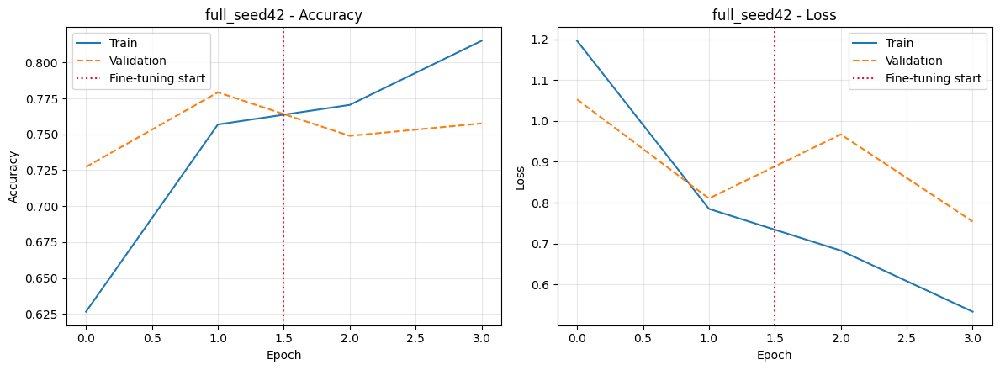

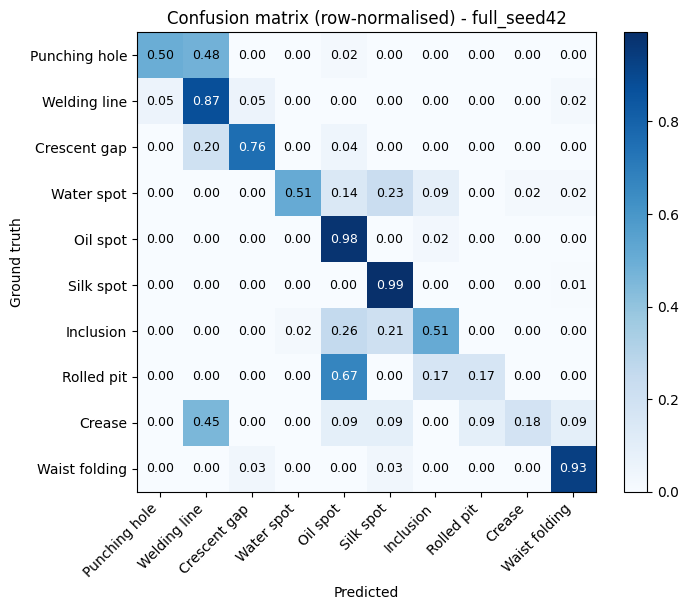

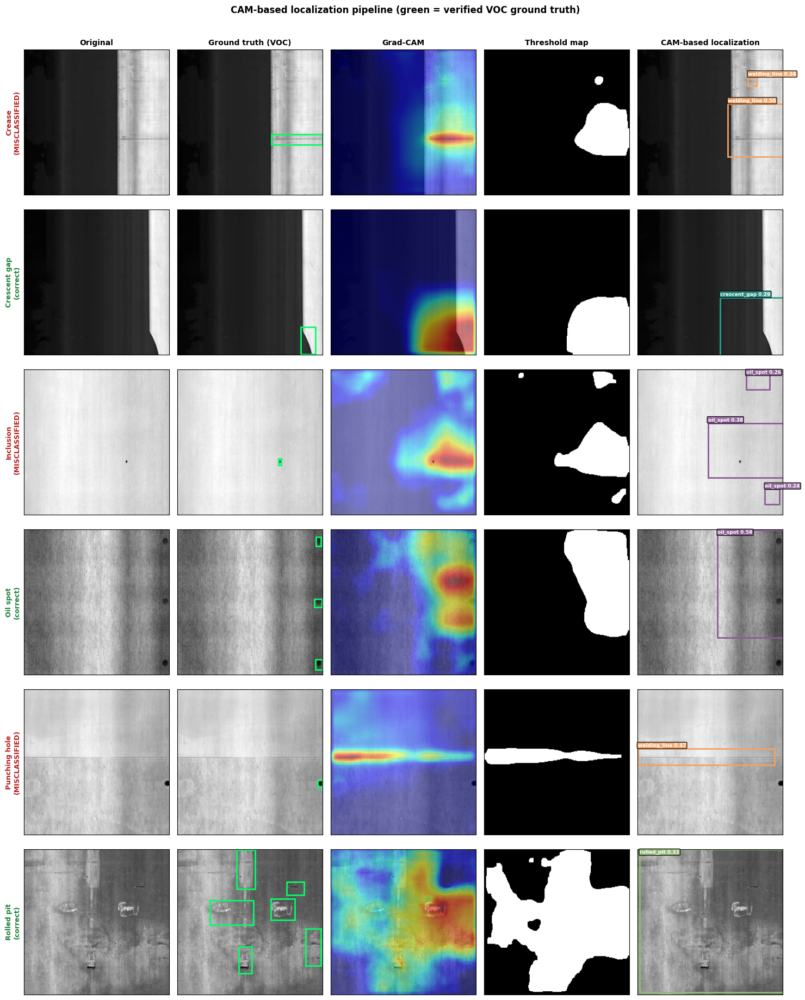

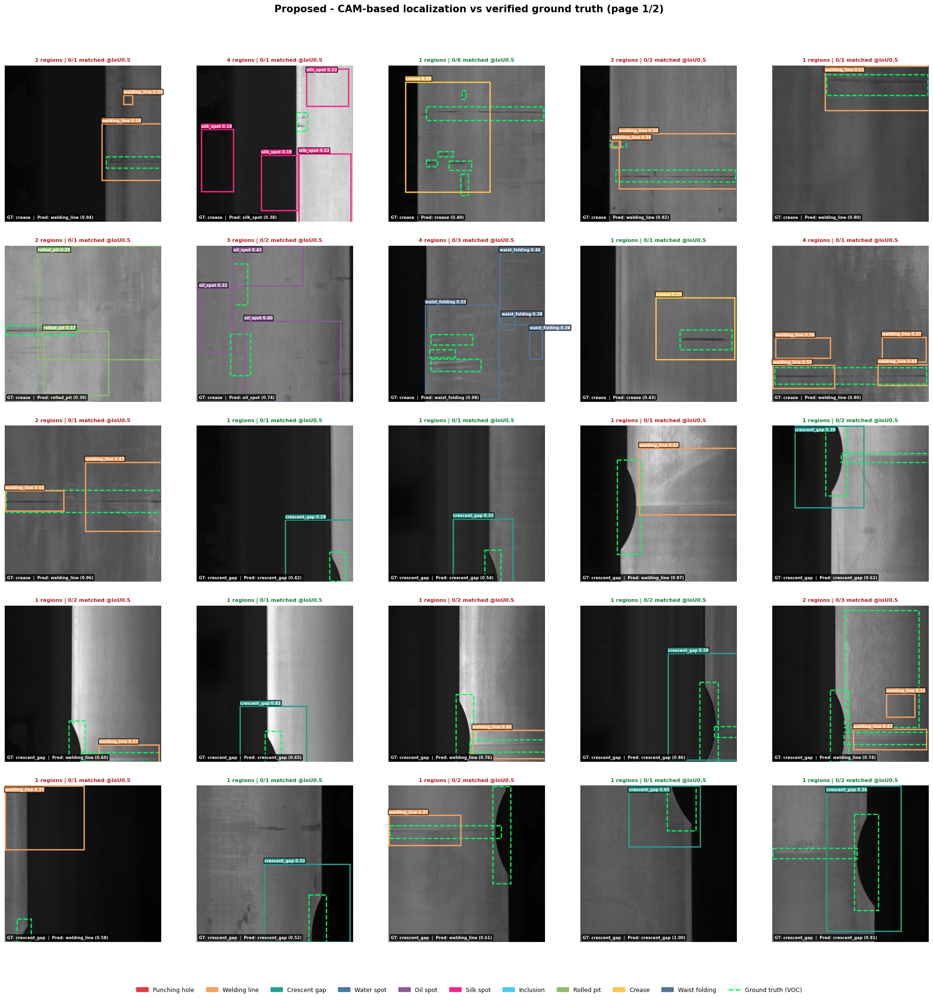

  saved detection_grid_Proposed_page2.png


Mean CSAF level weight per class (rows sum to 1):

               P2 (56x56)  P3 (28x28)  P4 (14x14)  P5 (7x7)
Crease              0.251       0.236       0.245     0.268
Crescent gap        0.256       0.236       0.257     0.251
Inclusion           0.239       0.239       0.229     0.293
Oil spot            0.246       0.236       0.238     0.279
Punching hole       0.252       0.235       0.252     0.262
Rolled pit          0.250       0.238       0.241     0.271
Silk spot           0.233       0.234       0.220     0.314
Waist folding       0.239       0.236       0.229     0.296
Water spot          0.246       0.237       0.233     0.284
Welding line        0.251       0.235       0.252     0.262

Efficiency


Measuring MobileNetV2 (baseline) ...


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.


Measuring MobileNetV2 + FPN ...


Measuring Proposed (full) ...



Measurement environment (state this in the paper):
  platform              : Windows-10-10.0.26200-SP0
  processor             : AMD64 Family 23 Model 24 Stepping 1, AuthenticAMD
  python                : 3.10.11
  tensorflow            : 2.15.0
  numpy                 : 1.26.4
  gpus                  : ['none']
  input_resolution      : 224x224x3
  inference_batch_size  : 1
  ram_gb                : 9.9
  cpu_cores_physical    : 2
  cpu_cores_logical     : 4

Latency: batch=1, 20 warmup + 200 timed runs, median reported.

  NOTE: best measured CPU FPS is 14.9. Do not describe the method as 'real-time' in the manuscript on this evidence -- state the measured FPS and the hardware, and let the reader judge.

                 Model  Params (total)  Params (trainable)  FLOPs (M)  MACs (M)  Size (MiB)  CPU latency ms (median)  CPU latency ms (p95)  CPU FPS
MobileNetV2 (baseline)         2423626              165386     615.27    307.64        9.25                    67.31                 86

                   Config fpn_channels  Params  MACs (M)  CPU FPS
MobileNetV2 backbone only            - 2423626       308     13.4
          Proposed (full)           32 2382812       409     13.3
          Proposed (full)           64 2607660       676     13.9
          Proposed (full)          128 3364580      1688      6.7

Classification comparison (Table A: same split, same schedule)

--- MobileNetV2 ---


  acc=80.69  f1=67.80  params=2,270,794

--- ResNet50 ---


  acc=85.90  f1=81.79  params=23,608,202



Table A saved -> table_classification_comparison.csv
All rows: identical split, augmentation, schedule and seed; each backbone uses its own preprocess_input.

          Model           Task     Init  Accuracy  Precision  Recall    F1     Params  MACs (M)  Latency ms  CPU FPS  Train s
    MobileNetV2 classification ImageNet     80.69      70.11   67.56 67.80  2270794.0     299.9       47.77     21.3    325.0
       ResNet50 classification ImageNet     85.90      86.84   78.90 81.79 23608202.0    3865.2      378.99      3.6   2069.0
Proposed (full) classification      NaN     76.79      75.56   63.96 65.19        NaN       NaN         NaN      NaN      NaN

Table B: literature skeleton (fill from the cited papers, never invent)
Skeleton already exists -> C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\tables\table_literature_gc10_det.csv



Ablation

Skipping Studies A+B (13 rows recovered from prior runs) -- running C-E only.

Study C - dilation isolated from capacity


CAM-based localization over 461 images (CAM layer: seam_features); 892 regions proposed vs 728 ground-truth boxes.


  SEAM 3 branches, NO dilation  (control) acc= 77.22  f1= 65.48  AP50=  2.95  params=3,364,580


CAM-based localization over 461 images (CAM layer: seam_features); 996 regions proposed vs 728 ground-truth boxes.


  SEAM 3 branches, dilated      (proposed) acc= 76.79  f1= 65.19  AP50=  1.82  params=3,364,580


CAM-based localization over 461 images (CAM layer: seam_features); 1013 regions proposed vs 728 ground-truth boxes.


  SEAM 4 branches, NO dilation  (control) acc= 80.69  f1= 69.89  AP50=  0.98  params=3,366,372


CAM-based localization over 461 images (CAM layer: seam_features); 1016 regions proposed vs 728 ground-truth boxes.


  SEAM 4 branches, dilated           acc= 72.45  f1= 58.28  AP50=  0.50  params=3,366,372


CAM-based localization over 461 images (CAM layer: seam_features); 1124 regions proposed vs 728 ground-truth boxes.


  SEAM rates = (1,)                  acc= 75.70  f1= 61.95  AP50=  0.81  params=3,360,996


CAM-based localization over 461 images (CAM layer: seam_features); 1035 regions proposed vs 728 ground-truth boxes.


  SEAM rates = (1, 3)                acc= 75.27  f1= 61.96  AP50=  0.86  params=3,362,788


CAM-based localization over 461 images (CAM layer: seam_features); 1014 regions proposed vs 728 ground-truth boxes.


  SEAM rates = (3, 5, 7)             acc= 78.52  f1= 65.78  AP50=  3.25  params=3,364,580



Study D - attention type inside AMFF


CAM-based localization over 461 images (CAM layer: seam_features); 928 regions proposed vs 728 ground-truth boxes.


  AMFF attention = channel           acc= 68.98  f1= 55.21  AP50=  2.62  params=3,315,131


CAM-based localization over 461 images (CAM layer: seam_features); 861 regions proposed vs 728 ground-truth boxes.


  AMFF attention = spatial           acc= 75.70  f1= 63.22  AP50=  2.91  params=3,302,708


CAM-based localization over 461 images (CAM layer: seam_features); 996 regions proposed vs 728 ground-truth boxes.


  AMFF attention = both              acc= 76.79  f1= 65.19  AP50=  1.82  params=3,364,580



Study E - CSAF fusion strategy (the novelty test)


CAM-based localization over 461 images (CAM layer: seam_features); 839 regions proposed vs 728 ground-truth boxes.


  FPN + addition                     acc= 72.89  f1= 58.49  AP50=  2.87  params=3,298,468


CAM-based localization over 461 images (CAM layer: seam_features); 902 regions proposed vs 728 ground-truth boxes.


  FPN + concatenation                acc= 75.05  f1= 63.21  AP50=  0.86  params=3,364,004


CAM-based localization over 461 images (CAM layer: seam_features); 903 regions proposed vs 728 ground-truth boxes.


  FPN + fixed learned weights        acc= 73.75  f1= 63.86  AP50=  2.83  params=3,298,472


CAM-based localization over 461 images (CAM layer: seam_features); 917 regions proposed vs 728 ground-truth boxes.


  FPN + per-sample gating (no cross-scale) acc= 77.66  f1= 62.01  AP50=  3.85  params=3,315,428


CAM-based localization over 461 images (CAM layer: seam_features); 996 regions proposed vs 728 ground-truth boxes.


  FPN + CSAF (ours)                  acc= 76.79  f1= 65.19  AP50=  1.82  params=3,364,580



Saved -> C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\tables\table_ablation.csv

------------------------------------------------------------------
How to read this table
------------------------------------------------------------------



Dilation isolated (3 branches both sides, 3,364,580 vs 3,364,580 params): accuracy -0.43, macro-F1 -0.29
  -> This pair is the only fair test of dilation: identical
     capacity, dilation the sole difference. Quote THIS delta
     in the paper, not the (1,) vs (1,3,5) gap, which also
     changes the branch count.

CSAF fusion strategy (each step changes one property):
  concat -> fixed  (learned proportion        ) AP50 +1.96
   fixed -> local  (per-sample                ) AP50 +1.02
   local -> csaf   (cross-scale + competition ) AP50 -2.03
  -> the last row IS the paper's claim. If it is ~0, the
     contribution is ordinary gating; withdraw the cross-scale claim.
------------------------------------------------------------------
Merged Studies A+B back in -> 28 total rows in table_ablation.csv.



                   Study                                  Variant  Accuracy  F1_macro  Params     AP50     AP75  mAP50_95 FPN AMFF CSAF SEAM   Fusion        Rates  Branches Dilated    Mode FusionMode
              A: modules                   Baseline (MobileNetV2) 79.826464 71.867240 2423626 2.983076 0.028289  0.880187   N    N    N    N      NaN          NaN       NaN     NaN     NaN        NaN
              A: modules                                    + FPN 76.138829 59.899250 3196618 2.536172 0.072955  0.585029   Y    N    N    N      NaN          NaN       NaN     NaN     NaN        NaN
              A: modules                             + FPN + AMFF 76.355748 62.924248 3358627 0.956406 0.160141  0.263441   Y    Y    N    N      NaN          NaN       NaN     NaN     NaN        NaN
              A: modules                             + FPN + CSAF 75.271150 59.130714 3197194 2.067655 0.049505  0.783937   Y    N    Y    N      NaN          NaN       NaN     NaN     NaN        NaN


Exported 2304 images to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset
wrote C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\data.yaml

=== yolov8n  (imgsz=224, epochs=3) ===


Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)


engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False, pr

Overriding model.yaml nc=80 with nc=10



                   from  n    params  module                                       arguments                     


  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 


  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                


  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             


  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                


  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             


  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               


  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           


  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              


  8                  -1  1    460288  ultralytics.nn.modules.block.C2f             [256, 256, 1, True]           


  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 


 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 12                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384, 128, 1]                 


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 15                  -1  1     37248  ultralytics.nn.modules.block.C2f             [192, 64, 1]                  


 16                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                


 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 18                  -1  1    123648  ultralytics.nn.modules.block.C2f             [192, 128, 1]                 


 19                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              


 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 


 22        [15, 18, 21]  1    753262  ultralytics.nn.modules.head.Detect           [10, [64, 128, 256]]          


Model summary: 129 layers, 3,012,798 parameters, 3,012,782 gradients, 8.2 GFLOPs


Transferred 319/355 items from pretrained weights


Freezing layer 'model.22.dfl.conv.weight'


train: Fast image access  (ping: 0.10.0 ms, read: 0.60.4 MB/s, size: 8.1 KB)


train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train...:   0%|          | 0/1612 [00:00<?, ?it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1 images, 0 backgrounds, 0 corrupt:   0%|          | 1/1612 [00:00<02:58,  9.01it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 12 images, 0 backgrounds, 0 corrupt:   1%|          | 12/1612 [00:00<00:25, 62.83it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 23 images, 0 backgrounds, 0 corrupt:   1%|▏         | 23/1612 [00:00<00:19, 79.80it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 35 images, 0 backgrounds, 0 corrupt:   2%|▏         | 35/1612 [00:00<00:17, 90.03it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 45 images, 0 backgrounds, 0 corrupt:   3%|▎         | 45/1612 [00:00<00:17, 91.46it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 57 images, 0 backgrounds, 0 corrupt:   4%|▎         | 57/1612 [00:00<00:15, 100.27it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 69 images, 0 backgrounds, 0 corrupt:   4%|▍         | 69/1612 [00:00<00:15, 102.34it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 80 images, 0 backgrounds, 0 corrupt:   5%|▍         | 80/1612 [00:00<00:14, 104.32it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 91 images, 0 backgrounds, 0 corrupt:   6%|▌         | 91/1612 [00:00<00:14, 103.44it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 102 images, 0 backgrounds, 0 corrupt:   6%|▋         | 102/1612 [00:01<00:14, 104.24it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 113 images, 0 backgrounds, 0 corrupt:   7%|▋         | 113/1612 [00:01<00:14, 104.36it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 125 images, 0 backgrounds, 0 corrupt:   8%|▊         | 125/1612 [00:01<00:14, 105.58it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 136 images, 0 backgrounds, 0 corrupt:   8%|▊         | 136/1612 [00:01<00:14, 103.50it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 147 images, 0 backgrounds, 0 corrupt:   9%|▉         | 147/1612 [00:01<00:14, 104.05it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 159 images, 0 backgrounds, 0 corrupt:  10%|▉         | 159/1612 [00:01<00:13, 105.03it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 171 images, 0 backgrounds, 0 corrupt:  11%|█         | 171/1612 [00:01<00:13, 106.15it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 183 images, 0 backgrounds, 0 corrupt:  11%|█▏        | 183/1612 [00:01<00:14, 98.38it/s] 

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 196 images, 0 backgrounds, 0 corrupt:  12%|█▏        | 196/1612 [00:01<00:13, 106.75it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 207 images, 0 backgrounds, 0 corrupt:  13%|█▎        | 207/1612 [00:02<00:13, 107.11it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 219 images, 0 backgrounds, 0 corrupt:  14%|█▎        | 219/1612 [00:02<00:13, 106.80it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 231 images, 0 backgrounds, 0 corrupt:  14%|█▍        | 231/1612 [00:02<00:12, 108.52it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 243 images, 0 backgrounds, 0 corrupt:  15%|█▌        | 243/1612 [00:02<00:12, 108.94it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 255 images, 0 backgrounds, 0 corrupt:  16%|█▌        | 255/1612 [00:02<00:12, 110.31it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 267 images, 0 backgrounds, 0 corrupt:  17%|█▋        | 267/1612 [00:02<00:12, 111.20it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 279 images, 0 backgrounds, 0 corrupt:  17%|█▋        | 279/1612 [00:02<00:12, 110.79it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 291 images, 0 backgrounds, 0 corrupt:  18%|█▊        | 291/1612 [00:02<00:11, 110.40it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 303 images, 0 backgrounds, 0 corrupt:  19%|█▉        | 303/1612 [00:02<00:12, 105.70it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 314 images, 0 backgrounds, 0 corrupt:  19%|█▉        | 314/1612 [00:03<00:12, 106.19it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 326 images, 0 backgrounds, 0 corrupt:  20%|██        | 326/1612 [00:03<00:12, 106.67it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 338 images, 0 backgrounds, 0 corrupt:  21%|██        | 338/1612 [00:03<00:11, 107.60it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 350 images, 0 backgrounds, 0 corrupt:  22%|██▏       | 350/1612 [00:03<00:11, 109.64it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 362 images, 0 backgrounds, 0 corrupt:  22%|██▏       | 362/1612 [00:03<00:11, 109.30it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 374 images, 0 backgrounds, 0 corrupt:  23%|██▎       | 374/1612 [00:03<00:11, 108.93it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 386 images, 0 backgrounds, 0 corrupt:  24%|██▍       | 386/1612 [00:03<00:11, 108.52it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 397 images, 0 backgrounds, 0 corrupt:  25%|██▍       | 397/1612 [00:03<00:11, 103.06it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 411 images, 0 backgrounds, 0 corrupt:  25%|██▌       | 411/1612 [00:03<00:10, 111.13it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 423 images, 0 backgrounds, 0 corrupt:  26%|██▌       | 423/1612 [00:04<00:10, 111.22it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 435 images, 0 backgrounds, 0 corrupt:  27%|██▋       | 435/1612 [00:04<00:11, 103.95it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 447 images, 0 backgrounds, 0 corrupt:  28%|██▊       | 447/1612 [00:04<00:11, 105.73it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 458 images, 0 backgrounds, 0 corrupt:  28%|██▊       | 458/1612 [00:04<00:11, 101.67it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 470 images, 0 backgrounds, 0 corrupt:  29%|██▉       | 470/1612 [00:04<00:11, 103.73it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 482 images, 0 backgrounds, 0 corrupt:  30%|██▉       | 482/1612 [00:04<00:10, 108.15it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 493 images, 0 backgrounds, 0 corrupt:  31%|███       | 493/1612 [00:04<00:10, 107.37it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 505 images, 0 backgrounds, 0 corrupt:  31%|███▏      | 505/1612 [00:04<00:10, 108.44it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 517 images, 0 backgrounds, 0 corrupt:  32%|███▏      | 517/1612 [00:04<00:09, 109.56it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 529 images, 0 backgrounds, 0 corrupt:  33%|███▎      | 529/1612 [00:05<00:09, 109.77it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 541 images, 0 backgrounds, 0 corrupt:  34%|███▎      | 541/1612 [00:05<00:09, 109.69it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 553 images, 0 backgrounds, 0 corrupt:  34%|███▍      | 553/1612 [00:05<00:09, 109.29it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 565 images, 0 backgrounds, 0 corrupt:  35%|███▌      | 565/1612 [00:05<00:09, 110.21it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 577 images, 0 backgrounds, 0 corrupt:  36%|███▌      | 577/1612 [00:05<00:09, 112.05it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 590 images, 0 backgrounds, 0 corrupt:  37%|███▋      | 590/1612 [00:05<00:08, 115.00it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 602 images, 0 backgrounds, 0 corrupt:  37%|███▋      | 602/1612 [00:05<00:08, 114.83it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 615 images, 0 backgrounds, 0 corrupt:  38%|███▊      | 615/1612 [00:05<00:08, 118.49it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 627 images, 0 backgrounds, 0 corrupt:  39%|███▉      | 627/1612 [00:05<00:08, 115.47it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 639 images, 0 backgrounds, 0 corrupt:  40%|███▉      | 639/1612 [00:06<00:08, 115.72it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 652 images, 0 backgrounds, 0 corrupt:  40%|████      | 652/1612 [00:06<00:08, 111.82it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 664 images, 0 backgrounds, 0 corrupt:  41%|████      | 664/1612 [00:06<00:08, 112.45it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 676 images, 0 backgrounds, 0 corrupt:  42%|████▏     | 676/1612 [00:06<00:08, 111.96it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 688 images, 0 backgrounds, 0 corrupt:  43%|████▎     | 688/1612 [00:06<00:08, 111.18it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 700 images, 0 backgrounds, 0 corrupt:  43%|████▎     | 700/1612 [00:06<00:08, 110.41it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 712 images, 0 backgrounds, 0 corrupt:  44%|████▍     | 712/1612 [00:06<00:08, 109.20it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 724 images, 0 backgrounds, 0 corrupt:  45%|████▍     | 724/1612 [00:06<00:08, 109.83it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 736 images, 0 backgrounds, 0 corrupt:  46%|████▌     | 736/1612 [00:06<00:07, 109.92it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 748 images, 0 backgrounds, 0 corrupt:  46%|████▋     | 748/1612 [00:07<00:07, 110.14it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 760 images, 0 backgrounds, 0 corrupt:  47%|████▋     | 760/1612 [00:07<00:07, 111.43it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 772 images, 0 backgrounds, 0 corrupt:  48%|████▊     | 772/1612 [00:07<00:07, 111.95it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 784 images, 0 backgrounds, 0 corrupt:  49%|████▊     | 784/1612 [00:07<00:07, 112.25it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 796 images, 0 backgrounds, 0 corrupt:  49%|████▉     | 796/1612 [00:07<00:07, 112.00it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 808 images, 0 backgrounds, 0 corrupt:  50%|█████     | 808/1612 [00:07<00:07, 111.30it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 820 images, 0 backgrounds, 0 corrupt:  51%|█████     | 820/1612 [00:07<00:07, 112.92it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 832 images, 0 backgrounds, 0 corrupt:  52%|█████▏    | 832/1612 [00:07<00:06, 112.65it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 844 images, 0 backgrounds, 0 corrupt:  52%|█████▏    | 844/1612 [00:07<00:06, 111.39it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 856 images, 0 backgrounds, 0 corrupt:  53%|█████▎    | 856/1612 [00:07<00:06, 111.38it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 868 images, 0 backgrounds, 0 corrupt:  54%|█████▍    | 868/1612 [00:08<00:06, 111.51it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 880 images, 0 backgrounds, 0 corrupt:  55%|█████▍    | 880/1612 [00:08<00:06, 106.92it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 892 images, 0 backgrounds, 0 corrupt:  55%|█████▌    | 892/1612 [00:08<00:06, 108.67it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 904 images, 0 backgrounds, 0 corrupt:  56%|█████▌    | 904/1612 [00:08<00:06, 108.34it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 916 images, 0 backgrounds, 0 corrupt:  57%|█████▋    | 916/1612 [00:08<00:06, 109.59it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 928 images, 0 backgrounds, 0 corrupt:  58%|█████▊    | 928/1612 [00:08<00:06, 110.25it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 940 images, 0 backgrounds, 0 corrupt:  58%|█████▊    | 940/1612 [00:08<00:06, 110.16it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 952 images, 0 backgrounds, 0 corrupt:  59%|█████▉    | 952/1612 [00:08<00:06, 109.92it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 964 images, 0 backgrounds, 0 corrupt:  60%|█████▉    | 964/1612 [00:08<00:05, 109.59it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 976 images, 0 backgrounds, 0 corrupt:  61%|██████    | 976/1612 [00:09<00:05, 109.56it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 988 images, 0 backgrounds, 0 corrupt:  61%|██████▏   | 988/1612 [00:09<00:05, 109.05it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1000 images, 0 backgrounds, 0 corrupt:  62%|██████▏   | 1000/1612 [00:09<00:05, 111.14it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1013 images, 0 backgrounds, 0 corrupt:  63%|██████▎   | 1013/1612 [00:09<00:05, 112.52it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1025 images, 0 backgrounds, 0 corrupt:  64%|██████▎   | 1025/1612 [00:09<00:05, 112.94it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1037 images, 0 backgrounds, 0 corrupt:  64%|██████▍   | 1037/1612 [00:09<00:05, 113.92it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1049 images, 0 backgrounds, 0 corrupt:  65%|██████▌   | 1049/1612 [00:09<00:04, 114.29it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1061 images, 0 backgrounds, 0 corrupt:  66%|██████▌   | 1061/1612 [00:09<00:04, 111.95it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1073 images, 0 backgrounds, 0 corrupt:  67%|██████▋   | 1073/1612 [00:09<00:04, 111.48it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1085 images, 0 backgrounds, 0 corrupt:  67%|██████▋   | 1085/1612 [00:10<00:04, 111.32it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1097 images, 0 backgrounds, 0 corrupt:  68%|██████▊   | 1097/1612 [00:10<00:04, 111.59it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1109 images, 0 backgrounds, 0 corrupt:  69%|██████▉   | 1109/1612 [00:10<00:04, 110.75it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1121 images, 0 backgrounds, 0 corrupt:  70%|██████▉   | 1121/1612 [00:10<00:04, 111.21it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1133 images, 0 backgrounds, 0 corrupt:  70%|███████   | 1133/1612 [00:10<00:04, 113.25it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1145 images, 0 backgrounds, 0 corrupt:  71%|███████   | 1145/1612 [00:10<00:04, 113.32it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1157 images, 0 backgrounds, 0 corrupt:  72%|███████▏  | 1157/1612 [00:10<00:03, 113.82it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1169 images, 0 backgrounds, 0 corrupt:  73%|███████▎  | 1169/1612 [00:10<00:03, 112.79it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1181 images, 0 backgrounds, 0 corrupt:  73%|███████▎  | 1181/1612 [00:10<00:03, 110.22it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1193 images, 0 backgrounds, 0 corrupt:  74%|███████▍  | 1193/1612 [00:11<00:03, 112.01it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1205 images, 0 backgrounds, 0 corrupt:  75%|███████▍  | 1205/1612 [00:11<00:03, 112.66it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1217 images, 0 backgrounds, 0 corrupt:  75%|███████▌  | 1217/1612 [00:11<00:03, 111.32it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1229 images, 0 backgrounds, 0 corrupt:  76%|███████▌  | 1229/1612 [00:11<00:03, 111.16it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1241 images, 0 backgrounds, 0 corrupt:  77%|███████▋  | 1241/1612 [00:11<00:03, 110.93it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1253 images, 0 backgrounds, 0 corrupt:  78%|███████▊  | 1253/1612 [00:11<00:03, 111.58it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1265 images, 0 backgrounds, 0 corrupt:  78%|███████▊  | 1265/1612 [00:11<00:03, 111.55it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1277 images, 0 backgrounds, 0 corrupt:  79%|███████▉  | 1277/1612 [00:11<00:03, 109.77it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1289 images, 0 backgrounds, 0 corrupt:  80%|███████▉  | 1289/1612 [00:11<00:02, 110.77it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1301 images, 0 backgrounds, 0 corrupt:  81%|████████  | 1301/1612 [00:11<00:02, 110.62it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1314 images, 0 backgrounds, 0 corrupt:  82%|████████▏ | 1314/1612 [00:12<00:02, 113.83it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1326 images, 0 backgrounds, 0 corrupt:  82%|████████▏ | 1326/1612 [00:12<00:02, 113.39it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1338 images, 0 backgrounds, 0 corrupt:  83%|████████▎ | 1338/1612 [00:12<00:02, 112.07it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1350 images, 0 backgrounds, 0 corrupt:  84%|████████▎ | 1350/1612 [00:12<00:02, 111.97it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1362 images, 0 backgrounds, 0 corrupt:  84%|████████▍ | 1362/1612 [00:12<00:02, 112.57it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1374 images, 0 backgrounds, 0 corrupt:  85%|████████▌ | 1374/1612 [00:12<00:02, 114.52it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1386 images, 0 backgrounds, 0 corrupt:  86%|████████▌ | 1386/1612 [00:12<00:01, 113.77it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1398 images, 0 backgrounds, 0 corrupt:  87%|████████▋ | 1398/1612 [00:12<00:01, 111.58it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1410 images, 0 backgrounds, 0 corrupt:  87%|████████▋ | 1410/1612 [00:12<00:01, 110.58it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1422 images, 0 backgrounds, 0 corrupt:  88%|████████▊ | 1422/1612 [00:13<00:01, 110.28it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1434 images, 0 backgrounds, 0 corrupt:  89%|████████▉ | 1434/1612 [00:13<00:01, 110.90it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1446 images, 0 backgrounds, 0 corrupt:  90%|████████▉ | 1446/1612 [00:13<00:01, 111.24it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1458 images, 0 backgrounds, 0 corrupt:  90%|█████████ | 1458/1612 [00:13<00:01, 105.97it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1469 images, 0 backgrounds, 0 corrupt:  91%|█████████ | 1469/1612 [00:13<00:01, 106.01it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1480 images, 0 backgrounds, 0 corrupt:  92%|█████████▏| 1480/1612 [00:13<00:01, 106.91it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1491 images, 0 backgrounds, 0 corrupt:  92%|█████████▏| 1491/1612 [00:13<00:01, 107.28it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1502 images, 0 backgrounds, 0 corrupt:  93%|█████████▎| 1502/1612 [00:13<00:01, 107.29it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1514 images, 0 backgrounds, 0 corrupt:  94%|█████████▍| 1514/1612 [00:13<00:00, 107.44it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1526 images, 0 backgrounds, 0 corrupt:  95%|█████████▍| 1526/1612 [00:14<00:00, 108.39it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1538 images, 0 backgrounds, 0 corrupt:  95%|█████████▌| 1538/1612 [00:14<00:00, 108.75it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1551 images, 0 backgrounds, 0 corrupt:  96%|█████████▌| 1551/1612 [00:14<00:00, 112.30it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1563 images, 0 backgrounds, 0 corrupt:  97%|█████████▋| 1563/1612 [00:14<00:00, 112.21it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1575 images, 0 backgrounds, 0 corrupt:  98%|█████████▊| 1575/1612 [00:14<00:00, 112.32it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1587 images, 0 backgrounds, 0 corrupt:  98%|█████████▊| 1587/1612 [00:14<00:00, 112.02it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1599 images, 0 backgrounds, 0 corrupt:  99%|█████████▉| 1599/1612 [00:14<00:00, 111.59it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1611 images, 0 backgrounds, 0 corrupt: 100%|█████████▉| 1611/1612 [00:14<00:00, 112.12it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train... 1612 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1612/1612 [00:14<00:00, 109.05it/s]

train: New cache created: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access  (ping: 0.10.0 ms, read: 0.60.1 MB/s, size: 5.9 KB)


C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val...:   0%|          | 0/231 [00:00<?, ?it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 6 images, 0 backgrounds, 0 corrupt:   3%|▎         | 6/231 [00:00<00:05, 41.36it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 21 images, 0 backgrounds, 0 corrupt:   9%|▉         | 21/231 [00:00<00:02, 89.63it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 32 images, 0 backgrounds, 0 corrupt:  14%|█▍        | 32/231 [00:00<00:02, 97.08it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 44 images, 0 backgrounds, 0 corrupt:  19%|█▉        | 44/231 [00:00<00:01, 104.32it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 55 images, 0 backgrounds, 0 corrupt:  24%|██▍       | 55/231 [00:00<00:01, 105.06it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 68 images, 0 backgrounds, 0 corrupt:  29%|██▉       | 68/231 [00:00<00:01, 112.23it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 80 images, 0 backgrounds, 0 corrupt:  35%|███▍      | 80/231 [00:00<00:01, 111.68it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 92 images, 0 backgrounds, 0 corrupt:  40%|███▉      | 92/231 [00:00<00:01, 112.33it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 104 images, 0 backgrounds, 0 corrupt:  45%|████▌     | 104/231 [00:01<00:01, 108.77it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 116 images, 0 backgrounds, 0 corrupt:  50%|█████     | 116/231 [00:01<00:01, 109.30it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 128 images, 0 backgrounds, 0 corrupt:  55%|█████▌    | 128/231 [00:01<00:00, 109.23it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 140 images, 0 backgrounds, 0 corrupt:  61%|██████    | 140/231 [00:01<00:00, 111.60it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 152 images, 0 backgrounds, 0 corrupt:  66%|██████▌   | 152/231 [00:01<00:00, 110.74it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 164 images, 0 backgrounds, 0 corrupt:  71%|███████   | 164/231 [00:01<00:00, 111.35it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 176 images, 0 backgrounds, 0 corrupt:  76%|███████▌  | 176/231 [00:01<00:00, 111.23it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 188 images, 0 backgrounds, 0 corrupt:  81%|████████▏ | 188/231 [00:01<00:00, 111.38it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 200 images, 0 backgrounds, 0 corrupt:  87%|████████▋ | 200/231 [00:01<00:00, 111.91it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 212 images, 0 backgrounds, 0 corrupt:  92%|█████████▏| 212/231 [00:01<00:00, 110.83it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 224 images, 0 backgrounds, 0 corrupt:  97%|█████████▋| 224/231 [00:02<00:00, 110.11it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val... 231 images, 0 backgrounds, 0 corrupt: 100%|██████████| 231/231 [00:02<00:00, 108.14it/s]

val: New cache created: C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val.cache


C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Plotting labels to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolov8n\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 


optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)


2026/09/24 00:07:15 INFO mlflow.tracking.fluent: Experiment with name 'C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs' does not exist. Creating a new experiment.


2026/09/24 00:07:15 INFO mlflow.bedrock: Enabled auto-tracing for Bedrock. Note that MLflow can only trace boto3 service clients that are created after this call. If you have already created one, please recreate the client by calling `boto3.client`.


2026/09/24 00:07:15 INFO mlflow.tracking.fluent: Autologging successfully enabled for boto3.


2026/09/24 00:07:16 INFO mlflow.tracking.fluent: Autologging successfully enabled for keras.


2026/09/24 00:07:34 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


2026/09/24 00:07:34 INFO mlflow.tracking.fluent: Autologging successfully enabled for tensorflow.


2026/09/24 00:07:34 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.


2026/09/24 00:07:34 INFO mlflow.tracking.fluent: Autologging successfully enabled for pyspark.


MLflow: logging run_id(5d66b08cc86449f7a30289aa3a10dea8) to runs\mlflow


MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs\mlflow'


MLflow: disable with 'yolo settings mlflow=False'


Image sizes 224 train, 224 val
Using 0 dataloader workers
Logging results to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolov8n
Starting training for 3 epochs...



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]

        1/3         0G       2.99      4.838      2.032         95        224:   0%|          | 0/51 [00:21<?, ?it/s]

        1/3         0G       2.99      4.838      2.032         95        224:   2%|▏         | 1/51 [00:21<18:02, 21.64s/it]

        1/3         0G       3.04      4.744      2.088        100        224:   2%|▏         | 1/51 [00:27<18:02, 21.64s/it]

        1/3         0G       3.04      4.744      2.088        100        224:   4%|▍         | 2/51 [00:27<10:07, 12.40s/it]

        1/3         0G      3.033      4.768      2.102         83        224:   4%|▍         | 2/51 [00:32<10:07, 12.40s/it]

        1/3         0G      3.033      4.768      2.102         83        224:   6%|▌         | 3/51 [00:32<07:09,  8.95s/it]

        1/3         0G       3.01      4.724      2.125         85        224:   6%|▌         | 3/51 [00:37<07:09,  8.95s/it]

        1/3         0G       3.01      4.724      2.125         85        224:   8%|▊         | 4/51 [00:37<05:50,  7.46s/it]

        1/3         0G      2.964      4.708       2.11         97        224:   8%|▊         | 4/51 [00:42<05:50,  7.46s/it]

        1/3         0G      2.964      4.708       2.11         97        224:  10%|▉         | 5/51 [00:42<05:03,  6.59s/it]

        1/3         0G       3.03      4.715      2.164         88        224:  10%|▉         | 5/51 [00:47<05:03,  6.59s/it]

        1/3         0G       3.03      4.715      2.164         88        224:  12%|█▏        | 6/51 [00:47<04:30,  6.01s/it]

        1/3         0G       3.02      4.717      2.172         73        224:  12%|█▏        | 6/51 [00:52<04:30,  6.01s/it]

        1/3         0G       3.02      4.717      2.172         73        224:  14%|█▎        | 7/51 [00:52<04:06,  5.60s/it]

        1/3         0G      2.997      4.712      2.155         85        224:  14%|█▎        | 7/51 [00:56<04:06,  5.60s/it]

        1/3         0G      2.997      4.712      2.155         85        224:  16%|█▌        | 8/51 [00:56<03:47,  5.28s/it]

        1/3         0G      2.953      4.691       2.14         80        224:  16%|█▌        | 8/51 [01:01<03:47,  5.28s/it]

        1/3         0G      2.953      4.691       2.14         80        224:  18%|█▊        | 9/51 [01:01<03:32,  5.06s/it]

        1/3         0G      2.911      4.692      2.123         79        224:  18%|█▊        | 9/51 [01:06<03:32,  5.06s/it]

        1/3         0G      2.911      4.692      2.123         79        224:  20%|█▉        | 10/51 [01:06<03:23,  4.97s/it]

        1/3         0G      2.895      4.688      2.116         97        224:  20%|█▉        | 10/51 [01:10<03:23,  4.97s/it]

        1/3         0G      2.895      4.688      2.116         97        224:  22%|██▏       | 11/51 [01:10<03:15,  4.88s/it]

        1/3         0G      2.868      4.682      2.102         84        224:  22%|██▏       | 11/51 [01:15<03:15,  4.88s/it]

        1/3         0G      2.868      4.682      2.102         84        224:  24%|██▎       | 12/51 [01:15<03:06,  4.79s/it]

        1/3         0G      2.848      4.681      2.088         76        224:  24%|██▎       | 12/51 [01:19<03:06,  4.79s/it]

        1/3         0G      2.848      4.681      2.088         76        224:  25%|██▌       | 13/51 [01:19<02:58,  4.70s/it]

        1/3         0G      2.817      4.675      2.062         72        224:  25%|██▌       | 13/51 [01:24<02:58,  4.70s/it]

        1/3         0G      2.817      4.675      2.062         72        224:  27%|██▋       | 14/51 [01:24<02:50,  4.62s/it]

        1/3         0G      2.797      4.668      2.047         93        224:  27%|██▋       | 14/51 [01:28<02:50,  4.62s/it]

        1/3         0G      2.797      4.668      2.047         93        224:  29%|██▉       | 15/51 [01:28<02:42,  4.52s/it]

        1/3         0G      2.787      4.668      2.044         76        224:  29%|██▉       | 15/51 [01:33<02:42,  4.52s/it]

        1/3         0G      2.787      4.668      2.044         76        224:  31%|███▏      | 16/51 [01:33<02:44,  4.69s/it]

        1/3         0G      2.774      4.662      2.032         87        224:  31%|███▏      | 16/51 [01:38<02:44,  4.69s/it]

        1/3         0G      2.774      4.662      2.032         87        224:  33%|███▎      | 17/51 [01:38<02:44,  4.84s/it]

        1/3         0G      2.752      4.657      2.022         67        224:  33%|███▎      | 17/51 [01:43<02:44,  4.84s/it]

        1/3         0G      2.752      4.657      2.022         67        224:  35%|███▌      | 18/51 [01:43<02:39,  4.82s/it]

        1/3         0G      2.737      4.647      2.006         86        224:  35%|███▌      | 18/51 [01:48<02:39,  4.82s/it]

        1/3         0G      2.737      4.647      2.006         86        224:  37%|███▋      | 19/51 [01:48<02:31,  4.74s/it]

        1/3         0G      2.721      4.637      1.987         84        224:  37%|███▋      | 19/51 [01:52<02:31,  4.74s/it]

        1/3         0G      2.721      4.637      1.987         84        224:  39%|███▉      | 20/51 [01:52<02:23,  4.64s/it]

        1/3         0G      2.701      4.629      1.975         89        224:  39%|███▉      | 20/51 [01:57<02:23,  4.64s/it]

        1/3         0G      2.701      4.629      1.975         89        224:  41%|████      | 21/51 [01:57<02:17,  4.57s/it]

        1/3         0G      2.689      4.624      1.965         79        224:  41%|████      | 21/51 [02:01<02:17,  4.57s/it]

        1/3         0G      2.689      4.624      1.965         79        224:  43%|████▎     | 22/51 [02:01<02:10,  4.49s/it]

        1/3         0G       2.66       4.61      1.948         75        224:  43%|████▎     | 22/51 [02:05<02:10,  4.49s/it]

        1/3         0G       2.66       4.61      1.948         75        224:  45%|████▌     | 23/51 [02:05<02:03,  4.42s/it]

        1/3         0G      2.648      4.601      1.938         80        224:  45%|████▌     | 23/51 [02:09<02:03,  4.42s/it]

        1/3         0G      2.648      4.601      1.938         80        224:  47%|████▋     | 24/51 [02:09<01:58,  4.39s/it]

        1/3         0G       2.63       4.59      1.927         74        224:  47%|████▋     | 24/51 [02:14<01:58,  4.39s/it]

        1/3         0G       2.63       4.59      1.927         74        224:  49%|████▉     | 25/51 [02:14<01:57,  4.51s/it]

        1/3         0G      2.611      4.581      1.914         85        224:  49%|████▉     | 25/51 [02:19<01:57,  4.51s/it]

        1/3         0G      2.611      4.581      1.914         85        224:  51%|█████     | 26/51 [02:19<01:55,  4.64s/it]

        1/3         0G      2.597      4.569      1.904         75        224:  51%|█████     | 26/51 [02:24<01:55,  4.64s/it]

        1/3         0G      2.597      4.569      1.904         75        224:  53%|█████▎    | 27/51 [02:24<01:54,  4.79s/it]

        1/3         0G       2.58      4.554      1.894         61        224:  53%|█████▎    | 27/51 [02:30<01:54,  4.79s/it]

        1/3         0G       2.58      4.554      1.894         61        224:  55%|█████▍    | 28/51 [02:30<01:53,  4.94s/it]

        1/3         0G       2.57      4.544      1.887         73        224:  55%|█████▍    | 28/51 [02:34<01:53,  4.94s/it]

        1/3         0G       2.57      4.544      1.887         73        224:  57%|█████▋    | 29/51 [02:34<01:45,  4.78s/it]

        1/3         0G       2.56      4.529      1.879         77        224:  57%|█████▋    | 29/51 [02:39<01:45,  4.78s/it]

        1/3         0G       2.56      4.529      1.879         77        224:  59%|█████▉    | 30/51 [02:39<01:39,  4.75s/it]

        1/3         0G      2.548      4.514      1.871         97        224:  59%|█████▉    | 30/51 [02:43<01:39,  4.75s/it]

        1/3         0G      2.548      4.514      1.871         97        224:  61%|██████    | 31/51 [02:43<01:34,  4.74s/it]

        1/3         0G       2.54      4.499      1.867         78        224:  61%|██████    | 31/51 [02:48<01:34,  4.74s/it]

        1/3         0G       2.54      4.499      1.867         78        224:  63%|██████▎   | 32/51 [02:48<01:29,  4.70s/it]

        1/3         0G      2.528      4.475      1.857         73        224:  63%|██████▎   | 32/51 [02:53<01:29,  4.70s/it]

        1/3         0G      2.528      4.475      1.857         73        224:  65%|██████▍   | 33/51 [02:53<01:23,  4.65s/it]

        1/3         0G      2.518      4.451      1.848         86        224:  65%|██████▍   | 33/51 [02:57<01:23,  4.65s/it]

        1/3         0G      2.518      4.451      1.848         86        224:  67%|██████▋   | 34/51 [02:57<01:19,  4.66s/it]

        1/3         0G      2.504      4.433      1.841         85        224:  67%|██████▋   | 34/51 [03:02<01:19,  4.66s/it]

        1/3         0G      2.504      4.433      1.841         85        224:  69%|██████▊   | 35/51 [03:02<01:14,  4.65s/it]

        1/3         0G      2.497      4.422      1.835         96        224:  69%|██████▊   | 35/51 [03:07<01:14,  4.65s/it]

        1/3         0G      2.497      4.422      1.835         96        224:  71%|███████   | 36/51 [03:07<01:09,  4.66s/it]

        1/3         0G      2.488      4.408      1.829        100        224:  71%|███████   | 36/51 [03:11<01:09,  4.66s/it]

        1/3         0G      2.488      4.408      1.829        100        224:  73%|███████▎  | 37/51 [03:11<01:05,  4.69s/it]

        1/3         0G      2.478      4.391      1.823         71        224:  73%|███████▎  | 37/51 [03:16<01:05,  4.69s/it]

        1/3         0G      2.478      4.391      1.823         71        224:  75%|███████▍  | 38/51 [03:16<01:01,  4.69s/it]

        1/3         0G      2.471      4.378      1.817         76        224:  75%|███████▍  | 38/51 [03:21<01:01,  4.69s/it]

        1/3         0G      2.471      4.378      1.817         76        224:  76%|███████▋  | 39/51 [03:21<00:55,  4.66s/it]

        1/3         0G      2.464      4.358       1.81         94        224:  76%|███████▋  | 39/51 [03:25<00:55,  4.66s/it]

        1/3         0G      2.464      4.358       1.81         94        224:  78%|███████▊  | 40/51 [03:25<00:51,  4.65s/it]

        1/3         0G      2.459      4.342      1.804         88        224:  78%|███████▊  | 40/51 [03:30<00:51,  4.65s/it]

        1/3         0G      2.459      4.342      1.804         88        224:  80%|████████  | 41/51 [03:30<00:46,  4.63s/it]

        1/3         0G      2.452      4.327        1.8         78        224:  80%|████████  | 41/51 [03:34<00:46,  4.63s/it]

        1/3         0G      2.452      4.327        1.8         78        224:  82%|████████▏ | 42/51 [03:34<00:41,  4.63s/it]

        1/3         0G      2.444      4.305      1.795         75        224:  82%|████████▏ | 42/51 [03:39<00:41,  4.63s/it]

        1/3         0G      2.444      4.305      1.795         75        224:  84%|████████▍ | 43/51 [03:39<00:37,  4.63s/it]

        1/3         0G      2.433       4.28      1.785         90        224:  84%|████████▍ | 43/51 [03:44<00:37,  4.63s/it]

        1/3         0G      2.433       4.28      1.785         90        224:  86%|████████▋ | 44/51 [03:44<00:32,  4.63s/it]

        1/3         0G       2.43      4.262      1.781         72        224:  86%|████████▋ | 44/51 [03:48<00:32,  4.63s/it]

        1/3         0G       2.43      4.262      1.781         72        224:  88%|████████▊ | 45/51 [03:48<00:27,  4.62s/it]

        1/3         0G      2.427      4.237      1.777         75        224:  88%|████████▊ | 45/51 [03:53<00:27,  4.62s/it]

        1/3         0G      2.427      4.237      1.777         75        224:  90%|█████████ | 46/51 [03:53<00:23,  4.61s/it]

        1/3         0G      2.419      4.221      1.773         89        224:  90%|█████████ | 46/51 [03:57<00:23,  4.61s/it]

        1/3         0G      2.419      4.221      1.773         89        224:  92%|█████████▏| 47/51 [03:57<00:18,  4.60s/it]

        1/3         0G      2.414        4.2      1.769         78        224:  92%|█████████▏| 47/51 [04:02<00:18,  4.60s/it]

        1/3         0G      2.414        4.2      1.769         78        224:  94%|█████████▍| 48/51 [04:02<00:13,  4.61s/it]

        1/3         0G      2.405      4.179      1.762         83        224:  94%|█████████▍| 48/51 [04:07<00:13,  4.61s/it]

        1/3         0G      2.405      4.179      1.762         83        224:  96%|█████████▌| 49/51 [04:07<00:09,  4.61s/it]

        1/3         0G      2.399      4.156      1.757         78        224:  96%|█████████▌| 49/51 [04:12<00:09,  4.61s/it]

        1/3         0G      2.399      4.156      1.757         78        224:  98%|█████████▊| 50/51 [04:12<00:04,  4.71s/it]

        1/3         0G      2.397      4.141      1.755         35        224:  98%|█████████▊| 50/51 [04:23<00:04,  4.71s/it]

        1/3         0G      2.397      4.141      1.755         35        224: 100%|██████████| 51/51 [04:23<00:00,  6.81s/it]

        1/3         0G      2.397      4.141      1.755         35        224: 100%|██████████| 51/51 [04:23<00:00,  5.17s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:08<00:26,  8.76s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:12<00:11,  5.83s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:16<00:04,  4.84s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:18<00:00,  3.96s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:18<00:00,  4.70s/it]

                   all        231        357    0.00269      0.438      0.148     0.0611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]

        2/3         0G      2.542      3.505      1.731         95        224:   0%|          | 0/51 [00:04<?, ?it/s]

        2/3         0G      2.542      3.505      1.731         95        224:   2%|▏         | 1/51 [00:04<03:58,  4.77s/it]

        2/3         0G       2.23      3.251      1.572         95        224:   2%|▏         | 1/51 [00:09<03:58,  4.77s/it]

        2/3         0G       2.23      3.251      1.572         95        224:   4%|▍         | 2/51 [00:09<03:54,  4.78s/it]

        2/3         0G      2.192      3.278      1.559        105        224:   4%|▍         | 2/51 [00:14<03:54,  4.78s/it]

        2/3         0G      2.192      3.278      1.559        105        224:   6%|▌         | 3/51 [00:14<03:44,  4.67s/it]

        2/3         0G      2.152      3.238      1.528         83        224:   6%|▌         | 3/51 [00:18<03:44,  4.67s/it]

        2/3         0G      2.152      3.238      1.528         83        224:   8%|▊         | 4/51 [00:18<03:36,  4.61s/it]

        2/3         0G      2.106      3.206      1.528         73        224:   8%|▊         | 4/51 [00:23<03:36,  4.61s/it]

        2/3         0G      2.106      3.206      1.528         73        224:  10%|▉         | 5/51 [00:23<03:30,  4.57s/it]

        2/3         0G      2.134      3.213      1.534         96        224:  10%|▉         | 5/51 [00:27<03:30,  4.57s/it]

        2/3         0G      2.134      3.213      1.534         96        224:  12%|█▏        | 6/51 [00:27<03:24,  4.55s/it]

        2/3         0G      2.121      3.191      1.525         97        224:  12%|█▏        | 6/51 [00:32<03:24,  4.55s/it]

        2/3         0G      2.121      3.191      1.525         97        224:  14%|█▎        | 7/51 [00:32<03:21,  4.57s/it]

        2/3         0G       2.11      3.182       1.52         80        224:  14%|█▎        | 7/51 [00:36<03:21,  4.57s/it]

        2/3         0G       2.11      3.182       1.52         80        224:  16%|█▌        | 8/51 [00:36<03:15,  4.56s/it]

        2/3         0G      2.109      3.166      1.518        100        224:  16%|█▌        | 8/51 [00:41<03:15,  4.56s/it]

        2/3         0G      2.109      3.166      1.518        100        224:  18%|█▊        | 9/51 [00:41<03:09,  4.52s/it]

        2/3         0G      2.107      3.179      1.522         80        224:  18%|█▊        | 9/51 [00:45<03:09,  4.52s/it]

        2/3         0G      2.107      3.179      1.522         80        224:  20%|█▉        | 10/51 [00:45<03:04,  4.51s/it]

        2/3         0G      2.104      3.145       1.52         84        224:  20%|█▉        | 10/51 [00:50<03:04,  4.51s/it]

        2/3         0G      2.104      3.145       1.52         84        224:  22%|██▏       | 11/51 [00:50<03:00,  4.50s/it]

        2/3         0G      2.092      3.117      1.516         73        224:  22%|██▏       | 11/51 [00:54<03:00,  4.50s/it]

        2/3         0G      2.092      3.117      1.516         73        224:  24%|██▎       | 12/51 [00:54<02:55,  4.50s/it]

        2/3         0G      2.077      3.087      1.512         75        224:  24%|██▎       | 12/51 [00:59<02:55,  4.50s/it]

        2/3         0G      2.077      3.087      1.512         75        224:  25%|██▌       | 13/51 [00:59<02:51,  4.51s/it]

        2/3         0G      2.097      3.073      1.515         85        224:  25%|██▌       | 13/51 [01:03<02:51,  4.51s/it]

        2/3         0G      2.097      3.073      1.515         85        224:  27%|██▋       | 14/51 [01:03<02:47,  4.53s/it]

        2/3         0G      2.093      3.058      1.514         90        224:  27%|██▋       | 14/51 [01:08<02:47,  4.53s/it]

        2/3         0G      2.093      3.058      1.514         90        224:  29%|██▉       | 15/51 [01:08<02:48,  4.69s/it]

        2/3         0G      2.095      3.036       1.51         97        224:  29%|██▉       | 15/51 [01:13<02:48,  4.69s/it]

        2/3         0G      2.095      3.036       1.51         97        224:  31%|███▏      | 16/51 [01:13<02:43,  4.66s/it]

        2/3         0G      2.097      3.023      1.509         91        224:  31%|███▏      | 16/51 [01:17<02:43,  4.66s/it]

        2/3         0G      2.097      3.023      1.509         91        224:  33%|███▎      | 17/51 [01:17<02:36,  4.60s/it]

        2/3         0G        2.1      3.009      1.507         88        224:  33%|███▎      | 17/51 [01:22<02:36,  4.60s/it]

        2/3         0G        2.1      3.009      1.507         88        224:  35%|███▌      | 18/51 [01:22<02:31,  4.59s/it]

        2/3         0G      2.091      2.993        1.5         82        224:  35%|███▌      | 18/51 [01:26<02:31,  4.59s/it]

        2/3         0G      2.091      2.993        1.5         82        224:  37%|███▋      | 19/51 [01:26<02:24,  4.53s/it]

        2/3         0G      2.089      2.971      1.497         89        224:  37%|███▋      | 19/51 [01:31<02:24,  4.53s/it]

        2/3         0G      2.089      2.971      1.497         89        224:  39%|███▉      | 20/51 [01:31<02:19,  4.51s/it]

        2/3         0G       2.09      2.957      1.496         83        224:  39%|███▉      | 20/51 [01:35<02:19,  4.51s/it]

        2/3         0G       2.09      2.957      1.496         83        224:  41%|████      | 21/51 [01:35<02:15,  4.50s/it]

        2/3         0G      2.087      2.934      1.495         79        224:  41%|████      | 21/51 [01:40<02:15,  4.50s/it]

        2/3         0G      2.087      2.934      1.495         79        224:  43%|████▎     | 22/51 [01:40<02:10,  4.50s/it]

        2/3         0G      2.081      2.915      1.492         81        224:  43%|████▎     | 22/51 [01:44<02:10,  4.50s/it]

        2/3         0G      2.081      2.915      1.492         81        224:  45%|████▌     | 23/51 [01:44<02:05,  4.47s/it]

        2/3         0G      2.074      2.912      1.487         69        224:  45%|████▌     | 23/51 [01:49<02:05,  4.47s/it]

        2/3         0G      2.074      2.912      1.487         69        224:  47%|████▋     | 24/51 [01:49<02:00,  4.47s/it]

        2/3         0G      2.084      2.904      1.491         78        224:  47%|████▋     | 24/51 [01:53<02:00,  4.47s/it]

        2/3         0G      2.084      2.904      1.491         78        224:  49%|████▉     | 25/51 [01:53<01:57,  4.51s/it]

        2/3         0G      2.084      2.886      1.491        105        224:  49%|████▉     | 25/51 [01:58<01:57,  4.51s/it]

        2/3         0G      2.084      2.886      1.491        105        224:  51%|█████     | 26/51 [01:58<01:54,  4.58s/it]

        2/3         0G      2.092      2.877        1.5         73        224:  51%|█████     | 26/51 [02:03<01:54,  4.58s/it]

        2/3         0G      2.092      2.877        1.5         73        224:  53%|█████▎    | 27/51 [02:03<01:49,  4.56s/it]

        2/3         0G      2.102      2.867      1.504        103        224:  53%|█████▎    | 27/51 [02:07<01:49,  4.56s/it]

        2/3         0G      2.102      2.867      1.504        103        224:  55%|█████▍    | 28/51 [02:07<01:45,  4.59s/it]

        2/3         0G      2.109       2.87      1.507         64        224:  55%|█████▍    | 28/51 [02:12<01:45,  4.59s/it]

        2/3         0G      2.109       2.87      1.507         64        224:  57%|█████▋    | 29/51 [02:12<01:41,  4.60s/it]

        2/3         0G      2.114      2.864      1.508         73        224:  57%|█████▋    | 29/51 [02:16<01:41,  4.60s/it]

        2/3         0G      2.114      2.864      1.508         73        224:  59%|█████▉    | 30/51 [02:16<01:35,  4.57s/it]

        2/3         0G      2.114      2.867      1.508         72        224:  59%|█████▉    | 30/51 [02:21<01:35,  4.57s/it]

        2/3         0G      2.114      2.867      1.508         72        224:  61%|██████    | 31/51 [02:21<01:29,  4.47s/it]

        2/3         0G      2.114      2.865      1.511         78        224:  61%|██████    | 31/51 [02:25<01:29,  4.47s/it]

        2/3         0G      2.114      2.865      1.511         78        224:  63%|██████▎   | 32/51 [02:25<01:24,  4.46s/it]

        2/3         0G      2.115      2.852      1.516         59        224:  63%|██████▎   | 32/51 [02:29<01:24,  4.46s/it]

        2/3         0G      2.115      2.852      1.516         59        224:  65%|██████▍   | 33/51 [02:29<01:18,  4.39s/it]

        2/3         0G      2.113      2.849      1.513         69        224:  65%|██████▍   | 33/51 [02:34<01:18,  4.39s/it]

        2/3         0G      2.113      2.849      1.513         69        224:  67%|██████▋   | 34/51 [02:34<01:14,  4.39s/it]

        2/3         0G      2.109      2.846       1.51         70        224:  67%|██████▋   | 34/51 [02:38<01:14,  4.39s/it]

        2/3         0G      2.109      2.846       1.51         70        224:  69%|██████▊   | 35/51 [02:38<01:09,  4.33s/it]

        2/3         0G       2.11      2.841       1.51         84        224:  69%|██████▊   | 35/51 [02:42<01:09,  4.33s/it]

        2/3         0G       2.11      2.841       1.51         84        224:  71%|███████   | 36/51 [02:42<01:05,  4.35s/it]

        2/3         0G      2.112      2.837      1.512         76        224:  71%|███████   | 36/51 [02:46<01:05,  4.35s/it]

        2/3         0G      2.112      2.837      1.512         76        224:  73%|███████▎  | 37/51 [02:46<01:00,  4.30s/it]

        2/3         0G      2.108      2.836       1.51         88        224:  73%|███████▎  | 37/51 [02:51<01:00,  4.30s/it]

        2/3         0G      2.108      2.836       1.51         88        224:  75%|███████▍  | 38/51 [02:51<00:56,  4.32s/it]

        2/3         0G      2.107      2.833      1.509         94        224:  75%|███████▍  | 38/51 [02:55<00:56,  4.32s/it]

        2/3         0G      2.107      2.833      1.509         94        224:  76%|███████▋  | 39/51 [02:55<00:52,  4.35s/it]

        2/3         0G      2.101      2.828      1.505         78        224:  76%|███████▋  | 39/51 [03:00<00:52,  4.35s/it]

        2/3         0G      2.101      2.828      1.505         78        224:  78%|███████▊  | 40/51 [03:00<00:48,  4.42s/it]

        2/3         0G      2.098      2.823      1.504         77        224:  78%|███████▊  | 40/51 [03:04<00:48,  4.42s/it]

        2/3         0G      2.098      2.823      1.504         77        224:  80%|████████  | 41/51 [03:04<00:44,  4.42s/it]

        2/3         0G      2.098      2.814      1.501         80        224:  80%|████████  | 41/51 [03:09<00:44,  4.42s/it]

        2/3         0G      2.098      2.814      1.501         80        224:  82%|████████▏ | 42/51 [03:09<00:40,  4.48s/it]

        2/3         0G      2.095      2.811      1.499         76        224:  82%|████████▏ | 42/51 [03:13<00:40,  4.48s/it]

        2/3         0G      2.095      2.811      1.499         76        224:  84%|████████▍ | 43/51 [03:13<00:35,  4.47s/it]

        2/3         0G      2.091      2.809      1.496         73        224:  84%|████████▍ | 43/51 [03:18<00:35,  4.47s/it]

        2/3         0G      2.091      2.809      1.496         73        224:  86%|████████▋ | 44/51 [03:18<00:31,  4.52s/it]

        2/3         0G      2.091      2.809      1.496         81        224:  86%|████████▋ | 44/51 [03:22<00:31,  4.52s/it]

        2/3         0G      2.091      2.809      1.496         81        224:  88%|████████▊ | 45/51 [03:22<00:27,  4.51s/it]

        2/3         0G      2.093      2.807      1.496        109        224:  88%|████████▊ | 45/51 [03:27<00:27,  4.51s/it]

        2/3         0G      2.093      2.807      1.496        109        224:  90%|█████████ | 46/51 [03:27<00:22,  4.54s/it]

        2/3         0G      2.093      2.801      1.494         77        224:  90%|█████████ | 46/51 [03:31<00:22,  4.54s/it]

        2/3         0G      2.093      2.801      1.494         77        224:  92%|█████████▏| 47/51 [03:31<00:18,  4.51s/it]

        2/3         0G      2.091      2.798      1.492         73        224:  92%|█████████▏| 47/51 [03:36<00:18,  4.51s/it]

        2/3         0G      2.091      2.798      1.492         73        224:  94%|█████████▍| 48/51 [03:36<00:13,  4.52s/it]

        2/3         0G      2.096      2.793      1.493         78        224:  94%|█████████▍| 48/51 [03:40<00:13,  4.52s/it]

        2/3         0G      2.096      2.793      1.493         78        224:  96%|█████████▌| 49/51 [03:40<00:08,  4.49s/it]

        2/3         0G      2.092      2.789      1.491         72        224:  96%|█████████▌| 49/51 [03:45<00:08,  4.49s/it]

        2/3         0G      2.092      2.789      1.491         72        224:  98%|█████████▊| 50/51 [03:45<00:04,  4.50s/it]

        2/3         0G      2.091      2.786      1.491         20        224:  98%|█████████▊| 50/51 [03:46<00:04,  4.50s/it]

        2/3         0G      2.091      2.786      1.491         20        224: 100%|██████████| 51/51 [03:46<00:00,  3.63s/it]

        2/3         0G      2.091      2.786      1.491         20        224: 100%|██████████| 51/51 [03:46<00:00,  4.45s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:10,  3.61s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:07<00:07,  3.58s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:10<00:03,  3.53s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  3.03s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  3.23s/it]

                   all        231        357      0.471       0.26      0.247      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]

        3/3         0G      2.127      2.682      1.522         68        224:   0%|          | 0/51 [00:04<?, ?it/s]

        3/3         0G      2.127      2.682      1.522         68        224:   2%|▏         | 1/51 [00:04<03:28,  4.17s/it]

        3/3         0G      2.026      2.622      1.466         57        224:   2%|▏         | 1/51 [00:08<03:28,  4.17s/it]

        3/3         0G      2.026      2.622      1.466         57        224:   4%|▍         | 2/51 [00:08<03:27,  4.24s/it]

        3/3         0G      2.084      2.665      1.476         99        224:   4%|▍         | 2/51 [00:13<03:27,  4.24s/it]

        3/3         0G      2.084      2.665      1.476         99        224:   6%|▌         | 3/51 [00:13<03:31,  4.41s/it]

        3/3         0G      2.029      2.592      1.469         96        224:   6%|▌         | 3/51 [00:17<03:31,  4.41s/it]

        3/3         0G      2.029      2.592      1.469         96        224:   8%|▊         | 4/51 [00:17<03:26,  4.40s/it]

        3/3         0G      2.036      2.599      1.464         71        224:   8%|▊         | 4/51 [00:21<03:26,  4.40s/it]

        3/3         0G      2.036      2.599      1.464         71        224:  10%|▉         | 5/51 [00:21<03:23,  4.43s/it]

        3/3         0G      2.039      2.585      1.466        112        224:  10%|▉         | 5/51 [00:26<03:23,  4.43s/it]

        3/3         0G      2.039      2.585      1.466        112        224:  12%|█▏        | 6/51 [00:26<03:19,  4.44s/it]

        3/3         0G      2.047      2.612      1.458         79        224:  12%|█▏        | 6/51 [00:31<03:19,  4.44s/it]

        3/3         0G      2.047      2.612      1.458         79        224:  14%|█▎        | 7/51 [00:31<03:20,  4.55s/it]

        3/3         0G      2.028      2.597      1.444         74        224:  14%|█▎        | 7/51 [00:35<03:20,  4.55s/it]

        3/3         0G      2.028      2.597      1.444         74        224:  16%|█▌        | 8/51 [00:35<03:16,  4.57s/it]

        3/3         0G      2.023      2.572      1.435         81        224:  16%|█▌        | 8/51 [00:40<03:16,  4.57s/it]

        3/3         0G      2.023      2.572      1.435         81        224:  18%|█▊        | 9/51 [00:40<03:12,  4.58s/it]

        3/3         0G      2.019      2.544      1.429         78        224:  18%|█▊        | 9/51 [00:44<03:12,  4.58s/it]

        3/3         0G      2.019      2.544      1.429         78        224:  20%|█▉        | 10/51 [00:44<03:06,  4.55s/it]

        3/3         0G      2.018       2.54      1.433         75        224:  20%|█▉        | 10/51 [00:49<03:06,  4.55s/it]

        3/3         0G      2.018       2.54      1.433         75        224:  22%|██▏       | 11/51 [00:49<03:01,  4.54s/it]

        3/3         0G       2.02      2.539      1.441         79        224:  22%|██▏       | 11/51 [00:53<03:01,  4.54s/it]

        3/3         0G       2.02      2.539      1.441         79        224:  24%|██▎       | 12/51 [00:53<02:55,  4.50s/it]

        3/3         0G      2.019      2.516      1.441         80        224:  24%|██▎       | 12/51 [00:58<02:55,  4.50s/it]

        3/3         0G      2.019      2.516      1.441         80        224:  25%|██▌       | 13/51 [00:58<02:51,  4.51s/it]

        3/3         0G      2.023        2.5      1.444         93        224:  25%|██▌       | 13/51 [01:03<02:51,  4.51s/it]

        3/3         0G      2.023        2.5      1.444         93        224:  27%|██▋       | 14/51 [01:03<02:55,  4.75s/it]

        3/3         0G       2.02      2.499      1.442        101        224:  27%|██▋       | 14/51 [01:10<02:55,  4.75s/it]

        3/3         0G       2.02      2.499      1.442        101        224:  29%|██▉       | 15/51 [01:10<03:10,  5.30s/it]

        3/3         0G      2.016      2.491      1.444         76        224:  29%|██▉       | 15/51 [01:15<03:10,  5.30s/it]

        3/3         0G      2.016      2.491      1.444         76        224:  31%|███▏      | 16/51 [01:15<03:08,  5.40s/it]

        3/3         0G      2.011       2.49      1.444         78        224:  31%|███▏      | 16/51 [01:20<03:08,  5.40s/it]

        3/3         0G      2.011       2.49      1.444         78        224:  33%|███▎      | 17/51 [01:20<02:56,  5.18s/it]

        3/3         0G      2.009      2.481      1.442         84        224:  33%|███▎      | 17/51 [01:24<02:56,  5.18s/it]

        3/3         0G      2.009      2.481      1.442         84        224:  35%|███▌      | 18/51 [01:24<02:42,  4.91s/it]

        3/3         0G          2      2.477      1.435         87        224:  35%|███▌      | 18/51 [01:29<02:42,  4.91s/it]

        3/3         0G          2      2.477      1.435         87        224:  37%|███▋      | 19/51 [01:29<02:35,  4.87s/it]

        3/3         0G      1.994      2.479      1.431         79        224:  37%|███▋      | 19/51 [01:33<02:35,  4.87s/it]

        3/3         0G      1.994      2.479      1.431         79        224:  39%|███▉      | 20/51 [01:33<02:25,  4.71s/it]

        3/3         0G      1.997      2.497      1.436         91        224:  39%|███▉      | 20/51 [01:38<02:25,  4.71s/it]

        3/3         0G      1.997      2.497      1.436         91        224:  41%|████      | 21/51 [01:38<02:18,  4.61s/it]

        3/3         0G      1.996      2.492      1.437         72        224:  41%|████      | 21/51 [01:42<02:18,  4.61s/it]

        3/3         0G      1.996      2.492      1.437         72        224:  43%|████▎     | 22/51 [01:42<02:10,  4.50s/it]

        3/3         0G      1.996      2.494      1.438         78        224:  43%|████▎     | 22/51 [01:46<02:10,  4.50s/it]

        3/3         0G      1.996      2.494      1.438         78        224:  45%|████▌     | 23/51 [01:46<02:04,  4.46s/it]

        3/3         0G      1.993      2.495      1.437         62        224:  45%|████▌     | 23/51 [01:51<02:04,  4.46s/it]

        3/3         0G      1.993      2.495      1.437         62        224:  47%|████▋     | 24/51 [01:51<01:59,  4.41s/it]

        3/3         0G      1.995      2.488      1.436         91        224:  47%|████▋     | 24/51 [01:55<01:59,  4.41s/it]

        3/3         0G      1.995      2.488      1.436         91        224:  49%|████▉     | 25/51 [01:55<01:54,  4.39s/it]

        3/3         0G      1.998      2.483       1.44         75        224:  49%|████▉     | 25/51 [01:59<01:54,  4.39s/it]

        3/3         0G      1.998      2.483       1.44         75        224:  51%|█████     | 26/51 [01:59<01:49,  4.36s/it]

        3/3         0G      1.996      2.482       1.44         79        224:  51%|█████     | 26/51 [02:04<01:49,  4.36s/it]

        3/3         0G      1.996      2.482       1.44         79        224:  53%|█████▎    | 27/51 [02:04<01:45,  4.41s/it]

        3/3         0G      1.989      2.486      1.437         79        224:  53%|█████▎    | 27/51 [02:08<01:45,  4.41s/it]

        3/3         0G      1.989      2.486      1.437         79        224:  55%|█████▍    | 28/51 [02:08<01:41,  4.40s/it]

        3/3         0G       1.98      2.485      1.437         72        224:  55%|█████▍    | 28/51 [02:13<01:41,  4.40s/it]

        3/3         0G       1.98      2.485      1.437         72        224:  57%|█████▋    | 29/51 [02:13<01:37,  4.43s/it]

        3/3         0G      1.982      2.486      1.436         75        224:  57%|█████▋    | 29/51 [02:17<01:37,  4.43s/it]

        3/3         0G      1.982      2.486      1.436         75        224:  59%|█████▉    | 30/51 [02:17<01:32,  4.42s/it]

        3/3         0G      1.977       2.48      1.434         76        224:  59%|█████▉    | 30/51 [02:22<01:32,  4.42s/it]

        3/3         0G      1.977       2.48      1.434         76        224:  61%|██████    | 31/51 [02:22<01:29,  4.46s/it]

        3/3         0G      1.975      2.479       1.43         99        224:  61%|██████    | 31/51 [02:26<01:29,  4.46s/it]

        3/3         0G      1.975      2.479       1.43         99        224:  63%|██████▎   | 32/51 [02:26<01:24,  4.45s/it]

        3/3         0G      1.968      2.473      1.429         74        224:  63%|██████▎   | 32/51 [02:31<01:24,  4.45s/it]

        3/3         0G      1.968      2.473      1.429         74        224:  65%|██████▍   | 33/51 [02:31<01:20,  4.48s/it]

        3/3         0G      1.968      2.468      1.428         85        224:  65%|██████▍   | 33/51 [02:35<01:20,  4.48s/it]

        3/3         0G      1.968      2.468      1.428         85        224:  67%|██████▋   | 34/51 [02:35<01:15,  4.47s/it]

        3/3         0G       1.97      2.465      1.428         90        224:  67%|██████▋   | 34/51 [02:40<01:15,  4.47s/it]

        3/3         0G       1.97      2.465      1.428         90        224:  69%|██████▊   | 35/51 [02:40<01:11,  4.48s/it]

        3/3         0G      1.976      2.465      1.429         75        224:  69%|██████▊   | 35/51 [02:44<01:11,  4.48s/it]

        3/3         0G      1.976      2.465      1.429         75        224:  71%|███████   | 36/51 [02:44<01:06,  4.45s/it]

        3/3         0G      1.976      2.459      1.428         70        224:  71%|███████   | 36/51 [02:49<01:06,  4.45s/it]

        3/3         0G      1.976      2.459      1.428         70        224:  73%|███████▎  | 37/51 [02:49<01:03,  4.53s/it]

        3/3         0G      1.974      2.458      1.426         68        224:  73%|███████▎  | 37/51 [02:53<01:03,  4.53s/it]

        3/3         0G      1.974      2.458      1.426         68        224:  75%|███████▍  | 38/51 [02:53<00:58,  4.51s/it]

        3/3         0G      1.974      2.455      1.425         87        224:  75%|███████▍  | 38/51 [02:58<00:58,  4.51s/it]

        3/3         0G      1.974      2.455      1.425         87        224:  76%|███████▋  | 39/51 [02:58<00:54,  4.51s/it]

        3/3         0G      1.971      2.452      1.423         91        224:  76%|███████▋  | 39/51 [03:02<00:54,  4.51s/it]

        3/3         0G      1.971      2.452      1.423         91        224:  78%|███████▊  | 40/51 [03:02<00:49,  4.50s/it]

        3/3         0G      1.971       2.45      1.421         93        224:  78%|███████▊  | 40/51 [03:07<00:49,  4.50s/it]

        3/3         0G      1.971       2.45      1.421         93        224:  80%|████████  | 41/51 [03:07<00:45,  4.51s/it]

        3/3         0G      1.967      2.454      1.418         78        224:  80%|████████  | 41/51 [03:11<00:45,  4.51s/it]

        3/3         0G      1.967      2.454      1.418         78        224:  82%|████████▏ | 42/51 [03:11<00:40,  4.49s/it]

        3/3         0G      1.964      2.455      1.417         83        224:  82%|████████▏ | 42/51 [03:16<00:40,  4.49s/it]

        3/3         0G      1.964      2.455      1.417         83        224:  84%|████████▍ | 43/51 [03:16<00:35,  4.50s/it]

        3/3         0G      1.963      2.453      1.418         91        224:  84%|████████▍ | 43/51 [03:20<00:35,  4.50s/it]

        3/3         0G      1.963      2.453      1.418         91        224:  86%|████████▋ | 44/51 [03:20<00:31,  4.46s/it]

        3/3         0G      1.963      2.455      1.421         71        224:  86%|████████▋ | 44/51 [03:25<00:31,  4.46s/it]

        3/3         0G      1.963      2.455      1.421         71        224:  88%|████████▊ | 45/51 [03:25<00:27,  4.53s/it]

        3/3         0G      1.962      2.451      1.422         79        224:  88%|████████▊ | 45/51 [03:29<00:27,  4.53s/it]

        3/3         0G      1.962      2.451      1.422         79        224:  90%|█████████ | 46/51 [03:29<00:22,  4.54s/it]

        3/3         0G      1.961      2.452      1.421         90        224:  90%|█████████ | 46/51 [03:34<00:22,  4.54s/it]

        3/3         0G      1.961      2.452      1.421         90        224:  92%|█████████▏| 47/51 [03:34<00:18,  4.59s/it]

        3/3         0G       1.96      2.448      1.421         71        224:  92%|█████████▏| 47/51 [03:38<00:18,  4.59s/it]

        3/3         0G       1.96      2.448      1.421         71        224:  94%|█████████▍| 48/51 [03:38<00:13,  4.54s/it]

        3/3         0G       1.96      2.446      1.422         73        224:  94%|█████████▍| 48/51 [03:43<00:13,  4.54s/it]

        3/3         0G       1.96      2.446      1.422         73        224:  96%|█████████▌| 49/51 [03:43<00:09,  4.55s/it]

        3/3         0G      1.956      2.444      1.422         92        224:  96%|█████████▌| 49/51 [03:47<00:09,  4.55s/it]

        3/3         0G      1.956      2.444      1.422         92        224:  98%|█████████▊| 50/51 [03:47<00:04,  4.51s/it]

        3/3         0G      1.963      2.448       1.43         22        224:  98%|█████████▊| 50/51 [03:49<00:04,  4.51s/it]

        3/3         0G      1.963      2.448       1.43         22        224: 100%|██████████| 51/51 [03:49<00:00,  3.74s/it]

        3/3         0G      1.963      2.448       1.43         22        224: 100%|██████████| 51/51 [03:49<00:00,  4.51s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:10,  3.47s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:07<00:07,  3.58s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:10<00:03,  3.50s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  3.03s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  3.21s/it]

                   all        231        357      0.589      0.381      0.298      0.134



3 epochs completed in 0.214 hours.


Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolov8n\weights\last.pt, 6.2MB


Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolov8n\weights\best.pt, 6.2MB



Validating C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolov8n\weights\best.pt...


Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)


Model summary (fused): 72 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:09,  3.17s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:06<00:06,  3.33s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:10<00:03,  3.44s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  3.06s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  3.17s/it]

                   all        231        357      0.588      0.383      0.298      0.134


Speed: 0.4ms preprocess, 43.7ms inference, 0.0ms loss, 1.8ms postprocess per image


Results saved to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolov8n


MLflow: results logged to runs\mlflow
MLflow: disable with 'yolo settings mlflow=False'


  AP50=27.52  AP75=8.20  mAP50:95=11.68  params=3,007,598

=== yolo11n  (imgsz=224, epochs=3) ===
Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)


engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo11n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False, pr

Overriding model.yaml nc=80 with nc=10



                   from  n    params  module                                       arguments                     


  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 


  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                


  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      


  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                


  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     


  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              


  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           


  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              


  8                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           


  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 


 10                  -1  1    249728  ultralytics.nn.modules.block.C2PSA           [256, 256, 1]                 


 11                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 12             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 13                  -1  1    111296  ultralytics.nn.modules.block.C3k2            [384, 128, 1, False]          


 14                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 15             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  1     32096  ultralytics.nn.modules.block.C3k2            [256, 64, 1, False]           


 17                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                


 18            [-1, 13]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 19                  -1  1     86720  ultralytics.nn.modules.block.C3k2            [192, 128, 1, False]          


 20                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              


 21            [-1, 10]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 22                  -1  1    378880  ultralytics.nn.modules.block.C3k2            [384, 256, 1, True]           


 23        [16, 19, 22]  1    432622  ultralytics.nn.modules.head.Detect           [10, [64, 128, 256]]          


YOLO11n summary: 181 layers, 2,591,790 parameters, 2,591,774 gradients, 6.5 GFLOPs


Transferred 448/499 items from pretrained weights


Freezing layer 'model.23.dfl.conv.weight'


train: Fast image access  (ping: 0.10.0 ms, read: 38.312.8 MB/s, size: 8.1 KB)


train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train.cache... 1612 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1612/1612 [00:00<?, ?it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train.cache... 1612 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1612/1612 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access  (ping: 0.10.0 ms, read: 27.67.6 MB/s, size: 5.9 KB)



C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val.cache... 231 images, 0 backgrounds, 0 corrupt: 100%|██████████| 231/231 [00:00<?, ?it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val.cache... 231 images, 0 backgrounds, 0 corrupt: 100%|██████████| 231/231 [00:00<?, ?it/s]


C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Plotting labels to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo11n\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 


optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)


2026/09/24 00:22:37 INFO mlflow.bedrock: Enabled auto-tracing for Bedrock. Note that MLflow can only trace boto3 service clients that are created after this call. If you have already created one, please recreate the client by calling `boto3.client`.


2026/09/24 00:22:37 INFO mlflow.tracking.fluent: Autologging successfully enabled for boto3.


2026/09/24 00:22:37 INFO mlflow.tracking.fluent: Autologging successfully enabled for keras.


2026/09/24 00:22:38 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


2026/09/24 00:22:38 INFO mlflow.tracking.fluent: Autologging successfully enabled for tensorflow.


2026/09/24 00:22:38 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.


2026/09/24 00:22:38 INFO mlflow.tracking.fluent: Autologging successfully enabled for pyspark.


MLflow: logging run_id(b3883041b4604e88bf4b60496a06d114) to runs\mlflow


MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs\mlflow'


MLflow: disable with 'yolo settings mlflow=False'


Image sizes 224 train, 224 val
Using 0 dataloader workers
Logging results to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo11n
Starting training for 3 epochs...



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]

        1/3         0G      3.042      4.677      2.024         81        224:   0%|          | 0/51 [00:05<?, ?it/s]

        1/3         0G      3.042      4.677      2.024         81        224:   2%|▏         | 1/51 [00:05<04:53,  5.87s/it]

        1/3         0G      3.015       4.64      2.039         92        224:   2%|▏         | 1/51 [00:10<04:53,  5.87s/it]

        1/3         0G      3.015       4.64      2.039         92        224:   4%|▍         | 2/51 [00:10<04:00,  4.90s/it]

        1/3         0G      3.047      4.634      2.071         73        224:   4%|▍         | 2/51 [00:14<04:00,  4.90s/it]

        1/3         0G      3.047      4.634      2.071         73        224:   6%|▌         | 3/51 [00:14<03:45,  4.70s/it]

        1/3         0G      3.026      4.636      2.099         91        224:   6%|▌         | 3/51 [00:18<03:45,  4.70s/it]

        1/3         0G      3.026      4.636      2.099         91        224:   8%|▊         | 4/51 [00:18<03:32,  4.53s/it]

        1/3         0G      2.996       4.63      2.105         86        224:   8%|▊         | 4/51 [00:23<03:32,  4.53s/it]

        1/3         0G      2.996       4.63      2.105         86        224:  10%|▉         | 5/51 [00:23<03:22,  4.41s/it]

        1/3         0G      2.942      4.615      2.092         84        224:  10%|▉         | 5/51 [00:27<03:22,  4.41s/it]

        1/3         0G      2.942      4.615      2.092         84        224:  12%|█▏        | 6/51 [00:27<03:13,  4.31s/it]

        1/3         0G      2.927      4.609      2.089         85        224:  12%|█▏        | 6/51 [00:31<03:13,  4.31s/it]

        1/3         0G      2.927      4.609      2.089         85        224:  14%|█▎        | 7/51 [00:31<03:04,  4.20s/it]

        1/3         0G      2.891        4.6      2.069         72        224:  14%|█▎        | 7/51 [00:35<03:04,  4.20s/it]

        1/3         0G      2.891        4.6      2.069         72        224:  16%|█▌        | 8/51 [00:35<03:00,  4.21s/it]

        1/3         0G      2.863       4.59       2.06         89        224:  16%|█▌        | 8/51 [00:39<03:00,  4.21s/it]

        1/3         0G      2.863       4.59       2.06         89        224:  18%|█▊        | 9/51 [00:39<02:56,  4.19s/it]

        1/3         0G      2.861      4.591      2.056         96        224:  18%|█▊        | 9/51 [00:43<02:56,  4.19s/it]

        1/3         0G      2.861      4.591      2.056         96        224:  20%|█▉        | 10/51 [00:43<02:52,  4.21s/it]

        1/3         0G       2.89      4.598      2.075         89        224:  20%|█▉        | 10/51 [00:47<02:52,  4.21s/it]

        1/3         0G       2.89      4.598      2.075         89        224:  22%|██▏       | 11/51 [00:47<02:47,  4.18s/it]

        1/3         0G      2.876      4.602      2.062        100        224:  22%|██▏       | 11/51 [00:51<02:47,  4.18s/it]

        1/3         0G      2.876      4.602      2.062        100        224:  24%|██▎       | 12/51 [00:51<02:42,  4.16s/it]

        1/3         0G       2.88      4.607      2.064         65        224:  24%|██▎       | 12/51 [00:56<02:42,  4.16s/it]

        1/3         0G       2.88      4.607      2.064         65        224:  25%|██▌       | 13/51 [00:56<02:38,  4.17s/it]

        1/3         0G      2.869      4.604      2.053         76        224:  25%|██▌       | 13/51 [01:00<02:38,  4.17s/it]

        1/3         0G      2.869      4.604      2.053         76        224:  27%|██▋       | 14/51 [01:00<02:35,  4.19s/it]

        1/3         0G      2.849        4.6      2.042         87        224:  27%|██▋       | 14/51 [01:04<02:35,  4.19s/it]

        1/3         0G      2.849        4.6      2.042         87        224:  29%|██▉       | 15/51 [01:04<02:30,  4.18s/it]

        1/3         0G      2.837        4.6      2.036         91        224:  29%|██▉       | 15/51 [01:08<02:30,  4.18s/it]

        1/3         0G      2.837        4.6      2.036         91        224:  31%|███▏      | 16/51 [01:08<02:26,  4.19s/it]

        1/3         0G      2.828      4.599      2.035         76        224:  31%|███▏      | 16/51 [01:13<02:26,  4.19s/it]

        1/3         0G      2.828      4.599      2.035         76        224:  33%|███▎      | 17/51 [01:13<02:22,  4.20s/it]

        1/3         0G      2.814      4.597      2.028         74        224:  33%|███▎      | 17/51 [01:17<02:22,  4.20s/it]

        1/3         0G      2.814      4.597      2.028         74        224:  35%|███▌      | 18/51 [01:17<02:18,  4.19s/it]

        1/3         0G      2.806      4.591      2.028         63        224:  35%|███▌      | 18/51 [01:21<02:18,  4.19s/it]

        1/3         0G      2.806      4.591      2.028         63        224:  37%|███▋      | 19/51 [01:21<02:13,  4.16s/it]

        1/3         0G      2.778      4.588      2.013         75        224:  37%|███▋      | 19/51 [01:25<02:13,  4.16s/it]

        1/3         0G      2.778      4.588      2.013         75        224:  39%|███▉      | 20/51 [01:25<02:10,  4.20s/it]

        1/3         0G      2.768      4.587          2         82        224:  39%|███▉      | 20/51 [01:29<02:10,  4.20s/it]

        1/3         0G      2.768      4.587          2         82        224:  41%|████      | 21/51 [01:29<02:05,  4.18s/it]

        1/3         0G      2.747      4.581      1.988         84        224:  41%|████      | 21/51 [01:33<02:05,  4.18s/it]

        1/3         0G      2.747      4.581      1.988         84        224:  43%|████▎     | 22/51 [01:33<02:01,  4.18s/it]

        1/3         0G      2.725      4.575      1.973        104        224:  43%|████▎     | 22/51 [01:38<02:01,  4.18s/it]

        1/3         0G      2.725      4.575      1.973        104        224:  45%|████▌     | 23/51 [01:38<01:57,  4.18s/it]

        1/3         0G      2.703       4.57      1.959         93        224:  45%|████▌     | 23/51 [01:42<01:57,  4.18s/it]

        1/3         0G      2.703       4.57      1.959         93        224:  47%|████▋     | 24/51 [01:42<01:52,  4.18s/it]

        1/3         0G      2.682      4.565      1.945         86        224:  47%|████▋     | 24/51 [01:46<01:52,  4.18s/it]

        1/3         0G      2.682      4.565      1.945         86        224:  49%|████▉     | 25/51 [01:46<01:47,  4.14s/it]

        1/3         0G      2.663       4.56      1.931         82        224:  49%|████▉     | 25/51 [01:50<01:47,  4.14s/it]

        1/3         0G      2.663       4.56      1.931         82        224:  51%|█████     | 26/51 [01:50<01:44,  4.16s/it]

        1/3         0G      2.647      4.551      1.916         75        224:  51%|█████     | 26/51 [01:54<01:44,  4.16s/it]

        1/3         0G      2.647      4.551      1.916         75        224:  53%|█████▎    | 27/51 [01:54<01:39,  4.16s/it]

        1/3         0G      2.623      4.544      1.906         86        224:  53%|█████▎    | 27/51 [01:58<01:39,  4.16s/it]

        1/3         0G      2.623      4.544      1.906         86        224:  55%|█████▍    | 28/51 [01:58<01:36,  4.20s/it]

        1/3         0G       2.61      4.538      1.898         83        224:  55%|█████▍    | 28/51 [02:03<01:36,  4.20s/it]

        1/3         0G       2.61      4.538      1.898         83        224:  57%|█████▋    | 29/51 [02:03<01:32,  4.20s/it]

        1/3         0G      2.596      4.532      1.889         70        224:  57%|█████▋    | 29/51 [02:07<01:32,  4.20s/it]

        1/3         0G      2.596      4.532      1.889         70        224:  59%|█████▉    | 30/51 [02:07<01:28,  4.19s/it]

        1/3         0G      2.581      4.523      1.882         81        224:  59%|█████▉    | 30/51 [02:11<01:28,  4.19s/it]

        1/3         0G      2.581      4.523      1.882         81        224:  61%|██████    | 31/51 [02:11<01:23,  4.18s/it]

        1/3         0G      2.571      4.514      1.876         88        224:  61%|██████    | 31/51 [02:15<01:23,  4.18s/it]

        1/3         0G      2.571      4.514      1.876         88        224:  63%|██████▎   | 32/51 [02:15<01:19,  4.19s/it]

        1/3         0G      2.558      4.504      1.868         72        224:  63%|██████▎   | 32/51 [02:19<01:19,  4.19s/it]

        1/3         0G      2.558      4.504      1.868         72        224:  65%|██████▍   | 33/51 [02:19<01:14,  4.15s/it]

        1/3         0G      2.541      4.497      1.856         91        224:  65%|██████▍   | 33/51 [02:23<01:14,  4.15s/it]

        1/3         0G      2.541      4.497      1.856         91        224:  67%|██████▋   | 34/51 [02:23<01:10,  4.14s/it]

        1/3         0G      2.526       4.49      1.846         81        224:  67%|██████▋   | 34/51 [02:27<01:10,  4.14s/it]

        1/3         0G      2.526       4.49      1.846         81        224:  69%|██████▊   | 35/51 [02:27<01:05,  4.12s/it]

        1/3         0G      2.518      4.477      1.839         80        224:  69%|██████▊   | 35/51 [02:32<01:05,  4.12s/it]

        1/3         0G      2.518      4.477      1.839         80        224:  71%|███████   | 36/51 [02:32<01:02,  4.17s/it]

        1/3         0G      2.512      4.466      1.831         88        224:  71%|███████   | 36/51 [02:36<01:02,  4.17s/it]

        1/3         0G      2.512      4.466      1.831         88        224:  73%|███████▎  | 37/51 [02:36<00:57,  4.13s/it]

        1/3         0G      2.503      4.455      1.826         94        224:  73%|███████▎  | 37/51 [02:40<00:57,  4.13s/it]

        1/3         0G      2.503      4.455      1.826         94        224:  75%|███████▍  | 38/51 [02:40<00:53,  4.13s/it]

        1/3         0G      2.497      4.447      1.822         89        224:  75%|███████▍  | 38/51 [02:44<00:53,  4.13s/it]

        1/3         0G      2.497      4.447      1.822         89        224:  76%|███████▋  | 39/51 [02:44<00:49,  4.15s/it]

        1/3         0G      2.487      4.437      1.814         86        224:  76%|███████▋  | 39/51 [02:48<00:49,  4.15s/it]

        1/3         0G      2.487      4.437      1.814         86        224:  78%|███████▊  | 40/51 [02:48<00:45,  4.17s/it]

        1/3         0G      2.482      4.428      1.811         79        224:  78%|███████▊  | 40/51 [02:52<00:45,  4.17s/it]

        1/3         0G      2.482      4.428      1.811         79        224:  80%|████████  | 41/51 [02:52<00:41,  4.13s/it]

        1/3         0G      2.475      4.419      1.803         86        224:  80%|████████  | 41/51 [02:56<00:41,  4.13s/it]

        1/3         0G      2.475      4.419      1.803         86        224:  82%|████████▏ | 42/51 [02:56<00:37,  4.13s/it]

        1/3         0G      2.472      4.408      1.798         97        224:  82%|████████▏ | 42/51 [03:01<00:37,  4.13s/it]

        1/3         0G      2.472      4.408      1.798         97        224:  84%|████████▍ | 43/51 [03:01<00:33,  4.15s/it]

        1/3         0G      2.463      4.397      1.792         56        224:  84%|████████▍ | 43/51 [03:05<00:33,  4.15s/it]

        1/3         0G      2.463      4.397      1.792         56        224:  86%|████████▋ | 44/51 [03:05<00:29,  4.16s/it]

        1/3         0G      2.455      4.384      1.786         85        224:  86%|████████▋ | 44/51 [03:09<00:29,  4.16s/it]

        1/3         0G      2.455      4.384      1.786         85        224:  88%|████████▊ | 45/51 [03:09<00:24,  4.15s/it]

        1/3         0G      2.446      4.371       1.78         63        224:  88%|████████▊ | 45/51 [03:13<00:24,  4.15s/it]

        1/3         0G      2.446      4.371       1.78         63        224:  90%|█████████ | 46/51 [03:13<00:20,  4.14s/it]

        1/3         0G      2.436       4.36      1.775         70        224:  90%|█████████ | 46/51 [03:17<00:20,  4.14s/it]

        1/3         0G      2.436       4.36      1.775         70        224:  92%|█████████▏| 47/51 [03:17<00:16,  4.11s/it]

        1/3         0G      2.428      4.346      1.769         85        224:  92%|█████████▏| 47/51 [03:21<00:16,  4.11s/it]

        1/3         0G      2.428      4.346      1.769         85        224:  94%|█████████▍| 48/51 [03:21<00:12,  4.13s/it]

        1/3         0G      2.422      4.332      1.766         77        224:  94%|█████████▍| 48/51 [03:25<00:12,  4.13s/it]

        1/3         0G      2.422      4.332      1.766         77        224:  96%|█████████▌| 49/51 [03:26<00:08,  4.15s/it]

        1/3         0G       2.42       4.32      1.765         83        224:  96%|█████████▌| 49/51 [03:30<00:08,  4.15s/it]

        1/3         0G       2.42       4.32      1.765         83        224:  98%|█████████▊| 50/51 [03:30<00:04,  4.16s/it]

        1/3         0G      2.415      4.311      1.761         37        224:  98%|█████████▊| 50/51 [03:32<00:04,  4.16s/it]

        1/3         0G      2.415      4.311      1.761         37        224: 100%|██████████| 51/51 [03:32<00:00,  3.73s/it]

        1/3         0G      2.415      4.311      1.761         37        224: 100%|██████████| 51/51 [03:32<00:00,  4.17s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:11,  3.73s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:06<00:06,  3.34s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:09<00:03,  3.24s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  2.96s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  3.11s/it]

                   all        231        357    0.00115      0.169      0.024     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]

        2/3         0G      2.147      3.838       1.64         77        224:   0%|          | 0/51 [00:04<?, ?it/s]

        2/3         0G      2.147      3.838       1.64         77        224:   2%|▏         | 1/51 [00:04<03:39,  4.39s/it]

        2/3         0G      2.185      3.785      1.643         85        224:   2%|▏         | 1/51 [00:08<03:39,  4.39s/it]

        2/3         0G      2.185      3.785      1.643         85        224:   4%|▍         | 2/51 [00:08<03:30,  4.29s/it]

        2/3         0G      2.214      3.814      1.663        106        224:   4%|▍         | 2/51 [00:12<03:30,  4.29s/it]

        2/3         0G      2.214      3.814      1.663        106        224:   6%|▌         | 3/51 [00:12<03:25,  4.28s/it]

        2/3         0G       2.16      3.729      1.631         97        224:   6%|▌         | 3/51 [00:17<03:25,  4.28s/it]

        2/3         0G       2.16      3.729      1.631         97        224:   8%|▊         | 4/51 [00:17<03:22,  4.32s/it]

        2/3         0G      2.142      3.718      1.617         73        224:   8%|▊         | 4/51 [00:21<03:22,  4.32s/it]

        2/3         0G      2.142      3.718      1.617         73        224:  10%|▉         | 5/51 [00:21<03:18,  4.32s/it]

        2/3         0G      2.162      3.707      1.625         89        224:  10%|▉         | 5/51 [00:25<03:18,  4.32s/it]

        2/3         0G      2.162      3.707      1.625         89        224:  12%|█▏        | 6/51 [00:25<03:11,  4.25s/it]

        2/3         0G      2.136      3.717       1.61         62        224:  12%|█▏        | 6/51 [00:29<03:11,  4.25s/it]

        2/3         0G      2.136      3.717       1.61         62        224:  14%|█▎        | 7/51 [00:29<03:06,  4.23s/it]

        2/3         0G      2.126      3.689       1.61         61        224:  14%|█▎        | 7/51 [00:33<03:06,  4.23s/it]

        2/3         0G      2.126      3.689       1.61         61        224:  16%|█▌        | 8/51 [00:34<03:00,  4.19s/it]

        2/3         0G      2.126      3.671      1.595         80        224:  16%|█▌        | 8/51 [00:38<03:00,  4.19s/it]

        2/3         0G      2.126      3.671      1.595         80        224:  18%|█▊        | 9/51 [00:38<03:06,  4.43s/it]

        2/3         0G       2.14      3.653      1.615         87        224:  18%|█▊        | 9/51 [00:43<03:06,  4.43s/it]

        2/3         0G       2.14      3.653      1.615         87        224:  20%|█▉        | 10/51 [00:43<03:00,  4.41s/it]

        2/3         0G      2.151      3.647      1.615         89        224:  20%|█▉        | 10/51 [00:47<03:00,  4.41s/it]

        2/3         0G      2.151      3.647      1.615         89        224:  22%|██▏       | 11/51 [00:47<02:52,  4.32s/it]

        2/3         0G      2.147      3.635      1.607         86        224:  22%|██▏       | 11/51 [00:51<02:52,  4.32s/it]

        2/3         0G      2.147      3.635      1.607         86        224:  24%|██▎       | 12/51 [00:51<02:46,  4.27s/it]

        2/3         0G      2.133      3.599      1.599         78        224:  24%|██▎       | 12/51 [00:55<02:46,  4.27s/it]

        2/3         0G      2.133      3.599      1.599         78        224:  25%|██▌       | 13/51 [00:55<02:41,  4.25s/it]

        2/3         0G      2.113      3.581      1.591         80        224:  25%|██▌       | 13/51 [00:59<02:41,  4.25s/it]

        2/3         0G      2.113      3.581      1.591         80        224:  27%|██▋       | 14/51 [00:59<02:35,  4.21s/it]

        2/3         0G      2.106      3.559      1.591         77        224:  27%|██▋       | 14/51 [01:04<02:35,  4.21s/it]

        2/3         0G      2.106      3.559      1.591         77        224:  29%|██▉       | 15/51 [01:04<02:30,  4.18s/it]

        2/3         0G      2.099      3.542      1.586        100        224:  29%|██▉       | 15/51 [01:07<02:30,  4.18s/it]

        2/3         0G      2.099      3.542      1.586        100        224:  31%|███▏      | 16/51 [01:07<02:24,  4.12s/it]

        2/3         0G      2.101      3.537      1.583         84        224:  31%|███▏      | 16/51 [01:12<02:24,  4.12s/it]

        2/3         0G      2.101      3.537      1.583         84        224:  33%|███▎      | 17/51 [01:12<02:20,  4.12s/it]

        2/3         0G      2.095      3.521      1.581         76        224:  33%|███▎      | 17/51 [01:16<02:20,  4.12s/it]

        2/3         0G      2.095      3.521      1.581         76        224:  35%|███▌      | 18/51 [01:16<02:16,  4.14s/it]

        2/3         0G      2.101      3.512      1.579         92        224:  35%|███▌      | 18/51 [01:20<02:16,  4.14s/it]

        2/3         0G      2.101      3.512      1.579         92        224:  37%|███▋      | 19/51 [01:20<02:12,  4.14s/it]

        2/3         0G      2.095      3.497      1.572         80        224:  37%|███▋      | 19/51 [01:24<02:12,  4.14s/it]

        2/3         0G      2.095      3.497      1.572         80        224:  39%|███▉      | 20/51 [01:24<02:11,  4.24s/it]

        2/3         0G      2.096      3.484       1.57         97        224:  39%|███▉      | 20/51 [01:29<02:11,  4.24s/it]

        2/3         0G      2.096      3.484       1.57         97        224:  41%|████      | 21/51 [01:29<02:06,  4.23s/it]

        2/3         0G        2.1       3.47      1.572         81        224:  41%|████      | 21/51 [01:33<02:06,  4.23s/it]

        2/3         0G        2.1       3.47      1.572         81        224:  43%|████▎     | 22/51 [01:33<02:06,  4.35s/it]

        2/3         0G      2.099       3.46       1.57         80        224:  43%|████▎     | 22/51 [01:38<02:06,  4.35s/it]

        2/3         0G      2.099       3.46       1.57         80        224:  45%|████▌     | 23/51 [01:38<02:03,  4.41s/it]

        2/3         0G        2.1      3.445      1.568         92        224:  45%|████▌     | 23/51 [01:42<02:03,  4.41s/it]

        2/3         0G        2.1      3.445      1.568         92        224:  47%|████▋     | 24/51 [01:42<01:58,  4.39s/it]

        2/3         0G      2.104       3.44      1.569         53        224:  47%|████▋     | 24/51 [01:46<01:58,  4.39s/it]

        2/3         0G      2.104       3.44      1.569         53        224:  49%|████▉     | 25/51 [01:46<01:52,  4.33s/it]

        2/3         0G      2.104      3.422      1.564         85        224:  49%|████▉     | 25/51 [01:50<01:52,  4.33s/it]

        2/3         0G      2.104      3.422      1.564         85        224:  51%|█████     | 26/51 [01:50<01:46,  4.26s/it]

        2/3         0G      2.104      3.405      1.563         60        224:  51%|█████     | 26/51 [01:54<01:46,  4.26s/it]

        2/3         0G      2.104      3.405      1.563         60        224:  53%|█████▎    | 27/51 [01:54<01:40,  4.20s/it]

        2/3         0G      2.104      3.386      1.561         90        224:  53%|█████▎    | 27/51 [01:59<01:40,  4.20s/it]

        2/3         0G      2.104      3.386      1.561         90        224:  55%|█████▍    | 28/51 [01:59<01:36,  4.21s/it]

        2/3         0G      2.103      3.373      1.561         70        224:  55%|█████▍    | 28/51 [02:03<01:36,  4.21s/it]

        2/3         0G      2.103      3.373      1.561         70        224:  57%|█████▋    | 29/51 [02:03<01:31,  4.16s/it]

        2/3         0G      2.103      3.355      1.561         83        224:  57%|█████▋    | 29/51 [02:07<01:31,  4.16s/it]

        2/3         0G      2.103      3.355      1.561         83        224:  59%|█████▉    | 30/51 [02:07<01:28,  4.20s/it]

        2/3         0G      2.103      3.348      1.561         77        224:  59%|█████▉    | 30/51 [02:11<01:28,  4.20s/it]

        2/3         0G      2.103      3.348      1.561         77        224:  61%|██████    | 31/51 [02:11<01:22,  4.12s/it]

        2/3         0G      2.104      3.338      1.559         86        224:  61%|██████    | 31/51 [02:16<01:22,  4.12s/it]

        2/3         0G      2.104      3.338      1.559         86        224:  63%|██████▎   | 32/51 [02:16<01:20,  4.26s/it]

        2/3         0G      2.109      3.325      1.559         78        224:  63%|██████▎   | 32/51 [02:20<01:20,  4.26s/it]

        2/3         0G      2.109      3.325      1.559         78        224:  65%|██████▍   | 33/51 [02:20<01:15,  4.20s/it]

        2/3         0G      2.108      3.314      1.556         71        224:  65%|██████▍   | 33/51 [02:24<01:15,  4.20s/it]

        2/3         0G      2.108      3.314      1.556         71        224:  67%|██████▋   | 34/51 [02:24<01:11,  4.19s/it]

        2/3         0G      2.104      3.305      1.555         68        224:  67%|██████▋   | 34/51 [02:28<01:11,  4.19s/it]

        2/3         0G      2.104      3.305      1.555         68        224:  69%|██████▊   | 35/51 [02:28<01:06,  4.14s/it]

        2/3         0G      2.105      3.291      1.556         81        224:  69%|██████▊   | 35/51 [02:32<01:06,  4.14s/it]

        2/3         0G      2.105      3.291      1.556         81        224:  71%|███████   | 36/51 [02:32<01:02,  4.13s/it]

        2/3         0G      2.112      3.287      1.559         94        224:  71%|███████   | 36/51 [02:36<01:02,  4.13s/it]

        2/3         0G      2.112      3.287      1.559         94        224:  73%|███████▎  | 37/51 [02:36<00:57,  4.08s/it]

        2/3         0G      2.114      3.286      1.558         74        224:  73%|███████▎  | 37/51 [02:40<00:57,  4.08s/it]

        2/3         0G      2.114      3.286      1.558         74        224:  75%|███████▍  | 38/51 [02:40<00:53,  4.10s/it]

        2/3         0G      2.113      3.274      1.556         79        224:  75%|███████▍  | 38/51 [02:44<00:53,  4.10s/it]

        2/3         0G      2.113      3.274      1.556         79        224:  76%|███████▋  | 39/51 [02:44<00:48,  4.07s/it]

        2/3         0G       2.11      3.255      1.556         68        224:  76%|███████▋  | 39/51 [02:48<00:48,  4.07s/it]

        2/3         0G       2.11      3.255      1.556         68        224:  78%|███████▊  | 40/51 [02:48<00:44,  4.06s/it]

        2/3         0G       2.11      3.242      1.554         72        224:  78%|███████▊  | 40/51 [02:52<00:44,  4.06s/it]

        2/3         0G       2.11      3.242      1.554         72        224:  80%|████████  | 41/51 [02:52<00:40,  4.03s/it]

        2/3         0G      2.109      3.234      1.553         68        224:  80%|████████  | 41/51 [02:56<00:40,  4.03s/it]

        2/3         0G      2.109      3.234      1.553         68        224:  82%|████████▏ | 42/51 [02:56<00:36,  4.04s/it]

        2/3         0G      2.114      3.227      1.554        100        224:  82%|████████▏ | 42/51 [03:00<00:36,  4.04s/it]

        2/3         0G      2.114      3.227      1.554        100        224:  84%|████████▍ | 43/51 [03:00<00:32,  4.00s/it]

        2/3         0G      2.116      3.215      1.553         74        224:  84%|████████▍ | 43/51 [03:04<00:32,  4.00s/it]

        2/3         0G      2.116      3.215      1.553         74        224:  86%|████████▋ | 44/51 [03:04<00:28,  4.04s/it]

        2/3         0G      2.111      3.208       1.55         87        224:  86%|████████▋ | 44/51 [03:08<00:28,  4.04s/it]

        2/3         0G      2.111      3.208       1.55         87        224:  88%|████████▊ | 45/51 [03:08<00:24,  4.02s/it]

        2/3         0G       2.11      3.205      1.551         79        224:  88%|████████▊ | 45/51 [03:12<00:24,  4.02s/it]

        2/3         0G       2.11      3.205      1.551         79        224:  90%|█████████ | 46/51 [03:12<00:20,  4.06s/it]

        2/3         0G      2.108      3.194      1.551         67        224:  90%|█████████ | 46/51 [03:16<00:20,  4.06s/it]

        2/3         0G      2.108      3.194      1.551         67        224:  92%|█████████▏| 47/51 [03:16<00:16,  4.03s/it]

        2/3         0G      2.108       3.19       1.55         77        224:  92%|█████████▏| 47/51 [03:21<00:16,  4.03s/it]

        2/3         0G      2.108       3.19       1.55         77        224:  94%|█████████▍| 48/51 [03:21<00:12,  4.20s/it]

        2/3         0G      2.108      3.185       1.55         95        224:  94%|█████████▍| 48/51 [03:25<00:12,  4.20s/it]

        2/3         0G      2.108      3.185       1.55         95        224:  96%|█████████▌| 49/51 [03:25<00:08,  4.24s/it]

        2/3         0G       2.11      3.181      1.549        105        224:  96%|█████████▌| 49/51 [03:30<00:08,  4.24s/it]

        2/3         0G       2.11      3.181      1.549        105        224:  98%|█████████▊| 50/51 [03:30<00:04,  4.29s/it]

        2/3         0G      2.106       3.17      1.546         43        224:  98%|█████████▊| 50/51 [03:31<00:04,  4.29s/it]

        2/3         0G      2.106       3.17      1.546         43        224: 100%|██████████| 51/51 [03:31<00:00,  3.47s/it]

        2/3         0G      2.106       3.17      1.546         43        224: 100%|██████████| 51/51 [03:31<00:00,  4.15s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:10,  3.39s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:06<00:06,  3.28s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:09<00:03,  3.31s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  2.84s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  3.01s/it]

                   all        231        357      0.746      0.153      0.224     0.0904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]

        3/3         0G      1.958      2.824      1.454         82        224:   0%|          | 0/51 [00:04<?, ?it/s]

        3/3         0G      1.958      2.824      1.454         82        224:   2%|▏         | 1/51 [00:04<03:24,  4.09s/it]

        3/3         0G      2.019       2.88      1.465         86        224:   2%|▏         | 1/51 [00:08<03:24,  4.09s/it]

        3/3         0G      2.019       2.88      1.465         86        224:   4%|▍         | 2/51 [00:08<03:17,  4.04s/it]

        3/3         0G      2.028      2.921      1.474         92        224:   4%|▍         | 2/51 [00:12<03:17,  4.04s/it]

        3/3         0G      2.028      2.921      1.474         92        224:   6%|▌         | 3/51 [00:12<03:15,  4.07s/it]

        3/3         0G      2.017      2.911      1.478         79        224:   6%|▌         | 3/51 [00:16<03:15,  4.07s/it]

        3/3         0G      2.017      2.911      1.478         79        224:   8%|▊         | 4/51 [00:16<03:09,  4.04s/it]

        3/3         0G      2.013      2.846      1.489         81        224:   8%|▊         | 4/51 [00:20<03:09,  4.04s/it]

        3/3         0G      2.013      2.846      1.489         81        224:  10%|▉         | 5/51 [00:20<03:17,  4.29s/it]

        3/3         0G      2.006      2.841      1.489         72        224:  10%|▉         | 5/51 [00:24<03:17,  4.29s/it]

        3/3         0G      2.006      2.841      1.489         72        224:  12%|█▏        | 6/51 [00:24<03:09,  4.21s/it]

        3/3         0G      2.017      2.807      1.482         80        224:  12%|█▏        | 6/51 [00:29<03:09,  4.21s/it]

        3/3         0G      2.017      2.807      1.482         80        224:  14%|█▎        | 7/51 [00:29<03:03,  4.17s/it]

        3/3         0G      2.017       2.78      1.471         83        224:  14%|█▎        | 7/51 [00:33<03:03,  4.17s/it]

        3/3         0G      2.017       2.78      1.471         83        224:  16%|█▌        | 8/51 [00:33<02:57,  4.12s/it]

        3/3         0G      2.035      2.766      1.476         73        224:  16%|█▌        | 8/51 [00:37<02:57,  4.12s/it]

        3/3         0G      2.035      2.766      1.476         73        224:  18%|█▊        | 9/51 [00:37<02:53,  4.13s/it]

        3/3         0G      2.035      2.742      1.473         75        224:  18%|█▊        | 9/51 [00:41<02:53,  4.13s/it]

        3/3         0G      2.035      2.742      1.473         75        224:  20%|█▉        | 10/51 [00:41<02:46,  4.07s/it]

        3/3         0G       2.04      2.725      1.469         71        224:  20%|█▉        | 10/51 [00:45<02:46,  4.07s/it]

        3/3         0G       2.04      2.725      1.469         71        224:  22%|██▏       | 11/51 [00:45<02:44,  4.12s/it]

        3/3         0G      2.025       2.71      1.472         67        224:  22%|██▏       | 11/51 [00:49<02:44,  4.12s/it]

        3/3         0G      2.025       2.71      1.472         67        224:  24%|██▎       | 12/51 [00:49<02:38,  4.06s/it]

        3/3         0G       2.02      2.704      1.472         90        224:  24%|██▎       | 12/51 [00:53<02:38,  4.06s/it]

        3/3         0G       2.02      2.704      1.472         90        224:  25%|██▌       | 13/51 [00:53<02:34,  4.06s/it]

        3/3         0G      2.015      2.692      1.474         71        224:  25%|██▌       | 13/51 [00:57<02:34,  4.06s/it]

        3/3         0G      2.015      2.692      1.474         71        224:  27%|██▋       | 14/51 [00:57<02:29,  4.04s/it]

        3/3         0G      2.017      2.685       1.48         83        224:  27%|██▋       | 14/51 [01:01<02:29,  4.04s/it]

        3/3         0G      2.017      2.685       1.48         83        224:  29%|██▉       | 15/51 [01:01<02:25,  4.06s/it]

        3/3         0G      2.026      2.687      1.486         89        224:  29%|██▉       | 15/51 [01:05<02:25,  4.06s/it]

        3/3         0G      2.026      2.687      1.486         89        224:  31%|███▏      | 16/51 [01:05<02:20,  4.02s/it]

        3/3         0G      2.021      2.681      1.486         67        224:  31%|███▏      | 16/51 [01:09<02:20,  4.02s/it]

        3/3         0G      2.021      2.681      1.486         67        224:  33%|███▎      | 17/51 [01:09<02:17,  4.04s/it]

        3/3         0G      2.022      2.696      1.485         70        224:  33%|███▎      | 17/51 [01:13<02:17,  4.04s/it]

        3/3         0G      2.022      2.696      1.485         70        224:  35%|███▌      | 18/51 [01:13<02:12,  4.02s/it]

        3/3         0G      2.015      2.689      1.479         78        224:  35%|███▌      | 18/51 [01:17<02:12,  4.02s/it]

        3/3         0G      2.015      2.689      1.479         78        224:  37%|███▋      | 19/51 [01:17<02:11,  4.10s/it]

        3/3         0G      2.013      2.699      1.478         75        224:  37%|███▋      | 19/51 [01:21<02:11,  4.10s/it]

        3/3         0G      2.013      2.699      1.478         75        224:  39%|███▉      | 20/51 [01:21<02:06,  4.08s/it]

        3/3         0G      2.018      2.719      1.483         75        224:  39%|███▉      | 20/51 [01:26<02:06,  4.08s/it]

        3/3         0G      2.018      2.719      1.483         75        224:  41%|████      | 21/51 [01:26<02:03,  4.12s/it]

        3/3         0G      2.014      2.709      1.482         74        224:  41%|████      | 21/51 [01:30<02:03,  4.12s/it]

        3/3         0G      2.014      2.709      1.482         74        224:  43%|████▎     | 22/51 [01:30<01:58,  4.09s/it]

        3/3         0G       2.01      2.707      1.478         99        224:  43%|████▎     | 22/51 [01:34<01:58,  4.09s/it]

        3/3         0G       2.01      2.707      1.478         99        224:  45%|████▌     | 23/51 [01:34<01:55,  4.11s/it]

        3/3         0G      2.005      2.705      1.476         83        224:  45%|████▌     | 23/51 [01:38<01:55,  4.11s/it]

        3/3         0G      2.005      2.705      1.476         83        224:  47%|████▋     | 24/51 [01:38<01:50,  4.09s/it]

        3/3         0G      2.004      2.698      1.475         85        224:  47%|████▋     | 24/51 [01:42<01:50,  4.09s/it]

        3/3         0G      2.004      2.698      1.475         85        224:  49%|████▉     | 25/51 [01:42<01:46,  4.10s/it]

        3/3         0G      2.006      2.697      1.475         89        224:  49%|████▉     | 25/51 [01:46<01:46,  4.10s/it]

        3/3         0G      2.006      2.697      1.475         89        224:  51%|█████     | 26/51 [01:46<01:42,  4.08s/it]

        3/3         0G      2.006      2.705      1.475         78        224:  51%|█████     | 26/51 [01:50<01:42,  4.08s/it]

        3/3         0G      2.006      2.705      1.475         78        224:  53%|█████▎    | 27/51 [01:50<01:41,  4.22s/it]

        3/3         0G      1.997        2.7      1.474         82        224:  53%|█████▎    | 27/51 [01:54<01:41,  4.22s/it]

        3/3         0G      1.997        2.7      1.474         82        224:  55%|█████▍    | 28/51 [01:54<01:34,  4.13s/it]

        3/3         0G      1.996      2.704      1.474         81        224:  55%|█████▍    | 28/51 [01:58<01:34,  4.13s/it]

        3/3         0G      1.996      2.704      1.474         81        224:  57%|█████▋    | 29/51 [01:58<01:30,  4.12s/it]

        3/3         0G      1.995      2.696      1.474         97        224:  57%|█████▋    | 29/51 [02:03<01:30,  4.12s/it]

        3/3         0G      1.995      2.696      1.474         97        224:  59%|█████▉    | 30/51 [02:03<01:26,  4.11s/it]

        3/3         0G      1.994      2.692      1.474         97        224:  59%|█████▉    | 30/51 [02:07<01:26,  4.11s/it]

        3/3         0G      1.994      2.692      1.474         97        224:  61%|██████    | 31/51 [02:07<01:22,  4.13s/it]

        3/3         0G      1.994      2.692      1.473         81        224:  61%|██████    | 31/51 [02:11<01:22,  4.13s/it]

        3/3         0G      1.994      2.692      1.473         81        224:  63%|██████▎   | 32/51 [02:11<01:17,  4.06s/it]

        3/3         0G      1.994      2.696      1.472        108        224:  63%|██████▎   | 32/51 [02:15<01:17,  4.06s/it]

        3/3         0G      1.994      2.696      1.472        108        224:  65%|██████▍   | 33/51 [02:15<01:13,  4.10s/it]

        3/3         0G      1.992      2.688       1.47         86        224:  65%|██████▍   | 33/51 [02:19<01:13,  4.10s/it]

        3/3         0G      1.992      2.688       1.47         86        224:  67%|██████▋   | 34/51 [02:19<01:09,  4.07s/it]

        3/3         0G      1.991      2.687      1.471         97        224:  67%|██████▋   | 34/51 [02:23<01:09,  4.07s/it]

        3/3         0G      1.991      2.687      1.471         97        224:  69%|██████▊   | 35/51 [02:23<01:05,  4.10s/it]

        3/3         0G      1.992      2.684      1.472         98        224:  69%|██████▊   | 35/51 [02:27<01:05,  4.10s/it]

        3/3         0G      1.992      2.684      1.472         98        224:  71%|███████   | 36/51 [02:27<01:00,  4.06s/it]

        3/3         0G      1.993      2.686      1.474         80        224:  71%|███████   | 36/51 [02:31<01:00,  4.06s/it]

        3/3         0G      1.993      2.686      1.474         80        224:  73%|███████▎  | 37/51 [02:31<00:57,  4.09s/it]

        3/3         0G      1.989      2.681      1.471         84        224:  73%|███████▎  | 37/51 [02:35<00:57,  4.09s/it]

        3/3         0G      1.989      2.681      1.471         84        224:  75%|███████▍  | 38/51 [02:35<00:52,  4.07s/it]

        3/3         0G       1.99      2.681       1.47         96        224:  75%|███████▍  | 38/51 [02:39<00:52,  4.07s/it]

        3/3         0G       1.99      2.681       1.47         96        224:  76%|███████▋  | 39/51 [02:39<00:49,  4.15s/it]

        3/3         0G      1.996      2.678      1.472         88        224:  76%|███████▋  | 39/51 [02:44<00:49,  4.15s/it]

        3/3         0G      1.996      2.678      1.472         88        224:  78%|███████▊  | 40/51 [02:44<00:45,  4.12s/it]

        3/3         0G      1.999      2.683      1.473        102        224:  78%|███████▊  | 40/51 [02:48<00:45,  4.12s/it]

        3/3         0G      1.999      2.683      1.473        102        224:  80%|████████  | 41/51 [02:48<00:41,  4.13s/it]

        3/3         0G      1.998      2.679      1.471         70        224:  80%|████████  | 41/51 [02:52<00:41,  4.13s/it]

        3/3         0G      1.998      2.679      1.471         70        224:  82%|████████▏ | 42/51 [02:52<00:37,  4.12s/it]

        3/3         0G      1.997      2.674      1.471         94        224:  82%|████████▏ | 42/51 [02:56<00:37,  4.12s/it]

        3/3         0G      1.997      2.674      1.471         94        224:  84%|████████▍ | 43/51 [02:56<00:33,  4.14s/it]

        3/3         0G      1.996      2.671      1.471         73        224:  84%|████████▍ | 43/51 [03:00<00:33,  4.14s/it]

        3/3         0G      1.996      2.671      1.471         73        224:  86%|████████▋ | 44/51 [03:00<00:28,  4.12s/it]

        3/3         0G      1.997      2.676      1.471         88        224:  86%|████████▋ | 44/51 [03:04<00:28,  4.12s/it]

        3/3         0G      1.997      2.676      1.471         88        224:  88%|████████▊ | 45/51 [03:04<00:24,  4.14s/it]

        3/3         0G      1.997      2.671      1.471        107        224:  88%|████████▊ | 45/51 [03:08<00:24,  4.14s/it]

        3/3         0G      1.997      2.671      1.471        107        224:  90%|█████████ | 46/51 [03:08<00:20,  4.09s/it]

        3/3         0G          2      2.665      1.473         73        224:  90%|█████████ | 46/51 [03:12<00:20,  4.09s/it]

        3/3         0G          2      2.665      1.473         73        224:  92%|█████████▏| 47/51 [03:12<00:16,  4.11s/it]

        3/3         0G      1.997       2.66      1.471         79        224:  92%|█████████▏| 47/51 [03:16<00:16,  4.11s/it]

        3/3         0G      1.997       2.66      1.471         79        224:  94%|█████████▍| 48/51 [03:16<00:12,  4.07s/it]

        3/3         0G          2      2.666      1.473         81        224:  94%|█████████▍| 48/51 [03:20<00:12,  4.07s/it]

        3/3         0G          2      2.666      1.473         81        224:  96%|█████████▌| 49/51 [03:20<00:08,  4.06s/it]

        3/3         0G      1.996      2.663      1.472         80        224:  96%|█████████▌| 49/51 [03:25<00:08,  4.06s/it]

        3/3         0G      1.996      2.663      1.472         80        224:  98%|█████████▊| 50/51 [03:25<00:04,  4.16s/it]

        3/3         0G      1.996       2.66      1.473         32        224:  98%|█████████▊| 50/51 [03:26<00:04,  4.16s/it]

        3/3         0G      1.996       2.66      1.473         32        224: 100%|██████████| 51/51 [03:26<00:00,  3.41s/it]

        3/3         0G      1.996       2.66      1.473         32        224: 100%|██████████| 51/51 [03:26<00:00,  4.06s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:09,  3.22s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:06<00:06,  3.15s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:09<00:03,  3.19s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:11<00:00,  2.72s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:11<00:00,  2.89s/it]

                   all        231        357      0.436      0.293       0.25      0.104



3 epochs completed in 0.186 hours.


Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo11n\weights\last.pt, 5.4MB


Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo11n\weights\best.pt, 5.4MB



Validating C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo11n\weights\best.pt...


Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)


YOLO11n summary (fused): 100 layers, 2,584,102 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:09,  3.12s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:06<00:06,  3.02s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:09<00:03,  3.07s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:11<00:00,  2.77s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:11<00:00,  2.88s/it]

                   all        231        357      0.439      0.295      0.249      0.104


Speed: 0.4ms preprocess, 40.5ms inference, 0.0ms loss, 1.5ms postprocess per image


Results saved to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo11n


MLflow: results logged to runs\mlflow
MLflow: disable with 'yolo settings mlflow=False'


  AP50=25.10  AP75=4.60  mAP50:95=9.59  params=2,584,102

=== yolo12n  (imgsz=224, epochs=3) ===


Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)


engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo12n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False, pr

Overriding model.yaml nc=80 with nc=10



                   from  n    params  module                                       arguments                     


  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 


  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                


  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      


  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                


  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     


  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              


  6                  -1  2    180864  ultralytics.nn.modules.block.A2C2f           [128, 128, 2, True, 4]        


  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              


  8                  -1  2    689408  ultralytics.nn.modules.block.A2C2f           [256, 256, 2, True, 1]        


  9                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 10             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 11                  -1  1     86912  ultralytics.nn.modules.block.A2C2f           [384, 128, 1, False, -1]      


 12                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 13             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 14                  -1  1     24000  ultralytics.nn.modules.block.A2C2f           [256, 64, 1, False, -1]       


 15                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                


 16            [-1, 11]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 17                  -1  1     74624  ultralytics.nn.modules.block.A2C2f           [192, 128, 1, False, -1]      


 18                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              


 19             [-1, 8]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 20                  -1  1    378880  ultralytics.nn.modules.block.C3k2            [384, 256, 1, True]           


 21        [14, 17, 20]  1    432622  ultralytics.nn.modules.head.Detect           [10, [64, 128, 256]]          


YOLOv12n summary: 272 layers, 2,569,998 parameters, 2,569,982 gradients, 6.5 GFLOPs


Transferred 640/691 items from pretrained weights


Freezing layer 'model.21.dfl.conv.weight'


train: Fast image access  (ping: 0.10.1 ms, read: 35.212.1 MB/s, size: 8.1 KB)


train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train.cache... 1612 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1612/1612 [00:00<?, ?it/s]

train: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\train.cache... 1612 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1612/1612 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access  (ping: 0.10.0 ms, read: 25.77.0 MB/s, size: 5.9 KB)



C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val.cache... 231 images, 0 backgrounds, 0 corrupt: 100%|██████████| 231/231 [00:00<?, ?it/s]

val: Scanning C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\dataset\labels\val.cache... 231 images, 0 backgrounds, 0 corrupt: 100%|██████████| 231/231 [00:00<?, ?it/s]


C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\utils\data\dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Plotting labels to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo12n\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 


optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)


2026/09/24 00:35:01 INFO mlflow.bedrock: Enabled auto-tracing for Bedrock. Note that MLflow can only trace boto3 service clients that are created after this call. If you have already created one, please recreate the client by calling `boto3.client`.


2026/09/24 00:35:01 INFO mlflow.tracking.fluent: Autologging successfully enabled for boto3.


2026/09/24 00:35:01 INFO mlflow.tracking.fluent: Autologging successfully enabled for keras.


2026/09/24 00:35:01 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.


2026/09/24 00:35:01 INFO mlflow.tracking.fluent: Autologging successfully enabled for tensorflow.


2026/09/24 00:35:01 WARNING mlflow.spark: With Pyspark >= 3.2, PYSPARK_PIN_THREAD environment variable must be set to false for Spark datasource autologging to work.


2026/09/24 00:35:01 INFO mlflow.tracking.fluent: Autologging successfully enabled for pyspark.


MLflow: logging run_id(f3b0ae71048d491eb072c423e6fee920) to runs\mlflow


MLflow: view at http://127.0.0.1:5000 with 'mlflow server --backend-store-uri runs\mlflow'


MLflow: disable with 'yolo settings mlflow=False'


Image sizes 224 train, 224 val
Using 0 dataloader workers
Logging results to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo12n
Starting training for 3 epochs...



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]

        1/3         0G      2.976      4.776      2.037         81        224:   0%|          | 0/51 [00:05<?, ?it/s]

        1/3         0G      2.976      4.776      2.037         81        224:   2%|▏         | 1/51 [00:05<04:41,  5.62s/it]

        1/3         0G      3.088      4.731      2.123         92        224:   2%|▏         | 1/51 [00:11<04:41,  5.62s/it]

        1/3         0G      3.088      4.731      2.123         92        224:   4%|▍         | 2/51 [00:11<04:37,  5.67s/it]

        1/3         0G      3.136      4.738      2.187         73        224:   4%|▍         | 2/51 [00:16<04:37,  5.67s/it]

        1/3         0G      3.136      4.738      2.187         73        224:   6%|▌         | 3/51 [00:16<04:28,  5.59s/it]

        1/3         0G       3.12      4.735      2.197         91        224:   6%|▌         | 3/51 [00:21<04:28,  5.59s/it]

        1/3         0G       3.12      4.735      2.197         91        224:   8%|▊         | 4/51 [00:21<04:11,  5.34s/it]

        1/3         0G      3.065      4.714      2.177         86        224:   8%|▊         | 4/51 [00:26<04:11,  5.34s/it]

        1/3         0G      3.065      4.714      2.177         86        224:  10%|▉         | 5/51 [00:26<03:58,  5.19s/it]

        1/3         0G      3.031        4.7      2.178         84        224:  10%|▉         | 5/51 [00:31<03:58,  5.19s/it]

        1/3         0G      3.031        4.7      2.178         84        224:  12%|█▏        | 6/51 [00:31<03:50,  5.13s/it]

        1/3         0G      2.993      4.682       2.16         85        224:  12%|█▏        | 6/51 [00:36<03:50,  5.13s/it]

        1/3         0G      2.993      4.682       2.16         85        224:  14%|█▎        | 7/51 [00:36<03:42,  5.05s/it]

        1/3         0G      2.969      4.667      2.151         72        224:  14%|█▎        | 7/51 [00:41<03:42,  5.05s/it]

        1/3         0G      2.969      4.667      2.151         72        224:  16%|█▌        | 8/51 [00:41<03:37,  5.05s/it]

        1/3         0G      2.924      4.663       2.13         89        224:  16%|█▌        | 8/51 [00:46<03:37,  5.05s/it]

        1/3         0G      2.924      4.663       2.13         89        224:  18%|█▊        | 9/51 [00:46<03:29,  4.99s/it]

        1/3         0G      2.909      4.664      2.119         96        224:  18%|█▊        | 9/51 [00:51<03:29,  4.99s/it]

        1/3         0G      2.909      4.664      2.119         96        224:  20%|█▉        | 10/51 [00:51<03:24,  5.00s/it]

        1/3         0G      2.923      4.671      2.134         89        224:  20%|█▉        | 10/51 [00:56<03:24,  5.00s/it]

        1/3         0G      2.923      4.671      2.134         89        224:  22%|██▏       | 11/51 [00:56<03:19,  4.98s/it]

        1/3         0G      2.895      4.669      2.111        100        224:  22%|██▏       | 11/51 [01:01<03:19,  4.98s/it]

        1/3         0G      2.895      4.669      2.111        100        224:  24%|██▎       | 12/51 [01:01<03:12,  4.94s/it]

        1/3         0G      2.912      4.674       2.11         65        224:  24%|██▎       | 12/51 [01:06<03:12,  4.94s/it]

        1/3         0G      2.912      4.674       2.11         65        224:  25%|██▌       | 13/51 [01:06<03:06,  4.91s/it]

        1/3         0G      2.893      4.676      2.095         76        224:  25%|██▌       | 13/51 [01:10<03:06,  4.91s/it]

        1/3         0G      2.893      4.676      2.095         76        224:  27%|██▋       | 14/51 [01:10<03:00,  4.88s/it]

        1/3         0G      2.876      4.667      2.078         87        224:  27%|██▋       | 14/51 [01:15<03:00,  4.88s/it]

        1/3         0G      2.876      4.667      2.078         87        224:  29%|██▉       | 15/51 [01:15<02:55,  4.88s/it]

        1/3         0G      2.865      4.665      2.071         91        224:  29%|██▉       | 15/51 [01:20<02:55,  4.88s/it]

        1/3         0G      2.865      4.665      2.071         91        224:  31%|███▏      | 16/51 [01:20<02:51,  4.89s/it]

        1/3         0G      2.859      4.667      2.067         76        224:  31%|███▏      | 16/51 [01:25<02:51,  4.89s/it]

        1/3         0G      2.859      4.667      2.067         76        224:  33%|███▎      | 17/51 [01:25<02:44,  4.85s/it]

        1/3         0G       2.84      4.662      2.056         74        224:  33%|███▎      | 17/51 [01:30<02:44,  4.85s/it]

        1/3         0G       2.84      4.662      2.056         74        224:  35%|███▌      | 18/51 [01:30<02:39,  4.84s/it]

        1/3         0G      2.825      4.656      2.051         63        224:  35%|███▌      | 18/51 [01:35<02:39,  4.84s/it]

        1/3         0G      2.825      4.656      2.051         63        224:  37%|███▋      | 19/51 [01:35<02:37,  4.91s/it]

        1/3         0G      2.798      4.652      2.034         75        224:  37%|███▋      | 19/51 [01:40<02:37,  4.91s/it]

        1/3         0G      2.798      4.652      2.034         75        224:  39%|███▉      | 20/51 [01:40<02:31,  4.90s/it]

        1/3         0G      2.781      4.653      2.023         82        224:  39%|███▉      | 20/51 [01:45<02:31,  4.90s/it]

        1/3         0G      2.781      4.653      2.023         82        224:  41%|████      | 21/51 [01:45<02:27,  4.91s/it]

        1/3         0G      2.762      4.644      2.009         84        224:  41%|████      | 21/51 [01:50<02:27,  4.91s/it]

        1/3         0G      2.762      4.644      2.009         84        224:  43%|████▎     | 22/51 [01:50<02:22,  4.91s/it]

        1/3         0G      2.739      4.641      1.997        104        224:  43%|████▎     | 22/51 [01:55<02:22,  4.91s/it]

        1/3         0G      2.739      4.641      1.997        104        224:  45%|████▌     | 23/51 [01:55<02:17,  4.91s/it]

        1/3         0G      2.719      4.635      1.983         93        224:  45%|████▌     | 23/51 [01:59<02:17,  4.91s/it]

        1/3         0G      2.719      4.635      1.983         93        224:  47%|████▋     | 24/51 [01:59<02:12,  4.92s/it]

        1/3         0G      2.699       4.63      1.969         86        224:  47%|████▋     | 24/51 [02:04<02:12,  4.92s/it]

        1/3         0G      2.699       4.63      1.969         86        224:  49%|████▉     | 25/51 [02:04<02:07,  4.92s/it]

        1/3         0G      2.686       4.63       1.96         82        224:  49%|████▉     | 25/51 [02:09<02:07,  4.92s/it]

        1/3         0G      2.686       4.63       1.96         82        224:  51%|█████     | 26/51 [02:09<02:02,  4.91s/it]

        1/3         0G      2.671      4.625      1.946         75        224:  51%|█████     | 26/51 [02:14<02:02,  4.91s/it]

        1/3         0G      2.671      4.625      1.946         75        224:  53%|█████▎    | 27/51 [02:14<01:57,  4.90s/it]

        1/3         0G      2.654      4.618      1.939         86        224:  53%|█████▎    | 27/51 [02:19<01:57,  4.90s/it]

        1/3         0G      2.654      4.618      1.939         86        224:  55%|█████▍    | 28/51 [02:19<01:52,  4.89s/it]

        1/3         0G      2.642      4.612      1.928         83        224:  55%|█████▍    | 28/51 [02:24<01:52,  4.89s/it]

        1/3         0G      2.642      4.612      1.928         83        224:  57%|█████▋    | 29/51 [02:24<01:47,  4.91s/it]

        1/3         0G      2.624      4.604      1.919         70        224:  57%|█████▋    | 29/51 [02:29<01:47,  4.91s/it]

        1/3         0G      2.624      4.604      1.919         70        224:  59%|█████▉    | 30/51 [02:29<01:43,  4.92s/it]

        1/3         0G      2.609      4.593      1.908         81        224:  59%|█████▉    | 30/51 [02:34<01:43,  4.92s/it]

        1/3         0G      2.609      4.593      1.908         81        224:  61%|██████    | 31/51 [02:34<01:38,  4.91s/it]

        1/3         0G      2.595      4.583        1.9         88        224:  61%|██████    | 31/51 [02:39<01:38,  4.91s/it]

        1/3         0G      2.595      4.583        1.9         88        224:  63%|██████▎   | 32/51 [02:39<01:32,  4.87s/it]

        1/3         0G      2.585      4.573      1.892         72        224:  63%|██████▎   | 32/51 [02:43<01:32,  4.87s/it]

        1/3         0G      2.585      4.573      1.892         72        224:  65%|██████▍   | 33/51 [02:43<01:27,  4.87s/it]

        1/3         0G      2.571      4.567      1.881         91        224:  65%|██████▍   | 33/51 [02:48<01:27,  4.87s/it]

        1/3         0G      2.571      4.567      1.881         91        224:  67%|██████▋   | 34/51 [02:48<01:23,  4.90s/it]

        1/3         0G      2.557       4.56      1.871         81        224:  67%|██████▋   | 34/51 [02:53<01:23,  4.90s/it]

        1/3         0G      2.557       4.56      1.871         81        224:  69%|██████▊   | 35/51 [02:53<01:17,  4.87s/it]

        1/3         0G      2.547      4.552      1.865         80        224:  69%|██████▊   | 35/51 [02:58<01:17,  4.87s/it]

        1/3         0G      2.547      4.552      1.865         80        224:  71%|███████   | 36/51 [02:58<01:13,  4.90s/it]

        1/3         0G       2.54      4.545      1.855         88        224:  71%|███████   | 36/51 [03:03<01:13,  4.90s/it]

        1/3         0G       2.54      4.545      1.855         88        224:  73%|███████▎  | 37/51 [03:03<01:09,  4.93s/it]

        1/3         0G      2.532       4.54      1.851         94        224:  73%|███████▎  | 37/51 [03:08<01:09,  4.93s/it]

        1/3         0G      2.532       4.54      1.851         94        224:  75%|███████▍  | 38/51 [03:08<01:04,  4.95s/it]

        1/3         0G      2.527      4.532      1.846         89        224:  75%|███████▍  | 38/51 [03:13<01:04,  4.95s/it]

        1/3         0G      2.527      4.532      1.846         89        224:  76%|███████▋  | 39/51 [03:13<01:00,  5.05s/it]

        1/3         0G      2.512      4.526      1.837         86        224:  76%|███████▋  | 39/51 [03:18<01:00,  5.05s/it]

        1/3         0G      2.512      4.526      1.837         86        224:  78%|███████▊  | 40/51 [03:18<00:55,  5.01s/it]

        1/3         0G      2.502      4.518       1.83         79        224:  78%|███████▊  | 40/51 [03:23<00:55,  5.01s/it]

        1/3         0G      2.502      4.518       1.83         79        224:  80%|████████  | 41/51 [03:23<00:49,  4.97s/it]

        1/3         0G      2.493      4.512      1.821         86        224:  80%|████████  | 41/51 [03:28<00:49,  4.97s/it]

        1/3         0G      2.493      4.512      1.821         86        224:  82%|████████▏ | 42/51 [03:28<00:44,  4.95s/it]

        1/3         0G      2.488      4.506      1.815         97        224:  82%|████████▏ | 42/51 [03:33<00:44,  4.95s/it]

        1/3         0G      2.488      4.506      1.815         97        224:  84%|████████▍ | 43/51 [03:33<00:39,  4.88s/it]

        1/3         0G       2.48      4.496      1.808         56        224:  84%|████████▍ | 43/51 [03:38<00:39,  4.88s/it]

        1/3         0G       2.48      4.496      1.808         56        224:  86%|████████▋ | 44/51 [03:38<00:34,  4.87s/it]

        1/3         0G      2.473      4.487      1.803         85        224:  86%|████████▋ | 44/51 [03:45<00:34,  4.87s/it]

        1/3         0G      2.473      4.487      1.803         85        224:  88%|████████▊ | 45/51 [03:45<00:33,  5.65s/it]

        1/3         0G      2.466      4.481      1.798         63        224:  88%|████████▊ | 45/51 [04:10<00:33,  5.65s/it]

        1/3         0G      2.466      4.481      1.798         63        224:  90%|█████████ | 46/51 [04:10<00:57, 11.54s/it]

        1/3         0G       2.46      4.469      1.795         70        224:  90%|█████████ | 46/51 [04:32<00:57, 11.54s/it]

        1/3         0G       2.46      4.469      1.795         70        224:  92%|█████████▏| 47/51 [04:32<00:58, 14.64s/it]

        1/3         0G      2.455      4.458       1.79         85        224:  92%|█████████▏| 47/51 [04:42<00:58, 14.64s/it]

        1/3         0G      2.455      4.458       1.79         85        224:  94%|█████████▍| 48/51 [04:42<00:39, 13.16s/it]

        1/3         0G       2.45      4.449      1.786         77        224:  94%|█████████▍| 48/51 [04:47<00:39, 13.16s/it]

        1/3         0G       2.45      4.449      1.786         77        224:  96%|█████████▌| 49/51 [04:47<00:21, 10.82s/it]

        1/3         0G      2.445      4.436      1.783         83        224:  96%|█████████▌| 49/51 [04:53<00:21, 10.82s/it]

        1/3         0G      2.445      4.436      1.783         83        224:  98%|█████████▊| 50/51 [04:53<00:09,  9.23s/it]

        1/3         0G      2.439      4.428      1.776         37        224:  98%|█████████▊| 50/51 [04:56<00:09,  9.23s/it]

        1/3         0G      2.439      4.428      1.776         37        224: 100%|██████████| 51/51 [04:56<00:00,  7.28s/it]

        1/3         0G      2.439      4.428      1.776         37        224: 100%|██████████| 51/51 [04:56<00:00,  5.81s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:11,  3.67s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:07<00:06,  3.49s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:10<00:03,  3.45s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:13<00:00,  3.12s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:13<00:00,  3.27s/it]

                   all        231        357    0.00149      0.262     0.0422     0.0183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]

        2/3         0G      2.148      3.842      1.573         77        224:   0%|          | 0/51 [00:04<?, ?it/s]

        2/3         0G      2.148      3.842      1.573         77        224:   2%|▏         | 1/51 [00:04<03:51,  4.62s/it]

        2/3         0G      2.182      3.794      1.575         85        224:   2%|▏         | 1/51 [00:09<03:51,  4.62s/it]

        2/3         0G      2.182      3.794      1.575         85        224:   4%|▍         | 2/51 [00:09<03:47,  4.65s/it]

        2/3         0G      2.256      3.842       1.59        106        224:   4%|▍         | 2/51 [00:13<03:47,  4.65s/it]

        2/3         0G      2.256      3.842       1.59        106        224:   6%|▌         | 3/51 [00:13<03:43,  4.65s/it]

        2/3         0G       2.22      3.793       1.56         97        224:   6%|▌         | 3/51 [00:18<03:43,  4.65s/it]

        2/3         0G       2.22      3.793       1.56         97        224:   8%|▊         | 4/51 [00:18<03:40,  4.70s/it]

        2/3         0G      2.226      3.759      1.564         73        224:   8%|▊         | 4/51 [00:23<03:40,  4.70s/it]

        2/3         0G      2.226      3.759      1.564         73        224:  10%|▉         | 5/51 [00:23<03:36,  4.70s/it]

        2/3         0G      2.239      3.759      1.578         89        224:  10%|▉         | 5/51 [00:28<03:36,  4.70s/it]

        2/3         0G      2.239      3.759      1.578         89        224:  12%|█▏        | 6/51 [00:28<03:31,  4.71s/it]

        2/3         0G        2.2      3.762       1.56         62        224:  12%|█▏        | 6/51 [00:32<03:31,  4.71s/it]

        2/3         0G        2.2      3.762       1.56         62        224:  14%|█▎        | 7/51 [00:32<03:26,  4.69s/it]

        2/3         0G      2.196      3.725      1.571         61        224:  14%|█▎        | 7/51 [00:37<03:26,  4.69s/it]

        2/3         0G      2.196      3.725      1.571         61        224:  16%|█▌        | 8/51 [00:37<03:21,  4.70s/it]

        2/3         0G      2.189      3.721      1.549         80        224:  16%|█▌        | 8/51 [00:42<03:21,  4.70s/it]

        2/3         0G      2.189      3.721      1.549         80        224:  18%|█▊        | 9/51 [00:42<03:18,  4.72s/it]

        2/3         0G      2.203      3.697      1.567         87        224:  18%|█▊        | 9/51 [00:46<03:18,  4.72s/it]

        2/3         0G      2.203      3.697      1.567         87        224:  20%|█▉        | 10/51 [00:46<03:13,  4.71s/it]

        2/3         0G       2.22      3.678      1.571         89        224:  20%|█▉        | 10/51 [00:52<03:13,  4.71s/it]

        2/3         0G       2.22      3.678      1.571         89        224:  22%|██▏       | 11/51 [00:52<03:13,  4.84s/it]

        2/3         0G      2.216      3.671      1.565         86        224:  22%|██▏       | 11/51 [00:56<03:13,  4.84s/it]

        2/3         0G      2.216      3.671      1.565         86        224:  24%|██▎       | 12/51 [00:56<03:09,  4.85s/it]

        2/3         0G      2.204      3.636      1.559         78        224:  24%|██▎       | 12/51 [01:01<03:09,  4.85s/it]

        2/3         0G      2.204      3.636      1.559         78        224:  25%|██▌       | 13/51 [01:01<03:04,  4.86s/it]

        2/3         0G      2.188      3.618      1.551         80        224:  25%|██▌       | 13/51 [01:06<03:04,  4.86s/it]

        2/3         0G      2.188      3.618      1.551         80        224:  27%|██▋       | 14/51 [01:06<03:00,  4.87s/it]

        2/3         0G      2.182       3.61      1.556         77        224:  27%|██▋       | 14/51 [01:11<03:00,  4.87s/it]

        2/3         0G      2.182       3.61      1.556         77        224:  29%|██▉       | 15/51 [01:11<02:54,  4.85s/it]

        2/3         0G      2.171      3.598       1.55        100        224:  29%|██▉       | 15/51 [01:16<02:54,  4.85s/it]

        2/3         0G      2.171      3.598       1.55        100        224:  31%|███▏      | 16/51 [01:16<02:49,  4.84s/it]

        2/3         0G      2.166      3.577      1.549         84        224:  31%|███▏      | 16/51 [01:21<02:49,  4.84s/it]

        2/3         0G      2.166      3.577      1.549         84        224:  33%|███▎      | 17/51 [01:21<02:44,  4.83s/it]

        2/3         0G      2.161      3.557      1.547         76        224:  33%|███▎      | 17/51 [01:25<02:44,  4.83s/it]

        2/3         0G      2.161      3.557      1.547         76        224:  35%|███▌      | 18/51 [01:25<02:38,  4.80s/it]

        2/3         0G       2.16      3.548      1.542         92        224:  35%|███▌      | 18/51 [01:30<02:38,  4.80s/it]

        2/3         0G       2.16      3.548      1.542         92        224:  37%|███▋      | 19/51 [01:30<02:32,  4.78s/it]

        2/3         0G      2.147      3.529      1.536         80        224:  37%|███▋      | 19/51 [01:36<02:32,  4.78s/it]

        2/3         0G      2.147      3.529      1.536         80        224:  39%|███▉      | 20/51 [01:36<02:34,  4.99s/it]

        2/3         0G      2.143      3.516      1.532         97        224:  39%|███▉      | 20/51 [01:41<02:34,  4.99s/it]

        2/3         0G      2.143      3.516      1.532         97        224:  41%|████      | 21/51 [01:41<02:29,  4.99s/it]

        2/3         0G      2.153      3.503      1.534         81        224:  41%|████      | 21/51 [01:45<02:29,  4.99s/it]

        2/3         0G      2.153      3.503      1.534         81        224:  43%|████▎     | 22/51 [01:45<02:22,  4.92s/it]

        2/3         0G      2.147      3.493      1.531         80        224:  43%|████▎     | 22/51 [01:50<02:22,  4.92s/it]

        2/3         0G      2.147      3.493      1.531         80        224:  45%|████▌     | 23/51 [01:50<02:15,  4.86s/it]

        2/3         0G      2.145      3.474       1.53         92        224:  45%|████▌     | 23/51 [01:55<02:15,  4.86s/it]

        2/3         0G      2.145      3.474       1.53         92        224:  47%|████▋     | 24/51 [01:55<02:09,  4.81s/it]

        2/3         0G      2.152      3.457      1.534         53        224:  47%|████▋     | 24/51 [02:00<02:09,  4.81s/it]

        2/3         0G      2.152      3.457      1.534         53        224:  49%|████▉     | 25/51 [02:00<02:04,  4.79s/it]

        2/3         0G      2.148      3.438      1.528         85        224:  49%|████▉     | 25/51 [02:04<02:04,  4.79s/it]

        2/3         0G      2.148      3.438      1.528         85        224:  51%|█████     | 26/51 [02:04<01:59,  4.76s/it]

        2/3         0G      2.147      3.424      1.528         60        224:  51%|█████     | 26/51 [02:09<01:59,  4.76s/it]

        2/3         0G      2.147      3.424      1.528         60        224:  53%|█████▎    | 27/51 [02:09<01:51,  4.66s/it]

        2/3         0G      2.144      3.402      1.526         90        224:  53%|█████▎    | 27/51 [02:13<01:51,  4.66s/it]

        2/3         0G      2.144      3.402      1.526         90        224:  55%|█████▍    | 28/51 [02:13<01:47,  4.67s/it]

        2/3         0G      2.149      3.393       1.53         70        224:  55%|█████▍    | 28/51 [02:18<01:47,  4.67s/it]

        2/3         0G      2.149      3.393       1.53         70        224:  57%|█████▋    | 29/51 [02:18<01:41,  4.62s/it]

        2/3         0G      2.151      3.375      1.531         83        224:  57%|█████▋    | 29/51 [02:23<01:41,  4.62s/it]

        2/3         0G      2.151      3.375      1.531         83        224:  59%|█████▉    | 30/51 [02:23<01:37,  4.66s/it]

        2/3         0G      2.157      3.377      1.533         77        224:  59%|█████▉    | 30/51 [02:27<01:37,  4.66s/it]

        2/3         0G      2.157      3.377      1.533         77        224:  61%|██████    | 31/51 [02:27<01:32,  4.65s/it]

        2/3         0G       2.16      3.365      1.532         86        224:  61%|██████    | 31/51 [02:32<01:32,  4.65s/it]

        2/3         0G       2.16      3.365      1.532         86        224:  63%|██████▎   | 32/51 [02:32<01:29,  4.71s/it]

        2/3         0G      2.164      3.355      1.532         78        224:  63%|██████▎   | 32/51 [02:37<01:29,  4.71s/it]

        2/3         0G      2.164      3.355      1.532         78        224:  65%|██████▍   | 33/51 [02:37<01:24,  4.70s/it]

        2/3         0G      2.168      3.347      1.532         71        224:  65%|██████▍   | 33/51 [02:42<01:24,  4.70s/it]

        2/3         0G      2.168      3.347      1.532         71        224:  67%|██████▋   | 34/51 [02:42<01:20,  4.74s/it]

        2/3         0G      2.168      3.341      1.534         68        224:  67%|██████▋   | 34/51 [02:46<01:20,  4.74s/it]

        2/3         0G      2.168      3.341      1.534         68        224:  69%|██████▊   | 35/51 [02:46<01:15,  4.69s/it]

        2/3         0G      2.169      3.337      1.535         81        224:  69%|██████▊   | 35/51 [02:51<01:15,  4.69s/it]

        2/3         0G      2.169      3.337      1.535         81        224:  71%|███████   | 36/51 [02:51<01:11,  4.75s/it]

        2/3         0G      2.172      3.331      1.536         94        224:  71%|███████   | 36/51 [02:56<01:11,  4.75s/it]

        2/3         0G      2.172      3.331      1.536         94        224:  73%|███████▎  | 37/51 [02:56<01:06,  4.72s/it]

        2/3         0G      2.171      3.329      1.537         74        224:  73%|███████▎  | 37/51 [03:01<01:06,  4.72s/it]

        2/3         0G      2.171      3.329      1.537         74        224:  75%|███████▍  | 38/51 [03:01<01:01,  4.75s/it]

        2/3         0G      2.169      3.315      1.536         79        224:  75%|███████▍  | 38/51 [03:05<01:01,  4.75s/it]

        2/3         0G      2.169      3.315      1.536         79        224:  76%|███████▋  | 39/51 [03:05<00:56,  4.74s/it]

        2/3         0G      2.166      3.298      1.535         68        224:  76%|███████▋  | 39/51 [03:10<00:56,  4.74s/it]

        2/3         0G      2.166      3.298      1.535         68        224:  78%|███████▊  | 40/51 [03:10<00:52,  4.80s/it]

        2/3         0G      2.166      3.285      1.533         72        224:  78%|███████▊  | 40/51 [03:15<00:52,  4.80s/it]

        2/3         0G      2.166      3.285      1.533         72        224:  80%|████████  | 41/51 [03:15<00:47,  4.74s/it]

        2/3         0G      2.163      3.278      1.532         68        224:  80%|████████  | 41/51 [03:20<00:47,  4.74s/it]

        2/3         0G      2.163      3.278      1.532         68        224:  82%|████████▏ | 42/51 [03:20<00:43,  4.79s/it]

        2/3         0G      2.167       3.27      1.532        100        224:  82%|████████▏ | 42/51 [03:24<00:43,  4.79s/it]

        2/3         0G      2.167       3.27      1.532        100        224:  84%|████████▍ | 43/51 [03:24<00:37,  4.75s/it]

        2/3         0G      2.165      3.259      1.532         74        224:  84%|████████▍ | 43/51 [03:29<00:37,  4.75s/it]

        2/3         0G      2.165      3.259      1.532         74        224:  86%|████████▋ | 44/51 [03:29<00:33,  4.78s/it]

        2/3         0G      2.162      3.255      1.531         87        224:  86%|████████▋ | 44/51 [03:34<00:33,  4.78s/it]

        2/3         0G      2.162      3.255      1.531         87        224:  88%|████████▊ | 45/51 [03:34<00:28,  4.76s/it]

        2/3         0G       2.16      3.249      1.532         79        224:  88%|████████▊ | 45/51 [03:39<00:28,  4.76s/it]

        2/3         0G       2.16      3.249      1.532         79        224:  90%|█████████ | 46/51 [03:39<00:24,  4.81s/it]

        2/3         0G      2.157      3.236       1.53         67        224:  90%|█████████ | 46/51 [03:44<00:24,  4.81s/it]

        2/3         0G      2.157      3.236       1.53         67        224:  92%|█████████▏| 47/51 [03:44<00:19,  4.79s/it]

        2/3         0G      2.154      3.226      1.529         77        224:  92%|█████████▏| 47/51 [03:48<00:19,  4.79s/it]

        2/3         0G      2.154      3.226      1.529         77        224:  94%|█████████▍| 48/51 [03:48<00:14,  4.82s/it]

        2/3         0G      2.155      3.221       1.53         95        224:  94%|█████████▍| 48/51 [03:53<00:14,  4.82s/it]

        2/3         0G      2.155      3.221       1.53         95        224:  96%|█████████▌| 49/51 [03:53<00:09,  4.70s/it]

        2/3         0G      2.158      3.219      1.529        105        224:  96%|█████████▌| 49/51 [03:58<00:09,  4.70s/it]

        2/3         0G      2.158      3.219      1.529        105        224:  98%|█████████▊| 50/51 [03:58<00:04,  4.74s/it]

        2/3         0G      2.157      3.207      1.527         43        224:  98%|█████████▊| 50/51 [04:00<00:04,  4.74s/it]

        2/3         0G      2.157      3.207      1.527         43        224: 100%|██████████| 51/51 [04:00<00:00,  3.91s/it]

        2/3         0G      2.157      3.207      1.527         43        224: 100%|██████████| 51/51 [04:00<00:00,  4.71s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:11,  3.67s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:07<00:07,  3.61s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:10<00:03,  3.61s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:13<00:00,  3.12s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:13<00:00,  3.30s/it]

                   all        231        357      0.502      0.127      0.106     0.0418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/51 [00:00<?, ?it/s]

        3/3         0G      2.089      2.946      1.523         82        224:   0%|          | 0/51 [00:04<?, ?it/s]

        3/3         0G      2.089      2.946      1.523         82        224:   2%|▏         | 1/51 [00:04<03:59,  4.80s/it]

        3/3         0G      2.039      2.838      1.449         86        224:   2%|▏         | 1/51 [00:09<03:59,  4.80s/it]

        3/3         0G      2.039      2.838      1.449         86        224:   4%|▍         | 2/51 [00:09<03:51,  4.72s/it]

        3/3         0G      2.067      2.869      1.467         92        224:   4%|▍         | 2/51 [00:14<03:51,  4.72s/it]

        3/3         0G      2.067      2.869      1.467         92        224:   6%|▌         | 3/51 [00:14<03:51,  4.81s/it]

        3/3         0G       2.02      2.864      1.452         79        224:   6%|▌         | 3/51 [00:19<03:51,  4.81s/it]

        3/3         0G       2.02      2.864      1.452         79        224:   8%|▊         | 4/51 [00:19<03:44,  4.78s/it]

        3/3         0G       2.04      2.784      1.473         81        224:   8%|▊         | 4/51 [00:23<03:44,  4.78s/it]

        3/3         0G       2.04      2.784      1.473         81        224:  10%|▉         | 5/51 [00:23<03:41,  4.81s/it]

        3/3         0G      2.038      2.761      1.465         72        224:  10%|▉         | 5/51 [00:28<03:41,  4.81s/it]

        3/3         0G      2.038      2.761      1.465         72        224:  12%|█▏        | 6/51 [00:28<03:39,  4.87s/it]

        3/3         0G      2.038      2.746      1.453         80        224:  12%|█▏        | 6/51 [00:34<03:39,  4.87s/it]

        3/3         0G      2.038      2.746      1.453         80        224:  14%|█▎        | 7/51 [00:34<03:41,  5.03s/it]

        3/3         0G      2.035      2.721      1.446         83        224:  14%|█▎        | 7/51 [00:39<03:41,  5.03s/it]

        3/3         0G      2.035      2.721      1.446         83        224:  16%|█▌        | 8/51 [00:39<03:31,  4.93s/it]

        3/3         0G       2.04      2.716      1.452         73        224:  16%|█▌        | 8/51 [00:44<03:31,  4.93s/it]

        3/3         0G       2.04      2.716      1.452         73        224:  18%|█▊        | 9/51 [00:44<03:31,  5.04s/it]

        3/3         0G      2.047       2.69      1.455         75        224:  18%|█▊        | 9/51 [00:49<03:31,  5.04s/it]

        3/3         0G      2.047       2.69      1.455         75        224:  20%|█▉        | 10/51 [00:49<03:23,  4.96s/it]

        3/3         0G      2.036      2.692      1.455         71        224:  20%|█▉        | 10/51 [00:54<03:23,  4.96s/it]

        3/3         0G      2.036      2.692      1.455         71        224:  22%|██▏       | 11/51 [00:54<03:19,  4.99s/it]

        3/3         0G       2.03       2.69      1.461         67        224:  22%|██▏       | 11/51 [00:58<03:19,  4.99s/it]

        3/3         0G       2.03       2.69      1.461         67        224:  24%|██▎       | 12/51 [00:58<03:09,  4.87s/it]

        3/3         0G      2.016      2.677      1.458         90        224:  24%|██▎       | 12/51 [01:03<03:09,  4.87s/it]

        3/3         0G      2.016      2.677      1.458         90        224:  25%|██▌       | 13/51 [01:03<03:04,  4.86s/it]

        3/3         0G      2.013      2.671      1.457         71        224:  25%|██▌       | 13/51 [01:08<03:04,  4.86s/it]

        3/3         0G      2.013      2.671      1.457         71        224:  27%|██▋       | 14/51 [01:08<02:56,  4.76s/it]

        3/3         0G      2.022      2.663      1.469         83        224:  27%|██▋       | 14/51 [01:12<02:56,  4.76s/it]

        3/3         0G      2.022      2.663      1.469         83        224:  29%|██▉       | 15/51 [01:12<02:51,  4.77s/it]

        3/3         0G      2.028      2.665      1.474         89        224:  29%|██▉       | 15/51 [01:17<02:51,  4.77s/it]

        3/3         0G      2.028      2.665      1.474         89        224:  31%|███▏      | 16/51 [01:17<02:46,  4.75s/it]

        3/3         0G      2.023      2.662      1.477         67        224:  31%|███▏      | 16/51 [01:22<02:46,  4.75s/it]

        3/3         0G      2.023      2.662      1.477         67        224:  33%|███▎      | 17/51 [01:22<02:43,  4.80s/it]

        3/3         0G      2.025      2.676       1.48         70        224:  33%|███▎      | 17/51 [01:27<02:43,  4.80s/it]

        3/3         0G      2.025      2.676       1.48         70        224:  35%|███▌      | 18/51 [01:27<02:37,  4.77s/it]

        3/3         0G      2.022      2.673      1.478         78        224:  35%|███▌      | 18/51 [01:32<02:37,  4.77s/it]

        3/3         0G      2.022      2.673      1.478         78        224:  37%|███▋      | 19/51 [01:32<02:33,  4.79s/it]

        3/3         0G      2.029      2.687      1.481         75        224:  37%|███▋      | 19/51 [01:36<02:33,  4.79s/it]

        3/3         0G      2.029      2.687      1.481         75        224:  39%|███▉      | 20/51 [01:36<02:26,  4.72s/it]

        3/3         0G       2.04      2.714      1.488         75        224:  39%|███▉      | 20/51 [01:41<02:26,  4.72s/it]

        3/3         0G       2.04      2.714      1.488         75        224:  41%|████      | 21/51 [01:41<02:22,  4.74s/it]

        3/3         0G      2.037        2.7      1.489         74        224:  41%|████      | 21/51 [01:45<02:22,  4.74s/it]

        3/3         0G      2.037        2.7      1.489         74        224:  43%|████▎     | 22/51 [01:45<02:16,  4.69s/it]

        3/3         0G      2.032      2.703      1.484         99        224:  43%|████▎     | 22/51 [01:50<02:16,  4.69s/it]

        3/3         0G      2.032      2.703      1.484         99        224:  45%|████▌     | 23/51 [01:50<02:12,  4.72s/it]

        3/3         0G      2.025      2.692       1.48         83        224:  45%|████▌     | 23/51 [01:55<02:12,  4.72s/it]

        3/3         0G      2.025      2.692       1.48         83        224:  47%|████▋     | 24/51 [01:55<02:07,  4.70s/it]

        3/3         0G      2.025      2.684       1.48         85        224:  47%|████▋     | 24/51 [02:00<02:07,  4.70s/it]

        3/3         0G      2.025      2.684       1.48         85        224:  49%|████▉     | 25/51 [02:00<02:03,  4.74s/it]

        3/3         0G      2.027      2.678      1.481         89        224:  49%|████▉     | 25/51 [02:04<02:03,  4.74s/it]

        3/3         0G      2.027      2.678      1.481         89        224:  51%|█████     | 26/51 [02:04<01:57,  4.71s/it]

        3/3         0G      2.033      2.685      1.481         78        224:  51%|█████     | 26/51 [02:09<01:57,  4.71s/it]

        3/3         0G      2.033      2.685      1.481         78        224:  53%|█████▎    | 27/51 [02:09<01:53,  4.74s/it]

        3/3         0G      2.025      2.681      1.482         82        224:  53%|█████▎    | 27/51 [02:14<01:53,  4.74s/it]

        3/3         0G      2.025      2.681      1.482         82        224:  55%|█████▍    | 28/51 [02:14<01:47,  4.67s/it]

        3/3         0G      2.027      2.686       1.48         81        224:  55%|█████▍    | 28/51 [02:18<01:47,  4.67s/it]

        3/3         0G      2.027      2.686       1.48         81        224:  57%|█████▋    | 29/51 [02:18<01:43,  4.70s/it]

        3/3         0G      2.024      2.681      1.478         97        224:  57%|█████▋    | 29/51 [02:23<01:43,  4.70s/it]

        3/3         0G      2.024      2.681      1.478         97        224:  59%|█████▉    | 30/51 [02:23<01:37,  4.65s/it]

        3/3         0G      2.026       2.67      1.479         97        224:  59%|█████▉    | 30/51 [02:28<01:37,  4.65s/it]

        3/3         0G      2.026       2.67      1.479         97        224:  61%|██████    | 31/51 [02:28<01:33,  4.69s/it]

        3/3         0G      2.024      2.669      1.478         81        224:  61%|██████    | 31/51 [02:32<01:33,  4.69s/it]

        3/3         0G      2.024      2.669      1.478         81        224:  63%|██████▎   | 32/51 [02:32<01:28,  4.63s/it]

        3/3         0G      2.021      2.672      1.476        108        224:  63%|██████▎   | 32/51 [02:37<01:28,  4.63s/it]

        3/3         0G      2.021      2.672      1.476        108        224:  65%|██████▍   | 33/51 [02:37<01:24,  4.71s/it]

        3/3         0G       2.02      2.663      1.476         86        224:  65%|██████▍   | 33/51 [02:42<01:24,  4.71s/it]

        3/3         0G       2.02      2.663      1.476         86        224:  67%|██████▋   | 34/51 [02:42<01:19,  4.68s/it]

        3/3         0G      2.018      2.665      1.475         97        224:  67%|██████▋   | 34/51 [02:47<01:19,  4.68s/it]

        3/3         0G      2.018      2.665      1.475         97        224:  69%|██████▊   | 35/51 [02:47<01:15,  4.74s/it]

        3/3         0G      2.016      2.663      1.474         98        224:  69%|██████▊   | 35/51 [02:51<01:15,  4.74s/it]

        3/3         0G      2.016      2.663      1.474         98        224:  71%|███████   | 36/51 [02:51<01:10,  4.69s/it]

        3/3         0G      2.019      2.661      1.479         80        224:  71%|███████   | 36/51 [02:56<01:10,  4.69s/it]

        3/3         0G      2.019      2.661      1.479         80        224:  73%|███████▎  | 37/51 [02:56<01:05,  4.71s/it]

        3/3         0G      2.017      2.656      1.477         84        224:  73%|███████▎  | 37/51 [03:00<01:05,  4.71s/it]

        3/3         0G      2.017      2.656      1.477         84        224:  75%|███████▍  | 38/51 [03:00<01:00,  4.64s/it]

        3/3         0G      2.017      2.655      1.476         96        224:  75%|███████▍  | 38/51 [03:05<01:00,  4.64s/it]

        3/3         0G      2.017      2.655      1.476         96        224:  76%|███████▋  | 39/51 [03:05<00:56,  4.69s/it]

        3/3         0G      2.021      2.651      1.477         88        224:  76%|███████▋  | 39/51 [03:10<00:56,  4.69s/it]

        3/3         0G      2.021      2.651      1.477         88        224:  78%|███████▊  | 40/51 [03:10<00:50,  4.63s/it]

        3/3         0G      2.027      2.653      1.479        102        224:  78%|███████▊  | 40/51 [03:15<00:50,  4.63s/it]

        3/3         0G      2.027      2.653      1.479        102        224:  80%|████████  | 41/51 [03:15<00:47,  4.72s/it]

        3/3         0G      2.026      2.642      1.477         70        224:  80%|████████  | 41/51 [03:19<00:47,  4.72s/it]

        3/3         0G      2.026      2.642      1.477         70        224:  82%|████████▏ | 42/51 [03:19<00:42,  4.71s/it]

        3/3         0G      2.028      2.641      1.476         94        224:  82%|████████▏ | 42/51 [03:24<00:42,  4.71s/it]

        3/3         0G      2.028      2.641      1.476         94        224:  84%|████████▍ | 43/51 [03:24<00:38,  4.77s/it]

        3/3         0G      2.029      2.639      1.477         73        224:  84%|████████▍ | 43/51 [03:29<00:38,  4.77s/it]

        3/3         0G      2.029      2.639      1.477         73        224:  86%|████████▋ | 44/51 [03:29<00:33,  4.73s/it]

        3/3         0G      2.027      2.644      1.477         88        224:  86%|████████▋ | 44/51 [03:34<00:33,  4.73s/it]

        3/3         0G      2.027      2.644      1.477         88        224:  88%|████████▊ | 45/51 [03:34<00:28,  4.73s/it]

        3/3         0G      2.029      2.636      1.477        107        224:  88%|████████▊ | 45/51 [03:38<00:28,  4.73s/it]

        3/3         0G      2.029      2.636      1.477        107        224:  90%|█████████ | 46/51 [03:38<00:23,  4.66s/it]

        3/3         0G      2.032      2.631      1.478         73        224:  90%|█████████ | 46/51 [03:43<00:23,  4.66s/it]

        3/3         0G      2.032      2.631      1.478         73        224:  92%|█████████▏| 47/51 [03:43<00:18,  4.69s/it]

        3/3         0G      2.034      2.627      1.478         79        224:  92%|█████████▏| 47/51 [03:47<00:18,  4.69s/it]

        3/3         0G      2.034      2.627      1.478         79        224:  94%|█████████▍| 48/51 [03:47<00:13,  4.64s/it]

        3/3         0G      2.037      2.631      1.479         81        224:  94%|█████████▍| 48/51 [03:52<00:13,  4.64s/it]

        3/3         0G      2.037      2.631      1.479         81        224:  96%|█████████▌| 49/51 [03:52<00:09,  4.69s/it]

        3/3         0G      2.034      2.626      1.477         80        224:  96%|█████████▌| 49/51 [03:57<00:09,  4.69s/it]

        3/3         0G      2.034      2.626      1.477         80        224:  98%|█████████▊| 50/51 [03:57<00:04,  4.69s/it]

        3/3         0G      2.036      2.624       1.48         32        224:  98%|█████████▊| 50/51 [03:59<00:04,  4.69s/it]

        3/3         0G      2.036      2.624       1.48         32        224: 100%|██████████| 51/51 [03:59<00:00,  3.94s/it]

        3/3         0G      2.036      2.624       1.48         32        224: 100%|██████████| 51/51 [03:59<00:00,  4.70s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:11,  3.86s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:07<00:07,  3.72s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:11<00:03,  3.70s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:13<00:00,  3.16s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:13<00:00,  3.37s/it]

                   all        231        357      0.476      0.252      0.237      0.108



3 epochs completed in 0.228 hours.


Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo12n\weights\last.pt, 5.5MB


Optimizer stripped from C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo12n\weights\best.pt, 5.5MB



Validating C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo12n\weights\best.pt...


Ultralytics 8.3.174  Python-3.10.11 torch-2.12.0+cpu CPU (AMD Ryzen 3 3200U with Radeon Vega Mobile Gfx)


YOLOv12n summary (fused): 159 layers, 2,558,678 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/4 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 1/4 [00:03<00:10,  3.53s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 2/4 [00:07<00:07,  3.64s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 3/4 [00:10<00:03,  3.60s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:13<00:00,  3.05s/it]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:13<00:00,  3.25s/it]

                   all        231        357      0.477      0.251      0.237      0.108


Speed: 0.4ms preprocess, 43.0ms inference, 0.0ms loss, 4.2ms postprocess per image


Results saved to C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det\yolo\runs\yolo12n


MLflow: results logged to runs\mlflow
MLflow: disable with 'yolo settings mlflow=False'


  AP50=23.14  AP75=6.12  mAP50:95=9.56  params=2,558,678
  Model                 Task  AP50  AP75  mAP50_95  Params  Latency ms (median)  FPS  imgsz
yolov8n supervised detection 27.52  8.20     11.68 3007598                62.10 16.1    224
yolo11n supervised detection 25.10  4.60      9.59 2584102                76.88 13.0    224
yolo12n supervised detection 23.14  6.12      9.56 2558678                70.99 14.1    224

All GC10-DET tables and figures written under C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_gc10det


In [29]:
set_active_dataset(GC10_CFG, CLASS_DISPLAY_GC10, DEFECT_COLORS_GC10)

# ---- rebuild ground-truth coverage + frozen split for the now-active CFG ---
COVERAGE = verify_coverage()
_pct = 100.0 * COVERAGE["n_annotated"] / max(COVERAGE["n_images"], 1)
print(f"GC10-DET coverage: {COVERAGE['n_annotated']}/{COVERAGE['n_images']} "
      f"annotated ({_pct:.1f}%), {COVERAGE['total_boxes']} boxes")
assert COVERAGE["n_missing"] == 0, "GC10-DET images without annotation after prep"

SPLIT = build_split()
counts = SPLIT.pivot_table(index="split", columns="class", values="stem",
                           aggfunc="count", fill_value=0)
counts = counts.reindex(index=["train", "val", "test"], columns=list(CFG.class_names))
counts.insert(0, "Total", counts.sum(axis=1))
counts.index = ["Train", "Validation", "Test"]
counts.columns = ["Total"] + [CLASS_DISPLAY[c] for c in CFG.class_names]
boxes_tbl = SPLIT.pivot_table(index="split", columns="class", values="n_boxes",
                              aggfunc="sum", fill_value=0)
boxes_tbl = boxes_tbl.reindex(index=["train", "val", "test"], columns=list(CFG.class_names))
boxes_tbl.insert(0, "Total", boxes_tbl.sum(axis=1))
boxes_tbl.index = ["Train", "Validation", "Test"]
boxes_tbl.columns = ["Total"] + [CLASS_DISPLAY[c] for c in CFG.class_names]
print("\nGC10-DET image counts per split\n")
print(counts.to_string())
print("\n\nGC10-DET box counts per split\n")
print(boxes_tbl.to_string())
counts.to_csv(CFG.subdir("tables") / "table_split_images.csv")
boxes_tbl.to_csv(CFG.subdir("tables") / "table_split_boxes.csv")

assert len(SPLIT) == COVERAGE["n_images"], "split does not cover every image"
assert SPLIT["stem"].is_unique, "an image appears twice in the split"
_overlap = (SPLIT.groupby("stem")["split"].nunique() > 1).sum()
assert _overlap == 0, "leakage: a stem appears in more than one split"

TRAIN_DF = SPLIT[SPLIT.split == "train"].reset_index(drop=True)
VAL_DF   = SPLIT[SPLIT.split == "val"].reset_index(drop=True)
TEST_DF  = SPLIT[SPLIT.split == "test"].reset_index(drop=True)
print(f"\nNo leakage. train={len(TRAIN_DF)}  val={len(VAL_DF)}  test={len(TEST_DF)}")

# ============================================================================
# From here on this is Section 13's driver, unmodified, running against the
# now-active GC10-DET CFG/SPLIT/TRAIN_DF/VAL_DF/TEST_DF above.
# ============================================================================

QUICK = True          # <-- set False for the reported run

EP_FROZEN = 2 if QUICK else CFG.epochs_frozen
EP_FINETUNE = 2 if QUICK else CFG.epochs_finetune
SEEDS = CFG.model_seeds[:1] if QUICK else CFG.model_seeds

RESULTS = {}

# ---- 1. headline model, one run per seed --------------------------------
per_seed, last_model, last_records = [], None, None
for seed in SEEDS:
    print(f"\n{'=' * 70}\nGC10-DET seed {seed}\n{'=' * 70}")
    model, hist, paths = train_one("full", seed, EP_FROZEN, EP_FINETUNE, verbose=1)
    metrics = evaluate_model(model, TEST_DF, with_localization=True,
                             tag=f"full_seed{seed}")
    per_seed.append(metrics)
    last_model, last_records = model, metrics["_records"]
    print(f"  test accuracy {100 * metrics['accuracy']:.2f}  "
          f"macro-F1 {100 * metrics['f1_macro']:.2f}  "
          f"AP50 {metrics['localization']['AP50']:.2f}")
    plot_history(hist, f"full_seed{seed}")
    if seed != SEEDS[-1]:
        del model; tf.keras.backend.clear_session()

RESULTS["classification"] = aggregate_seeds(per_seed)
print("\nHeld-out test set, mean +- sd over "
      f"{len(SEEDS)} seed(s) - quote these, never single-run numbers:")
for k, v in RESULTS["classification"].items():
    if not k.startswith("_"):
        print(f"  {k:<18}: {v['formatted']}   runs={v['values']}")
SEED_TABLE = seed_table(RESULTS["classification"], "Proposed (full)")
SEED_TABLE.to_csv(CFG.subdir("tables") / "table_multiseed.csv", index=False)

# ---- 2. per-class table + confusion matrix ------------------------------
best = max(per_seed, key=lambda m: m["accuracy"])
per_class = pd.DataFrame(best["per_class"]).T
per_class.index = [CLASS_DISPLAY[c] for c in per_class.index]
per_class[["precision", "recall", "f1"]] *= 100
print("\nPer-class classification metrics (best seed):\n")
print(per_class.round(2).to_string())
per_class.to_csv(CFG.subdir("tables") / "table_per_class_classification.csv")

plot_confusion(best["confusion_matrix"], best["tag"], normalize=True)
print("\nMost frequent confusions (true -> predicted):")
for a, b, n, pct in confused_pairs(best["confusion_matrix"]):
    print(f"  {a:<18} -> {b:<18} {n:3d}  ({pct:.1f}% of {a})")

# ---- 3. CAM-based localization ------------------------------------------------
loc = best["localization"]
print(f"\nCAM-based localization on the test set "
      f"({loc['n_gt_boxes']} verified GT boxes, {loc['n_pred_regions']} proposals):")
print(f"  AP50 {loc['AP50']:.2f}   AP75 {loc['AP75']:.2f}   "
      f"mAP50:95 {loc['mAP50_95']:.2f}")
print("  per-class AP50: " + ", ".join(
    f"{CLASS_DISPLAY[c]} {v:.1f}" for c, v in loc["per_class_AP50"].items()))
pd.DataFrame({"AP50": loc["per_class_AP50"], "AP75": loc["per_class_AP75"],
              "mAP50_95": loc["per_class_mAP50_95"]}).round(2).to_csv(
    CFG.subdir("tables") / "table_per_class_localization.csv")

print("\nHow many proposed regions land on a real annotated defect:")
localization_summary(last_records)

plot_qualitative(last_records, n=6, tag="proposed")

print("\nBatch localization grids:")
create_detection_grid(last_records, model_name="Proposed",
                      per_page=25, max_pages=None if not QUICK else 2)

csaf_weights_by_class(last_model)

# ---- 4. efficiency -------------------------------------------------------
print("\n" + "=" * 70 + "\nEfficiency\n" + "=" * 70)
eff_models = {}
for label, variant in [("MobileNetV2 (baseline)", "baseline"),
                       ("MobileNetV2 + FPN", "fpn"),
                       ("Proposed (full)", "full")]:
    set_global_seed(CFG.model_seeds[0])
    m, _ = build_model(**ARCH_VARIANTS[variant], name=variant)
    eff_models[label] = m
EFF = efficiency_table(eff_models)
print()
print(EFF.to_string(index=False))
for m in eff_models.values():
    del m
tf.keras.backend.clear_session()

print("\nWhere the compute goes (pyramid width sweep):")
PYR = pyramid_cost_sweep()

# ---- 5. classification comparison + ablation ------------------------------
print("\n" + "=" * 70 + "\nClassification comparison (Table A: same split, same schedule)\n" + "=" * 70)
CLS_CMP = run_classification_comparison(
    seed=SEEDS[0], epochs_frozen=EP_FROZEN, epochs_finetune=EP_FINETUNE,
    archs=["MobileNetV2", "ResNet50"] if QUICK else None,
    include_proposed=best)
print()
print(CLS_CMP.to_string(index=False))

print("\nTable B: literature skeleton (fill from the cited papers, never invent)")
literature_table_skeleton()

print("\n" + "=" * 70 + "\nAblation\n" + "=" * 70)
# RECOVERY NOTE: Studies A (6) and B (7) already completed and safely
# recorded overnight before the machine itself rebooted mid-Study-C.
# Skipping A+B here to avoid redoing ~12 hours of finished training, then
# merging their results back in. Revert to the plain `run_ablation(EP_FROZEN,
# EP_FINETUNE, seed=SEEDS[0], with_localization=True)` (all studies A-E) for
# a genuine from-scratch run.
_studyAB_backup = pd.read_csv(
    r"C:/Users/anmol/AppData/Local/Temp/claude/c--Users-anmol-OneDrive-Desktop-MobileNetV2/d516dbe8-92b8-4e03-b9b5-a16d330f1efd/scratchpad/table_ablation_AB_final_backup.csv")
print(f"\nSkipping Studies A+B ({len(_studyAB_backup)} rows recovered from prior runs) -- running C-E only.")
ABL = run_ablation(EP_FROZEN, EP_FINETUNE, seed=SEEDS[0], with_localization=True,
                   studies=("C", "D", "E"))
ABL = pd.concat([_studyAB_backup, ABL], ignore_index=True)
ABL.to_csv(CFG.subdir("tables") / "table_ablation.csv", index=False)
print(f"Merged Studies A+B back in -> {len(ABL)} total rows in table_ablation.csv.")
print()
print(ABL.to_string(index=False))

# ---- 6. YOLO baselines ---------------------------------------------------
print("\n" + "=" * 70 + "\nYOLO baselines (same split, same AP code)\n" + "=" * 70)
YOLO_TBL = run_yolo_baselines(epochs=3 if QUICK else CFG.yolo_epochs)
if YOLO_TBL is not None and len(YOLO_TBL):
    print(YOLO_TBL.to_string(index=False))

with open(CFG.subdir("tables") / "summary.json", "w") as fh:
    json.dump({"classification": RESULTS["classification"],
               "localization": {k: v for k, v in loc.items() if not k.startswith("_")},
               "environment": environment_report(),
               "split": {"train": len(TRAIN_DF), "val": len(VAL_DF), "test": len(TEST_DF)},
               "quick_mode": QUICK}, fh, indent=2, default=str)
print(f"\nAll GC10-DET tables and figures written under {CFG.results_dir}")

## Section 20 - GC10-DET: run everything (detection)

Mirrors Section 16's NEU-DET detector driver exactly (FCOS baseline vs the
APG-YOLO-inspired detector, then the final per-dataset comparison table),
unmodified, still running against GC10-DET (the previous cell's
`set_active_dataset` call is still in effect -- `CFG` is still `GC10_CFG`).
Writes `paper_results_gc10det/tables/table_final_comparison.csv`.

In [30]:
QUICK_DET = True          # <-- set False for the reported run

DET_EF = 2 if QUICK_DET else CFG.epochs_frozen
DET_ET = 2 if QUICK_DET else CFG.epochs_finetune
DET_SEED = CFG.model_seeds[0]

print(f"{'=' * 70}\nGC10-DET: FCOS baseline detector (AMFF + CSAF + SEAM)\n{'=' * 70}")
fcos_model, fcos_hist = train_detector(DET_EF, DET_ET, seed=DET_SEED,
                                       variant_kwargs=DET_VARIANTS["fcos"],
                                       tag=f"det_fcos_s{DET_SEED}")
fcos_metrics, fcos_records = evaluate_detector(fcos_model, tag="FCOS baseline")
fcos_params = fcos_model.count_params()
del fcos_model
tf.keras.backend.clear_session()

print(f"\n{'=' * 70}\nGC10-DET: APG-YOLO-inspired detector (+ PKI + AIFI + GFPN)\n{'=' * 70}")
apg_model, apg_hist = train_detector(DET_EF, DET_ET, seed=DET_SEED,
                                     variant_kwargs=DET_VARIANTS["apg"],
                                     tag=f"det_apg_s{DET_SEED}")
apg_metrics, apg_records = evaluate_detector(apg_model, tag="APG-YOLO-inspired")
apg_params = apg_model.count_params()
del apg_model
tf.keras.backend.clear_session()

# ---- final comparison: every localization/detection number for this dataset,
# ---- scored by the identical AP code and identical verified ground truth ----
rows = []

summary_path = CFG.subdir("tables") / "summary.json"
if summary_path.exists():
    with open(summary_path) as fh:
        cam = json.load(fh).get("localization", {})
    if cam:
        rows.append({"Model": "Proposed (CAM-based localization)",
                     "Task": "weakly-supervised, no box labels",
                     "AP50": round(cam.get("AP50", float("nan")), 2),
                     "AP75": round(cam.get("AP75", float("nan")), 2),
                     "mAP50_95": round(cam.get("mAP50_95", float("nan")), 2),
                     "Params": None})
else:
    print(f"\n(no {CFG.results_dir}/tables/summary.json yet -- run Section 19 first "
          "to include the CAM-based localization row here)")

rows.append({"Model": "FCOS (AMFF+CSAF+SEAM, ours)", "Task": "supervised detection",
             "AP50": fcos_metrics["AP50"], "AP75": fcos_metrics["AP75"],
             "mAP50_95": fcos_metrics["mAP50_95"], "Params": fcos_params})
rows.append({"Model": "APG-YOLO-inspired (+PKI+AIFI+GFPN, ours)",
             "Task": "supervised detection",
             "AP50": apg_metrics["AP50"], "AP75": apg_metrics["AP75"],
             "mAP50_95": apg_metrics["mAP50_95"], "Params": apg_params})

yolo_csv = CFG.subdir("tables") / "table_yolo_baselines.csv"
if yolo_csv.exists():
    for _, r in pd.read_csv(yolo_csv).iterrows():
        rows.append({"Model": r["Model"], "Task": "supervised detection",
                     "AP50": r["AP50"], "AP75": r["AP75"], "mAP50_95": r["mAP50_95"],
                     "Params": r["Params"]})
else:
    print(f"({CFG.results_dir}/tables/table_yolo_baselines.csv not found -- "
          "run Section 19's run_yolo_baselines() to include the YOLO rows here)")

FINAL_COMPARISON = pd.DataFrame(rows)
FINAL_COMPARISON.to_csv(CFG.subdir("tables") / "table_final_comparison.csv", index=False)
print("\n" + "=" * 70 +
      f"\nGC10-DET final comparison -- every model, identical protocol and metric code\n" +
      "=" * 70)
print(FINAL_COMPARISON.to_string(index=False))

print("\nPer-class AP50, APG-YOLO-inspired detector:")
print(", ".join(f"{CLASS_DISPLAY[c]} {v:.1f}"
                for c, v in apg_metrics["per_class_AP50"].items()))

print(f"\nDelta APG-YOLO-inspired vs FCOS baseline: "
      f"AP50 {apg_metrics['AP50'] - fcos_metrics['AP50']:+.2f}  "
      f"AP75 {apg_metrics['AP75'] - fcos_metrics['AP75']:+.2f}  "
      f"mAP50:95 {apg_metrics['mAP50_95'] - fcos_metrics['mAP50_95']:+.2f}  "
      f"(single seed -- confirm with run_detector_ablation() over multiple "
      f"seeds before quoting this delta, same caveat as every other ablation "
      f"in this notebook).")

GC10-DET: FCOS baseline detector (AMFF + CSAF + SEAM)


2026/09/24 00:50:55 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '482daa2e9f2948c8b97c545bc0da82c5', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current tensorflow workflow


2026/09/24 00:50:56 WARNING mlflow.tensorflow: Unrecognized dataset type <class '__main__.DetectionSequence'>. Dataset logging skipped.


2026/09/24 00:50:56 WARNING mlflow.tensorflow: Unrecognized dataset type <class '__main__.DetectionSequence'>. Dataset logging skipped.


Epoch 1/2


 1/51 [..............................] - ETA: 3:01:57 - loss: 2.9197

 2/51 [>.............................] - ETA: 19:13 - loss: 3.6890  

 3/51 [>.............................] - ETA: 17:23 - loss: 3.5729

 4/51 [=>............................] - ETA: 15:51 - loss: 3.3849

 5/51 [=>............................] - ETA: 15:02 - loss: 3.2379

 6/51 [==>...........................] - ETA: 14:27 - loss: 3.1414

 7/51 [===>..........................] - ETA: 14:00 - loss: 3.0710

 8/51 [===>..........................] - ETA: 13:36 - loss: 3.0226

 9/51 [====>.........................] - ETA: 13:14 - loss: 2.9787

10/51 [====>.........................] - ETA: 12:55 - loss: 2.9359

11/51 [=====>........................] - ETA: 12:36 - loss: 2.9034

12/51 [======>.......................] - ETA: 12:16 - loss: 2.8669

13/51 [======>.......................] - ETA: 11:55 - loss: 2.8337

14/51 [=======>......................] - ETA: 11:34 - loss: 2.8047

15/51 [=======>......................] - ETA: 11:14 - loss: 2.7789

16/51 [========>.....................] - ETA: 10:53 - loss: 2.7543

17/51 [=========>....................] - ETA: 10:16 - loss: 2.7455

18/51 [=========>....................] - ETA: 9:57 - loss: 2.7270 

19/51 [==========>...................] - ETA: 9:43 - loss: 2.7096

20/51 [==========>...................] - ETA: 9:24 - loss: 2.6895

21/51 [===========>..................] - ETA: 9:07 - loss: 2.6693

22/51 [===========>..................] - ETA: 8:49 - loss: 2.6529

23/51 [============>.................] - ETA: 8:32 - loss: 2.6368

24/51 [=============>................] - ETA: 8:16 - loss: 2.6206

25/51 [=============>................] - ETA: 7:57 - loss: 2.6049

26/51 [==============>...............] - ETA: 7:39 - loss: 2.5911

27/51 [==============>...............] - ETA: 7:20 - loss: 2.5793

28/51 [===============>..............] - ETA: 7:02 - loss: 2.5667

29/51 [================>.............] - ETA: 6:43 - loss: 2.5537

30/51 [================>.............] - ETA: 6:25 - loss: 2.5447

31/51 [=================>............] - ETA: 6:07 - loss: 2.5319

32/51 [=================>............] - ETA: 5:48 - loss: 2.5209

33/51 [==================>...........] - ETA: 5:30 - loss: 2.5110

34/51 [===================>..........] - ETA: 5:11 - loss: 2.5010

35/51 [===================>..........] - ETA: 4:53 - loss: 2.4923

36/51 [====================>.........] - ETA: 4:35 - loss: 2.4820

37/51 [====================>.........] - ETA: 4:16 - loss: 2.4723

38/51 [=====================>........] - ETA: 3:58 - loss: 2.4639

39/51 [=====================>........] - ETA: 3:39 - loss: 2.4553

40/51 [======================>.......] - ETA: 3:21 - loss: 2.4484

41/51 [=======================>......] - ETA: 3:03 - loss: 2.4415

42/51 [=======================>......] - ETA: 2:44 - loss: 2.4343

43/51 [========================>.....] - ETA: 2:26 - loss: 2.4257

44/51 [========================>.....] - ETA: 2:08 - loss: 2.4194

45/51 [=========================>....] - ETA: 1:49 - loss: 2.4128

46/51 [==========================>...] - ETA: 1:31 - loss: 2.4068

47/51 [==========================>...] - ETA: 1:13 - loss: 2.3993

48/51 [===========================>..] - ETA: 54s - loss: 2.3927 

49/51 [===========================>..] - ETA: 36s - loss: 2.3866

50/51 [============================>.] - ETA: 18s - loss: 2.3803

51/51 [==============================] - ETA: 0s - loss: 2.3741 

C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


51/51 [==============================] - 1200s 20s/step - loss: 2.3741 - val_loss: 2.2083


Epoch 2/2


 1/51 [..............................] - ETA: 18:45 - loss: 2.0982

 2/51 [>.............................] - ETA: 17:24 - loss: 2.0998

 3/51 [>.............................] - ETA: 17:15 - loss: 2.0748

 4/51 [=>............................] - ETA: 16:52 - loss: 2.0674

 5/51 [=>............................] - ETA: 16:11 - loss: 2.0558

 6/51 [==>...........................] - ETA: 16:24 - loss: 2.0503

 7/51 [===>..........................] - ETA: 16:25 - loss: 2.0571

 8/51 [===>..........................] - ETA: 16:13 - loss: 2.0530

 9/51 [====>.........................] - ETA: 15:52 - loss: 2.0490

10/51 [====>.........................] - ETA: 14:32 - loss: 2.0498

11/51 [=====>........................] - ETA: 14:19 - loss: 2.0482

12/51 [======>.......................] - ETA: 14:05 - loss: 2.0538

13/51 [======>.......................] - ETA: 13:48 - loss: 2.0526

14/51 [=======>......................] - ETA: 13:30 - loss: 2.0517

15/51 [=======>......................] - ETA: 13:10 - loss: 2.0518

16/51 [========>.....................] - ETA: 12:51 - loss: 2.0491

17/51 [=========>....................] - ETA: 12:32 - loss: 2.0488

18/51 [=========>....................] - ETA: 12:11 - loss: 2.0467

19/51 [==========>...................] - ETA: 11:51 - loss: 2.0510

20/51 [==========>...................] - ETA: 11:30 - loss: 2.0527

21/51 [===========>..................] - ETA: 11:09 - loss: 2.0504

22/51 [===========>..................] - ETA: 10:48 - loss: 2.0517

23/51 [============>.................] - ETA: 10:27 - loss: 2.0497

24/51 [=============>................] - ETA: 10:06 - loss: 2.0481

25/51 [=============>................] - ETA: 9:44 - loss: 2.0509 

26/51 [==============>...............] - ETA: 9:24 - loss: 2.0495

27/51 [==============>...............] - ETA: 9:02 - loss: 2.0479

28/51 [===============>..............] - ETA: 8:39 - loss: 2.0495

29/51 [================>.............] - ETA: 8:17 - loss: 2.0497

30/51 [================>.............] - ETA: 7:55 - loss: 2.0484

31/51 [=================>............] - ETA: 7:33 - loss: 2.0469

32/51 [=================>............] - ETA: 7:10 - loss: 2.0453

33/51 [==================>...........] - ETA: 6:48 - loss: 2.0439

34/51 [===================>..........] - ETA: 6:26 - loss: 2.0455

35/51 [===================>..........] - ETA: 6:03 - loss: 2.0456

36/51 [====================>.........] - ETA: 5:41 - loss: 2.0448

37/51 [====================>.........] - ETA: 5:18 - loss: 2.0442

38/51 [=====================>........] - ETA: 4:55 - loss: 2.0423

39/51 [=====================>........] - ETA: 4:33 - loss: 2.0421

40/51 [======================>.......] - ETA: 4:10 - loss: 2.0419

41/51 [=======================>......] - ETA: 3:47 - loss: 2.0417

42/51 [=======================>......] - ETA: 3:25 - loss: 2.0404

43/51 [========================>.....] - ETA: 3:02 - loss: 2.0397

44/51 [========================>.....] - ETA: 2:39 - loss: 2.0383

45/51 [=========================>....] - ETA: 2:16 - loss: 2.0392

46/51 [==========================>...] - ETA: 1:54 - loss: 2.0395

47/51 [==========================>...] - ETA: 1:31 - loss: 2.0392

48/51 [===========================>..] - ETA: 1:08 - loss: 2.0394

49/51 [===========================>..] - ETA: 45s - loss: 2.0395 

50/51 [============================>.] - ETA: 22s - loss: 2.0393

51/51 [==============================] - ETA: 0s - loss: 2.0397 

51/51 [==============================] - 1226s 24s/step - loss: 2.0397 - val_loss: 2.0937


2026/09/24 01:31:27 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: unsupported operand type(s) for *: 'slice' and 'int'


2026/09/24 01:31:27 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


2026/09/24 01:31:28 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\anmol\AppData\Local\Temp\tmpqnfdgpsb\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\anmol\AppData\Local\Temp\tmpqnfdgpsb\model\data\model\assets


2026/09/24 01:37:34 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\anmol\AppData\Local\Temp\tmpqnfdgpsb\model, flavor: tensorflow). Fall back to return ['tensorflow==2.15.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 


2026/09/24 01:37:35 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


phase 2: unfroze top 60 backbone layers, trainable params 3,643,433


2026/09/24 01:37:39 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '156594877d4a40779a2c5447e0b8e999', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current tensorflow workflow


2026/09/24 01:37:40 WARNING mlflow.tensorflow: Unrecognized dataset type <class '__main__.DetectionSequence'>. Dataset logging skipped.


2026/09/24 01:37:40 WARNING mlflow.tensorflow: Unrecognized dataset type <class '__main__.DetectionSequence'>. Dataset logging skipped.


Epoch 1/2


 1/51 [..............................] - ETA: 1:43:21 - loss: 2.0269

 2/51 [>.............................] - ETA: 25:12 - loss: 2.0440  

 3/51 [>.............................] - ETA: 37:35 - loss: 2.0348

 4/51 [=>............................] - ETA: 33:16 - loss: 2.0353

 5/51 [=>............................] - ETA: 30:05 - loss: 2.0396

 6/51 [==>...........................] - ETA: 27:28 - loss: 2.0518

 7/51 [===>..........................] - ETA: 25:23 - loss: 2.0436

 8/51 [===>..........................] - ETA: 23:51 - loss: 2.0389

 9/51 [====>.........................] - ETA: 22:40 - loss: 2.0392

10/51 [====>.........................] - ETA: 21:30 - loss: 2.0371

11/51 [=====>........................] - ETA: 20:29 - loss: 2.0370

12/51 [======>.......................] - ETA: 19:34 - loss: 2.0410

13/51 [======>.......................] - ETA: 18:45 - loss: 2.0413

14/51 [=======>......................] - ETA: 17:59 - loss: 2.0424

15/51 [=======>......................] - ETA: 17:22 - loss: 2.0404

16/51 [========>.....................] - ETA: 16:46 - loss: 2.0372

17/51 [=========>....................] - ETA: 16:08 - loss: 2.0359

18/51 [=========>....................] - ETA: 15:32 - loss: 2.0332

19/51 [==========>...................] - ETA: 14:56 - loss: 2.0314

20/51 [==========>...................] - ETA: 14:21 - loss: 2.0282

21/51 [===========>..................] - ETA: 13:48 - loss: 2.0270

22/51 [===========>..................] - ETA: 13:15 - loss: 2.0275

23/51 [============>.................] - ETA: 12:44 - loss: 2.0248

24/51 [=============>................] - ETA: 12:13 - loss: 2.0241

25/51 [=============>................] - ETA: 11:42 - loss: 2.0217

26/51 [==============>...............] - ETA: 11:12 - loss: 2.0202

27/51 [==============>...............] - ETA: 10:44 - loss: 2.0177

28/51 [===============>..............] - ETA: 10:08 - loss: 2.0175

29/51 [================>.............] - ETA: 9:39 - loss: 2.0169 

30/51 [================>.............] - ETA: 9:11 - loss: 2.0156

31/51 [=================>............] - ETA: 8:43 - loss: 2.0155

32/51 [=================>............] - ETA: 8:16 - loss: 2.0157

33/51 [==================>...........] - ETA: 7:49 - loss: 2.0142

34/51 [===================>..........] - ETA: 7:21 - loss: 2.0139

35/51 [===================>..........] - ETA: 6:54 - loss: 2.0143

36/51 [====================>.........] - ETA: 6:27 - loss: 2.0138

37/51 [====================>.........] - ETA: 6:01 - loss: 2.0123

38/51 [=====================>........] - ETA: 5:35 - loss: 2.0144

39/51 [=====================>........] - ETA: 5:09 - loss: 2.0140

40/51 [======================>.......] - ETA: 4:42 - loss: 2.0151

41/51 [=======================>......] - ETA: 4:16 - loss: 2.0143

42/51 [=======================>......] - ETA: 3:50 - loss: 2.0136

43/51 [========================>.....] - ETA: 3:24 - loss: 2.0141

44/51 [========================>.....] - ETA: 2:58 - loss: 2.0137

45/51 [=========================>....] - ETA: 2:33 - loss: 2.0139

46/51 [==========================>...] - ETA: 2:07 - loss: 2.0127

47/51 [==========================>...] - ETA: 1:41 - loss: 2.0131

48/51 [===========================>..] - ETA: 1:16 - loss: 2.0130

49/51 [===========================>..] - ETA: 50s - loss: 2.0122 

50/51 [============================>.] - ETA: 25s - loss: 2.0124

51/51 [==============================] - ETA: 0s - loss: 2.0141 

C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


51/51 [==============================] - 1459s 27s/step - loss: 2.0141 - val_loss: 2.1246


Epoch 2/2


 1/51 [..............................] - ETA: 26:01 - loss: 1.9577

 2/51 [>.............................] - ETA: 23:49 - loss: 1.9701

 3/51 [>.............................] - ETA: 23:32 - loss: 1.9664

 4/51 [=>............................] - ETA: 23:01 - loss: 1.9606

 5/51 [=>............................] - ETA: 21:59 - loss: 1.9598

 6/51 [==>...........................] - ETA: 20:48 - loss: 1.9686

 7/51 [===>..........................] - ETA: 19:53 - loss: 1.9727

 8/51 [===>..........................] - ETA: 19:06 - loss: 1.9721

 9/51 [====>.........................] - ETA: 18:26 - loss: 1.9757

10/51 [====>.........................] - ETA: 17:49 - loss: 1.9710

11/51 [=====>........................] - ETA: 17:13 - loss: 1.9698

12/51 [======>.......................] - ETA: 16:41 - loss: 1.9701

13/51 [======>.......................] - ETA: 16:11 - loss: 1.9724

14/51 [=======>......................] - ETA: 15:41 - loss: 1.9717

15/51 [=======>......................] - ETA: 15:11 - loss: 1.9714

16/51 [========>.....................] - ETA: 14:43 - loss: 1.9687

17/51 [=========>....................] - ETA: 14:16 - loss: 1.9690

18/51 [=========>....................] - ETA: 13:48 - loss: 1.9691

19/51 [==========>...................] - ETA: 13:20 - loss: 1.9703

20/51 [==========>...................] - ETA: 12:55 - loss: 1.9702

21/51 [===========>..................] - ETA: 12:28 - loss: 1.9692

22/51 [===========>..................] - ETA: 12:01 - loss: 1.9737

23/51 [============>.................] - ETA: 11:40 - loss: 1.9739

24/51 [=============>................] - ETA: 10:57 - loss: 1.9771

25/51 [=============>................] - ETA: 10:32 - loss: 1.9762

26/51 [==============>...............] - ETA: 10:07 - loss: 1.9767

27/51 [==============>...............] - ETA: 9:42 - loss: 1.9771 

28/51 [===============>..............] - ETA: 9:18 - loss: 1.9769

29/51 [================>.............] - ETA: 8:53 - loss: 1.9754

30/51 [================>.............] - ETA: 8:29 - loss: 1.9751

31/51 [=================>............] - ETA: 8:04 - loss: 1.9769

32/51 [=================>............] - ETA: 7:40 - loss: 1.9776

33/51 [==================>...........] - ETA: 7:15 - loss: 1.9780

34/51 [===================>..........] - ETA: 6:51 - loss: 1.9792

35/51 [===================>..........] - ETA: 6:27 - loss: 1.9783

36/51 [====================>.........] - ETA: 6:02 - loss: 1.9775

37/51 [====================>.........] - ETA: 5:38 - loss: 1.9766

38/51 [=====================>........] - ETA: 5:14 - loss: 1.9784

39/51 [=====================>........] - ETA: 4:51 - loss: 1.9775

40/51 [======================>.......] - ETA: 4:28 - loss: 1.9782

41/51 [=======================>......] - ETA: 4:04 - loss: 1.9792

42/51 [=======================>......] - ETA: 3:40 - loss: 1.9806

43/51 [========================>.....] - ETA: 3:15 - loss: 1.9800

44/51 [========================>.....] - ETA: 2:50 - loss: 1.9805

45/51 [=========================>....] - ETA: 2:26 - loss: 1.9793

46/51 [==========================>...] - ETA: 2:02 - loss: 1.9787

47/51 [==========================>...] - ETA: 1:37 - loss: 1.9783

48/51 [===========================>..] - ETA: 1:13 - loss: 1.9777

49/51 [===========================>..] - ETA: 48s - loss: 1.9774 

50/51 [============================>.] - ETA: 24s - loss: 1.9771

51/51 [==============================] - ETA: 0s - loss: 1.9766 

51/51 [==============================] - 1307s 26s/step - loss: 1.9766 - val_loss: 2.0427


2026/09/24 02:23:50 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: unsupported operand type(s) for *: 'slice' and 'int'


2026/09/24 02:23:50 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


2026/09/24 02:23:50 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\anmol\AppData\Local\Temp\tmp1zh9po64\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\anmol\AppData\Local\Temp\tmp1zh9po64\model\data\model\assets


2026/09/24 02:26:41 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\anmol\AppData\Local\Temp\tmp1zh9po64\model, flavor: tensorflow). Fall back to return ['tensorflow==2.15.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 


2026/09/24 02:26:41 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



FCOS baseline on 461 images:
  AP50 0.00   AP75 0.00   mAP50:95 0.00
  P@50 0.00   R@50 0.00
  per-class AP50: Punching hole 0.0, Welding line 0.0, Crescent gap 0.0, Water spot 0.0, Oil spot 0.0, Silk spot 0.0, Inclusion 0.0, Rolled pit 0.0, Crease 0.0, Waist folding 0.0



GC10-DET: APG-YOLO-inspired detector (+ PKI + AIFI + GFPN)


2026/09/24 02:32:07 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'fba2c3da57ea4c6b959d5f2c424c7888', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current tensorflow workflow


2026/09/24 02:32:07 WARNING mlflow.tensorflow: Unrecognized dataset type <class '__main__.DetectionSequence'>. Dataset logging skipped.


2026/09/24 02:32:07 WARNING mlflow.tensorflow: Unrecognized dataset type <class '__main__.DetectionSequence'>. Dataset logging skipped.


Epoch 1/2


 1/51 [..............................] - ETA: 2:14:15 - loss: 2.9663

 2/51 [>.............................] - ETA: 32:57 - loss: 5.6573  

 3/51 [>.............................] - ETA: 28:48 - loss: 4.6956

 4/51 [=>............................] - ETA: 27:07 - loss: 4.1259

 5/51 [=>............................] - ETA: 25:51 - loss: 3.7773

 6/51 [==>...........................] - ETA: 24:48 - loss: 3.5552

 7/51 [===>..........................] - ETA: 23:57 - loss: 3.4158

 8/51 [===>..........................] - ETA: 23:07 - loss: 3.2949

 9/51 [====>.........................] - ETA: 22:24 - loss: 3.1826

10/51 [====>.........................] - ETA: 21:45 - loss: 3.1174

11/51 [=====>........................] - ETA: 21:07 - loss: 3.0700

12/51 [======>.......................] - ETA: 20:30 - loss: 3.0230

13/51 [======>.......................] - ETA: 19:56 - loss: 2.9789

14/51 [=======>......................] - ETA: 19:20 - loss: 2.9312

15/51 [=======>......................] - ETA: 18:57 - loss: 2.8917

16/51 [========>.....................] - ETA: 18:20 - loss: 2.8619

17/51 [=========>....................] - ETA: 17:47 - loss: 2.8376

18/51 [=========>....................] - ETA: 17:13 - loss: 2.8151

19/51 [==========>...................] - ETA: 16:40 - loss: 2.8095

20/51 [==========>...................] - ETA: 16:07 - loss: 2.7948

21/51 [===========>..................] - ETA: 15:34 - loss: 2.7693

22/51 [===========>..................] - ETA: 15:01 - loss: 2.7568

23/51 [============>.................] - ETA: 14:28 - loss: 2.7336

24/51 [=============>................] - ETA: 13:56 - loss: 2.7116

25/51 [=============>................] - ETA: 13:09 - loss: 2.7049

26/51 [==============>...............] - ETA: 12:38 - loss: 2.6906

27/51 [==============>...............] - ETA: 12:08 - loss: 2.6843

28/51 [===============>..............] - ETA: 11:37 - loss: 2.6703

29/51 [================>.............] - ETA: 11:06 - loss: 2.6558

30/51 [================>.............] - ETA: 10:36 - loss: 2.6486

31/51 [=================>............] - ETA: 10:05 - loss: 2.6365

32/51 [=================>............] - ETA: 9:35 - loss: 2.6227 

33/51 [==================>...........] - ETA: 9:04 - loss: 2.6106

34/51 [===================>..........] - ETA: 8:35 - loss: 2.5969

35/51 [===================>..........] - ETA: 8:04 - loss: 2.5861

36/51 [====================>.........] - ETA: 7:34 - loss: 2.5754

37/51 [====================>.........] - ETA: 7:04 - loss: 2.5685

38/51 [=====================>........] - ETA: 6:33 - loss: 2.5601

39/51 [=====================>........] - ETA: 6:03 - loss: 2.5480

40/51 [======================>.......] - ETA: 5:33 - loss: 2.5388

41/51 [=======================>......] - ETA: 5:02 - loss: 2.5305

42/51 [=======================>......] - ETA: 4:32 - loss: 2.5239

43/51 [========================>.....] - ETA: 4:01 - loss: 2.5168

44/51 [========================>.....] - ETA: 3:31 - loss: 2.5090

45/51 [=========================>....] - ETA: 3:01 - loss: 2.5014

46/51 [==========================>...] - ETA: 2:31 - loss: 2.4946

47/51 [==========================>...] - ETA: 2:00 - loss: 2.4856

48/51 [===========================>..] - ETA: 1:30 - loss: 2.4800

49/51 [===========================>..] - ETA: 1:00 - loss: 2.4722

50/51 [============================>.] - ETA: 30s - loss: 2.4654 

51/51 [==============================] - ETA: 0s - loss: 2.4598 

C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


51/51 [==============================] - 1792s 33s/step - loss: 2.4598 - val_loss: 2.2859


Epoch 2/2


 1/51 [..............................] - ETA: 32:40 - loss: 2.1602

 2/51 [>.............................] - ETA: 30:37 - loss: 2.1647

 3/51 [>.............................] - ETA: 29:39 - loss: 2.1413

 4/51 [=>............................] - ETA: 27:34 - loss: 2.1409

 5/51 [=>............................] - ETA: 25:59 - loss: 2.1420

 6/51 [==>...........................] - ETA: 24:53 - loss: 2.1350

 7/51 [===>..........................] - ETA: 23:57 - loss: 2.1292

 8/51 [===>..........................] - ETA: 23:08 - loss: 2.1269

 9/51 [====>.........................] - ETA: 22:25 - loss: 2.1318

10/51 [====>.........................] - ETA: 21:45 - loss: 2.1231

11/51 [=====>........................] - ETA: 21:06 - loss: 2.1256

12/51 [======>.......................] - ETA: 20:29 - loss: 2.1200

13/51 [======>.......................] - ETA: 19:53 - loss: 2.1161

14/51 [=======>......................] - ETA: 19:17 - loss: 2.1118

15/51 [=======>......................] - ETA: 18:43 - loss: 2.1115

16/51 [========>.....................] - ETA: 18:09 - loss: 2.1055

17/51 [=========>....................] - ETA: 17:37 - loss: 2.1084

18/51 [=========>....................] - ETA: 17:03 - loss: 2.1079

19/51 [==========>...................] - ETA: 16:33 - loss: 2.1057

20/51 [==========>...................] - ETA: 16:03 - loss: 2.1009

21/51 [===========>..................] - ETA: 15:30 - loss: 2.0968

22/51 [===========>..................] - ETA: 14:58 - loss: 2.0951

23/51 [============>.................] - ETA: 14:26 - loss: 2.0923

24/51 [=============>................] - ETA: 13:53 - loss: 2.0883

25/51 [=============>................] - ETA: 13:22 - loss: 2.0881

26/51 [==============>...............] - ETA: 12:50 - loss: 2.0870

27/51 [==============>...............] - ETA: 12:18 - loss: 2.0855

28/51 [===============>..............] - ETA: 11:47 - loss: 2.0808

29/51 [================>.............] - ETA: 11:16 - loss: 2.0784

30/51 [================>.............] - ETA: 10:45 - loss: 2.0759

31/51 [=================>............] - ETA: 10:18 - loss: 2.0743

32/51 [=================>............] - ETA: 9:50 - loss: 2.0715 

33/51 [==================>...........] - ETA: 9:18 - loss: 2.0686

34/51 [===================>..........] - ETA: 8:46 - loss: 2.0688

35/51 [===================>..........] - ETA: 8:15 - loss: 2.0681

36/51 [====================>.........] - ETA: 7:44 - loss: 2.0673

37/51 [====================>.........] - ETA: 7:12 - loss: 2.0662

38/51 [=====================>........] - ETA: 6:41 - loss: 2.0652

39/51 [=====================>........] - ETA: 6:10 - loss: 2.0640

40/51 [======================>.......] - ETA: 5:40 - loss: 2.0627

41/51 [=======================>......] - ETA: 5:09 - loss: 2.0610

42/51 [=======================>......] - ETA: 4:37 - loss: 2.0617

43/51 [========================>.....] - ETA: 4:06 - loss: 2.0597

44/51 [========================>.....] - ETA: 3:35 - loss: 2.0579

45/51 [=========================>....] - ETA: 3:04 - loss: 2.0555

46/51 [==========================>...] - ETA: 2:34 - loss: 2.0536

47/51 [==========================>...] - ETA: 2:03 - loss: 2.0518

48/51 [===========================>..] - ETA: 1:32 - loss: 2.0520

49/51 [===========================>..] - ETA: 1:01 - loss: 2.0506

50/51 [============================>.] - ETA: 30s - loss: 2.0502 

51/51 [==============================] - ETA: 0s - loss: 2.0508 

51/51 [==============================] - 1635s 32s/step - loss: 2.0508 - val_loss: 2.1679


2026/09/24 03:29:18 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: unsupported operand type(s) for *: 'slice' and 'int'


2026/09/24 03:29:18 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


2026/09/24 03:29:19 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\anmol\AppData\Local\Temp\tmpo7o4_cgd\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\anmol\AppData\Local\Temp\tmpo7o4_cgd\model\data\model\assets


2026/09/24 03:46:14 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\anmol\AppData\Local\Temp\tmpo7o4_cgd\model, flavor: tensorflow). Fall back to return ['tensorflow==2.15.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 


2026/09/24 03:46:15 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


phase 2: unfroze top 60 backbone layers, trainable params 5,154,217


2026/09/24 03:46:22 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '05d890c2002649f697b20438251b721f', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current tensorflow workflow


2026/09/24 03:46:24 WARNING mlflow.tensorflow: Unrecognized dataset type <class '__main__.DetectionSequence'>. Dataset logging skipped.


2026/09/24 03:46:24 WARNING mlflow.tensorflow: Unrecognized dataset type <class '__main__.DetectionSequence'>. Dataset logging skipped.


Epoch 1/2


 1/51 [..............................] - ETA: 4:07:22 - loss: 1.9770

 2/51 [>.............................] - ETA: 24:00 - loss: 2.0190  

 3/51 [>.............................] - ETA: 24:11 - loss: 2.0173

 4/51 [=>............................] - ETA: 24:28 - loss: 2.0490

 5/51 [=>............................] - ETA: 23:11 - loss: 2.0474

 6/51 [==>...........................] - ETA: 22:39 - loss: 2.0400

 7/51 [===>..........................] - ETA: 22:12 - loss: 2.0315

 8/51 [===>..........................] - ETA: 21:42 - loss: 2.0275

 9/51 [====>.........................] - ETA: 21:15 - loss: 2.0283

10/51 [====>.........................] - ETA: 20:45 - loss: 2.0285

11/51 [=====>........................] - ETA: 20:33 - loss: 2.0208

12/51 [======>.......................] - ETA: 20:01 - loss: 2.0223

13/51 [======>.......................] - ETA: 19:31 - loss: 2.0272

14/51 [=======>......................] - ETA: 19:00 - loss: 2.0261

15/51 [=======>......................] - ETA: 18:31 - loss: 2.0264

16/51 [========>.....................] - ETA: 18:00 - loss: 2.0266

17/51 [=========>....................] - ETA: 17:29 - loss: 2.0242

18/51 [=========>....................] - ETA: 16:58 - loss: 2.0249

19/51 [==========>...................] - ETA: 16:27 - loss: 2.0221

20/51 [==========>...................] - ETA: 15:56 - loss: 2.0224

21/51 [===========>..................] - ETA: 15:26 - loss: 2.0194

22/51 [===========>..................] - ETA: 14:55 - loss: 2.0157

23/51 [============>.................] - ETA: 14:24 - loss: 2.0160

24/51 [=============>................] - ETA: 13:53 - loss: 2.0174

25/51 [=============>................] - ETA: 13:23 - loss: 2.0153

26/51 [==============>...............] - ETA: 12:53 - loss: 2.0130

27/51 [==============>...............] - ETA: 12:22 - loss: 2.0142

28/51 [===============>..............] - ETA: 11:51 - loss: 2.0135

29/51 [================>.............] - ETA: 11:20 - loss: 2.0148

30/51 [================>.............] - ETA: 10:50 - loss: 2.0134

31/51 [=================>............] - ETA: 10:19 - loss: 2.0130

32/51 [=================>............] - ETA: 9:48 - loss: 2.0123 

33/51 [==================>...........] - ETA: 9:17 - loss: 2.0116

34/51 [===================>..........] - ETA: 8:46 - loss: 2.0102

35/51 [===================>..........] - ETA: 8:15 - loss: 2.0082

36/51 [====================>.........] - ETA: 7:44 - loss: 2.0074

37/51 [====================>.........] - ETA: 7:13 - loss: 2.0079

38/51 [=====================>........] - ETA: 6:42 - loss: 2.0073

39/51 [=====================>........] - ETA: 6:11 - loss: 2.0064

40/51 [======================>.......] - ETA: 5:40 - loss: 2.0048

41/51 [=======================>......] - ETA: 5:09 - loss: 2.0059

42/51 [=======================>......] - ETA: 4:38 - loss: 2.0047

43/51 [========================>.....] - ETA: 4:07 - loss: 2.0040

44/51 [========================>.....] - ETA: 3:36 - loss: 2.0036

45/51 [=========================>....] - ETA: 3:05 - loss: 2.0034

46/51 [==========================>...] - ETA: 2:34 - loss: 2.0031

47/51 [==========================>...] - ETA: 2:03 - loss: 2.0022

48/51 [===========================>..] - ETA: 1:32 - loss: 2.0012

49/51 [===========================>..] - ETA: 1:01 - loss: 2.0005

50/51 [============================>.] - ETA: 30s - loss: 2.0001 

51/51 [==============================] - ETA: 0s - loss: 2.0012 

C:\Users\anmol\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


51/51 [==============================] - 1973s 34s/step - loss: 2.0012 - val_loss: 2.1614


Epoch 2/2


 1/51 [..............................] - ETA: 32:40 - loss: 1.9705

 2/51 [>.............................] - ETA: 30:17 - loss: 1.9868

 3/51 [>.............................] - ETA: 28:25 - loss: 1.9792

 4/51 [=>............................] - ETA: 26:29 - loss: 1.9674

 5/51 [=>............................] - ETA: 25:19 - loss: 1.9649

 6/51 [==>...........................] - ETA: 24:25 - loss: 1.9604

 7/51 [===>..........................] - ETA: 23:38 - loss: 1.9602

 8/51 [===>..........................] - ETA: 22:55 - loss: 1.9603

 9/51 [====>.........................] - ETA: 22:16 - loss: 1.9550

10/51 [====>.........................] - ETA: 21:38 - loss: 1.9558

11/51 [=====>........................] - ETA: 21:02 - loss: 1.9553

12/51 [======>.......................] - ETA: 20:26 - loss: 1.9572

13/51 [======>.......................] - ETA: 19:53 - loss: 1.9572

14/51 [=======>......................] - ETA: 19:19 - loss: 1.9553

15/51 [=======>......................] - ETA: 18:45 - loss: 1.9543

16/51 [========>.....................] - ETA: 18:13 - loss: 1.9567

17/51 [=========>....................] - ETA: 17:40 - loss: 1.9566

18/51 [=========>....................] - ETA: 17:07 - loss: 1.9552

19/51 [==========>...................] - ETA: 16:41 - loss: 1.9551

20/51 [==========>...................] - ETA: 16:08 - loss: 1.9534

21/51 [===========>..................] - ETA: 15:35 - loss: 1.9550

22/51 [===========>..................] - ETA: 15:03 - loss: 1.9551

23/51 [============>.................] - ETA: 14:31 - loss: 1.9541

24/51 [=============>................] - ETA: 13:59 - loss: 1.9534

25/51 [=============>................] - ETA: 13:28 - loss: 1.9548

26/51 [==============>...............] - ETA: 12:57 - loss: 1.9533

27/51 [==============>...............] - ETA: 12:25 - loss: 1.9567

28/51 [===============>..............] - ETA: 11:54 - loss: 1.9562

29/51 [================>.............] - ETA: 11:23 - loss: 1.9583

30/51 [================>.............] - ETA: 10:57 - loss: 1.9607

31/51 [=================>............] - ETA: 10:27 - loss: 1.9593

32/51 [=================>............] - ETA: 9:55 - loss: 1.9590 

33/51 [==================>...........] - ETA: 9:23 - loss: 1.9588

34/51 [===================>..........] - ETA: 8:52 - loss: 1.9577

35/51 [===================>..........] - ETA: 8:20 - loss: 1.9597

36/51 [====================>.........] - ETA: 7:44 - loss: 1.9618

37/51 [====================>.........] - ETA: 7:12 - loss: 1.9623

38/51 [=====================>........] - ETA: 6:42 - loss: 1.9617

39/51 [=====================>........] - ETA: 6:11 - loss: 1.9617

40/51 [======================>.......] - ETA: 5:40 - loss: 1.9616

41/51 [=======================>......] - ETA: 5:09 - loss: 1.9611

42/51 [=======================>......] - ETA: 4:38 - loss: 1.9617

43/51 [========================>.....] - ETA: 4:07 - loss: 1.9622

44/51 [========================>.....] - ETA: 3:36 - loss: 1.9625

45/51 [=========================>....] - ETA: 3:05 - loss: 1.9618

46/51 [==========================>...] - ETA: 2:34 - loss: 1.9631

47/51 [==========================>...] - ETA: 2:03 - loss: 1.9637

48/51 [===========================>..] - ETA: 1:32 - loss: 1.9626

49/51 [===========================>..] - ETA: 1:01 - loss: 1.9629

50/51 [============================>.] - ETA: 31s - loss: 1.9621 

51/51 [==============================] - ETA: 0s - loss: 1.9622 

51/51 [==============================] - 1699s 33s/step - loss: 1.9622 - val_loss: 2.1411


2026/09/24 04:47:45 WARNING mlflow.tensorflow: Failed to infer model signature: could not sample data to infer model signature: unsupported operand type(s) for *: 'slice' and 'int'


2026/09/24 04:47:45 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


2026/09/24 04:47:50 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.


INFO:tensorflow:Assets written to: C:\Users\anmol\AppData\Local\Temp\tmpxsi64_4g\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\anmol\AppData\Local\Temp\tmpxsi64_4g\model\data\model\assets


2026/09/24 05:16:19 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\anmol\AppData\Local\Temp\tmpxsi64_4g\model, flavor: tensorflow). Fall back to return ['tensorflow==2.15.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 


2026/09/24 05:16:20 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



APG-YOLO-inspired on 461 images:
  AP50 1.76   AP75 0.03   mAP50:95 0.66
  P@50 0.07   R@50 4.53
  per-class AP50: Punching hole 0.0, Welding line 0.0, Crescent gap 0.0, Water spot 0.0, Oil spot 0.0, Silk spot 0.1, Inclusion 0.0, Rolled pit 0.0, Crease 0.0, Waist folding 17.5



GC10-DET final comparison -- every model, identical protocol and metric code
                                   Model                             Task      AP50     AP75  mAP50_95    Params
       Proposed (CAM-based localization) weakly-supervised, no box labels  1.820000 0.130000  0.510000       NaN
             FCOS (AMFF+CSAF+SEAM, ours)             supervised detection  0.000000 0.000000  0.000000 3971433.0
APG-YOLO-inspired (+PKI+AIFI+GFPN, ours)             supervised detection  1.762975 0.028696  0.658372 5489897.0
                                 yolov8n             supervised detection 27.520000 8.200000 11.680000 3007598.0
                                 yolo11n             supervised detection 25.100000 4.600000  9.590000 2584102.0
                                 yolo12n             supervised detection 23.140000 6.120000  9.560000 2558678.0

Per-class AP50, APG-YOLO-inspired detector:
Punching hole 0.0, Welding line 0.0, Crescent gap 0.0, Water spot 0.0, Oil spot 0.0, S

## Section 21 - GC10-DET: run SDF-YOLO

Same flag-gated pattern as Section 18. Left `False` by default so re-running
the notebook top to bottom does not silently kick off a full YOLO training
run. Still running against GC10-DET (`CFG` is still `GC10_CFG`).

In [ ]:
RUN_SDF_YOLO_GC10 = True         # <-- enabled 2026-09-24 per explicit user request
SDF_YOLO_GC10_EPOCHS = 100        # <-- full run, matching the reference paper's epoch budget (2026-09-24)

if RUN_SDF_YOLO_GC10:
    # Reference paper (APG-YOLO) trains GC10-DET at imgsz=640 vs 224 for
    # NEU-DET (their Table 5). Our prepared GC10-DET images are already
    # downsampled to 224x224 (raw 2048x1000 source is no longer on disk),
    # so this upscales rather than recovering native detail -- expect it to
    # help less than starting from native resolution would, but it's the
    # closest match to their protocol still possible here.
    from dataclasses import replace
    _gc10_cfg_640 = replace(GC10_CFG, yolo_imgsz=640)
    set_active_dataset(_gc10_cfg_640, CLASS_DISPLAY_GC10, DEFECT_COLORS_GC10)
    sdf_row_gc10, sdf_metrics_gc10, sdf_records_gc10 = run_sdf_yolo(epochs=SDF_YOLO_GC10_EPOCHS)
    set_active_dataset(GC10_CFG, CLASS_DISPLAY_GC10, DEFECT_COLORS_GC10)
    print("\nSDF-YOLO now in table_yolo_baselines.csv -- re-run Section 20's "
          "final comparison cell to see it alongside every other model.")
else:
    print("RUN_SDF_YOLO_GC10 is False -- set it True above to train SDF-YOLO "
          "on GC10-DET. The architecture itself is already built and "
          "self-tested in Section 17.2 regardless of this flag.")

## Section 22 - Multi-seed ablation (new: fills a gap in Section 9)

`table_ablation_multiseed.csv` is referenced in Section 9's narrative notes
("a multi-seed confirmation run for the four variants... see
`table_ablation_multiseed.csv` for seeds 1337 and 2026") but no code in this
notebook ever produced it -- `run_ablation()` only ever runs at a single seed
(`CFG.model_seeds[0]`). `run_ablation_multiseed()` below fills that gap: it
runs the additional seeds, concatenates every seed's rows, and -- since
`run_ablation()` unconditionally overwrites `table_ablation.csv` each call by
design (crash-safe incremental writes) -- restores the original single-seed
`table_ablation.csv` afterwards so it stays what Section 9 calls "the
reference" table.

Runs for GC10-DET only, by default (`CFG` is still `GC10_CFG` from Section
19) -- this is new compute beyond anything NEU-DET has ever actually run, so
it is not launched for NEU-DET automatically. To also fill the gap for
NEU-DET, call `set_active_dataset(<a fresh Config()>, CLASS_DISPLAY,
DEFECT_COLORS)` first, then call `run_ablation_multiseed()` again -- this
retrains NEU-DET's ablation variants at the extra seeds, real additional GPU
time, so it's left as a manual opt-in rather than run here.

In [4]:
def run_ablation_multiseed(seeds=None, studies=("A", "B"),
                           epochs_frozen=None, epochs_finetune=None):
    """Multi-seed confirmation for the ablation studies, against whichever
    dataset is currently active (CFG). run_ablation() itself unconditionally
    overwrites table_ablation.csv each call, so: back up the existing
    (single-seed) table_ablation.csv, run the additional seeds one at a time
    (capturing each seed's table_ablation.csv before the next call overwrites
    it), concatenate everything into table_ablation_multiseed.csv, then
    restore the original single-seed table_ablation.csv so downstream cells
    and the paper's "reference" table are untouched."""
    ablation_csv = CFG.subdir("tables") / "table_ablation.csv"
    multiseed_csv = CFG.subdir("tables") / "table_ablation_multiseed.csv"
    seeds = list(seeds) if seeds is not None else list(CFG.model_seeds[1:])

    frames = []
    original = None
    if ablation_csv.exists():
        original = pd.read_csv(ablation_csv)
        frames.append(original.assign(seed=CFG.model_seeds[0]))
    else:
        print(f"(no existing {ablation_csv} -- multiseed table will only "
              f"contain the seeds run here: {seeds})")

    for seed in seeds:
        print(f"\n{'=' * 70}\nAblation multi-seed: {CFG.dataset}, seed {seed}\n{'=' * 70}")
        df = run_ablation(epochs_frozen, epochs_finetune, seed=seed,
                          with_localization=True, studies=studies)
        frames.append(df.assign(seed=seed))

    combined = pd.concat(frames, ignore_index=True)
    combined.to_csv(multiseed_csv, index=False)
    print(f"\nWrote {len(combined)} rows across {len(frames)} seed(s) -> {multiseed_csv}")

    if original is not None:
        original.to_csv(ablation_csv, index=False)
        print(f"Restored single-seed reference table -> {ablation_csv}")

    return combined


# GC10-DET only by default -- see this section's markdown for why NEU-DET
# isn't also re-run here (extra GPU time, opt in manually if wanted).
ABL_MULTISEED = run_ablation_multiseed()
print()
print(ABL_MULTISEED.to_string(index=False))

NameError: name 'CFG' is not defined

## Section 23 - Cross-dataset comparison: every model, both datasets

Reads what NEU-DET's and GC10-DET's own sections already wrote to disk --
`summary.json`, `table_classification_comparison.csv`,
`table_yolo_baselines.csv`, `table_final_comparison.csv`, and
`table_ablation_multiseed.csv` where present -- from each dataset's own
`results_dir` (`paper_results/` and `paper_results_gc10det/`). Nothing here
retrains or re-evaluates anything; it only aggregates already-written tables,
tagged with a `Dataset` column, into a new `paper_results_comparison/`
folder kept separate from either dataset's own results so it's never
ambiguous which files are per-dataset versus cross-dataset.

Run this last, after both Section 13 (NEU-DET) and Sections 19-20 (GC10-DET)
have produced their tables -- cells below print which files were found vs.
missing rather than failing if something hasn't been run yet.

Cross-dataset comparison: every model, both datasets

table_classification_comparison.csv:


 Dataset           Model  Accuracy     F1
 neu_det     MobileNetV2     97.22  97.21
 neu_det        ResNet50    100.00 100.00
 neu_det Proposed (full)     93.33  92.95
gc10_det     MobileNetV2     80.69  67.80
gc10_det        ResNet50     85.90  81.79
gc10_det Proposed (full)     76.79  65.19

table_final_comparison.csv:
  (neu_det: table_final_comparison.csv not found yet, skipping)
 Dataset                                    Model      AP50     AP75  mAP50_95
gc10_det        Proposed (CAM-based localization)  1.820000 0.130000  0.510000
gc10_det              FCOS (AMFF+CSAF+SEAM, ours)  0.000000 0.000000  0.000000
gc10_det APG-YOLO-inspired (+PKI+AIFI+GFPN, ours)  1.762975 0.028696  0.658372
gc10_det                                  yolov8n 27.520000 8.200000 11.680000
gc10_det                                  yolo11n 25.100000 4.600000  9.590000
gc10_det                                  yolo12n 23.140000 6.120000  9.560000

table_yolo_baselines.csv:
 Dataset                         

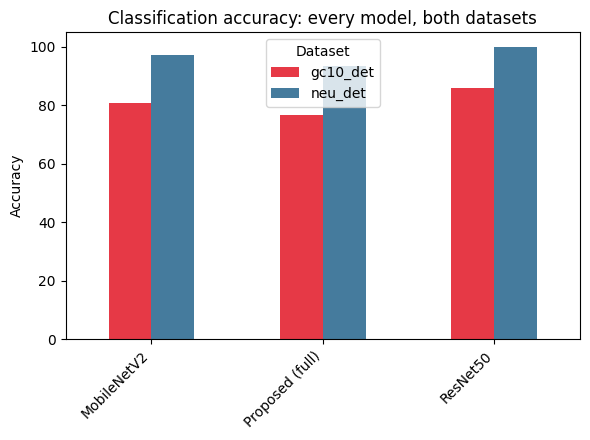

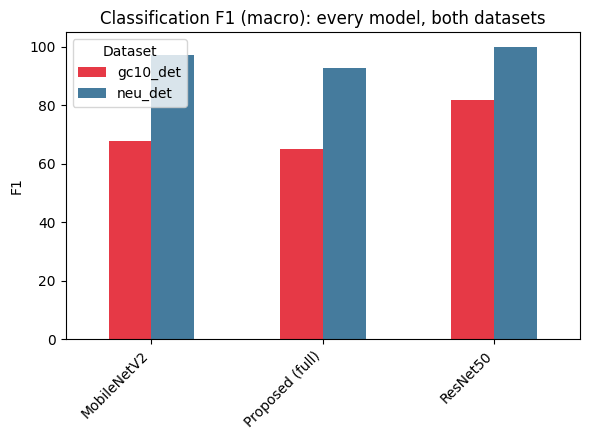

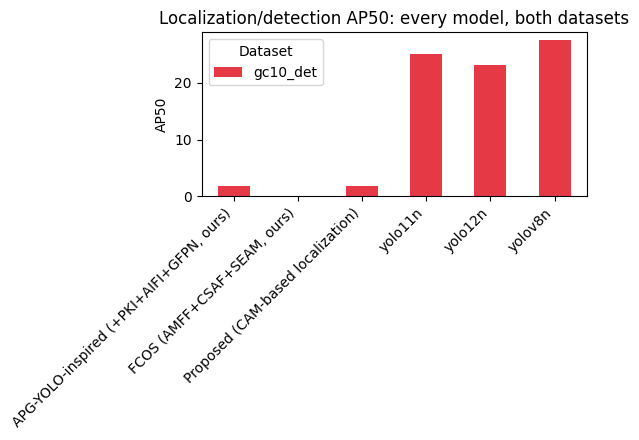


Cross-dataset tables/figures written under C:\Users\anmol\OneDrive\Desktop\MobileNetV2\paper_results_comparison


In [30]:
import matplotlib.pyplot as plt

COMPARISON_DIR = PROJECT_ROOT / "paper_results_comparison"
(COMPARISON_DIR / "tables").mkdir(parents=True, exist_ok=True)
(COMPARISON_DIR / "figures").mkdir(parents=True, exist_ok=True)

DATASET_RESULTS = {
    "neu_det": PROJECT_ROOT / "paper_results",
    "gc10_det": GC10_CFG.results_dir,
}


def _load_csv_tagged(results_dir, filename, dataset_name):
    path = results_dir / "tables" / filename
    if not path.exists():
        print(f"  ({dataset_name}: {filename} not found yet, skipping)")
        return None
    df = pd.read_csv(path)
    df.insert(0, "Dataset", dataset_name)
    return df


def _concat_tagged(filename):
    frames = [f for f in (_load_csv_tagged(d, filename, name)
                          for name, d in DATASET_RESULTS.items()) if f is not None]
    return pd.concat(frames, ignore_index=True) if frames else None


print("Cross-dataset comparison: every model, both datasets\n" + "=" * 70)

# ---- 1. classification comparison (Table A, both datasets) ----------------
print("\ntable_classification_comparison.csv:")
cls_cmp = _concat_tagged("table_classification_comparison.csv")
if cls_cmp is not None:
    cls_cmp.to_csv(COMPARISON_DIR / "tables" / "table_cross_dataset_classification.csv",
                   index=False)
    print(cls_cmp[["Dataset", "Model", "Accuracy", "F1"]].to_string(index=False))

# ---- 2. final comparison (every localization/detection model, both datasets)
print("\ntable_final_comparison.csv:")
final_cmp = _concat_tagged("table_final_comparison.csv")
if final_cmp is not None:
    final_cmp.to_csv(COMPARISON_DIR / "tables" / "table_cross_dataset_final_comparison.csv",
                     index=False)
    print(final_cmp[["Dataset", "Model", "AP50", "AP75", "mAP50_95"]].to_string(index=False))

# ---- 3. YOLO baselines (both datasets) -------------------------------------
print("\ntable_yolo_baselines.csv:")
yolo_cmp = _concat_tagged("table_yolo_baselines.csv")
if yolo_cmp is not None:
    yolo_cmp.to_csv(COMPARISON_DIR / "tables" / "table_cross_dataset_yolo_baselines.csv",
                    index=False)
    print(yolo_cmp.to_string(index=False))

# ---- 4. multi-seed ablation (both datasets, where run) ---------------------
print("\ntable_ablation_multiseed.csv:")
abl_ms_cmp = _concat_tagged("table_ablation_multiseed.csv")
if abl_ms_cmp is not None:
    abl_ms_cmp.to_csv(COMPARISON_DIR / "tables" / "table_cross_dataset_ablation_multiseed.csv",
                      index=False)
    print(f"  {len(abl_ms_cmp)} rows across "
          f"{sorted(abl_ms_cmp['Dataset'].unique())}")

# ---- 5. summary.json (classification mean+-sd, localization AP) -----------
summaries = {}
for name, d in DATASET_RESULTS.items():
    p = d / "tables" / "summary.json"
    if p.exists():
        with open(p) as fh:
            summaries[name] = json.load(fh)
    else:
        print(f"  ({name}: summary.json not found yet, skipping)")
with open(COMPARISON_DIR / "tables" / "summary_both_datasets.json", "w") as fh:
    json.dump(summaries, fh, indent=2, default=str)

# ---- figures ----------------------------------------------------------------
def _grouped_bar(df, value_col, title, fname):
    if df is None or df.empty:
        return
    pivot = df.pivot_table(index="Model", columns="Dataset", values=value_col, aggfunc="first")
    palette = {"neu_det": "#457B9D", "gc10_det": "#E63946"}
    colors = [palette.get(c, "#888888") for c in pivot.columns]
    ax = pivot.plot.bar(figsize=(max(6, 0.6 * len(pivot)), 4.5), color=colors)
    ax.set_title(title)
    ax.set_ylabel(value_col)
    ax.set_xlabel("")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.savefig(COMPARISON_DIR / "figures" / fname, dpi=150)
    plt.show()
    plt.close()


if cls_cmp is not None:
    _grouped_bar(cls_cmp, "Accuracy", "Classification accuracy: every model, both datasets",
                "cross_dataset_accuracy.png")
    _grouped_bar(cls_cmp, "F1", "Classification F1 (macro): every model, both datasets",
                "cross_dataset_f1.png")

if final_cmp is not None:
    _grouped_bar(final_cmp, "AP50", "Localization/detection AP50: every model, both datasets",
                "cross_dataset_ap50.png")

print(f"\nCross-dataset tables/figures written under {COMPARISON_DIR}")